## Germany Offwind Cut Scenario with 130 €/t CO2 price

In [139]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [140]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\20240405_20nodes\\elec_s_20_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_20_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [141]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [142]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 20 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 27 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 28 entries
Component 'Load' has 20 entries
Component 'Generator' has 261 entries
Component 'StorageUnit' has 65 entries


In [143]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.startswith('DE') & n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [144]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [145]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:07<00:00,  1.54it/s]
INFO:linopy.io: Writing time: 52.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5iizk5yy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5iizk5yy.lp


Reading time = 13.13 seconds


INFO:gurobipy:Reading time = 13.13 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0xa394a321


INFO:gurobipy:Model fingerprint: 0xa394a321


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


Presolve removed 2121745 rows and 372364 columns


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns


Presolve time: 7.88s


INFO:gurobipy:Presolve time: 7.88s


Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 11s


INFO:gurobipy:Elapsed ordering time = 11s


Ordering time: 19.78s


INFO:gurobipy:Ordering time: 19.78s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 181


INFO:gurobipy: Dense cols : 181


 AA' NZ     : 4.035e+06


INFO:gurobipy: AA' NZ     : 4.035e+06


 Factor NZ  : 2.945e+07 (roughly 1.2 GB of memory)


INFO:gurobipy: Factor NZ  : 2.945e+07 (roughly 1.2 GB of memory)


 Factor Ops : 6.371e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.371e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.31156336e+17 -8.63354726e+18  2.85e+10 9.06e+04  8.83e+13    33s


INFO:gurobipy:   0   6.31156336e+17 -8.63354726e+18  2.85e+10 9.06e+04  8.83e+13    33s


   1   5.51459054e+17 -3.71086128e+18  1.77e+10 3.08e+04  5.63e+13    36s


INFO:gurobipy:   1   5.51459054e+17 -3.71086128e+18  1.77e+10 3.08e+04  5.63e+13    36s


   2   4.54256323e+17 -1.89308316e+18  1.42e+10 1.23e+04  3.89e+13    39s


INFO:gurobipy:   2   4.54256323e+17 -1.89308316e+18  1.42e+10 1.23e+04  3.89e+13    39s


   3   3.41239879e+17 -1.40308614e+18  9.21e+09 7.75e+03  2.47e+13    43s


INFO:gurobipy:   3   3.41239879e+17 -1.40308614e+18  9.21e+09 7.75e+03  2.47e+13    43s


   4   2.82477587e+17 -7.49922845e+17  4.78e+09 2.94e+03  1.23e+13    46s


INFO:gurobipy:   4   2.82477587e+17 -7.49922845e+17  4.78e+09 2.94e+03  1.23e+13    46s


   5   2.25094476e+17 -2.32998690e+17  1.82e+09 7.51e+02  4.45e+12    48s


INFO:gurobipy:   5   2.25094476e+17 -2.32998690e+17  1.82e+09 7.51e+02  4.45e+12    48s


   6   1.18715122e+17 -5.26778804e+16  3.82e+08 1.24e+02  9.48e+11    51s


INFO:gurobipy:   6   1.18715122e+17 -5.26778804e+16  3.82e+08 1.24e+02  9.48e+11    51s


   7   1.97726741e+16 -9.09285974e+15  2.03e+06 4.91e+00  1.81e+10    55s


INFO:gurobipy:   7   1.97726741e+16 -9.09285974e+15  2.03e+06 4.91e+00  1.81e+10    55s


   8   8.02442450e+15 -2.66784072e+15  7.34e+05 1.09e+00  5.97e+09    58s


INFO:gurobipy:   8   8.02442450e+15 -2.66784072e+15  7.34e+05 1.09e+00  5.97e+09    58s


   9   6.17424950e+15 -1.60674505e+15  5.61e+05 5.73e-01  4.28e+09    60s


INFO:gurobipy:   9   6.17424950e+15 -1.60674505e+15  5.61e+05 5.73e-01  4.28e+09    60s


  10   4.08121691e+15 -1.05369084e+15  3.63e+05 3.28e-01  2.75e+09    63s


INFO:gurobipy:  10   4.08121691e+15 -1.05369084e+15  3.63e+05 3.28e-01  2.75e+09    63s


  11   2.92846677e+15 -6.63533675e+14  2.57e+05 1.70e-01  1.89e+09    65s


INFO:gurobipy:  11   2.92846677e+15 -6.63533675e+14  2.57e+05 1.70e-01  1.89e+09    65s


  12   1.85683263e+15 -3.71894249e+14  1.57e+05 6.62e-02  1.15e+09    68s


INFO:gurobipy:  12   1.85683263e+15 -3.71894249e+14  1.57e+05 6.62e-02  1.15e+09    68s


  13   1.45271756e+15 -1.23879138e+14  1.21e+05 7.99e-04  7.98e+08    71s


INFO:gurobipy:  13   1.45271756e+15 -1.23879138e+14  1.21e+05 7.99e-04  7.98e+08    71s


  14   4.85618594e+14 -7.26242213e+13  3.60e+04 8.32e-05  2.70e+08    75s


INFO:gurobipy:  14   4.85618594e+14 -7.26242213e+13  3.60e+04 8.32e-05  2.70e+08    75s


  15   2.33780109e+14 -2.82816348e+13  1.29e+04 7.22e-05  1.22e+08    78s


INFO:gurobipy:  15   2.33780109e+14 -2.82816348e+13  1.29e+04 7.22e-05  1.22e+08    78s


  16   8.28309115e+13 -1.13419677e+13  1.55e+03 2.28e-05  4.15e+07    80s


INFO:gurobipy:  16   8.28309115e+13 -1.13419677e+13  1.55e+03 2.28e-05  4.15e+07    80s


  17   1.94595269e+13 -5.38900141e+12  3.62e+02 1.12e-05  1.06e+07    83s


INFO:gurobipy:  17   1.94595269e+13 -5.38900141e+12  3.62e+02 1.12e-05  1.06e+07    83s


  18   1.44872411e+13 -5.20512236e+12  2.70e+02 1.08e-05  8.34e+06    86s


INFO:gurobipy:  18   1.44872411e+13 -5.20512236e+12  2.70e+02 1.08e-05  8.34e+06    86s


  19   9.63147483e+12 -4.72834653e+12  1.85e+02 9.10e-06  6.04e+06    89s


INFO:gurobipy:  19   9.63147483e+12 -4.72834653e+12  1.85e+02 9.10e-06  6.04e+06    89s


  20   8.91056784e+12 -4.22899737e+12  1.70e+02 7.89e-06  5.51e+06    92s


INFO:gurobipy:  20   8.91056784e+12 -4.22899737e+12  1.70e+02 7.89e-06  5.51e+06    92s


  21   7.29737875e+12 -4.00035126e+12  1.38e+02 7.53e-06  4.72e+06    95s


INFO:gurobipy:  21   7.29737875e+12 -4.00035126e+12  1.38e+02 7.53e-06  4.72e+06    95s


  22   5.01417929e+12 -3.50549188e+12  9.18e+01 6.64e-06  3.53e+06    97s


INFO:gurobipy:  22   5.01417929e+12 -3.50549188e+12  9.18e+01 6.64e-06  3.53e+06    97s


  23   2.66806107e+12 -2.76055559e+12  4.67e+01 5.29e-06  2.22e+06   101s


INFO:gurobipy:  23   2.66806107e+12 -2.76055559e+12  4.67e+01 5.29e-06  2.22e+06   101s


  24   1.51807599e+12 -2.04420271e+12  2.36e+01 4.04e-06  1.44e+06   106s


INFO:gurobipy:  24   1.51807599e+12 -2.04420271e+12  2.36e+01 4.04e-06  1.44e+06   106s


  25   9.72752341e+11 -1.54740103e+12  1.38e+01 3.11e-06  1.02e+06   110s


INFO:gurobipy:  25   9.72752341e+11 -1.54740103e+12  1.38e+01 3.11e-06  1.02e+06   110s


  26   6.44580735e+11 -1.19747539e+12  8.23e+00 2.46e-06  7.41e+05   114s


INFO:gurobipy:  26   6.44580735e+11 -1.19747539e+12  8.23e+00 2.46e-06  7.41e+05   114s


  27   6.04059650e+11 -1.15146118e+12  7.62e+00 2.35e-06  7.06e+05   117s


INFO:gurobipy:  27   6.04059650e+11 -1.15146118e+12  7.62e+00 2.35e-06  7.06e+05   117s


  28   4.69874304e+11 -8.54532297e+11  5.53e+00 1.78e-06  5.32e+05   119s


INFO:gurobipy:  28   4.69874304e+11 -8.54532297e+11  5.53e+00 1.78e-06  5.32e+05   119s


  29   4.27649228e+11 -5.29430083e+11  4.90e+00 1.21e-06  3.84e+05   122s


INFO:gurobipy:  29   4.27649228e+11 -5.29430083e+11  4.90e+00 1.21e-06  3.84e+05   122s


  30   2.21717174e+11 -2.90483028e+11  1.96e+00 6.76e-07  2.05e+05   126s


INFO:gurobipy:  30   2.21717174e+11 -2.90483028e+11  1.96e+00 6.76e-07  2.05e+05   126s


  31   1.75121251e+11 -8.27206647e+10  1.34e+00 2.53e-07  1.03e+05   131s


INFO:gurobipy:  31   1.75121251e+11 -8.27206647e+10  1.34e+00 2.53e-07  1.03e+05   131s


  32   1.45657417e+11 -1.44732401e+10  9.89e-01 1.18e-07  6.41e+04   134s


INFO:gurobipy:  32   1.45657417e+11 -1.44732401e+10  9.89e-01 1.18e-07  6.41e+04   134s


  33   1.22705149e+11  9.18137224e+09  7.36e-01 7.64e-08  4.54e+04   137s


INFO:gurobipy:  33   1.22705149e+11  9.18137224e+09  7.36e-01 7.64e-08  4.54e+04   137s


  34   1.19878881e+11  1.49567803e+10  7.04e-01 6.32e-08  4.20e+04   140s


INFO:gurobipy:  34   1.19878881e+11  1.49567803e+10  7.04e-01 6.32e-08  4.20e+04   140s


  35   1.11672271e+11  2.07022434e+10  6.14e-01 5.72e-08  3.64e+04   142s


INFO:gurobipy:  35   1.11672271e+11  2.07022434e+10  6.14e-01 5.72e-08  3.64e+04   142s


  36   1.00749552e+11  2.61237398e+10  5.02e-01 4.52e-08  2.98e+04   145s


INFO:gurobipy:  36   1.00749552e+11  2.61237398e+10  5.02e-01 4.52e-08  2.98e+04   145s


  37   8.86902675e+10  3.05096077e+10  3.78e-01 3.71e-08  2.33e+04   148s


INFO:gurobipy:  37   8.86902675e+10  3.05096077e+10  3.78e-01 3.71e-08  2.33e+04   148s


  38   8.28244448e+10  3.58641179e+10  3.15e-01 2.83e-08  1.88e+04   153s


INFO:gurobipy:  38   8.28244448e+10  3.58641179e+10  3.15e-01 2.83e-08  1.88e+04   153s


  39   7.78585346e+10  4.07797174e+10  2.63e-01 2.27e-08  1.48e+04   157s


INFO:gurobipy:  39   7.78585346e+10  4.07797174e+10  2.63e-01 2.27e-08  1.48e+04   157s


  40   7.40133393e+10  4.40635059e+10  2.22e-01 1.44e-08  1.20e+04   162s


INFO:gurobipy:  40   7.40133393e+10  4.40635059e+10  2.22e-01 1.44e-08  1.20e+04   162s


  41   6.80859701e+10  4.56927115e+10  1.60e-01 1.38e-08  8.95e+03   166s


INFO:gurobipy:  41   6.80859701e+10  4.56927115e+10  1.60e-01 1.38e-08  8.95e+03   166s


  42   6.50292788e+10  4.81269049e+10  1.27e-01 9.79e-09  6.76e+03   170s


INFO:gurobipy:  42   6.50292788e+10  4.81269049e+10  1.27e-01 9.79e-09  6.76e+03   170s


  43   6.22368262e+10  4.95836336e+10  9.73e-02 4.67e-09  5.06e+03   173s


INFO:gurobipy:  43   6.22368262e+10  4.95836336e+10  9.73e-02 4.67e-09  5.06e+03   173s


  44   6.06471560e+10  5.01863670e+10  8.04e-02 5.62e-09  4.18e+03   177s


INFO:gurobipy:  44   6.06471560e+10  5.01863670e+10  8.04e-02 5.62e-09  4.18e+03   177s


  45   5.96865938e+10  5.08849019e+10  6.99e-02 2.85e-09  3.52e+03   181s


INFO:gurobipy:  45   5.96865938e+10  5.08849019e+10  6.99e-02 2.85e-09  3.52e+03   181s


  46   5.84692153e+10  5.14238233e+10  5.60e-02 4.52e-09  2.82e+03   185s


INFO:gurobipy:  46   5.84692153e+10  5.14238233e+10  5.60e-02 4.52e-09  2.82e+03   185s


  47   5.76047185e+10  5.18806559e+10  4.62e-02 2.60e-09  2.29e+03   189s


INFO:gurobipy:  47   5.76047185e+10  5.18806559e+10  4.62e-02 2.60e-09  2.29e+03   189s


  48   5.68889169e+10  5.22305276e+10  3.84e-02 1.24e-09  1.86e+03   193s


INFO:gurobipy:  48   5.68889169e+10  5.22305276e+10  3.84e-02 1.24e-09  1.86e+03   193s


  49   5.61026969e+10  5.23703831e+10  2.99e-02 6.47e-09  1.49e+03   197s


INFO:gurobipy:  49   5.61026969e+10  5.23703831e+10  2.99e-02 6.47e-09  1.49e+03   197s


  50   5.56395174e+10  5.25060844e+10  2.45e-02 1.86e-08  1.25e+03   201s


INFO:gurobipy:  50   5.56395174e+10  5.25060844e+10  2.45e-02 1.86e-08  1.25e+03   201s


  51   5.55024331e+10  5.26626186e+10  2.29e-02 3.72e-08  1.14e+03   205s


INFO:gurobipy:  51   5.55024331e+10  5.26626186e+10  2.29e-02 3.72e-08  1.14e+03   205s


  52   5.53427795e+10  5.27310827e+10  2.11e-02 4.81e-08  1.04e+03   210s


INFO:gurobipy:  52   5.53427795e+10  5.27310827e+10  2.11e-02 4.81e-08  1.04e+03   210s


  53   5.52222754e+10  5.28072308e+10  1.97e-02 5.55e-08  9.66e+02   214s


INFO:gurobipy:  53   5.52222754e+10  5.28072308e+10  1.97e-02 5.55e-08  9.66e+02   214s


  54   5.50603303e+10  5.28482873e+10  1.76e-02 5.88e-08  8.84e+02   218s


INFO:gurobipy:  54   5.50603303e+10  5.28482873e+10  1.76e-02 5.88e-08  8.84e+02   218s


  55   5.48881437e+10  5.28981742e+10  1.56e-02 6.62e-08  7.96e+02   223s


INFO:gurobipy:  55   5.48881437e+10  5.28981742e+10  1.56e-02 6.62e-08  7.96e+02   223s


  56   5.47598567e+10  5.30311847e+10  1.41e-02 8.61e-08  6.91e+02   228s


INFO:gurobipy:  56   5.47598567e+10  5.30311847e+10  1.41e-02 8.61e-08  6.91e+02   228s


  57   5.45621676e+10  5.30783026e+10  1.17e-02 9.43e-08  5.93e+02   232s


INFO:gurobipy:  57   5.45621676e+10  5.30783026e+10  1.17e-02 9.43e-08  5.93e+02   232s


  58   5.44725689e+10  5.31688816e+10  1.07e-02 1.10e-07  5.21e+02   236s


INFO:gurobipy:  58   5.44725689e+10  5.31688816e+10  1.07e-02 1.10e-07  5.21e+02   236s


  59   5.43653090e+10  5.32241823e+10  9.44e-03 1.23e-07  4.56e+02   241s


INFO:gurobipy:  59   5.43653090e+10  5.32241823e+10  9.44e-03 1.23e-07  4.56e+02   241s


  60   5.42375529e+10  5.32753969e+10  8.01e-03 1.33e-07  3.85e+02   245s


INFO:gurobipy:  60   5.42375529e+10  5.32753969e+10  8.01e-03 1.33e-07  3.85e+02   245s


  61   5.41186363e+10  5.33095979e+10  6.65e-03 1.41e-07  3.23e+02   249s


INFO:gurobipy:  61   5.41186363e+10  5.33095979e+10  6.65e-03 1.41e-07  3.23e+02   249s


  62   5.40017515e+10  5.33351410e+10  5.29e-03 1.47e-07  2.67e+02   253s


INFO:gurobipy:  62   5.40017515e+10  5.33351410e+10  5.29e-03 1.47e-07  2.67e+02   253s


  63   5.39160452e+10  5.33723374e+10  4.32e-03 1.46e-07  2.17e+02   257s


INFO:gurobipy:  63   5.39160452e+10  5.33723374e+10  4.32e-03 1.46e-07  2.17e+02   257s


  64   5.38660592e+10  5.33951712e+10  3.75e-03 1.43e-07  1.88e+02   261s


INFO:gurobipy:  64   5.38660592e+10  5.33951712e+10  3.75e-03 1.43e-07  1.88e+02   261s


  65   5.38539441e+10  5.33985019e+10  3.61e-03 1.41e-07  1.82e+02   265s


INFO:gurobipy:  65   5.38539441e+10  5.33985019e+10  3.61e-03 1.41e-07  1.82e+02   265s


  66   5.37999974e+10  5.34193085e+10  3.01e-03 1.36e-07  1.52e+02   269s


INFO:gurobipy:  66   5.37999974e+10  5.34193085e+10  3.01e-03 1.36e-07  1.52e+02   269s


  67   5.37476629e+10  5.34351205e+10  2.40e-03 1.35e-07  1.25e+02   273s


INFO:gurobipy:  67   5.37476629e+10  5.34351205e+10  2.40e-03 1.35e-07  1.25e+02   273s


  68   5.37326072e+10  5.34479718e+10  2.22e-03 1.31e-07  1.14e+02   277s


INFO:gurobipy:  68   5.37326072e+10  5.34479718e+10  2.22e-03 1.31e-07  1.14e+02   277s


  69   5.37009453e+10  5.34579115e+10  1.87e-03 1.28e-07  9.72e+01   281s


INFO:gurobipy:  69   5.37009453e+10  5.34579115e+10  1.87e-03 1.28e-07  9.72e+01   281s


  70   5.36740290e+10  5.34700798e+10  1.56e-03 1.20e-07  8.15e+01   285s


INFO:gurobipy:  70   5.36740290e+10  5.34700798e+10  1.56e-03 1.20e-07  8.15e+01   285s


  71   5.36642944e+10  5.34766522e+10  1.45e-03 1.15e-07  7.50e+01   289s


INFO:gurobipy:  71   5.36642944e+10  5.34766522e+10  1.45e-03 1.15e-07  7.50e+01   289s


  72   5.36482964e+10  5.34812167e+10  1.27e-03 1.12e-07  6.68e+01   293s


INFO:gurobipy:  72   5.36482964e+10  5.34812167e+10  1.27e-03 1.12e-07  6.68e+01   293s


  73   5.36368639e+10  5.34860923e+10  1.14e-03 1.07e-07  6.03e+01   298s


INFO:gurobipy:  73   5.36368639e+10  5.34860923e+10  1.14e-03 1.07e-07  6.03e+01   298s


  74   5.36297664e+10  5.34925369e+10  1.06e-03 9.96e-08  5.49e+01   301s


INFO:gurobipy:  74   5.36297664e+10  5.34925369e+10  1.06e-03 9.96e-08  5.49e+01   301s


  75   5.36188560e+10  5.34983604e+10  9.39e-04 9.39e-08  4.82e+01   304s


INFO:gurobipy:  75   5.36188560e+10  5.34983604e+10  9.39e-04 9.39e-08  4.82e+01   304s


  76   5.36038553e+10  5.35031703e+10  7.72e-04 8.38e-08  4.03e+01   309s


INFO:gurobipy:  76   5.36038553e+10  5.35031703e+10  7.72e-04 8.38e-08  4.03e+01   309s


  77   5.35918054e+10  5.35104286e+10  6.33e-04 7.36e-08  3.25e+01   313s


INFO:gurobipy:  77   5.35918054e+10  5.35104286e+10  6.33e-04 7.36e-08  3.25e+01   313s


  78   5.35838064e+10  5.35175434e+10  5.44e-04 5.94e-08  2.65e+01   317s


INFO:gurobipy:  78   5.35838064e+10  5.35175434e+10  5.44e-04 5.94e-08  2.65e+01   317s


  79   5.35737340e+10  5.35201957e+10  4.36e-04 5.31e-08  2.14e+01   321s


INFO:gurobipy:  79   5.35737340e+10  5.35201957e+10  4.36e-04 5.31e-08  2.14e+01   321s


  80   5.35670726e+10  5.35233064e+10  3.63e-04 4.70e-08  1.75e+01   325s


INFO:gurobipy:  80   5.35670726e+10  5.35233064e+10  3.63e-04 4.70e-08  1.75e+01   325s


  81   5.35618108e+10  5.35246169e+10  3.04e-04 4.53e-08  1.49e+01   328s


INFO:gurobipy:  81   5.35618108e+10  5.35246169e+10  3.04e-04 4.53e-08  1.49e+01   328s


  82   5.35551353e+10  5.35265256e+10  2.32e-04 4.14e-08  1.14e+01   333s


INFO:gurobipy:  82   5.35551353e+10  5.35265256e+10  2.32e-04 4.14e-08  1.14e+01   333s


  83   5.35532131e+10  5.35276836e+10  2.19e-04 3.83e-08  1.02e+01   337s


INFO:gurobipy:  83   5.35532131e+10  5.35276836e+10  2.19e-04 3.83e-08  1.02e+01   337s


  84   5.35506033e+10  5.35285779e+10  1.88e-04 3.70e-08  8.81e+00   341s


INFO:gurobipy:  84   5.35506033e+10  5.35285779e+10  1.88e-04 3.70e-08  8.81e+00   341s


  85   5.35473265e+10  5.35292984e+10  1.62e-04 3.53e-08  7.21e+00   345s


INFO:gurobipy:  85   5.35473265e+10  5.35292984e+10  1.62e-04 3.53e-08  7.21e+00   345s


  86   5.35449689e+10  5.35303226e+10  1.49e-04 3.07e-08  5.86e+00   349s


INFO:gurobipy:  86   5.35449689e+10  5.35303226e+10  1.49e-04 3.07e-08  5.86e+00   349s


  87   5.35422103e+10  5.35313740e+10  1.79e-04 2.45e-08  4.33e+00   353s


INFO:gurobipy:  87   5.35422103e+10  5.35313740e+10  1.79e-04 2.45e-08  4.33e+00   353s


  88   5.35401644e+10  5.35319272e+10  1.51e-04 2.23e-08  3.29e+00   357s


INFO:gurobipy:  88   5.35401644e+10  5.35319272e+10  1.51e-04 2.23e-08  3.29e+00   357s


  89   5.35389932e+10  5.35322970e+10  7.71e-05 1.93e-08  2.68e+00   361s


INFO:gurobipy:  89   5.35389932e+10  5.35322970e+10  7.71e-05 1.93e-08  2.68e+00   361s


  90   5.35375589e+10  5.35326334e+10  1.23e-04 1.80e-08  1.97e+00   365s


INFO:gurobipy:  90   5.35375589e+10  5.35326334e+10  1.23e-04 1.80e-08  1.97e+00   365s


  91   5.35367249e+10  5.35328571e+10  8.21e-05 1.58e-08  1.55e+00   370s


INFO:gurobipy:  91   5.35367249e+10  5.35328571e+10  8.21e-05 1.58e-08  1.55e+00   370s


  92   5.35355201e+10  5.35330509e+10  5.01e-05 1.25e-08  9.87e-01   375s


INFO:gurobipy:  92   5.35355201e+10  5.35330509e+10  5.01e-05 1.25e-08  9.87e-01   375s


  93   5.35353984e+10  5.35331305e+10  4.66e-05 1.11e-08  9.07e-01   380s


INFO:gurobipy:  93   5.35353984e+10  5.35331305e+10  4.66e-05 1.11e-08  9.07e-01   380s


  94   5.35352255e+10  5.35331770e+10  4.26e-05 1.04e-08  8.19e-01   384s


INFO:gurobipy:  94   5.35352255e+10  5.35331770e+10  4.26e-05 1.04e-08  8.19e-01   384s


  95   5.35349813e+10  5.35332821e+10  3.55e-05 8.52e-09  6.79e-01   389s


INFO:gurobipy:  95   5.35349813e+10  5.35332821e+10  3.55e-05 8.52e-09  6.79e-01   389s


  96   5.35345262e+10  5.35333865e+10  2.56e-05 7.45e-09  4.56e-01   395s


INFO:gurobipy:  96   5.35345262e+10  5.35333865e+10  2.56e-05 7.45e-09  4.56e-01   395s


  97   5.35342783e+10  5.35335217e+10  1.82e-05 4.62e-09  3.03e-01   399s


INFO:gurobipy:  97   5.35342783e+10  5.35335217e+10  1.82e-05 4.62e-09  3.03e-01   399s


  98   5.35341517e+10  5.35336244e+10  2.11e-05 3.87e-09  2.11e-01   404s


INFO:gurobipy:  98   5.35341517e+10  5.35336244e+10  2.11e-05 3.87e-09  2.11e-01   404s


  99   5.35340210e+10  5.35336728e+10  1.38e-05 2.83e-09  1.39e-01   410s


INFO:gurobipy:  99   5.35340210e+10  5.35336728e+10  1.38e-05 2.83e-09  1.39e-01   410s


 100   5.35339785e+10  5.35336797e+10  1.17e-05 2.83e-09  1.19e-01   415s


INFO:gurobipy: 100   5.35339785e+10  5.35336797e+10  1.17e-05 2.83e-09  1.19e-01   415s


 101   5.35339125e+10  5.35336916e+10  8.49e-06 2.65e-09  8.83e-02   418s


INFO:gurobipy: 101   5.35339125e+10  5.35336916e+10  8.49e-06 2.65e-09  8.83e-02   418s


 102   5.35339071e+10  5.35337057e+10  8.23e-06 2.35e-09  8.05e-02   422s


INFO:gurobipy: 102   5.35339071e+10  5.35337057e+10  8.23e-06 2.35e-09  8.05e-02   422s


 103   5.35338561e+10  5.35337196e+10  5.69e-06 1.95e-09  5.46e-02   426s


INFO:gurobipy: 103   5.35338561e+10  5.35337196e+10  5.69e-06 1.95e-09  5.46e-02   426s


 104   5.35338141e+10  5.35337234e+10  3.69e-06 1.77e-09  3.62e-02   430s


INFO:gurobipy: 104   5.35338141e+10  5.35337234e+10  3.69e-06 1.77e-09  3.62e-02   430s


 105   5.35337850e+10  5.35337279e+10  2.20e-06 1.46e-09  2.28e-02   435s


INFO:gurobipy: 105   5.35337850e+10  5.35337279e+10  2.20e-06 1.46e-09  2.28e-02   435s


 106   5.35337836e+10  5.35337292e+10  2.13e-06 1.75e-09  2.18e-02   439s


INFO:gurobipy: 106   5.35337836e+10  5.35337292e+10  2.13e-06 1.75e-09  2.18e-02   439s


 107   5.35337677e+10  5.35337318e+10  1.33e-06 1.59e-09  1.43e-02   442s


INFO:gurobipy: 107   5.35337677e+10  5.35337318e+10  1.33e-06 1.59e-09  1.43e-02   442s


 108   5.35337639e+10  5.35337333e+10  1.11e-06 1.33e-09  1.22e-02   445s


INFO:gurobipy: 108   5.35337639e+10  5.35337333e+10  1.11e-06 1.33e-09  1.22e-02   445s


 109   5.35337592e+10  5.35337344e+10  8.80e-07 1.27e-09  9.91e-03   449s


INFO:gurobipy: 109   5.35337592e+10  5.35337344e+10  8.80e-07 1.27e-09  9.91e-03   449s


 110   5.35337542e+10  5.35337353e+10  8.58e-07 9.91e-10  7.55e-03   455s


INFO:gurobipy: 110   5.35337542e+10  5.35337353e+10  8.58e-07 9.91e-10  7.55e-03   455s


 111   5.35337512e+10  5.35337361e+10  5.66e-07 1.49e-09  6.01e-03   458s


INFO:gurobipy: 111   5.35337512e+10  5.35337361e+10  5.66e-07 1.49e-09  6.01e-03   458s


 112   5.35337500e+10  5.35337380e+10  5.52e-07 1.67e-09  4.81e-03   463s


INFO:gurobipy: 112   5.35337500e+10  5.35337380e+10  5.52e-07 1.67e-09  4.81e-03   463s


 113   5.35337445e+10  5.35337392e+10  9.27e-07 1.08e-09  2.10e-03   468s


INFO:gurobipy: 113   5.35337445e+10  5.35337392e+10  9.27e-07 1.08e-09  2.10e-03   468s


 114   5.35337422e+10  5.35337397e+10  1.76e-04 1.18e-09  9.71e-04   471s


INFO:gurobipy: 114   5.35337422e+10  5.35337397e+10  1.76e-04 1.18e-09  9.71e-04   471s


 115   5.35337407e+10  5.35337400e+10  3.48e-05 3.43e-09  2.74e-04   475s


INFO:gurobipy: 115   5.35337407e+10  5.35337400e+10  3.48e-05 3.43e-09  2.74e-04   475s


 116   5.35337403e+10  5.35337401e+10  3.48e-05 1.79e-09  7.70e-05   479s


INFO:gurobipy: 116   5.35337403e+10  5.35337401e+10  3.48e-05 1.79e-09  7.70e-05   479s


 117   5.35337402e+10  5.35337401e+10  6.63e-06 1.94e-09  1.42e-05   482s


INFO:gurobipy: 117   5.35337402e+10  5.35337401e+10  6.63e-06 1.94e-09  1.42e-05   482s


 118   5.35337401e+10  5.35337401e+10  4.51e-06 2.89e-09  2.44e-06   486s


INFO:gurobipy: 118   5.35337401e+10  5.35337401e+10  4.51e-06 2.89e-09  2.44e-06   486s


 119   5.35337401e+10  5.35337401e+10  1.89e-06 5.05e-09  2.13e-07   490s


INFO:gurobipy: 119   5.35337401e+10  5.35337401e+10  1.89e-06 5.05e-09  2.13e-07   490s


 120   5.35337401e+10  5.35337401e+10  4.40e-07 9.46e-09  7.63e-09   493s


INFO:gurobipy: 120   5.35337401e+10  5.35337401e+10  4.40e-07 9.46e-09  7.63e-09   493s


INFO:gurobipy:


Barrier solved model in 120 iterations and 493.16 seconds (120.16 work units)


INFO:gurobipy:Barrier solved model in 120 iterations and 493.16 seconds (120.16 work units)


Optimal objective 5.35337401e+10


INFO:gurobipy:Optimal objective 5.35337401e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  458076 variables added to crossover basis                      498s


INFO:gurobipy:  458076 variables added to crossover basis                      498s


  560590 variables added to crossover basis                      500s


INFO:gurobipy:  560590 variables added to crossover basis                      500s


  564063 variables added to crossover basis                      505s


INFO:gurobipy:  564063 variables added to crossover basis                      505s


  566924 variables added to crossover basis                      510s


INFO:gurobipy:  566924 variables added to crossover basis                      510s


  568865 variables added to crossover basis                      515s


INFO:gurobipy:  568865 variables added to crossover basis                      515s


  570746 variables added to crossover basis                      520s


INFO:gurobipy:  570746 variables added to crossover basis                      520s


  572465 variables added to crossover basis                      525s


INFO:gurobipy:  572465 variables added to crossover basis                      525s


  573881 variables added to crossover basis                      530s


INFO:gurobipy:  573881 variables added to crossover basis                      530s


  575190 variables added to crossover basis                      535s


INFO:gurobipy:  575190 variables added to crossover basis                      535s


  576386 variables added to crossover basis                      540s


INFO:gurobipy:  576386 variables added to crossover basis                      540s


  577457 variables added to crossover basis                      545s


INFO:gurobipy:  577457 variables added to crossover basis                      545s


  578523 variables added to crossover basis                      550s


INFO:gurobipy:  578523 variables added to crossover basis                      550s


  579531 variables added to crossover basis                      555s


INFO:gurobipy:  579531 variables added to crossover basis                      555s


  580449 variables added to crossover basis                      560s


INFO:gurobipy:  580449 variables added to crossover basis                      560s


  581432 variables added to crossover basis                      565s


INFO:gurobipy:  581432 variables added to crossover basis                      565s


  582380 variables added to crossover basis                      570s


INFO:gurobipy:  582380 variables added to crossover basis                      570s


INFO:gurobipy:


  560378 DPushes remaining with DInf 0.0000000e+00               573s


INFO:gurobipy:  560378 DPushes remaining with DInf 0.0000000e+00               573s


   94035 DPushes remaining with DInf 0.0000000e+00               728s


INFO:gurobipy:   94035 DPushes remaining with DInf 0.0000000e+00               728s


   12525 DPushes remaining with DInf 0.0000000e+00               758s


INFO:gurobipy:   12525 DPushes remaining with DInf 0.0000000e+00               758s


    1515 DPushes remaining with DInf 0.0000000e+00               777s


INFO:gurobipy:    1515 DPushes remaining with DInf 0.0000000e+00               777s


     270 DPushes remaining with DInf 0.0000000e+00               792s


INFO:gurobipy:     270 DPushes remaining with DInf 0.0000000e+00               792s


       0 DPushes remaining with DInf 0.0000000e+00               798s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               798s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   21214 PPushes remaining with PInf 7.9605497e-06               798s


INFO:gurobipy:   21214 PPushes remaining with PInf 7.9605497e-06               798s


    4034 PPushes remaining with PInf 2.2582820e-05               814s


INFO:gurobipy:    4034 PPushes remaining with PInf 2.2582820e-05               814s


    3596 PPushes remaining with PInf 2.2609651e-05               822s


INFO:gurobipy:    3596 PPushes remaining with PInf 2.2609651e-05               822s


       0 PPushes remaining with PInf 0.0000000e+00               826s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               826s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.7996516e-06    826s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.7996516e-06    826s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  330269    5.3533740e+10   0.000000e+00   3.783728e-06    827s


INFO:gurobipy:  330269    5.3533740e+10   0.000000e+00   3.783728e-06    827s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  330272    5.3533740e+10   0.000000e+00   6.362884e-06    832s


INFO:gurobipy:  330272    5.3533740e+10   0.000000e+00   6.362884e-06    832s


Extra simplex iterations after uncrush: 4


INFO:gurobipy:Extra simplex iterations after uncrush: 4


  330276    5.3533740e+10   0.000000e+00   0.000000e+00    834s


INFO:gurobipy:  330276    5.3533740e+10   0.000000e+00   0.000000e+00    834s


INFO:gurobipy:


Solved in 330276 iterations and 834.46 seconds (325.80 work units)


INFO:gurobipy:Solved in 330276 iterations and 834.46 seconds (325.80 work units)


Optimal objective  5.353374014e+10


INFO:gurobipy:Optimal objective  5.353374014e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 5.35e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [146]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [147]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


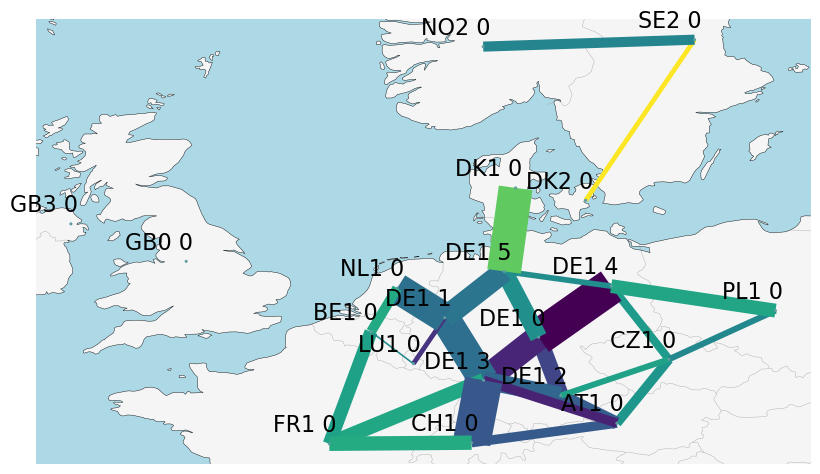

In [148]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [149]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


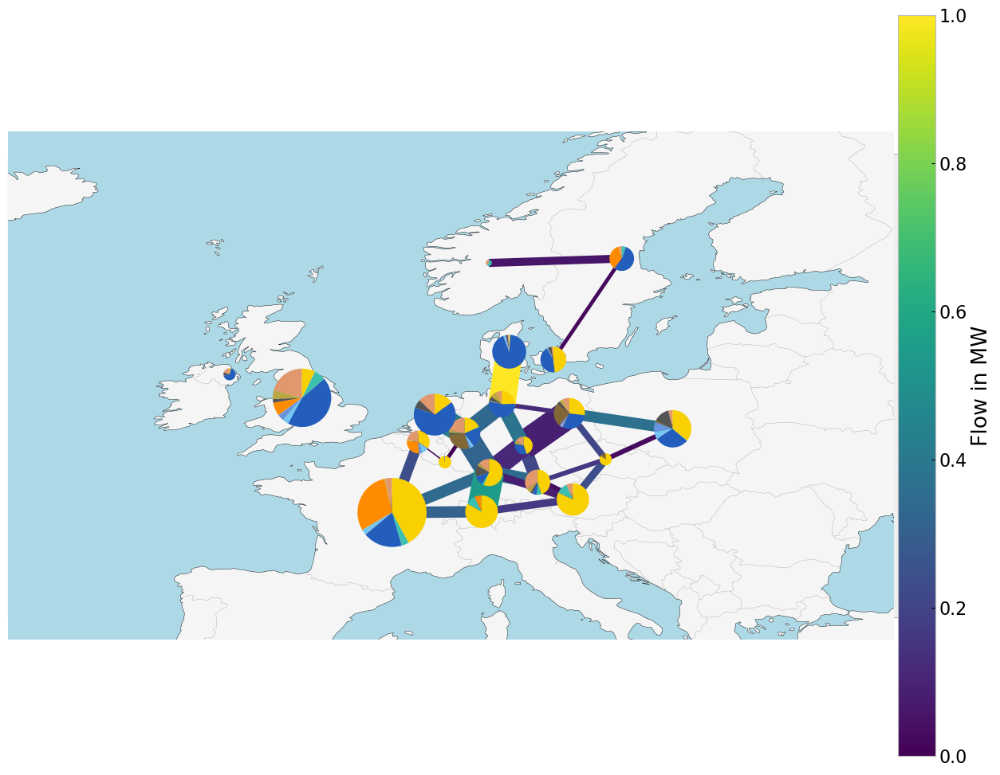

In [150]:
fig, ax = plt.subplots(
    figsize=(15,15),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [151]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


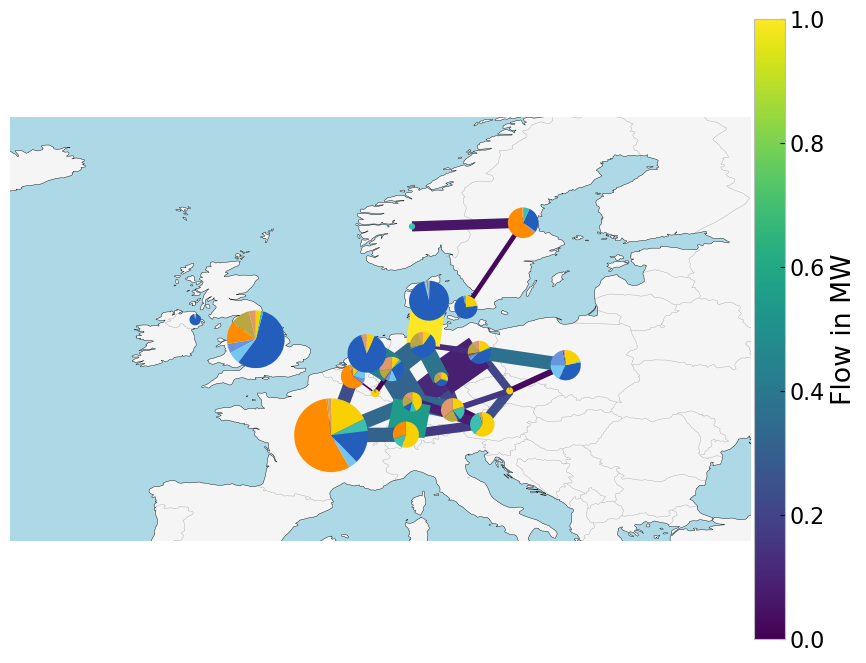

In [152]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

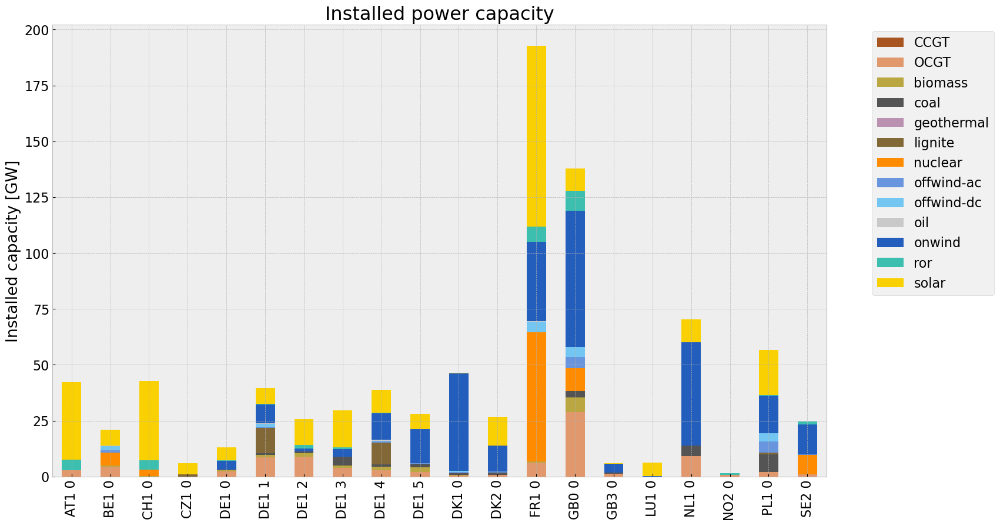

In [154]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

<Figure size 640x480 with 0 Axes>

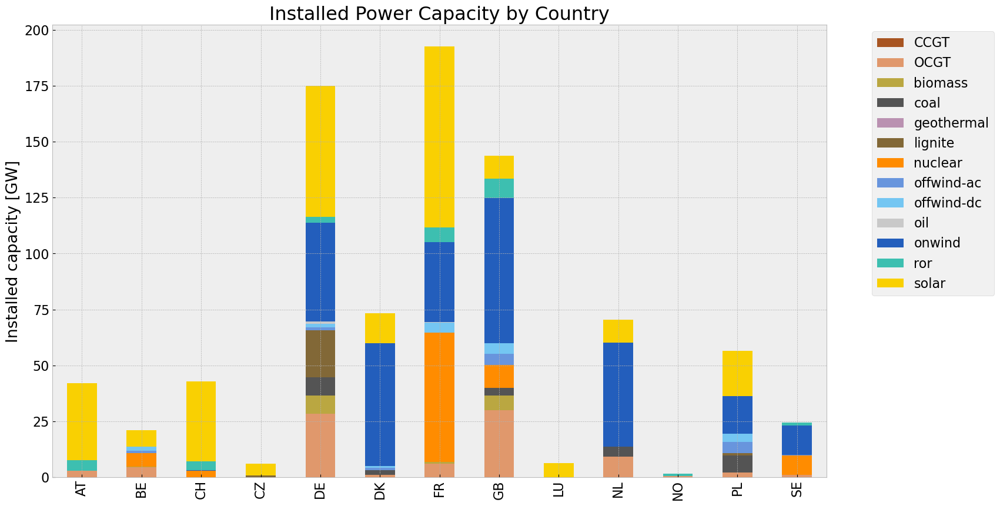

In [155]:
#aggregate installed capacities by country
def inst_cap_table_country(n,colors):

    capacities = n.generators
    capacities['country'] = capacities['bus'].str[:2]
    capacities = capacities.groupby(['country', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed Power Capacity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

cap_base_country= inst_cap_table_country(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

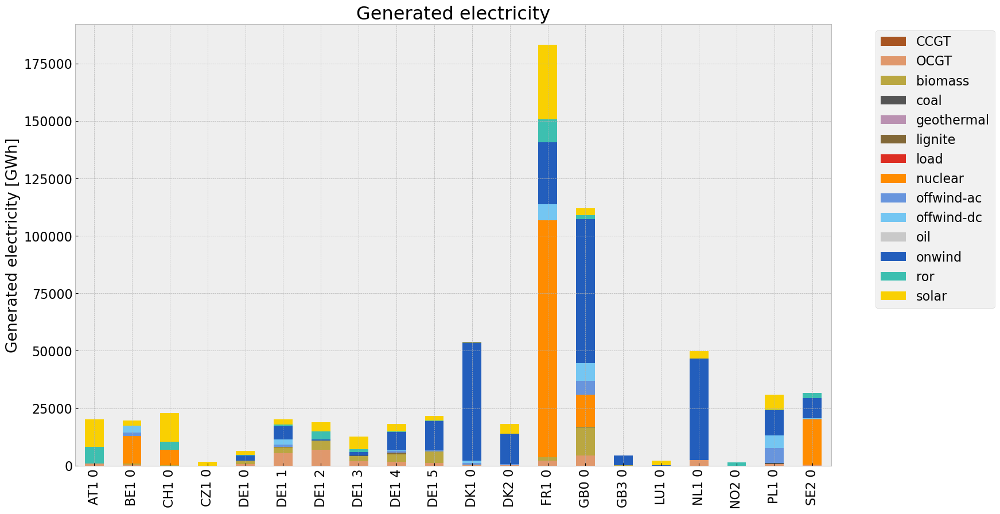

In [156]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

<Figure size 640x480 with 0 Axes>

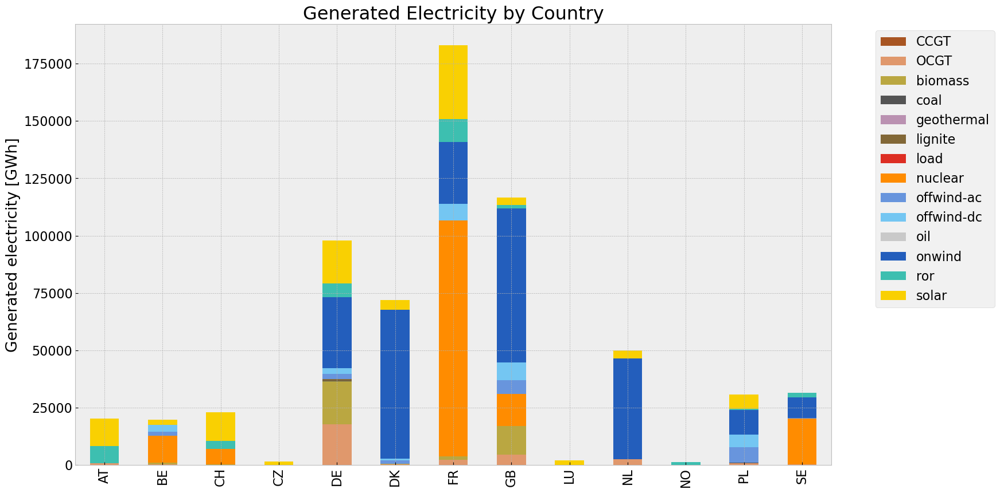

In [157]:
def gen_power_table_country(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    #generations = n.generators
    #generations['country'] = generations['bus'].str[:2]
    #generations = pd.Series(index = n.generators.groupby(['country', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    generations['country'] = generations.index.str[:2]
    generations = generations.groupby(['country']).sum()   
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated Electricity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base_country = gen_power_table_country(n,colors_gen_table)

## Snapshot

In [158]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()

#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\318663498.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\318663498.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [159]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\4040974225.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [160]:
def gen_curve(n, start, end, colors,ctr):

    plt.rcParams.update({'font.size': 16})

    #import export 
    lines_ctr_bus0 = n.lines[n.lines['bus0'].str.startswith(ctr) & ~n.lines['bus1'].str.startswith(ctr)].index
    lines_ctr_bus1 = n.lines[n.lines['bus1'].str.startswith(ctr) & ~n.lines['bus0'].str.startswith(ctr)].index
    links_ctr_bus0 = n.links[n.links['bus0'].str.startswith(ctr) & ~n.links['bus1'].str.startswith(ctr)].index
    links_ctr_bus1 = n.links[n.links['bus1'].str.startswith(ctr) & ~n.links['bus0'].str.startswith(ctr)].index


    df_lines_ctr_bus0 = n.lines_t.p0[lines_ctr_bus0]
    df_lines_ctr_bus1 = n.lines_t.p1[lines_ctr_bus1]
    df_links_ctr_bus0 = n.links_t.p0[links_ctr_bus0]
    df_links_ctr_bus1 = n.links_t.p1[links_ctr_bus1]


    import_export = pd.concat([df_lines_ctr_bus0, df_lines_ctr_bus1, df_links_ctr_bus0, df_links_ctr_bus1], axis=1).sum(axis=1)*-1 #MW

    columns_gen = [col for col in  n.generators_t.p.columns if col.startswith(ctr)]
    p_country = n.generators_t.p[columns_gen]

    p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
    

    #add import color
    colors.append('#133337') #for Import

    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        col_sto = [col for col in  n.storage_units_t.p.columns if col.startswith(ctr)]
        sto_ctr = n.storage_units_t.p[col_sto]
        sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier['Import'] = import_export 
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    col_load = [col for col in  n.loads_t.p_set.columns if col.startswith(ctr)]
    loads_ctr = n.loads_t.p_set[col_load]
    loads = loads_ctr.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [161]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [162]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [163]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [164]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

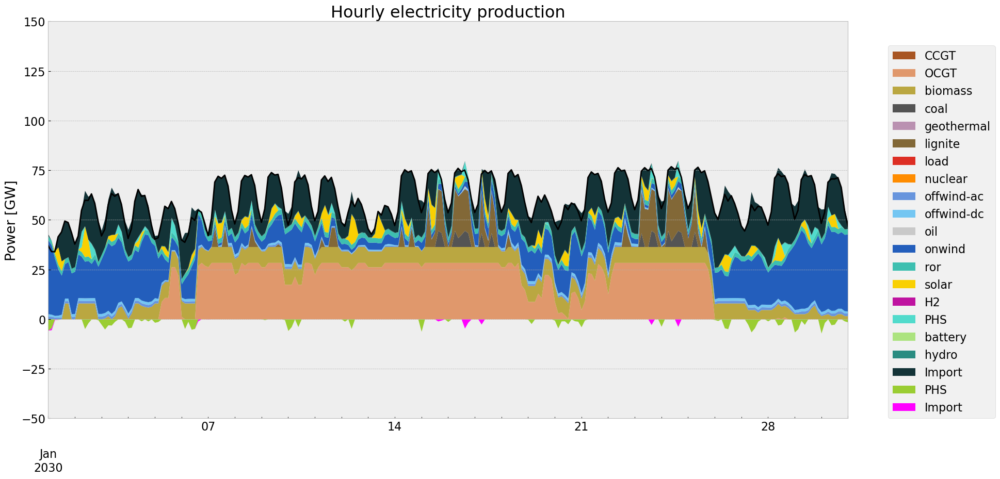

In [165]:
# winter
gen_curve(n, '2030-01-01', '2030-01-31', colors_gen,'DE')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

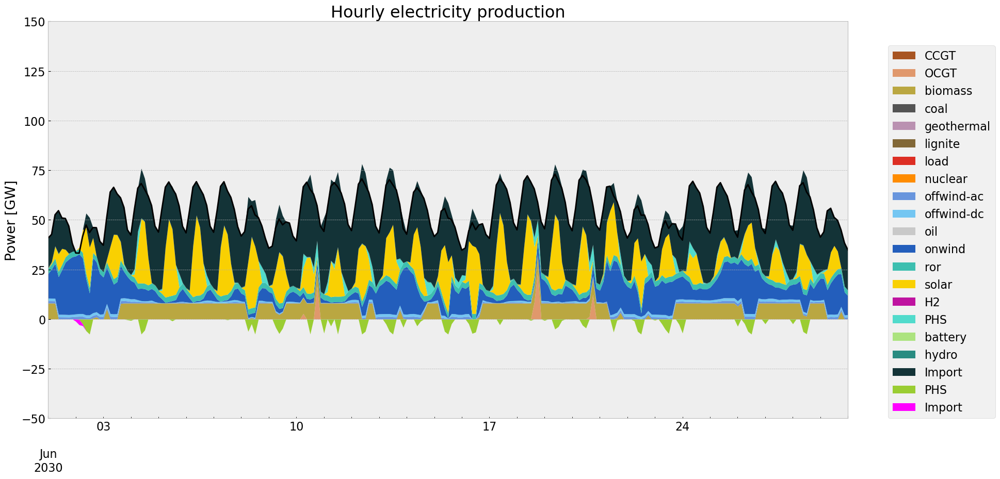

In [166]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen,'DE')

## Storage

In [167]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})
    storage = n.storage_units
    storage['country'] = storage['bus'].str[:2]

    (storage.groupby(['country','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacities of storage systems By Country",
                                #ylim=[0,20]
    )

    return storage.groupby(['country','carrier']).p_nom_opt.sum().unstack()/1000

carrier,H2,PHS,battery,hydro
country,,,,
AT,0.0,5.05730,0.0,3.600620
BE,0.0,1.30800,0.0,0.012783
CH,0.0,5.08955,0.0,9.724410
CZ,0.0,NaN,0.0,NaN
DE,0.0,7.59922,0.0,0.289500
DK,0.0,NaN,0.0,NaN
FR,0.0,4.97630,0.0,8.329493
GB,0.0,0.44000,0.0,0.228300
LU,0.0,2.58500,0.0,NaN


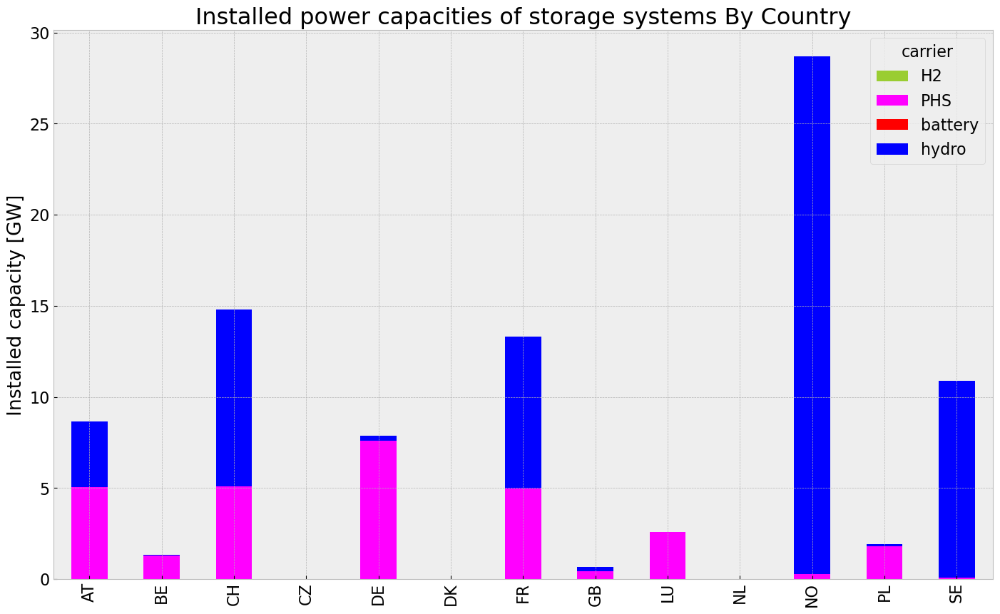

In [168]:
inst_store_table(n)

In [169]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        title=f"State of charge of aggregated storage systems",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


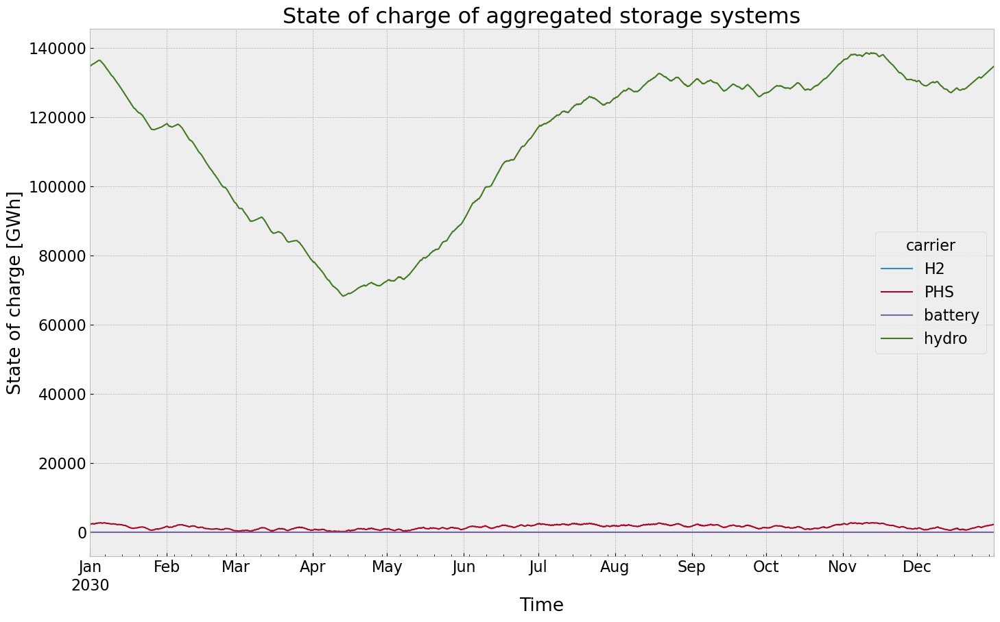

In [170]:
state_of_charge_plot(n)

## Electricity Price

In [171]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [172]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


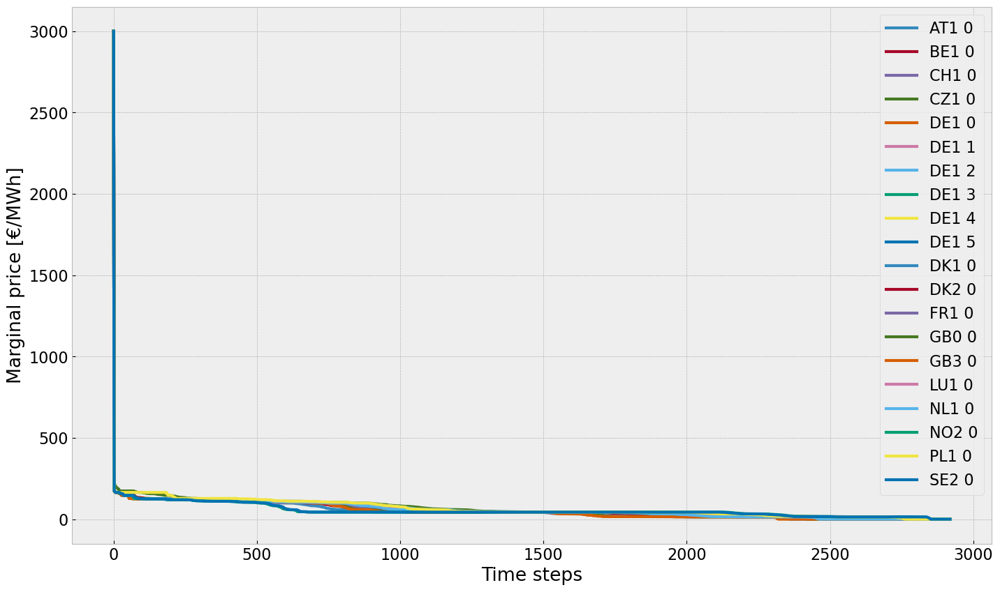

In [173]:
price_dur_curve_plot(n)

In [174]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

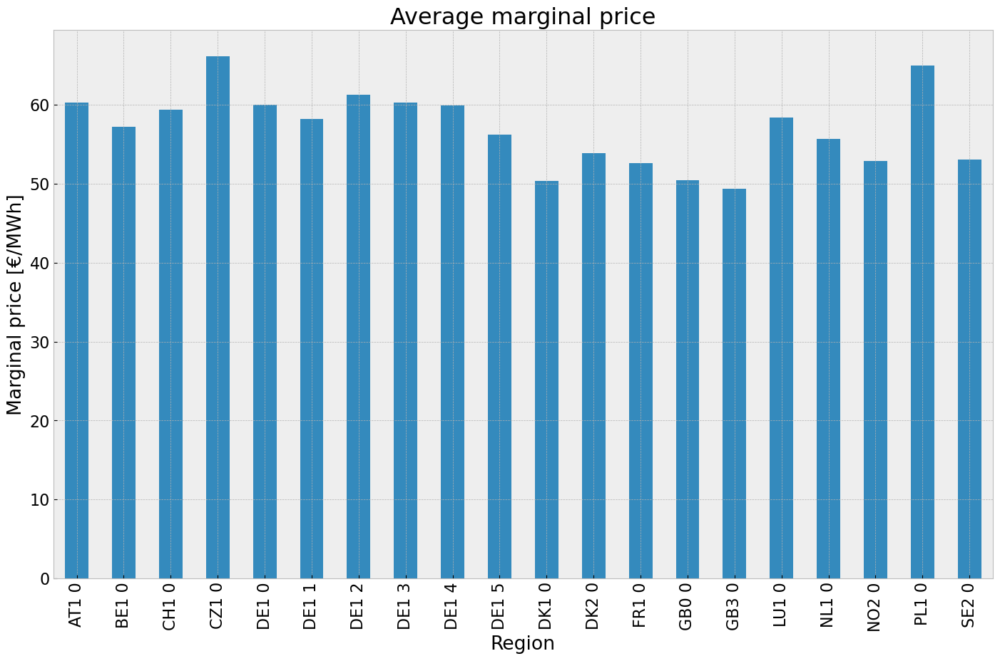

In [175]:
price_regions_table(n)

In [176]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


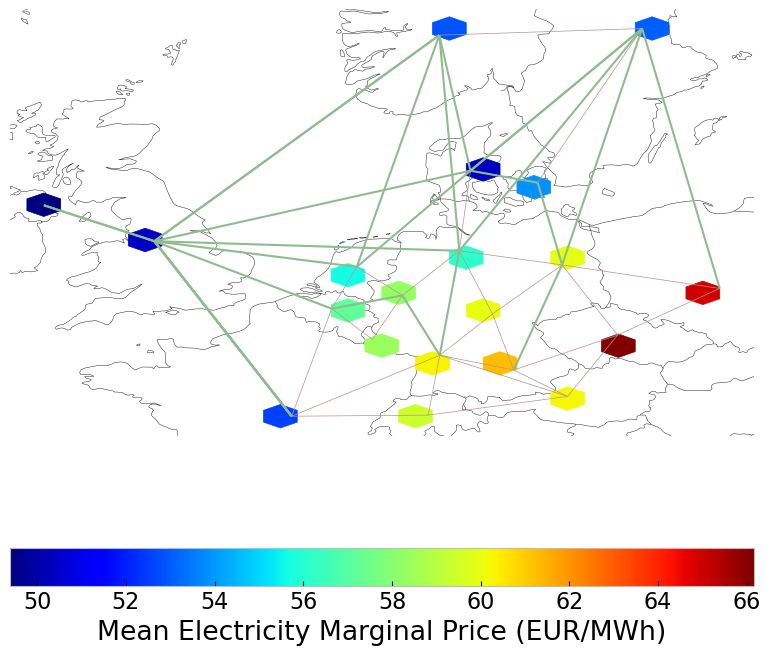

In [177]:
price_regions(n)

## Emission

In [178]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.950103e+07,0.451621,0.1980,1.293387e+07
biomass,3.377481e+07,0.468000,0.0000,0.000000e+00
coal,7.117319e+05,0.329908,0.3361,7.250902e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,9.211707e+05,0.337285,0.4069,1.111300e+06
load,3.775349e+03,1.000000,0.0000,0.000000e+00
nuclear,1.554148e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.794435e+07,1.000000,0.0000,0.000000e+00


# Offwind Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [179]:
#copy network
n1=n.copy()

#p_max_pu of offwind generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-06 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [180]:
n1.optimize.create_model()


Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [181]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:07<00:00,  1.68it/s]
INFO:linopy.io: Writing time: 48.89s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i1dk8vjp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i1dk8vjp.lp


Reading time = 12.62 seconds


INFO:gurobipy:Reading time = 12.62 seconds


obj: 3264863 rows, 1521502 columns, 6175255 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6175255 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6175255 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6175255 nonzeros


Model fingerprint: 0xf4e51a78


INFO:gurobipy:Model fingerprint: 0xf4e51a78


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2196927 rows and 433072 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2196927 rows and 433072 columns (presolve time = 5s) ...


Presolve removed 2196927 rows and 433072 columns


INFO:gurobipy:Presolve removed 2196927 rows and 433072 columns


Presolve time: 7.14s


INFO:gurobipy:Presolve time: 7.14s


Presolved: 1067936 rows, 1088430 columns, 3583342 nonzeros


INFO:gurobipy:Presolved: 1067936 rows, 1088430 columns, 3583342 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 15.52s


INFO:gurobipy:Ordering time: 15.52s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 172


INFO:gurobipy: Dense cols : 172


 AA' NZ     : 3.876e+06


INFO:gurobipy: AA' NZ     : 3.876e+06


 Factor NZ  : 2.816e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 2.816e+07 (roughly 1.0 GB of memory)


 Factor Ops : 5.758e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 5.758e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.12194502e+17 -8.85611486e+18  2.73e+10 9.35e+04  9.15e+13    27s


INFO:gurobipy:   0   6.12194502e+17 -8.85611486e+18  2.73e+10 9.35e+04  9.15e+13    27s


   1   5.35970314e+17 -3.90743971e+18  1.73e+10 3.13e+04  5.84e+13    30s


INFO:gurobipy:   1   5.35970314e+17 -3.90743971e+18  1.73e+10 3.13e+04  5.84e+13    30s


   2   4.44979358e+17 -2.00074826e+18  1.39e+10 1.21e+04  4.04e+13    32s


INFO:gurobipy:   2   4.44979358e+17 -2.00074826e+18  1.39e+10 1.21e+04  4.04e+13    32s


   3   3.20680986e+17 -1.40082679e+18  7.59e+09 7.11e+03  2.25e+13    35s


INFO:gurobipy:   3   3.20680986e+17 -1.40082679e+18  7.59e+09 7.11e+03  2.25e+13    35s


   4   2.61351637e+17 -5.13011980e+17  3.05e+09 1.36e+03  8.40e+12    39s


INFO:gurobipy:   4   2.61351637e+17 -5.13011980e+17  3.05e+09 1.36e+03  8.40e+12    39s


   5   1.73999568e+17 -1.17608004e+17  6.63e+08 2.54e+02  1.90e+12    42s


INFO:gurobipy:   5   1.73999568e+17 -1.17608004e+17  6.63e+08 2.54e+02  1.90e+12    42s


   6   4.68879251e+16 -1.94101397e+16  2.13e+07 2.17e+01  9.38e+10    45s


INFO:gurobipy:   6   4.68879251e+16 -1.94101397e+16  2.13e+07 2.17e+01  9.38e+10    45s


   7   1.04921327e+16 -6.22109754e+15  1.84e+06 5.49e+00  1.33e+10    47s


INFO:gurobipy:   7   1.04921327e+16 -6.22109754e+15  1.84e+06 5.49e+00  1.33e+10    47s


   8   7.14978388e+15 -3.15860987e+15  1.18e+06 2.40e+00  7.70e+09    49s


INFO:gurobipy:   8   7.14978388e+15 -3.15860987e+15  1.18e+06 2.40e+00  7.70e+09    49s


   9   4.17944120e+15 -1.11545515e+15  6.52e+05 5.10e-01  3.76e+09    51s


INFO:gurobipy:   9   4.17944120e+15 -1.11545515e+15  6.52e+05 5.10e-01  3.76e+09    51s


  10   2.57870268e+15 -6.62750852e+14  3.85e+05 2.08e-01  2.22e+09    53s


INFO:gurobipy:  10   2.57870268e+15 -6.62750852e+14  3.85e+05 2.08e-01  2.22e+09    53s


  11   1.97594500e+15 -4.11747804e+14  2.88e+05 8.57e-02  1.60e+09    56s


INFO:gurobipy:  11   1.97594500e+15 -4.11747804e+14  2.88e+05 8.57e-02  1.60e+09    56s


  12   1.10845767e+15 -1.74756257e+14  1.61e+05 3.81e-06  8.29e+08    58s


INFO:gurobipy:  12   1.10845767e+15 -1.74756257e+14  1.61e+05 3.81e-06  8.29e+08    58s


  13   7.39217244e+14 -9.53376057e+13  1.04e+05 2.77e-05  5.16e+08    62s


INFO:gurobipy:  13   7.39217244e+14 -9.53376057e+13  1.04e+05 2.77e-05  5.16e+08    62s


  14   3.82646901e+14 -5.73024911e+13  4.93e+04 5.17e-05  2.55e+08    64s


INFO:gurobipy:  14   3.82646901e+14 -5.73024911e+13  4.93e+04 5.17e-05  2.55e+08    64s


  15   2.23072550e+14 -3.37664981e+13  2.57e+04 4.53e-06  1.39e+08    67s


INFO:gurobipy:  15   2.23072550e+14 -3.37664981e+13  2.57e+04 4.53e-06  1.39e+08    67s


  16   7.61115979e+13 -1.65477232e+13  5.15e+03 5.08e-06  4.71e+07    69s


INFO:gurobipy:  16   7.61115979e+13 -1.65477232e+13  5.15e+03 5.08e-06  4.71e+07    69s


  17   2.30113963e+13 -9.06730193e+12  6.22e+02 1.16e-06  1.54e+07    72s


INFO:gurobipy:  17   2.30113963e+13 -9.06730193e+12  6.22e+02 1.16e-06  1.54e+07    72s


  18   1.92984726e+13 -8.37631164e+12  5.21e+02 9.33e-07  1.32e+07    73s


INFO:gurobipy:  18   1.92984726e+13 -8.37631164e+12  5.21e+02 9.33e-07  1.32e+07    73s


  19   9.43905391e+12 -6.73809655e+12  2.40e+02 8.72e-07  7.50e+06    76s


INFO:gurobipy:  19   9.43905391e+12 -6.73809655e+12  2.40e+02 8.72e-07  7.50e+06    76s


  20   7.89884489e+12 -6.18970692e+12  1.99e+02 8.48e-07  6.49e+06    79s


INFO:gurobipy:  20   7.89884489e+12 -6.18970692e+12  1.99e+02 8.48e-07  6.49e+06    79s


  21   4.14958674e+12 -5.03930216e+12  1.00e+02 7.23e-07  4.15e+06    82s


INFO:gurobipy:  21   4.14958674e+12 -5.03930216e+12  1.00e+02 7.23e-07  4.15e+06    82s


  22   2.92862835e+12 -3.52721161e+12  6.96e+01 4.30e-07  2.89e+06    85s


INFO:gurobipy:  22   2.92862835e+12 -3.52721161e+12  6.96e+01 4.30e-07  2.89e+06    85s


  23   1.51158762e+12 -2.44052043e+12  2.96e+01 2.90e-07  1.74e+06    89s


INFO:gurobipy:  23   1.51158762e+12 -2.44052043e+12  2.96e+01 2.90e-07  1.74e+06    89s


  24   1.02574504e+12 -1.70564572e+12  1.83e+01 1.96e-07  1.20e+06    92s


INFO:gurobipy:  24   1.02574504e+12 -1.70564572e+12  1.83e+01 1.96e-07  1.20e+06    92s


  25   8.41661312e+11 -1.34106126e+12  1.45e+01 1.60e-07  9.54e+05    95s


INFO:gurobipy:  25   8.41661312e+11 -1.34106126e+12  1.45e+01 1.60e-07  9.54e+05    95s


  26   6.45996558e+11 -8.36254787e+11  1.06e+01 9.71e-08  6.46e+05    98s


INFO:gurobipy:  26   6.45996558e+11 -8.36254787e+11  1.06e+01 9.71e-08  6.46e+05    98s


  27   5.80582620e+11 -6.35862702e+11  9.27e+00 7.18e-08  5.29e+05   100s


INFO:gurobipy:  27   5.80582620e+11 -6.35862702e+11  9.27e+00 7.18e-08  5.29e+05   100s


  28   4.37838024e+11 -3.24321738e+11  6.55e+00 3.47e-08  3.31e+05   102s


INFO:gurobipy:  28   4.37838024e+11 -3.24321738e+11  6.55e+00 3.47e-08  3.31e+05   102s


  29   3.06758474e+11 -1.76303838e+11  4.12e+00 2.24e-08  2.10e+05   106s


INFO:gurobipy:  29   3.06758474e+11 -1.76303838e+11  4.12e+00 2.24e-08  2.10e+05   106s


  30   2.21283544e+11 -2.53016880e+10  2.60e+00 6.18e-09  1.07e+05   110s


INFO:gurobipy:  30   2.21283544e+11 -2.53016880e+10  2.60e+00 6.18e-09  1.07e+05   110s


  31   1.60177580e+11  1.26370973e+10  1.59e+00 2.65e-09  6.39e+04   112s


INFO:gurobipy:  31   1.60177580e+11  1.26370973e+10  1.59e+00 2.65e-09  6.39e+04   112s


  32   1.34114447e+11  2.62561730e+10  1.19e+00 2.35e-09  4.67e+04   115s


INFO:gurobipy:  32   1.34114447e+11  2.62561730e+10  1.19e+00 2.35e-09  4.67e+04   115s


  33   1.24712014e+11  3.31252633e+10  1.04e+00 2.52e-09  3.97e+04   117s


INFO:gurobipy:  33   1.24712014e+11  3.31252633e+10  1.04e+00 2.52e-09  3.97e+04   117s


  34   1.17277061e+11  3.68581806e+10  9.25e-01 1.34e-09  3.48e+04   119s


INFO:gurobipy:  34   1.17277061e+11  3.68581806e+10  9.25e-01 1.34e-09  3.48e+04   119s


  35   1.10142433e+11  3.88119670e+10  8.13e-01 1.93e-09  3.09e+04   121s


INFO:gurobipy:  35   1.10142433e+11  3.88119670e+10  8.13e-01 1.93e-09  3.09e+04   121s


  36   1.02813532e+11  4.43234583e+10  7.03e-01 8.84e-10  2.53e+04   125s


INFO:gurobipy:  36   1.02813532e+11  4.43234583e+10  7.03e-01 8.84e-10  2.53e+04   125s


  37   9.31003867e+10  4.72309025e+10  5.52e-01 1.03e-09  1.99e+04   128s


INFO:gurobipy:  37   9.31003867e+10  4.72309025e+10  5.52e-01 1.03e-09  1.99e+04   128s


  38   8.45012121e+10  5.01584861e+10  4.20e-01 9.75e-10  1.49e+04   131s


INFO:gurobipy:  38   8.45012121e+10  5.01584861e+10  4.20e-01 9.75e-10  1.49e+04   131s


  39   7.97708192e+10  5.20280301e+10  3.45e-01 6.91e-10  1.20e+04   134s


INFO:gurobipy:  39   7.97708192e+10  5.20280301e+10  3.45e-01 6.91e-10  1.20e+04   134s


  40   7.41261237e+10  5.37036783e+10  2.59e-01 1.02e-09  8.84e+03   137s


INFO:gurobipy:  40   7.41261237e+10  5.37036783e+10  2.59e-01 1.02e-09  8.84e+03   137s


  41   7.12880588e+10  5.51043765e+10  2.13e-01 1.26e-09  7.01e+03   140s


INFO:gurobipy:  41   7.12880588e+10  5.51043765e+10  2.13e-01 1.26e-09  7.01e+03   140s


  42   6.82438382e+10  5.59787107e+10  1.65e-01 7.13e-10  5.31e+03   143s


INFO:gurobipy:  42   6.82438382e+10  5.59787107e+10  1.65e-01 7.13e-10  5.31e+03   143s


  43   6.58812095e+10  5.65409630e+10  1.24e-01 1.26e-09  4.04e+03   147s


INFO:gurobipy:  43   6.58812095e+10  5.65409630e+10  1.24e-01 1.26e-09  4.04e+03   147s


  44   6.41246355e+10  5.70863012e+10  9.30e-02 1.15e-09  3.05e+03   150s


INFO:gurobipy:  44   6.41246355e+10  5.70863012e+10  9.30e-02 1.15e-09  3.05e+03   150s


  45   6.26844293e+10  5.74383279e+10  6.94e-02 8.77e-10  2.27e+03   153s


INFO:gurobipy:  45   6.26844293e+10  5.74383279e+10  6.94e-02 8.77e-10  2.27e+03   153s


  46   6.19254211e+10  5.77046641e+10  5.56e-02 1.06e-09  1.83e+03   157s


INFO:gurobipy:  46   6.19254211e+10  5.77046641e+10  5.56e-02 1.06e-09  1.83e+03   157s


  47   6.14037204e+10  5.78721731e+10  4.64e-02 2.61e-08  1.53e+03   160s


INFO:gurobipy:  47   6.14037204e+10  5.78721731e+10  4.64e-02 2.61e-08  1.53e+03   160s


  48   6.08691542e+10  5.80056053e+10  3.65e-02 5.68e-08  1.24e+03   164s


INFO:gurobipy:  48   6.08691542e+10  5.80056053e+10  3.65e-02 5.68e-08  1.24e+03   164s


  49   6.05576155e+10  5.81102776e+10  3.08e-02 8.18e-08  1.06e+03   168s


INFO:gurobipy:  49   6.05576155e+10  5.81102776e+10  3.08e-02 8.18e-08  1.06e+03   168s


  50   6.02709763e+10  5.82525515e+10  2.55e-02 1.18e-07  8.74e+02   171s


INFO:gurobipy:  50   6.02709763e+10  5.82525515e+10  2.55e-02 1.18e-07  8.74e+02   171s


  51   6.00271845e+10  5.83529042e+10  2.11e-02 1.48e-07  7.25e+02   175s


INFO:gurobipy:  51   6.00271845e+10  5.83529042e+10  2.11e-02 1.48e-07  7.25e+02   175s


  52   5.98963801e+10  5.84042152e+10  1.87e-02 1.63e-07  6.46e+02   179s


INFO:gurobipy:  52   5.98963801e+10  5.84042152e+10  1.87e-02 1.63e-07  6.46e+02   179s


  53   5.97712674e+10  5.84773233e+10  1.65e-02 1.84e-07  5.60e+02   182s


INFO:gurobipy:  53   5.97712674e+10  5.84773233e+10  1.65e-02 1.84e-07  5.60e+02   182s


  54   5.97367963e+10  5.84960293e+10  1.59e-02 1.88e-07  5.37e+02   185s


INFO:gurobipy:  54   5.97367963e+10  5.84960293e+10  1.59e-02 1.88e-07  5.37e+02   185s


  55   5.96791802e+10  5.85154100e+10  1.49e-02 1.93e-07  5.04e+02   188s


INFO:gurobipy:  55   5.96791802e+10  5.85154100e+10  1.49e-02 1.93e-07  5.04e+02   188s


  56   5.96176088e+10  5.85464479e+10  1.38e-02 1.98e-07  4.64e+02   192s


INFO:gurobipy:  56   5.96176088e+10  5.85464479e+10  1.38e-02 1.98e-07  4.64e+02   192s


  57   5.95963296e+10  5.85681236e+10  1.34e-02 2.00e-07  4.45e+02   195s


INFO:gurobipy:  57   5.95963296e+10  5.85681236e+10  1.34e-02 2.00e-07  4.45e+02   195s


  58   5.95490711e+10  5.85947338e+10  1.25e-02 2.02e-07  4.13e+02   198s


INFO:gurobipy:  58   5.95490711e+10  5.85947338e+10  1.25e-02 2.02e-07  4.13e+02   198s


  59   5.95078066e+10  5.86195170e+10  1.16e-02 2.02e-07  3.85e+02   203s


INFO:gurobipy:  59   5.95078066e+10  5.86195170e+10  1.16e-02 2.02e-07  3.85e+02   203s


  60   5.94863724e+10  5.86534081e+10  1.11e-02 2.06e-07  3.61e+02   206s


INFO:gurobipy:  60   5.94863724e+10  5.86534081e+10  1.11e-02 2.06e-07  3.61e+02   206s


  61   5.94113792e+10  5.86906811e+10  9.43e-03 2.03e-07  3.12e+02   210s


INFO:gurobipy:  61   5.94113792e+10  5.86906811e+10  9.43e-03 2.03e-07  3.12e+02   210s


  62   5.93907422e+10  5.87178989e+10  9.06e-03 2.09e-07  2.91e+02   214s


INFO:gurobipy:  62   5.93907422e+10  5.87178989e+10  9.06e-03 2.09e-07  2.91e+02   214s


  63   5.93406320e+10  5.87294248e+10  8.15e-03 2.09e-07  2.65e+02   218s


INFO:gurobipy:  63   5.93406320e+10  5.87294248e+10  8.15e-03 2.09e-07  2.65e+02   218s


  64   5.92969519e+10  5.87398959e+10  7.34e-03 2.08e-07  2.41e+02   222s


INFO:gurobipy:  64   5.92969519e+10  5.87398959e+10  7.34e-03 2.08e-07  2.41e+02   222s


  65   5.92524759e+10  5.87565865e+10  6.52e-03 2.06e-07  2.15e+02   226s


INFO:gurobipy:  65   5.92524759e+10  5.87565865e+10  6.52e-03 2.06e-07  2.15e+02   226s


  66   5.92314085e+10  5.87720838e+10  6.13e-03 2.01e-07  1.99e+02   231s


INFO:gurobipy:  66   5.92314085e+10  5.87720838e+10  6.13e-03 2.01e-07  1.99e+02   231s


  67   5.91848410e+10  5.87778292e+10  5.25e-03 1.99e-07  1.76e+02   234s


INFO:gurobipy:  67   5.91848410e+10  5.87778292e+10  5.25e-03 1.99e-07  1.76e+02   234s


  68   5.91703780e+10  5.87874796e+10  4.98e-03 1.93e-07  1.66e+02   238s


INFO:gurobipy:  68   5.91703780e+10  5.87874796e+10  4.98e-03 1.93e-07  1.66e+02   238s


  69   5.91301097e+10  5.87959422e+10  4.22e-03 1.88e-07  1.45e+02   241s


INFO:gurobipy:  69   5.91301097e+10  5.87959422e+10  4.22e-03 1.88e-07  1.45e+02   241s


  70   5.91174205e+10  5.88100332e+10  3.98e-03 1.79e-07  1.33e+02   245s


INFO:gurobipy:  70   5.91174205e+10  5.88100332e+10  3.98e-03 1.79e-07  1.33e+02   245s


  71   5.90966309e+10  5.88151504e+10  3.60e-03 1.76e-07  1.22e+02   248s


INFO:gurobipy:  71   5.90966309e+10  5.88151504e+10  3.60e-03 1.76e-07  1.22e+02   248s


  72   5.90801379e+10  5.88234018e+10  3.29e-03 1.69e-07  1.11e+02   252s


INFO:gurobipy:  72   5.90801379e+10  5.88234018e+10  3.29e-03 1.69e-07  1.11e+02   252s


  73   5.90554533e+10  5.88287219e+10  2.83e-03 1.63e-07  9.81e+01   255s


INFO:gurobipy:  73   5.90554533e+10  5.88287219e+10  2.83e-03 1.63e-07  9.81e+01   255s


  74   5.90411694e+10  5.88386381e+10  2.56e-03 1.53e-07  8.77e+01   259s


INFO:gurobipy:  74   5.90411694e+10  5.88386381e+10  2.56e-03 1.53e-07  8.77e+01   259s


  75   5.90215230e+10  5.88415948e+10  2.20e-03 1.50e-07  7.79e+01   262s


INFO:gurobipy:  75   5.90215230e+10  5.88415948e+10  2.20e-03 1.50e-07  7.79e+01   262s


  76   5.90140488e+10  5.88492904e+10  2.06e-03 1.41e-07  7.13e+01   265s


INFO:gurobipy:  76   5.90140488e+10  5.88492904e+10  2.06e-03 1.41e-07  7.13e+01   265s


  77   5.90051018e+10  5.88566803e+10  1.89e-03 1.34e-07  6.42e+01   269s


INFO:gurobipy:  77   5.90051018e+10  5.88566803e+10  1.89e-03 1.34e-07  6.42e+01   269s


  78   5.89887729e+10  5.88602342e+10  1.59e-03 1.30e-07  5.56e+01   272s


INFO:gurobipy:  78   5.89887729e+10  5.88602342e+10  1.59e-03 1.30e-07  5.56e+01   272s


  79   5.89826476e+10  5.88666850e+10  1.47e-03 1.22e-07  5.02e+01   276s


INFO:gurobipy:  79   5.89826476e+10  5.88666850e+10  1.47e-03 1.22e-07  5.02e+01   276s


  80   5.89762033e+10  5.88725084e+10  1.36e-03 1.15e-07  4.49e+01   279s


INFO:gurobipy:  80   5.89762033e+10  5.88725084e+10  1.36e-03 1.15e-07  4.49e+01   279s


  81   5.89666367e+10  5.88746673e+10  1.18e-03 1.11e-07  3.98e+01   283s


INFO:gurobipy:  81   5.89666367e+10  5.88746673e+10  1.18e-03 1.11e-07  3.98e+01   283s


  82   5.89654277e+10  5.88762767e+10  1.16e-03 1.09e-07  3.86e+01   286s


INFO:gurobipy:  82   5.89654277e+10  5.88762767e+10  1.16e-03 1.09e-07  3.86e+01   286s


  83   5.89575970e+10  5.88805583e+10  1.02e-03 9.98e-08  3.33e+01   289s


INFO:gurobipy:  83   5.89575970e+10  5.88805583e+10  1.02e-03 9.98e-08  3.33e+01   289s


  84   5.89525276e+10  5.88827503e+10  9.23e-04 9.58e-08  3.02e+01   293s


INFO:gurobipy:  84   5.89525276e+10  5.88827503e+10  9.23e-04 9.58e-08  3.02e+01   293s


  85   5.89435617e+10  5.88838678e+10  7.65e-04 9.33e-08  2.58e+01   296s


INFO:gurobipy:  85   5.89435617e+10  5.88838678e+10  7.65e-04 9.33e-08  2.58e+01   296s


  86   5.89401146e+10  5.88861186e+10  7.03e-04 8.69e-08  2.34e+01   299s


INFO:gurobipy:  86   5.89401146e+10  5.88861186e+10  7.03e-04 8.69e-08  2.34e+01   299s


  87   5.89352983e+10  5.88882026e+10  6.15e-04 8.00e-08  2.04e+01   303s


INFO:gurobipy:  87   5.89352983e+10  5.88882026e+10  6.15e-04 8.00e-08  2.04e+01   303s


  88   5.89315974e+10  5.88897477e+10  5.48e-04 7.28e-08  1.81e+01   307s


INFO:gurobipy:  88   5.89315974e+10  5.88897477e+10  5.48e-04 7.28e-08  1.81e+01   307s


  89   5.89266654e+10  5.88905225e+10  4.58e-04 6.94e-08  1.56e+01   310s


INFO:gurobipy:  89   5.89266654e+10  5.88905225e+10  4.58e-04 6.94e-08  1.56e+01   310s


  90   5.89237626e+10  5.88915694e+10  4.05e-04 6.53e-08  1.39e+01   314s


INFO:gurobipy:  90   5.89237626e+10  5.88915694e+10  4.05e-04 6.53e-08  1.39e+01   314s


  91   5.89208672e+10  5.88928219e+10  3.53e-04 5.99e-08  1.21e+01   318s


INFO:gurobipy:  91   5.89208672e+10  5.88928219e+10  3.53e-04 5.99e-08  1.21e+01   318s


  92   5.89185036e+10  5.88943547e+10  3.10e-04 5.22e-08  1.05e+01   321s


INFO:gurobipy:  92   5.89185036e+10  5.88943547e+10  3.10e-04 5.22e-08  1.05e+01   321s


  93   5.89157504e+10  5.88952602e+10  2.76e-04 4.75e-08  8.87e+00   325s


INFO:gurobipy:  93   5.89157504e+10  5.88952602e+10  2.76e-04 4.75e-08  8.87e+00   325s


  94   5.89138737e+10  5.88965459e+10  2.50e-04 3.98e-08  7.50e+00   329s


INFO:gurobipy:  94   5.89138737e+10  5.88965459e+10  2.50e-04 3.98e-08  7.50e+00   329s


  95   5.89120987e+10  5.88972398e+10  2.45e-04 3.84e-08  6.43e+00   332s


INFO:gurobipy:  95   5.89120987e+10  5.88972398e+10  2.45e-04 3.84e-08  6.43e+00   332s


  96   5.89109580e+10  5.88975521e+10  2.08e-04 3.89e-08  5.80e+00   335s


INFO:gurobipy:  96   5.89109580e+10  5.88975521e+10  2.08e-04 3.89e-08  5.80e+00   335s


  97   5.89098234e+10  5.88977139e+10  1.82e-04 3.90e-08  5.24e+00   339s


INFO:gurobipy:  97   5.89098234e+10  5.88977139e+10  1.82e-04 3.90e-08  5.24e+00   339s


  98   5.89081881e+10  5.88983265e+10  1.54e-04 3.91e-08  4.27e+00   342s


INFO:gurobipy:  98   5.89081881e+10  5.88983265e+10  1.54e-04 3.91e-08  4.27e+00   342s


  99   5.89071030e+10  5.88990010e+10  1.46e-04 3.98e-08  3.51e+00   347s


INFO:gurobipy:  99   5.89071030e+10  5.88990010e+10  1.46e-04 3.98e-08  3.51e+00   347s


 100   5.89059590e+10  5.88991880e+10  1.20e-04 4.03e-08  2.93e+00   350s


INFO:gurobipy: 100   5.89059590e+10  5.88991880e+10  1.20e-04 4.03e-08  2.93e+00   350s


 101   5.89051245e+10  5.88996842e+10  1.18e-04 4.07e-08  2.35e+00   353s


INFO:gurobipy: 101   5.89051245e+10  5.88996842e+10  1.18e-04 4.07e-08  2.35e+00   353s


 102   5.89042941e+10  5.88999646e+10  9.80e-05 4.23e-08  1.87e+00   357s


INFO:gurobipy: 102   5.89042941e+10  5.88999646e+10  9.80e-05 4.23e-08  1.87e+00   357s


 103   5.89035911e+10  5.89001076e+10  8.57e-05 4.21e-08  1.51e+00   360s


INFO:gurobipy: 103   5.89035911e+10  5.89001076e+10  8.57e-05 4.21e-08  1.51e+00   360s


 104   5.89032410e+10  5.89002851e+10  6.30e-05 4.10e-08  1.28e+00   364s


INFO:gurobipy: 104   5.89032410e+10  5.89002851e+10  6.30e-05 4.10e-08  1.28e+00   364s


 105   5.89026077e+10  5.89003913e+10  5.23e-05 4.05e-08  9.59e-01   367s


INFO:gurobipy: 105   5.89026077e+10  5.89003913e+10  5.23e-05 4.05e-08  9.59e-01   367s


 106   5.89022151e+10  5.89005875e+10  5.49e-05 3.78e-08  7.04e-01   371s


INFO:gurobipy: 106   5.89022151e+10  5.89005875e+10  5.49e-05 3.78e-08  7.04e-01   371s


 107   5.89019184e+10  5.89006779e+10  7.25e-05 3.04e-08  5.37e-01   377s


INFO:gurobipy: 107   5.89019184e+10  5.89006779e+10  7.25e-05 3.04e-08  5.37e-01   377s


 108   5.89016715e+10  5.89007711e+10  4.16e-05 2.33e-08  3.90e-01   381s


INFO:gurobipy: 108   5.89016715e+10  5.89007711e+10  4.16e-05 2.33e-08  3.90e-01   381s


 109   5.89015097e+10  5.89008147e+10  3.20e-05 1.97e-08  3.01e-01   386s


INFO:gurobipy: 109   5.89015097e+10  5.89008147e+10  3.20e-05 1.97e-08  3.01e-01   386s


 110   5.89013531e+10  5.89008788e+10  2.24e-05 1.38e-08  2.05e-01   390s


INFO:gurobipy: 110   5.89013531e+10  5.89008788e+10  2.24e-05 1.38e-08  2.05e-01   390s


 111   5.89012257e+10  5.89009027e+10  1.53e-05 1.13e-08  1.40e-01   396s


INFO:gurobipy: 111   5.89012257e+10  5.89009027e+10  1.53e-05 1.13e-08  1.40e-01   396s


 112   5.89011588e+10  5.89009128e+10  1.09e-05 1.00e-08  1.06e-01   400s


INFO:gurobipy: 112   5.89011588e+10  5.89009128e+10  1.09e-05 1.00e-08  1.06e-01   400s


 113   5.89010823e+10  5.89009318e+10  6.80e-06 7.16e-09  6.51e-02   404s


INFO:gurobipy: 113   5.89010823e+10  5.89009318e+10  6.80e-06 7.16e-09  6.51e-02   404s


 114   5.89010433e+10  5.89009447e+10  4.48e-06 4.91e-09  4.27e-02   408s


INFO:gurobipy: 114   5.89010433e+10  5.89009447e+10  4.48e-06 4.91e-09  4.27e-02   408s


 115   5.89010130e+10  5.89009483e+10  2.76e-06 3.94e-09  2.80e-02   411s


INFO:gurobipy: 115   5.89010130e+10  5.89009483e+10  2.76e-06 3.94e-09  2.80e-02   411s


 116   5.89009955e+10  5.89009545e+10  1.78e-06 2.38e-09  1.78e-02   413s


INFO:gurobipy: 116   5.89009955e+10  5.89009545e+10  1.78e-06 2.38e-09  1.78e-02   413s


 117   5.89009877e+10  5.89009565e+10  1.34e-06 1.88e-09  1.35e-02   416s


INFO:gurobipy: 117   5.89009877e+10  5.89009565e+10  1.34e-06 1.88e-09  1.35e-02   416s


 118   5.89009807e+10  5.89009582e+10  1.02e-06 1.43e-09  9.75e-03   419s


INFO:gurobipy: 118   5.89009807e+10  5.89009582e+10  1.02e-06 1.43e-09  9.75e-03   419s


 119   5.89009743e+10  5.89009588e+10  6.36e-07 1.26e-09  6.70e-03   423s


INFO:gurobipy: 119   5.89009743e+10  5.89009588e+10  6.36e-07 1.26e-09  6.70e-03   423s


 120   5.89009684e+10  5.89009606e+10  4.30e-07 7.11e-10  3.39e-03   428s


INFO:gurobipy: 120   5.89009684e+10  5.89009606e+10  4.30e-07 7.11e-10  3.39e-03   428s


 121   5.89009673e+10  5.89009614e+10  1.83e-05 5.58e-10  2.53e-03   431s


INFO:gurobipy: 121   5.89009673e+10  5.89009614e+10  1.83e-05 5.58e-10  2.53e-03   431s


 122   5.89009643e+10  5.89009621e+10  6.04e-05 7.79e-10  9.41e-04   435s


INFO:gurobipy: 122   5.89009643e+10  5.89009621e+10  6.04e-05 7.79e-10  9.41e-04   435s


 123   5.89009631e+10  5.89009624e+10  6.25e-05 5.21e-10  2.82e-04   438s


INFO:gurobipy: 123   5.89009631e+10  5.89009624e+10  6.25e-05 5.21e-10  2.82e-04   438s


 124   5.89009627e+10  5.89009625e+10  5.02e-05 6.70e-10  8.18e-05   441s


INFO:gurobipy: 124   5.89009627e+10  5.89009625e+10  5.02e-05 6.70e-10  8.18e-05   441s


 125   5.89009626e+10  5.89009626e+10  1.32e-05 1.57e-09  1.94e-05   443s


INFO:gurobipy: 125   5.89009626e+10  5.89009626e+10  1.32e-05 1.57e-09  1.94e-05   443s


 126   5.89009626e+10  5.89009626e+10  2.66e-06 2.86e-09  8.52e-07   446s


INFO:gurobipy: 126   5.89009626e+10  5.89009626e+10  2.66e-06 2.86e-09  8.52e-07   446s


 127   5.89009626e+10  5.89009626e+10  5.87e-07 4.38e-09  3.04e-09   448s


INFO:gurobipy: 127   5.89009626e+10  5.89009626e+10  5.87e-07 4.38e-09  3.04e-09   448s


INFO:gurobipy:


Barrier solved model in 127 iterations and 447.81 seconds (121.74 work units)


INFO:gurobipy:Barrier solved model in 127 iterations and 447.81 seconds (121.74 work units)


Optimal objective 5.89009626e+10


INFO:gurobipy:Optimal objective 5.89009626e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  406429 variables added to crossover basis                      453s


INFO:gurobipy:  406429 variables added to crossover basis                      453s


  522714 variables added to crossover basis                      455s


INFO:gurobipy:  522714 variables added to crossover basis                      455s


  526078 variables added to crossover basis                      460s


INFO:gurobipy:  526078 variables added to crossover basis                      460s


  527784 variables added to crossover basis                      465s


INFO:gurobipy:  527784 variables added to crossover basis                      465s


  529283 variables added to crossover basis                      470s


INFO:gurobipy:  529283 variables added to crossover basis                      470s


  530393 variables added to crossover basis                      475s


INFO:gurobipy:  530393 variables added to crossover basis                      475s


  531322 variables added to crossover basis                      480s


INFO:gurobipy:  531322 variables added to crossover basis                      480s


  532130 variables added to crossover basis                      485s


INFO:gurobipy:  532130 variables added to crossover basis                      485s


  532907 variables added to crossover basis                      490s


INFO:gurobipy:  532907 variables added to crossover basis                      490s


  533653 variables added to crossover basis                      495s


INFO:gurobipy:  533653 variables added to crossover basis                      495s


  534252 variables added to crossover basis                      500s


INFO:gurobipy:  534252 variables added to crossover basis                      500s


  534791 variables added to crossover basis                      505s


INFO:gurobipy:  534791 variables added to crossover basis                      505s


  535271 variables added to crossover basis                      510s


INFO:gurobipy:  535271 variables added to crossover basis                      510s


  535719 variables added to crossover basis                      515s


INFO:gurobipy:  535719 variables added to crossover basis                      515s


  536169 variables added to crossover basis                      520s


INFO:gurobipy:  536169 variables added to crossover basis                      520s


  536677 variables added to crossover basis                      525s


INFO:gurobipy:  536677 variables added to crossover basis                      525s


  537186 variables added to crossover basis                      530s


INFO:gurobipy:  537186 variables added to crossover basis                      530s


  537635 variables added to crossover basis                      535s


INFO:gurobipy:  537635 variables added to crossover basis                      535s


  538085 variables added to crossover basis                      540s


INFO:gurobipy:  538085 variables added to crossover basis                      540s


  538534 variables added to crossover basis                      545s


INFO:gurobipy:  538534 variables added to crossover basis                      545s


  538953 variables added to crossover basis                      550s


INFO:gurobipy:  538953 variables added to crossover basis                      550s


  539403 variables added to crossover basis                      555s


INFO:gurobipy:  539403 variables added to crossover basis                      555s


  539868 variables added to crossover basis                      560s


INFO:gurobipy:  539868 variables added to crossover basis                      560s


  540291 variables added to crossover basis                      565s


INFO:gurobipy:  540291 variables added to crossover basis                      565s


  540745 variables added to crossover basis                      570s


INFO:gurobipy:  540745 variables added to crossover basis                      570s


  541107 variables added to crossover basis                      575s


INFO:gurobipy:  541107 variables added to crossover basis                      575s


  541468 variables added to crossover basis                      580s


INFO:gurobipy:  541468 variables added to crossover basis                      580s


  541798 variables added to crossover basis                      585s


INFO:gurobipy:  541798 variables added to crossover basis                      585s


  542127 variables added to crossover basis                      590s


INFO:gurobipy:  542127 variables added to crossover basis                      590s


  542453 variables added to crossover basis                      595s


INFO:gurobipy:  542453 variables added to crossover basis                      595s


  542750 variables added to crossover basis                      600s


INFO:gurobipy:  542750 variables added to crossover basis                      600s


  543048 variables added to crossover basis                      605s


INFO:gurobipy:  543048 variables added to crossover basis                      605s


  543377 variables added to crossover basis                      610s


INFO:gurobipy:  543377 variables added to crossover basis                      610s


  543675 variables added to crossover basis                      615s


INFO:gurobipy:  543675 variables added to crossover basis                      615s


  543945 variables added to crossover basis                      620s


INFO:gurobipy:  543945 variables added to crossover basis                      620s


  544243 variables added to crossover basis                      625s


INFO:gurobipy:  544243 variables added to crossover basis                      625s


  544483 variables added to crossover basis                      630s


INFO:gurobipy:  544483 variables added to crossover basis                      630s


  544752 variables added to crossover basis                      635s


INFO:gurobipy:  544752 variables added to crossover basis                      635s


  545022 variables added to crossover basis                      640s


INFO:gurobipy:  545022 variables added to crossover basis                      640s


  545262 variables added to crossover basis                      645s


INFO:gurobipy:  545262 variables added to crossover basis                      645s


  545531 variables added to crossover basis                      650s


INFO:gurobipy:  545531 variables added to crossover basis                      650s


  545769 variables added to crossover basis                      655s


INFO:gurobipy:  545769 variables added to crossover basis                      655s


  546009 variables added to crossover basis                      660s


INFO:gurobipy:  546009 variables added to crossover basis                      660s


  546214 variables added to crossover basis                      665s


INFO:gurobipy:  546214 variables added to crossover basis                      665s


  546424 variables added to crossover basis                      670s


INFO:gurobipy:  546424 variables added to crossover basis                      670s


  546630 variables added to crossover basis                      675s


INFO:gurobipy:  546630 variables added to crossover basis                      675s


  546839 variables added to crossover basis                      681s


INFO:gurobipy:  546839 variables added to crossover basis                      681s


  547019 variables added to crossover basis                      685s


INFO:gurobipy:  547019 variables added to crossover basis                      685s


  547229 variables added to crossover basis                      691s


INFO:gurobipy:  547229 variables added to crossover basis                      691s


  547407 variables added to crossover basis                      695s


INFO:gurobipy:  547407 variables added to crossover basis                      695s


  547617 variables added to crossover basis                      701s


INFO:gurobipy:  547617 variables added to crossover basis                      701s


  547796 variables added to crossover basis                      705s


INFO:gurobipy:  547796 variables added to crossover basis                      705s


  547975 variables added to crossover basis                      710s


INFO:gurobipy:  547975 variables added to crossover basis                      710s


  548154 variables added to crossover basis                      715s


INFO:gurobipy:  548154 variables added to crossover basis                      715s


  548334 variables added to crossover basis                      720s


INFO:gurobipy:  548334 variables added to crossover basis                      720s


  548513 variables added to crossover basis                      725s


INFO:gurobipy:  548513 variables added to crossover basis                      725s


  548723 variables added to crossover basis                      731s


INFO:gurobipy:  548723 variables added to crossover basis                      731s


  548872 variables added to crossover basis                      735s


INFO:gurobipy:  548872 variables added to crossover basis                      735s


  549052 variables added to crossover basis                      740s


INFO:gurobipy:  549052 variables added to crossover basis                      740s


  549232 variables added to crossover basis                      745s


INFO:gurobipy:  549232 variables added to crossover basis                      745s


  549412 variables added to crossover basis                      750s


INFO:gurobipy:  549412 variables added to crossover basis                      750s


  549592 variables added to crossover basis                      755s


INFO:gurobipy:  549592 variables added to crossover basis                      755s


  549772 variables added to crossover basis                      760s


INFO:gurobipy:  549772 variables added to crossover basis                      760s


  549950 variables added to crossover basis                      765s


INFO:gurobipy:  549950 variables added to crossover basis                      765s


  550128 variables added to crossover basis                      770s


INFO:gurobipy:  550128 variables added to crossover basis                      770s


  550307 variables added to crossover basis                      775s


INFO:gurobipy:  550307 variables added to crossover basis                      775s


  550483 variables added to crossover basis                      781s


INFO:gurobipy:  550483 variables added to crossover basis                      781s


  550661 variables added to crossover basis                      786s


INFO:gurobipy:  550661 variables added to crossover basis                      786s


  550810 variables added to crossover basis                      790s


INFO:gurobipy:  550810 variables added to crossover basis                      790s


  550958 variables added to crossover basis                      795s


INFO:gurobipy:  550958 variables added to crossover basis                      795s


  551137 variables added to crossover basis                      800s


INFO:gurobipy:  551137 variables added to crossover basis                      800s


  551313 variables added to crossover basis                      806s


INFO:gurobipy:  551313 variables added to crossover basis                      806s


  551463 variables added to crossover basis                      810s


INFO:gurobipy:  551463 variables added to crossover basis                      810s


  551643 variables added to crossover basis                      816s


INFO:gurobipy:  551643 variables added to crossover basis                      816s


  551789 variables added to crossover basis                      820s


INFO:gurobipy:  551789 variables added to crossover basis                      820s


  551935 variables added to crossover basis                      825s


INFO:gurobipy:  551935 variables added to crossover basis                      825s


  552084 variables added to crossover basis                      830s


INFO:gurobipy:  552084 variables added to crossover basis                      830s


  552263 variables added to crossover basis                      836s


INFO:gurobipy:  552263 variables added to crossover basis                      836s


  552413 variables added to crossover basis                      840s


INFO:gurobipy:  552413 variables added to crossover basis                      840s


  552562 variables added to crossover basis                      845s


INFO:gurobipy:  552562 variables added to crossover basis                      845s


  552710 variables added to crossover basis                      850s


INFO:gurobipy:  552710 variables added to crossover basis                      850s


  552886 variables added to crossover basis                      856s


INFO:gurobipy:  552886 variables added to crossover basis                      856s


  553032 variables added to crossover basis                      861s


INFO:gurobipy:  553032 variables added to crossover basis                      861s


  553180 variables added to crossover basis                      865s


INFO:gurobipy:  553180 variables added to crossover basis                      865s


  553360 variables added to crossover basis                      871s


INFO:gurobipy:  553360 variables added to crossover basis                      871s


  553509 variables added to crossover basis                      875s


INFO:gurobipy:  553509 variables added to crossover basis                      875s


  553689 variables added to crossover basis                      881s


INFO:gurobipy:  553689 variables added to crossover basis                      881s


  553837 variables added to crossover basis                      885s


INFO:gurobipy:  553837 variables added to crossover basis                      885s


  554015 variables added to crossover basis                      890s


INFO:gurobipy:  554015 variables added to crossover basis                      890s


  554189 variables added to crossover basis                      895s


INFO:gurobipy:  554189 variables added to crossover basis                      895s


  554394 variables added to crossover basis                      901s


INFO:gurobipy:  554394 variables added to crossover basis                      901s


  554561 variables added to crossover basis                      905s


INFO:gurobipy:  554561 variables added to crossover basis                      905s


  554766 variables added to crossover basis                      911s


INFO:gurobipy:  554766 variables added to crossover basis                      911s


  554940 variables added to crossover basis                      915s


INFO:gurobipy:  554940 variables added to crossover basis                      915s


  555146 variables added to crossover basis                      920s


INFO:gurobipy:  555146 variables added to crossover basis                      920s


  555238 variables added to crossover basis                      925s


INFO:gurobipy:  555238 variables added to crossover basis                      925s


  555336 variables added to crossover basis                      931s


INFO:gurobipy:  555336 variables added to crossover basis                      931s


  555432 variables added to crossover basis                      935s


INFO:gurobipy:  555432 variables added to crossover basis                      935s


  555578 variables added to crossover basis                      940s


INFO:gurobipy:  555578 variables added to crossover basis                      940s


  555725 variables added to crossover basis                      945s


INFO:gurobipy:  555725 variables added to crossover basis                      945s


  555903 variables added to crossover basis                      951s


INFO:gurobipy:  555903 variables added to crossover basis                      951s


  556017 variables added to crossover basis                      955s


INFO:gurobipy:  556017 variables added to crossover basis                      955s


  556195 variables added to crossover basis                      961s


INFO:gurobipy:  556195 variables added to crossover basis                      961s


  556375 variables added to crossover basis                      965s


INFO:gurobipy:  556375 variables added to crossover basis                      965s


INFO:gurobipy:


  511543 DPushes remaining with DInf 0.0000000e+00               967s


INFO:gurobipy:  511543 DPushes remaining with DInf 0.0000000e+00               967s


   86933 DPushes remaining with DInf 0.0000000e+00              1259s


INFO:gurobipy:   86933 DPushes remaining with DInf 0.0000000e+00              1259s


   12734 DPushes remaining with DInf 0.0000000e+00              1318s


INFO:gurobipy:   12734 DPushes remaining with DInf 0.0000000e+00              1318s


    1628 DPushes remaining with DInf 0.0000000e+00              1357s


INFO:gurobipy:    1628 DPushes remaining with DInf 0.0000000e+00              1357s


     432 DPushes remaining with DInf 0.0000000e+00              1365s


INFO:gurobipy:     432 DPushes remaining with DInf 0.0000000e+00              1365s


     390 DPushes remaining with DInf 0.0000000e+00              1366s


INFO:gurobipy:     390 DPushes remaining with DInf 0.0000000e+00              1366s


     221 DPushes remaining with DInf 0.0000000e+00              1382s


INFO:gurobipy:     221 DPushes remaining with DInf 0.0000000e+00              1382s


      61 DPushes remaining with DInf 0.0000000e+00              1395s


INFO:gurobipy:      61 DPushes remaining with DInf 0.0000000e+00              1395s


       0 DPushes remaining with DInf 0.0000000e+00              1401s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00              1401s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   15660 PPushes remaining with PInf 2.6635044e-04              1401s


INFO:gurobipy:   15660 PPushes remaining with PInf 2.6635044e-04              1401s


    6376 PPushes remaining with PInf 1.3202463e-04              1414s


INFO:gurobipy:    6376 PPushes remaining with PInf 1.3202463e-04              1414s


    5347 PPushes remaining with PInf 1.2981268e-04              1422s


INFO:gurobipy:    5347 PPushes remaining with PInf 1.2981268e-04              1422s


     760 PPushes remaining with PInf 0.0000000e+00              1426s


INFO:gurobipy:     760 PPushes remaining with PInf 0.0000000e+00              1426s


       0 PPushes remaining with PInf 0.0000000e+00              1427s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00              1427s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.2737897e-04   1428s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.2737897e-04   1428s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  283643    5.8900963e+10   0.000000e+00   4.273665e-04   1429s


INFO:gurobipy:  283643    5.8900963e+10   0.000000e+00   4.273665e-04   1429s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  283653    5.8900963e+10   0.000000e+00   0.000000e+00   1433s


INFO:gurobipy:  283653    5.8900963e+10   0.000000e+00   0.000000e+00   1433s


INFO:gurobipy:


Solved in 283653 iterations and 1433.19 seconds (906.92 work units)


INFO:gurobipy:Solved in 283653 iterations and 1433.19 seconds (906.92 work units)


Optimal objective  5.890096259e+10


INFO:gurobipy:Optimal objective  5.890096259e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 5.89e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [182]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

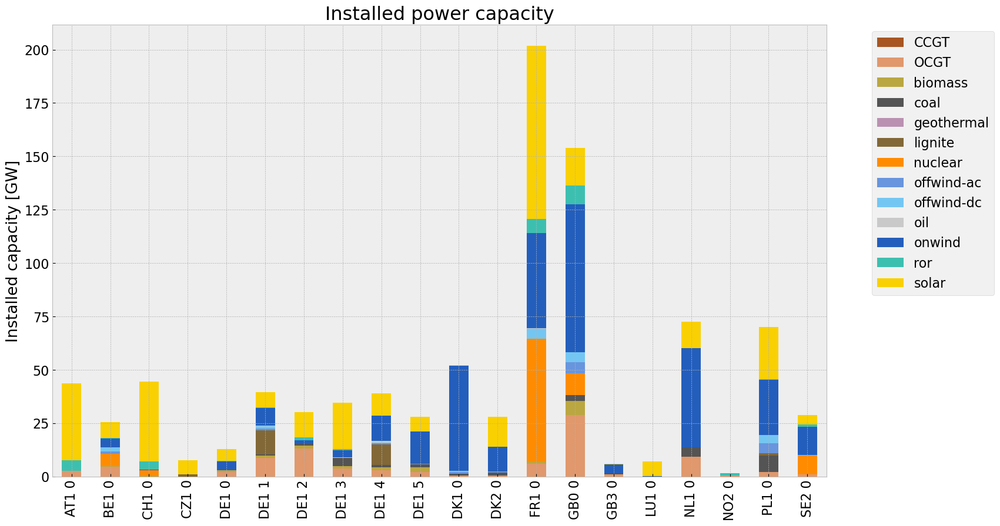

<Figure size 640x480 with 0 Axes>

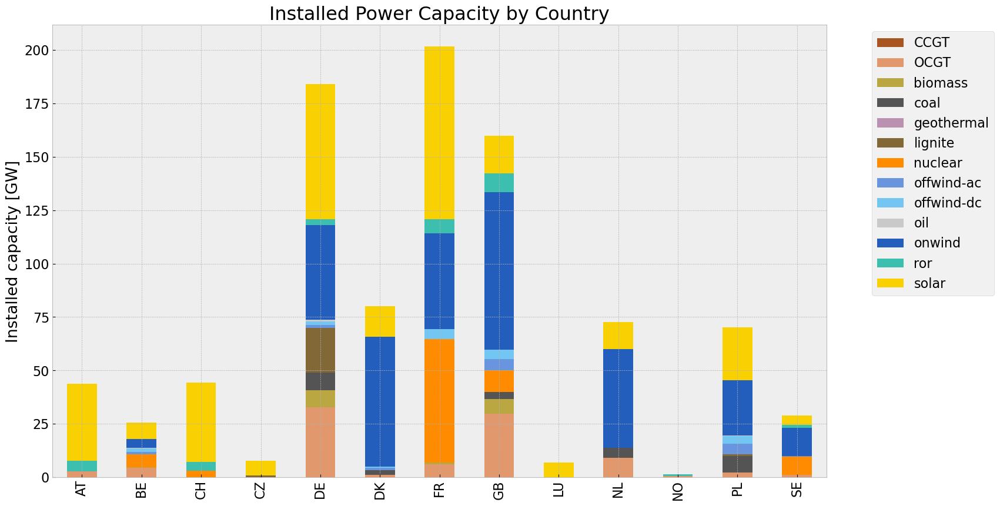

In [183]:
# consolidated istalled cap without load_shedding

#capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_inv.fillna(0, inplace=True)
#gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)
cap_inv_country= inst_cap_table_country(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

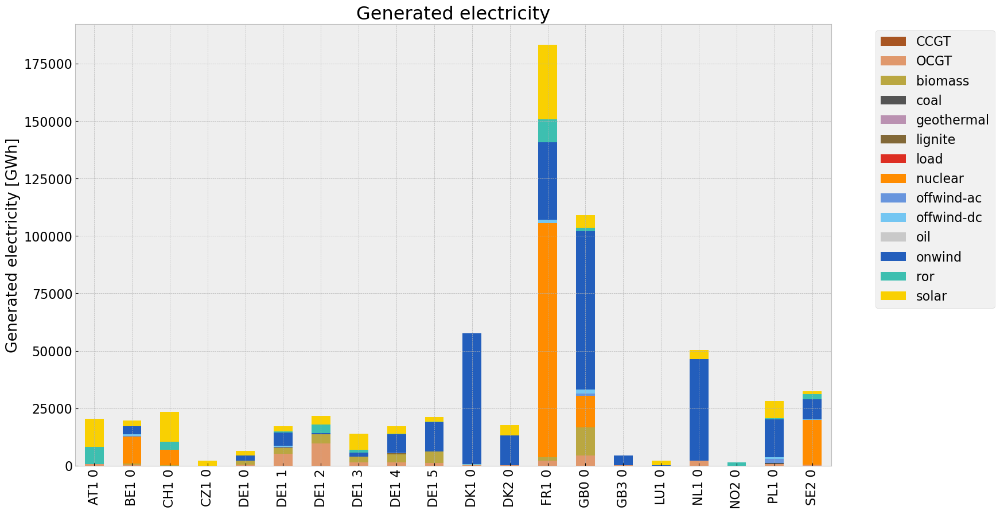

<Figure size 640x480 with 0 Axes>

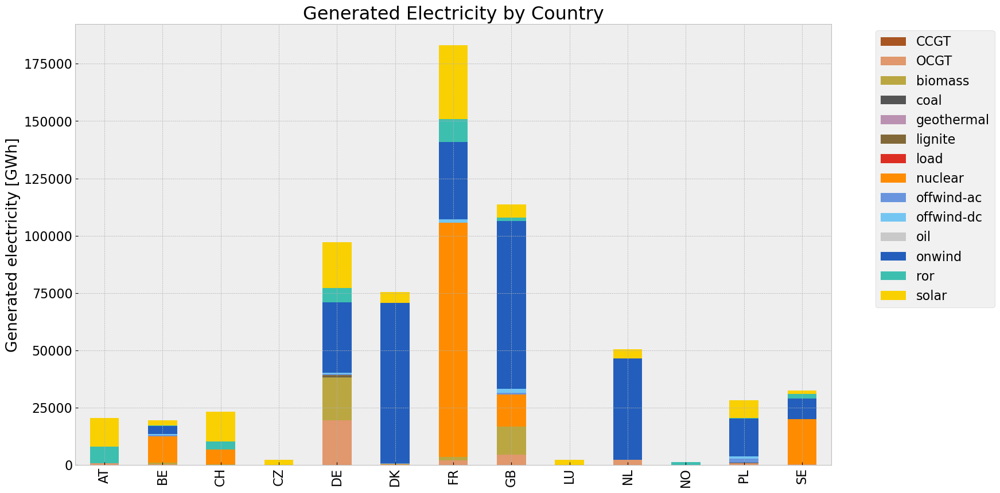

In [184]:
# consolidated generation table
#carrier = n1.generators.carrier.unique()
#df_tot_generation = n1.generators_t.p.sum()

#generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
           # except KeyError:
               # print('error')
                
#generations.fillna(0, inplace=True)
#gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)
gen_inv_country = gen_power_table_country(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

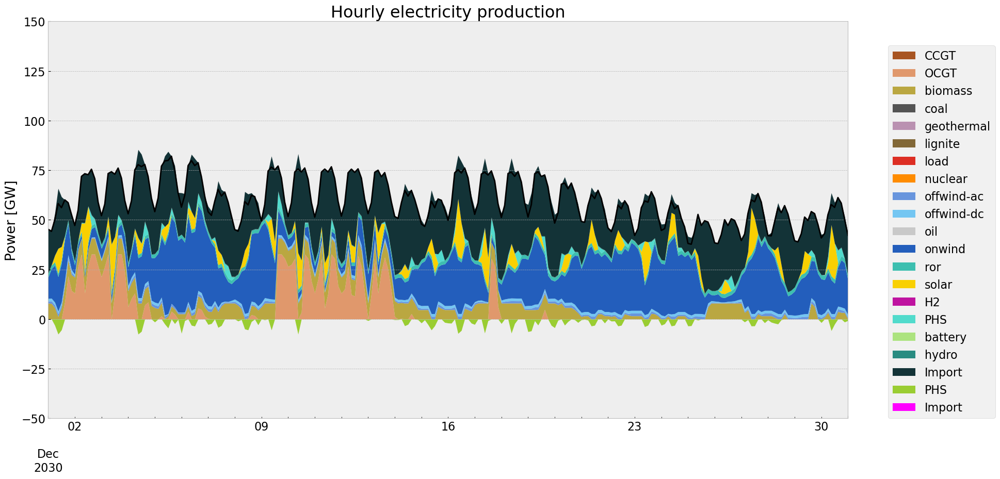

In [185]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen,'DE')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

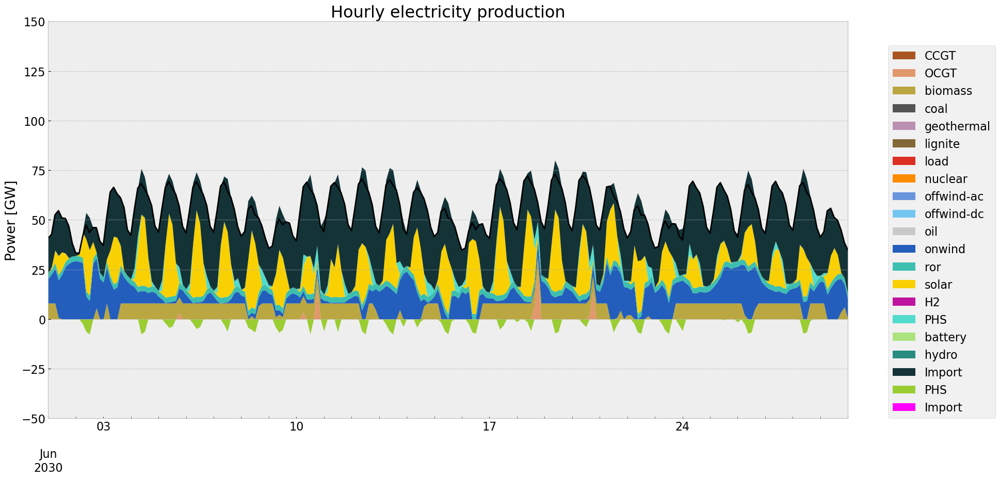

In [186]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen,'DE')

## Storage

carrier,H2,PHS,battery,hydro
country,,,,
AT,0.0,5.05730,0.000000,3.600620
BE,0.0,1.30800,0.000000,0.012783
CH,0.0,5.08955,0.000000,9.724410
CZ,0.0,NaN,0.488114,NaN
DE,0.0,7.59922,0.000000,0.289500
DK,0.0,NaN,0.000000,NaN
FR,0.0,4.97630,0.000000,8.329493
GB,0.0,0.44000,0.000000,0.228300
LU,0.0,2.58500,0.000000,NaN


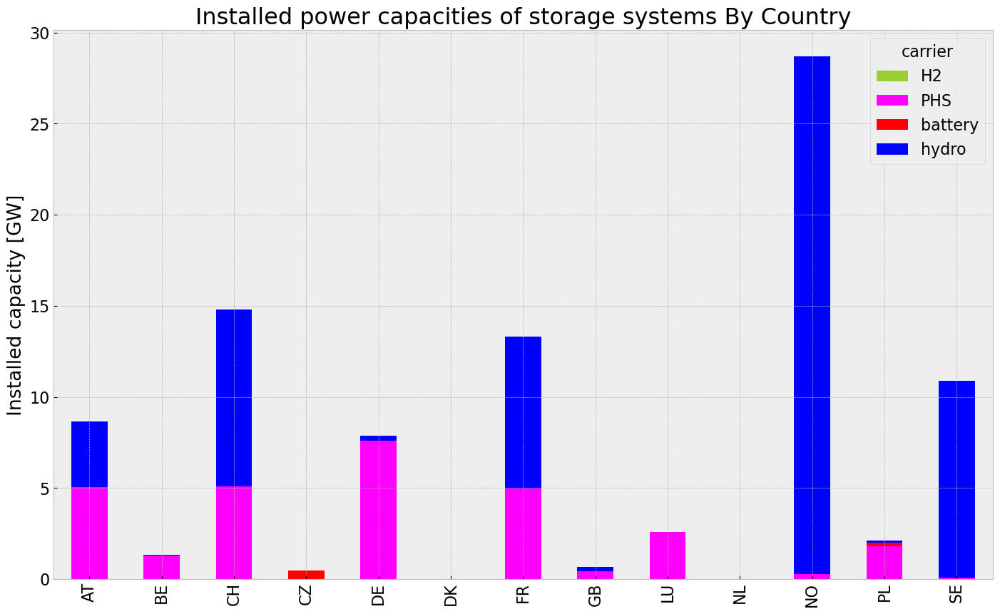

In [187]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


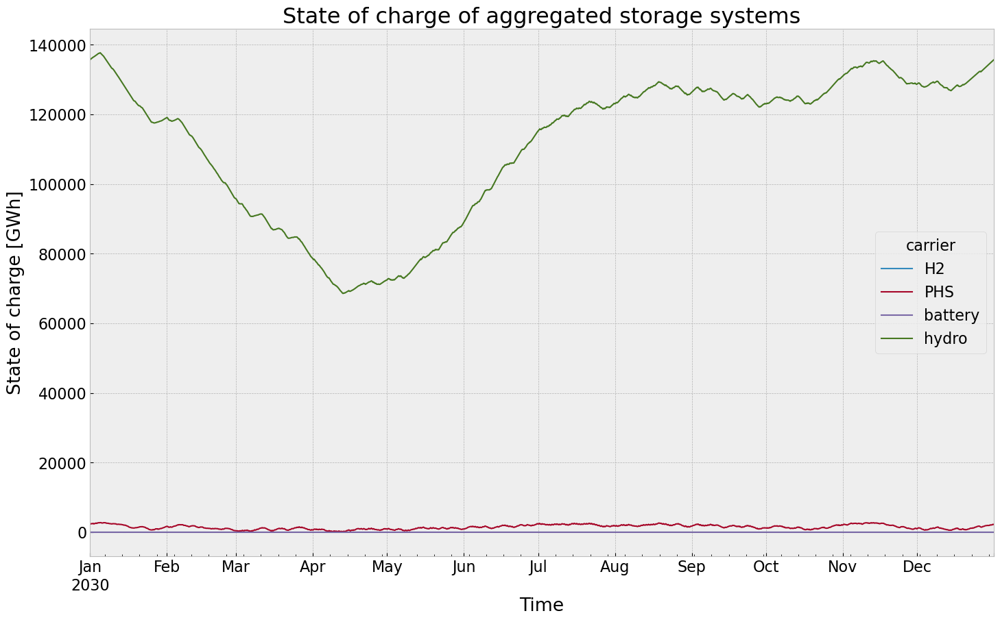

In [188]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


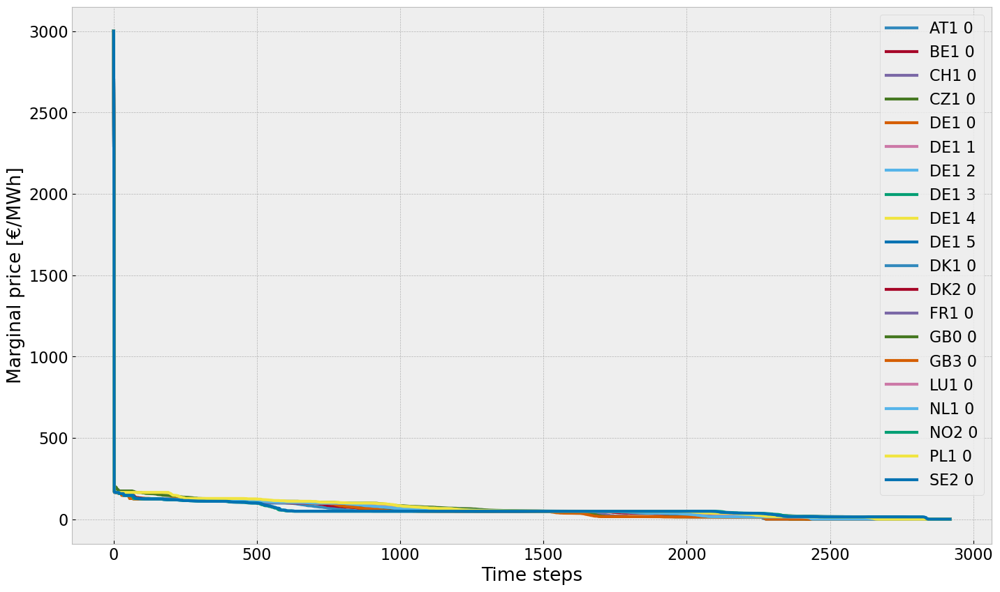

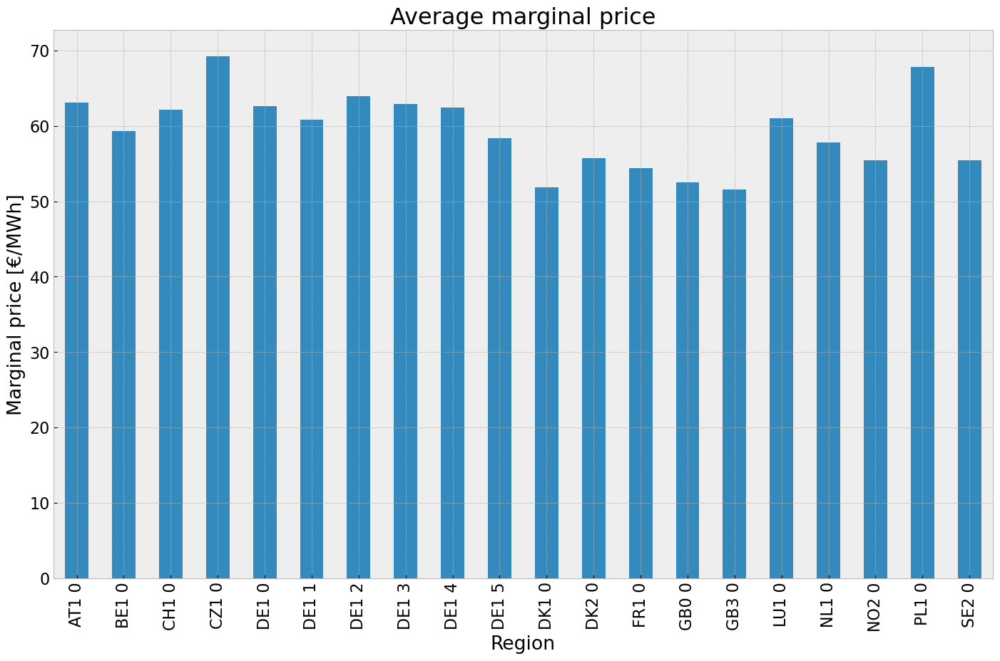

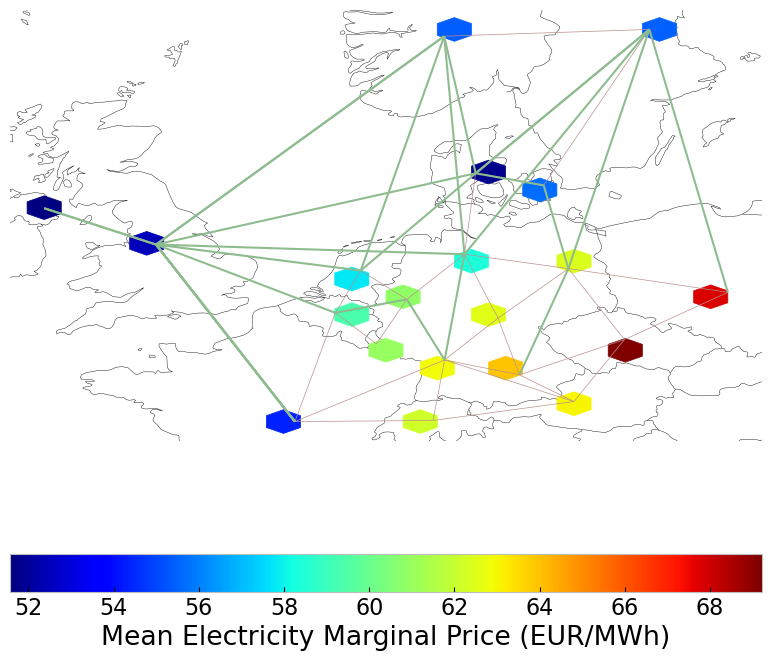

In [189]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [190]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.068682e+07,0.451621,0.1980,1.345374e+07
biomass,3.375460e+07,0.468000,0.0000,0.000000e+00
coal,6.453475e+05,0.329908,0.3361,6.574599e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.953140e+05,0.337285,0.4069,1.080106e+06
load,6.101259e+02,1.000000,0.0000,0.000000e+00
nuclear,1.536760e+08,0.326600,0.0000,0.000000e+00
offwind-ac,3.719677e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [191]:
#copy network
n2=n.copy()

#offwind cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index < cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n2.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [192]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUni

In [193]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]
INFO:linopy.io: Writing time: 41.91s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lkojp_vd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lkojp_vd.lp


Reading time = 10.91 seconds


INFO:gurobipy:Reading time = 10.91 seconds


obj: 3264617 rows, 1521349 columns, 5513044 nonzeros


INFO:gurobipy:obj: 3264617 rows, 1521349 columns, 5513044 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264617 rows, 1521349 columns and 5513044 nonzeros


INFO:gurobipy:Optimize a model with 3264617 rows, 1521349 columns and 5513044 nonzeros


Model fingerprint: 0x49bb9f31


INFO:gurobipy:Model fingerprint: 0x49bb9f31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 2945847 rows and 791736 columns


INFO:gurobipy:Presolve removed 2945847 rows and 791736 columns


Presolve time: 4.16s


INFO:gurobipy:Presolve time: 4.16s


Presolved: 318770 rows, 729613 columns, 1597094 nonzeros


INFO:gurobipy:Presolved: 318770 rows, 729613 columns, 1597094 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.58s


INFO:gurobipy:Ordering time: 0.58s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 28


INFO:gurobipy: Dense cols : 28


 AA' NZ     : 1.064e+06


INFO:gurobipy: AA' NZ     : 1.064e+06


 Factor NZ  : 8.498e+06 (roughly 500 MB of memory)


INFO:gurobipy: Factor NZ  : 8.498e+06 (roughly 500 MB of memory)


 Factor Ops : 7.387e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.387e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.08321359e+13 -4.34521692e+15  1.43e+06 1.90e+04  5.98e+09     6s


INFO:gurobipy:   0   8.08321359e+13 -4.34521692e+15  1.43e+06 1.90e+04  5.98e+09     6s


   1   7.68982225e+13 -9.29900678e+14  1.57e+06 3.38e+03  3.14e+09     7s


INFO:gurobipy:   1   7.68982225e+13 -9.29900678e+14  1.57e+06 3.38e+03  3.14e+09     7s


   2   3.55820437e+13 -1.55116059e+14  5.60e+05 3.52e-08  1.14e+09     8s


INFO:gurobipy:   2   3.55820437e+13 -1.55116059e+14  5.60e+05 3.52e-08  1.14e+09     8s


   3   6.10241591e+12 -8.85637274e+13  6.44e+04 8.31e-08  1.70e+08     9s


INFO:gurobipy:   3   6.10241591e+12 -8.85637274e+13  6.44e+04 8.31e-08  1.70e+08     9s


   4   1.97087521e+12 -3.24306494e+13  3.12e+03 4.75e-08  2.71e+07    10s


INFO:gurobipy:   4   1.97087521e+12 -3.24306494e+13  3.12e+03 4.75e-08  2.71e+07    10s


   5   1.21793706e+12 -1.01659025e+13  9.88e+02 6.09e-08  8.36e+06    11s


INFO:gurobipy:   5   1.21793706e+12 -1.01659025e+13  9.88e+02 6.09e-08  8.36e+06    11s


   6   5.21973788e+11 -5.22602284e+12  3.91e+02 3.49e-08  4.07e+06    11s


INFO:gurobipy:   6   5.21973788e+11 -5.22602284e+12  3.91e+02 3.49e-08  4.07e+06    11s


   7   3.36343438e+11 -1.72978797e+12  2.26e+02 1.37e-08  1.45e+06    12s


INFO:gurobipy:   7   3.36343438e+11 -1.72978797e+12  2.26e+02 1.37e-08  1.45e+06    12s


   8   1.59680517e+11 -5.12507480e+11  6.36e+01 4.61e-09  4.64e+05    13s


INFO:gurobipy:   8   1.59680517e+11 -5.12507480e+11  6.36e+01 4.61e-09  4.64e+05    13s


   9   7.72801509e+10 -1.30082139e+11  1.14e+01 2.03e-09  1.41e+05    14s


INFO:gurobipy:   9   7.72801509e+10 -1.30082139e+11  1.14e+01 2.03e-09  1.41e+05    14s


  10   7.42666157e+10 -9.74118101e+10  1.03e+01 1.35e-09  1.17e+05    15s


INFO:gurobipy:  10   7.42666157e+10 -9.74118101e+10  1.03e+01 1.35e-09  1.17e+05    15s


  11   6.92523144e+10 -4.04169540e+10  8.62e+00 6.54e-10  7.47e+04    15s


INFO:gurobipy:  11   6.92523144e+10 -4.04169540e+10  8.62e+00 6.54e-10  7.47e+04    15s


  12   5.18500019e+10 -1.66097443e+10  4.04e+00 5.51e-10  4.66e+04    16s


INFO:gurobipy:  12   5.18500019e+10 -1.66097443e+10  4.04e+00 5.51e-10  4.66e+04    16s


  13   4.62784349e+10 -5.93010495e+09  2.99e+00 5.21e-10  3.55e+04    17s


INFO:gurobipy:  13   4.62784349e+10 -5.93010495e+09  2.99e+00 5.21e-10  3.55e+04    17s


  14   4.06064838e+10  8.20166642e+09  1.99e+00 2.79e-10  2.20e+04    17s


INFO:gurobipy:  14   4.06064838e+10  8.20166642e+09  1.99e+00 2.79e-10  2.20e+04    17s


  15   3.94781268e+10  1.17951539e+10  1.79e+00 4.84e-10  1.88e+04    18s


INFO:gurobipy:  15   3.94781268e+10  1.17951539e+10  1.79e+00 4.84e-10  1.88e+04    18s


  16   3.88386150e+10  1.48646313e+10  1.68e+00 1.82e-10  1.63e+04    19s


INFO:gurobipy:  16   3.88386150e+10  1.48646313e+10  1.68e+00 1.82e-10  1.63e+04    19s


  17   3.57083314e+10  1.77222037e+10  1.14e+00 1.35e-10  1.22e+04    20s


INFO:gurobipy:  17   3.57083314e+10  1.77222037e+10  1.14e+00 1.35e-10  1.22e+04    20s


  18   3.40945492e+10  2.02711378e+10  8.69e-01 1.71e-10  9.39e+03    21s


INFO:gurobipy:  18   3.40945492e+10  2.02711378e+10  8.69e-01 1.71e-10  9.39e+03    21s


  19   3.27326561e+10  2.30391184e+10  6.45e-01 1.80e-10  6.58e+03    22s


INFO:gurobipy:  19   3.27326561e+10  2.30391184e+10  6.45e-01 1.80e-10  6.58e+03    22s


  20   3.18736916e+10  2.42281584e+10  5.05e-01 1.79e-10  5.19e+03    23s


INFO:gurobipy:  20   3.18736916e+10  2.42281584e+10  5.05e-01 1.79e-10  5.19e+03    23s


  21   3.09210970e+10  2.51063272e+10  3.48e-01 1.57e-10  3.95e+03    24s


INFO:gurobipy:  21   3.09210970e+10  2.51063272e+10  3.48e-01 1.57e-10  3.95e+03    24s


  22   3.03951046e+10  2.65350590e+10  2.62e-01 1.25e-10  2.62e+03    25s


INFO:gurobipy:  22   3.03951046e+10  2.65350590e+10  2.62e-01 1.25e-10  2.62e+03    25s


  23   2.98617930e+10  2.69791000e+10  1.77e-01 1.68e-10  1.96e+03    26s


INFO:gurobipy:  23   2.98617930e+10  2.69791000e+10  1.77e-01 1.68e-10  1.96e+03    26s


  24   2.96855331e+10  2.75055860e+10  1.50e-01 1.41e-10  1.48e+03    27s


INFO:gurobipy:  24   2.96855331e+10  2.75055860e+10  1.50e-01 1.41e-10  1.48e+03    27s


  25   2.95008404e+10  2.76503480e+10  1.23e-01 1.39e-10  1.26e+03    28s


INFO:gurobipy:  25   2.95008404e+10  2.76503480e+10  1.23e-01 1.39e-10  1.26e+03    28s


  26   2.93550557e+10  2.78095418e+10  1.01e-01 1.74e-10  1.05e+03    29s


INFO:gurobipy:  26   2.93550557e+10  2.78095418e+10  1.01e-01 1.74e-10  1.05e+03    29s


  27   2.92358859e+10  2.79461742e+10  8.32e-02 1.23e-10  8.76e+02    30s


INFO:gurobipy:  27   2.92358859e+10  2.79461742e+10  8.32e-02 1.23e-10  8.76e+02    30s


  28   2.91468139e+10  2.80143956e+10  6.95e-02 9.44e-11  7.69e+02    31s


INFO:gurobipy:  28   2.91468139e+10  2.80143956e+10  6.95e-02 9.44e-11  7.69e+02    31s


  29   2.90354907e+10  2.81130119e+10  5.20e-02 1.00e-10  6.26e+02    32s


INFO:gurobipy:  29   2.90354907e+10  2.81130119e+10  5.20e-02 1.00e-10  6.26e+02    32s


  30   2.89748426e+10  2.81657188e+10  4.29e-02 1.55e-10  5.49e+02    33s


INFO:gurobipy:  30   2.89748426e+10  2.81657188e+10  4.29e-02 1.55e-10  5.49e+02    33s


  31   2.89322128e+10  2.82175613e+10  3.63e-02 1.27e-10  4.85e+02    34s


INFO:gurobipy:  31   2.89322128e+10  2.82175613e+10  3.63e-02 1.27e-10  4.85e+02    34s


  32   2.89016021e+10  2.83632062e+10  3.15e-02 1.35e-10  3.66e+02    35s


INFO:gurobipy:  32   2.89016021e+10  2.83632062e+10  3.15e-02 1.35e-10  3.66e+02    35s


  33   2.88421977e+10  2.83925601e+10  2.27e-02 8.17e-10  3.05e+02    36s


INFO:gurobipy:  33   2.88421977e+10  2.83925601e+10  2.27e-02 8.17e-10  3.05e+02    36s


  34   2.88227645e+10  2.84486013e+10  1.98e-02 1.76e-09  2.54e+02    38s


INFO:gurobipy:  34   2.88227645e+10  2.84486013e+10  1.98e-02 1.76e-09  2.54e+02    38s


  35   2.88043938e+10  2.84972997e+10  1.71e-02 3.65e-09  2.09e+02    38s


INFO:gurobipy:  35   2.88043938e+10  2.84972997e+10  1.71e-02 3.65e-09  2.09e+02    38s


  36   2.87779060e+10  2.85283533e+10  1.32e-02 5.95e-09  1.69e+02    40s


INFO:gurobipy:  36   2.87779060e+10  2.85283533e+10  1.32e-02 5.95e-09  1.69e+02    40s


  37   2.87570800e+10  2.85527698e+10  1.01e-02 8.82e-09  1.39e+02    41s


INFO:gurobipy:  37   2.87570800e+10  2.85527698e+10  1.01e-02 8.82e-09  1.39e+02    41s


  38   2.87343254e+10  2.85863185e+10  6.80e-03 1.09e-08  1.00e+02    41s


INFO:gurobipy:  38   2.87343254e+10  2.85863185e+10  6.80e-03 1.09e-08  1.00e+02    41s


  39   2.87256129e+10  2.86080171e+10  5.50e-03 1.30e-08  7.98e+01    42s


INFO:gurobipy:  39   2.87256129e+10  2.86080171e+10  5.50e-03 1.30e-08  7.98e+01    42s


  40   2.87157087e+10  2.86228439e+10  4.03e-03 1.48e-08  6.31e+01    43s


INFO:gurobipy:  40   2.87157087e+10  2.86228439e+10  4.03e-03 1.48e-08  6.31e+01    43s


  41   2.87103482e+10  2.86361168e+10  3.25e-03 1.66e-08  5.04e+01    45s


INFO:gurobipy:  41   2.87103482e+10  2.86361168e+10  3.25e-03 1.66e-08  5.04e+01    45s


  42   2.87066857e+10  2.86510788e+10  2.72e-03 1.71e-08  3.78e+01    46s


INFO:gurobipy:  42   2.87066857e+10  2.86510788e+10  2.72e-03 1.71e-08  3.78e+01    46s


  43   2.87029113e+10  2.86567239e+10  2.20e-03 1.59e-08  3.14e+01    47s


INFO:gurobipy:  43   2.87029113e+10  2.86567239e+10  2.20e-03 1.59e-08  3.14e+01    47s


  44   2.86988367e+10  2.86600789e+10  1.65e-03 1.82e-08  2.63e+01    48s


INFO:gurobipy:  44   2.86988367e+10  2.86600789e+10  1.65e-03 1.82e-08  2.63e+01    48s


  45   2.86972370e+10  2.86668228e+10  1.42e-03 2.46e-08  2.07e+01    49s


INFO:gurobipy:  45   2.86972370e+10  2.86668228e+10  1.42e-03 2.46e-08  2.07e+01    49s


  46   2.86935293e+10  2.86700792e+10  9.18e-04 2.17e-08  1.59e+01    50s


INFO:gurobipy:  46   2.86935293e+10  2.86700792e+10  9.18e-04 2.17e-08  1.59e+01    50s


  47   2.86920689e+10  2.86736897e+10  7.15e-04 2.11e-08  1.25e+01    51s


INFO:gurobipy:  47   2.86920689e+10  2.86736897e+10  7.15e-04 2.11e-08  1.25e+01    51s


  48   2.86909824e+10  2.86771145e+10  5.67e-04 2.80e-08  9.42e+00    52s


INFO:gurobipy:  48   2.86909824e+10  2.86771145e+10  5.67e-04 2.80e-08  9.42e+00    52s


  49   2.86901416e+10  2.86804215e+10  4.54e-04 5.10e-08  6.60e+00    53s


INFO:gurobipy:  49   2.86901416e+10  2.86804215e+10  4.54e-04 5.10e-08  6.60e+00    53s


  50   2.86885548e+10  2.86821039e+10  2.51e-04 6.60e-08  4.38e+00    54s


INFO:gurobipy:  50   2.86885548e+10  2.86821039e+10  2.51e-04 6.60e-08  4.38e+00    54s


  51   2.86879249e+10  2.86837113e+10  1.69e-04 7.05e-08  2.86e+00    56s


INFO:gurobipy:  51   2.86879249e+10  2.86837113e+10  1.69e-04 7.05e-08  2.86e+00    56s


  52   2.86876039e+10  2.86847605e+10  1.28e-04 6.38e-08  1.93e+00    57s


INFO:gurobipy:  52   2.86876039e+10  2.86847605e+10  1.28e-04 6.38e-08  1.93e+00    57s


  53   2.86873896e+10  2.86849680e+10  1.02e-04 6.13e-08  1.64e+00    58s


INFO:gurobipy:  53   2.86873896e+10  2.86849680e+10  1.02e-04 6.13e-08  1.64e+00    58s


  54   2.86873569e+10  2.86850504e+10  9.82e-05 5.99e-08  1.57e+00    59s


INFO:gurobipy:  54   2.86873569e+10  2.86850504e+10  9.82e-05 5.99e-08  1.57e+00    59s


  55   2.86872198e+10  2.86854057e+10  8.09e-05 5.44e-08  1.23e+00    59s


INFO:gurobipy:  55   2.86872198e+10  2.86854057e+10  8.09e-05 5.44e-08  1.23e+00    59s


  56   2.86871361e+10  2.86855491e+10  7.06e-05 5.16e-08  1.08e+00    60s


INFO:gurobipy:  56   2.86871361e+10  2.86855491e+10  7.06e-05 5.16e-08  1.08e+00    60s


  57   2.86870557e+10  2.86857433e+10  6.06e-05 4.69e-08  8.91e-01    61s


INFO:gurobipy:  57   2.86870557e+10  2.86857433e+10  6.06e-05 4.69e-08  8.91e-01    61s


  58   2.86869825e+10  2.86858218e+10  5.21e-05 4.57e-08  7.88e-01    61s


INFO:gurobipy:  58   2.86869825e+10  2.86858218e+10  5.21e-05 4.57e-08  7.88e-01    61s


  59   2.86869313e+10  2.86858860e+10  4.61e-05 4.39e-08  7.10e-01    62s


INFO:gurobipy:  59   2.86869313e+10  2.86858860e+10  4.61e-05 4.39e-08  7.10e-01    62s


  60   2.86868556e+10  2.86859230e+10  3.72e-05 4.29e-08  6.33e-01    63s


INFO:gurobipy:  60   2.86868556e+10  2.86859230e+10  3.72e-05 4.29e-08  6.33e-01    63s


  61   2.86867945e+10  2.86861155e+10  3.01e-05 3.59e-08  4.61e-01    64s


INFO:gurobipy:  61   2.86867945e+10  2.86861155e+10  3.01e-05 3.59e-08  4.61e-01    64s


  62   2.86867495e+10  2.86861955e+10  2.49e-05 3.25e-08  3.76e-01    65s


INFO:gurobipy:  62   2.86867495e+10  2.86861955e+10  2.49e-05 3.25e-08  3.76e-01    65s


  63   2.86867130e+10  2.86862380e+10  2.07e-05 2.83e-08  3.23e-01    65s


INFO:gurobipy:  63   2.86867130e+10  2.86862380e+10  2.07e-05 2.83e-08  3.23e-01    65s


  64   2.86866907e+10  2.86863021e+10  1.81e-05 2.53e-08  2.64e-01    66s


INFO:gurobipy:  64   2.86866907e+10  2.86863021e+10  1.81e-05 2.53e-08  2.64e-01    66s


  65   2.86866582e+10  2.86863417e+10  1.60e-05 2.50e-08  2.15e-01    67s


INFO:gurobipy:  65   2.86866582e+10  2.86863417e+10  1.60e-05 2.50e-08  2.15e-01    67s


  66   2.86866476e+10  2.86863548e+10  1.50e-05 2.41e-08  1.99e-01    67s


INFO:gurobipy:  66   2.86866476e+10  2.86863548e+10  1.50e-05 2.41e-08  1.99e-01    67s


  67   2.86866339e+10  2.86863774e+10  1.50e-05 2.16e-08  1.74e-01    68s


INFO:gurobipy:  67   2.86866339e+10  2.86863774e+10  1.50e-05 2.16e-08  1.74e-01    68s


  68   2.86866250e+10  2.86864133e+10  1.39e-05 2.09e-08  1.44e-01    69s


INFO:gurobipy:  68   2.86866250e+10  2.86864133e+10  1.39e-05 2.09e-08  1.44e-01    69s


  69   2.86866080e+10  2.86864194e+10  1.14e-05 2.00e-08  1.28e-01    70s


INFO:gurobipy:  69   2.86866080e+10  2.86864194e+10  1.14e-05 2.00e-08  1.28e-01    70s


  70   2.86866056e+10  2.86864354e+10  1.10e-05 1.74e-08  1.16e-01    71s


INFO:gurobipy:  70   2.86866056e+10  2.86864354e+10  1.10e-05 1.74e-08  1.16e-01    71s


  71   2.86865969e+10  2.86864523e+10  9.66e-06 1.45e-08  9.82e-02    72s


INFO:gurobipy:  71   2.86865969e+10  2.86864523e+10  9.66e-06 1.45e-08  9.82e-02    72s


  72   2.86865818e+10  2.86864726e+10  7.56e-06 1.15e-08  7.42e-02    73s


INFO:gurobipy:  72   2.86865818e+10  2.86864726e+10  7.56e-06 1.15e-08  7.42e-02    73s


  73   2.86865682e+10  2.86864804e+10  5.54e-06 1.02e-08  5.96e-02    75s


INFO:gurobipy:  73   2.86865682e+10  2.86864804e+10  5.54e-06 1.02e-08  5.96e-02    75s


  74   2.86865627e+10  2.86864962e+10  4.28e-06 7.45e-09  4.52e-02    76s


INFO:gurobipy:  74   2.86865627e+10  2.86864962e+10  4.28e-06 7.45e-09  4.52e-02    76s


  75   2.86865585e+10  2.86865038e+10  3.47e-06 6.12e-09  3.71e-02    78s


INFO:gurobipy:  75   2.86865585e+10  2.86865038e+10  3.47e-06 6.12e-09  3.71e-02    78s


  76   2.86865559e+10  2.86865078e+10  3.13e-06 5.35e-09  3.27e-02    79s


INFO:gurobipy:  76   2.86865559e+10  2.86865078e+10  3.13e-06 5.35e-09  3.27e-02    79s


  77   2.86865513e+10  2.86865126e+10  3.11e-06 4.44e-09  2.63e-02    81s


INFO:gurobipy:  77   2.86865513e+10  2.86865126e+10  3.11e-06 4.44e-09  2.63e-02    81s


  78   2.86865483e+10  2.86865200e+10  2.60e-06 2.90e-09  1.93e-02    83s


INFO:gurobipy:  78   2.86865483e+10  2.86865200e+10  2.60e-06 2.90e-09  1.93e-02    83s


  79   2.86865447e+10  2.86865242e+10  2.07e-06 1.98e-09  1.39e-02    84s


INFO:gurobipy:  79   2.86865447e+10  2.86865242e+10  2.07e-06 1.98e-09  1.39e-02    84s


  80   2.86865417e+10  2.86865266e+10  1.57e-06 1.45e-09  1.03e-02    86s


INFO:gurobipy:  80   2.86865417e+10  2.86865266e+10  1.57e-06 1.45e-09  1.03e-02    86s


  81   2.86865398e+10  2.86865280e+10  1.30e-06 1.12e-09  7.97e-03    88s


INFO:gurobipy:  81   2.86865398e+10  2.86865280e+10  1.30e-06 1.12e-09  7.97e-03    88s


  82   2.86865385e+10  2.86865299e+10  1.10e-06 6.70e-10  5.80e-03    89s


INFO:gurobipy:  82   2.86865385e+10  2.86865299e+10  1.10e-06 6.70e-10  5.80e-03    89s


  83   2.86865370e+10  2.86865304e+10  8.42e-07 5.67e-10  4.51e-03    91s


INFO:gurobipy:  83   2.86865370e+10  2.86865304e+10  8.42e-07 5.67e-10  4.51e-03    91s


  84   2.86865369e+10  2.86865309e+10  8.18e-07 5.10e-10  4.09e-03    93s


INFO:gurobipy:  84   2.86865369e+10  2.86865309e+10  8.18e-07 5.10e-10  4.09e-03    93s


  85   2.86865332e+10  2.86865317e+10  1.75e-07 5.37e-10  1.05e-03    94s


INFO:gurobipy:  85   2.86865332e+10  2.86865317e+10  1.75e-07 5.37e-10  1.05e-03    94s


  86   2.86865328e+10  2.86865319e+10  1.01e-04 3.88e-10  6.37e-04    95s


INFO:gurobipy:  86   2.86865328e+10  2.86865319e+10  1.01e-04 3.88e-10  6.37e-04    95s


  87   2.86865325e+10  2.86865319e+10  6.30e-05 2.78e-10  4.02e-04    97s


INFO:gurobipy:  87   2.86865325e+10  2.86865319e+10  6.30e-05 2.78e-10  4.02e-04    97s


  88   2.86865324e+10  2.86865320e+10  4.42e-05 1.73e-10  2.48e-04    97s


INFO:gurobipy:  88   2.86865324e+10  2.86865320e+10  4.42e-05 1.73e-10  2.48e-04    97s


  89   2.86865323e+10  2.86865321e+10  6.30e-05 8.99e-10  1.31e-04    98s


INFO:gurobipy:  89   2.86865323e+10  2.86865321e+10  6.30e-05 8.99e-10  1.31e-04    98s


INFO:gurobipy:


Barrier solved model in 89 iterations and 98.33 seconds (30.41 work units)


INFO:gurobipy:Barrier solved model in 89 iterations and 98.33 seconds (30.41 work units)


Optimal objective 2.86865323e+10


INFO:gurobipy:Optimal objective 2.86865323e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   42308 DPushes remaining with DInf 0.0000000e+00                99s


INFO:gurobipy:   42308 DPushes remaining with DInf 0.0000000e+00                99s


    7657 DPushes remaining with DInf 0.0000000e+00               100s


INFO:gurobipy:    7657 DPushes remaining with DInf 0.0000000e+00               100s


      49 DPushes remaining with DInf 0.0000000e+00               106s


INFO:gurobipy:      49 DPushes remaining with DInf 0.0000000e+00               106s


       0 DPushes remaining with DInf 0.0000000e+00               106s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               106s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


  390823 PPushes remaining with PInf 8.7684231e-02               107s


INFO:gurobipy:  390823 PPushes remaining with PInf 8.7684231e-02               107s


   91416 PPushes remaining with PInf 2.4297251e-02               138s


INFO:gurobipy:   91416 PPushes remaining with PInf 2.4297251e-02               138s


   82920 PPushes remaining with PInf 2.2859352e-02               141s


INFO:gurobipy:   82920 PPushes remaining with PInf 2.2859352e-02               141s


   12706 PPushes remaining with PInf 2.8560237e-03               166s


INFO:gurobipy:   12706 PPushes remaining with PInf 2.8560237e-03               166s


     710 PPushes remaining with PInf 7.4818048e-05               173s


INFO:gurobipy:     710 PPushes remaining with PInf 7.4818048e-05               173s


       0 PPushes remaining with PInf 0.0000000e+00               174s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               174s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.7811963e+02    174s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.7811963e+02    174s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  424857    2.8686532e+10   0.000000e+00   3.781196e+02    174s


INFO:gurobipy:  424857    2.8686532e+10   0.000000e+00   3.781196e+02    174s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  425039    2.8686532e+10   0.000000e+00   0.000000e+00    177s


INFO:gurobipy:  425039    2.8686532e+10   0.000000e+00   0.000000e+00    177s


INFO:gurobipy:


Solved in 425039 iterations and 177.32 seconds (58.98 work units)


INFO:gurobipy:Solved in 425039 iterations and 177.32 seconds (58.98 work units)


Optimal objective  2.868653219e+10


INFO:gurobipy:Optimal objective  2.868653219e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521349 primals, 3264617 duals
Objective: 2.87e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [194]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

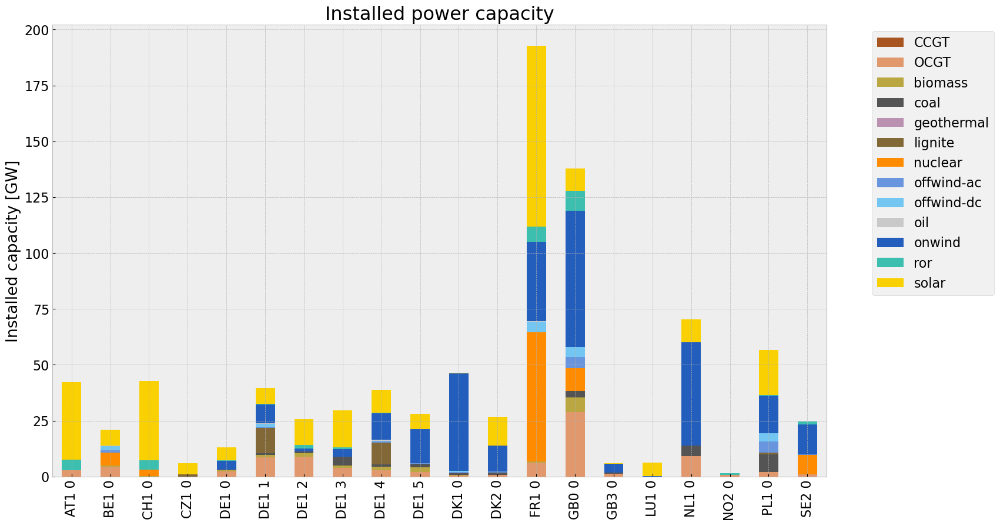

<Figure size 640x480 with 0 Axes>

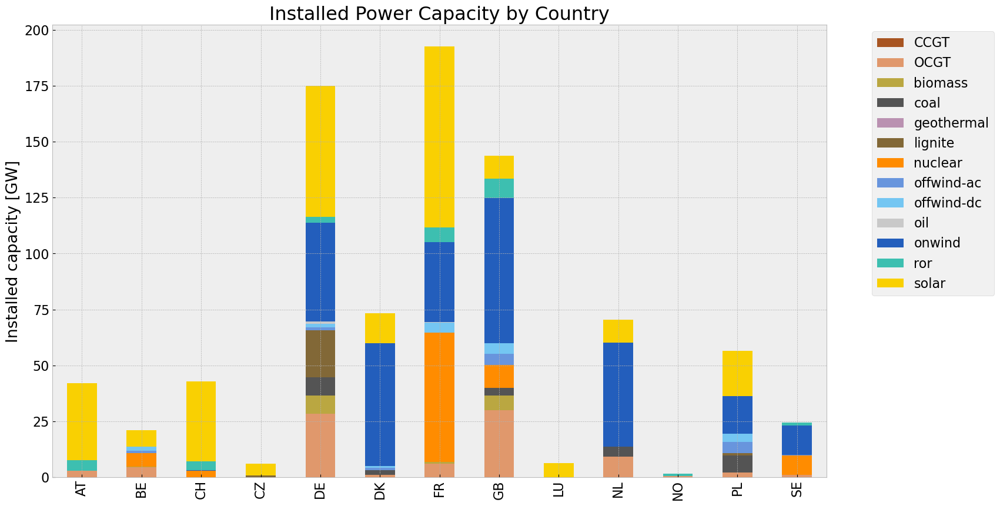

In [195]:
# consolidated istalled cap without load_shedding

#capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv.fillna(0, inplace=True)
#gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)
cap_noinv_country= inst_cap_table_country(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

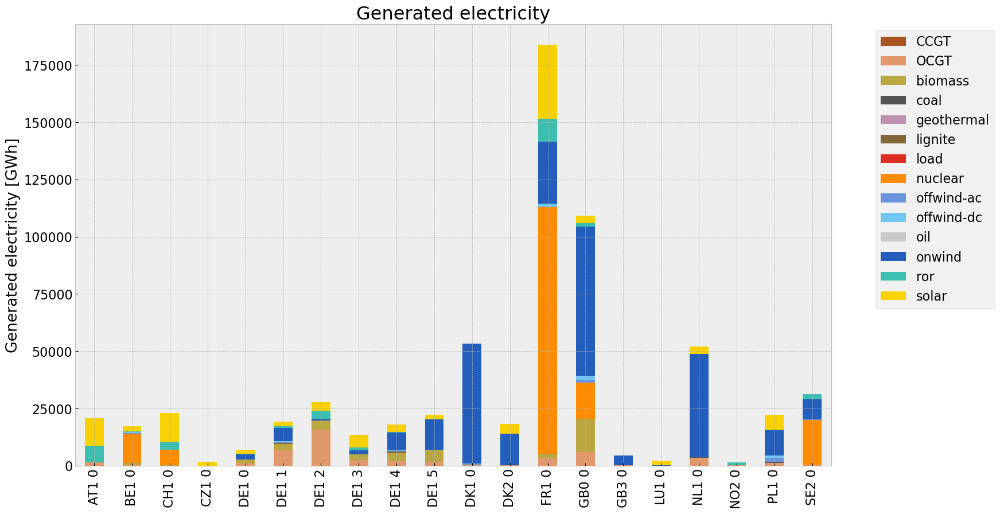

<Figure size 640x480 with 0 Axes>

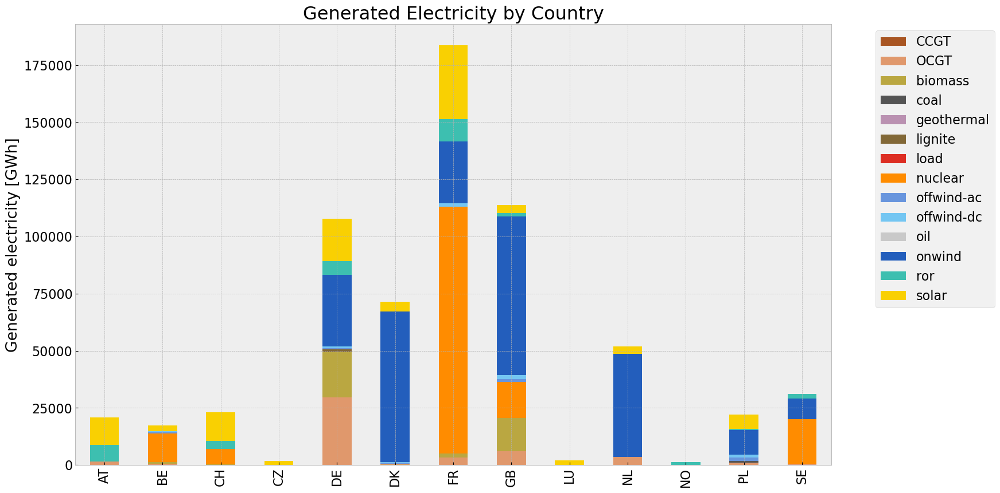

In [196]:
# consolidated generation table
#carrier = n2.generators.carrier.unique()
#df_tot_generation = n2.generators_t.p.sum()

#generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
                #generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')

#generations.fillna(0, inplace=True)
#gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)
gen_noinv_country = gen_power_table_country(n2,colors_gen_table)


## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2796143640.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2796143640.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum(

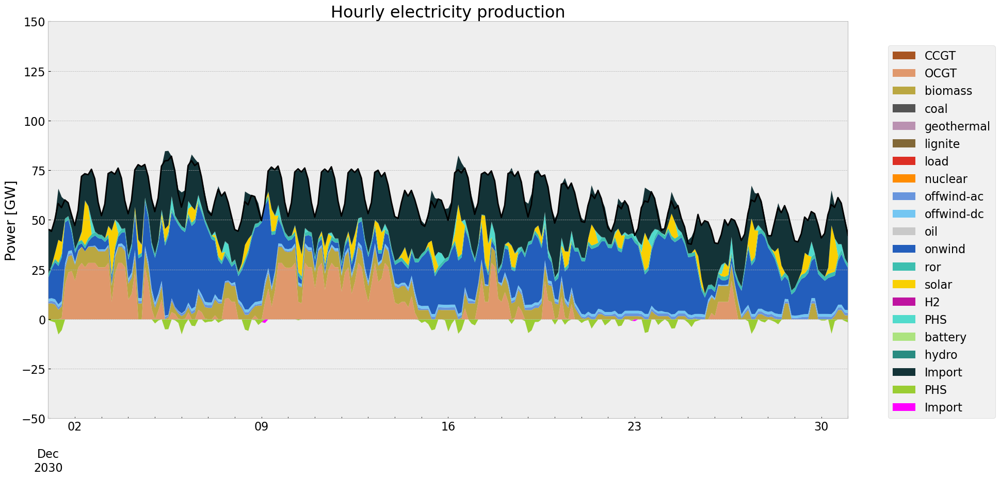

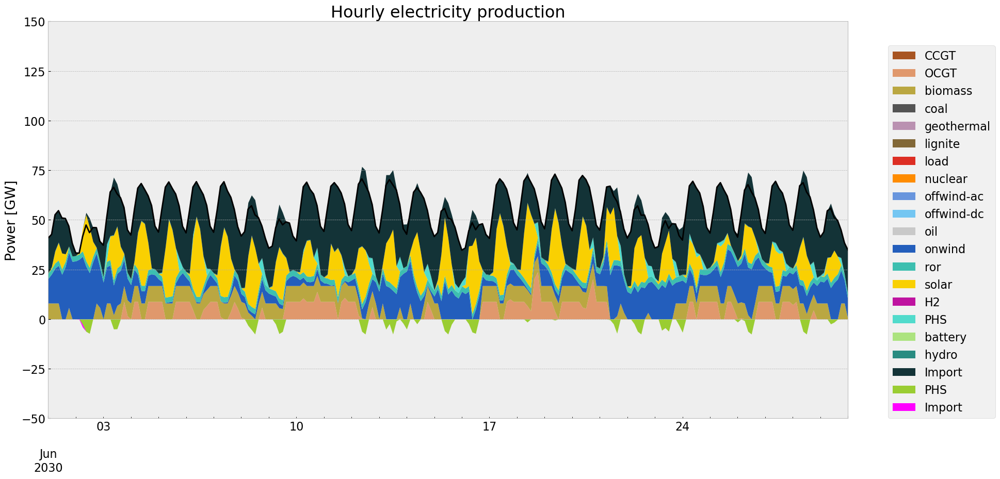

In [197]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1075419132.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\1075419132.py:4: FutureWarning: 'H' is deprecated and will be removed in a future v

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,4.673477e+07,0.451621,0.1980,2.048950e+07
biomass,3.707030e+07,0.468000,0.0000,0.000000e+00
coal,9.682186e+05,0.329908,0.3361,9.863909e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.388266e+06,0.337285,0.4069,1.674803e+06
load,2.469199e+04,1.000000,0.0000,0.000000e+00
nuclear,1.625690e+08,0.326600,0.0000,0.000000e+00
offwind-ac,4.194471e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


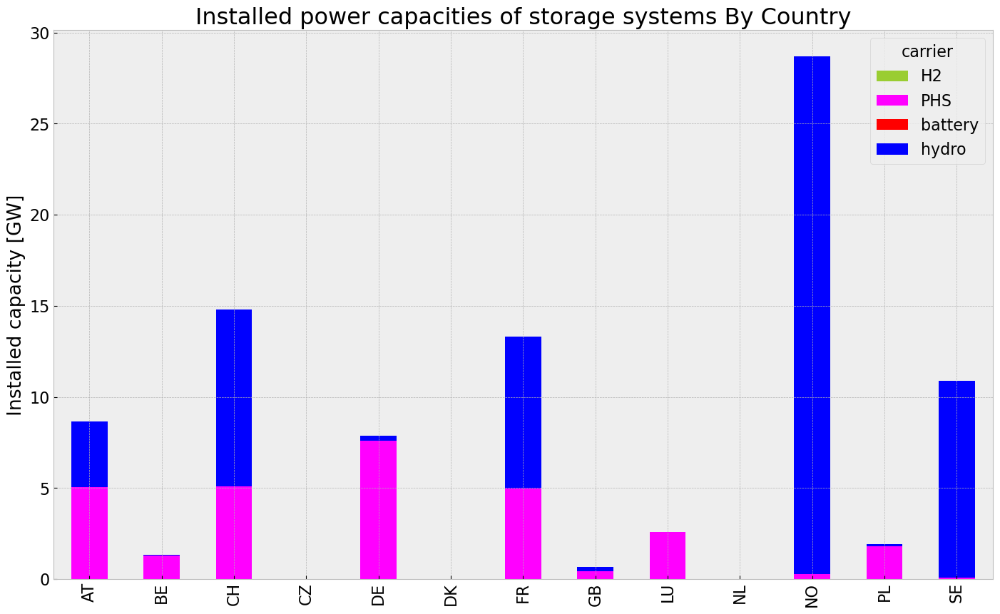

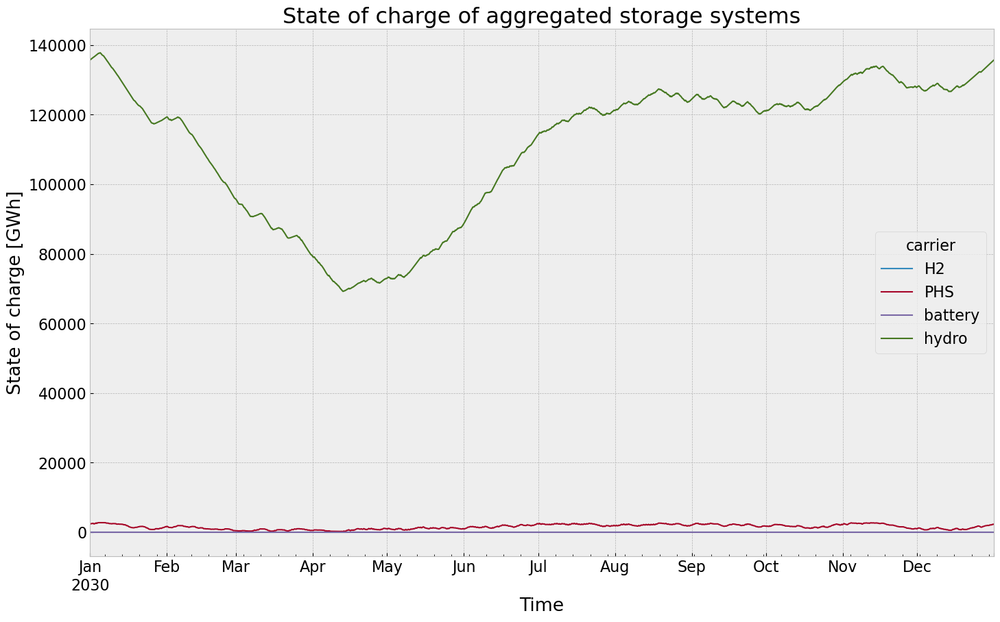

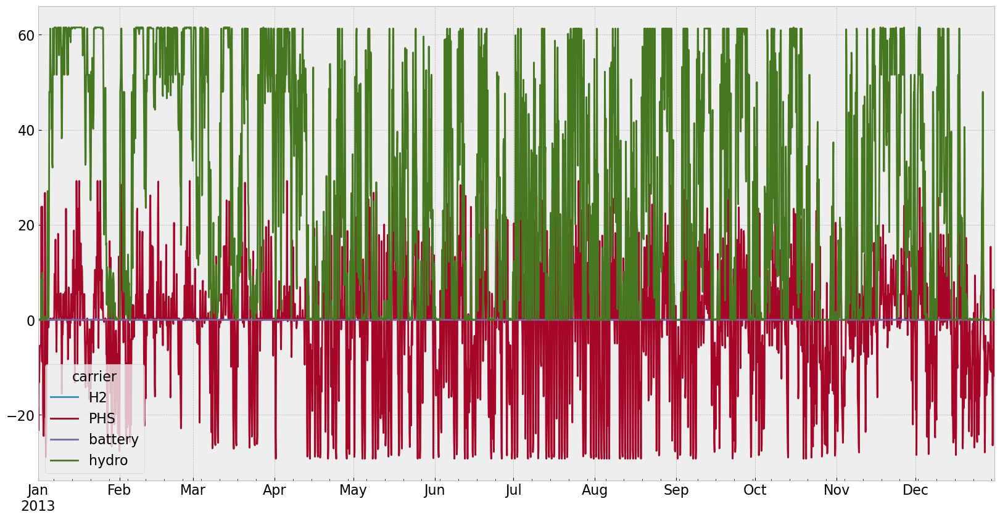

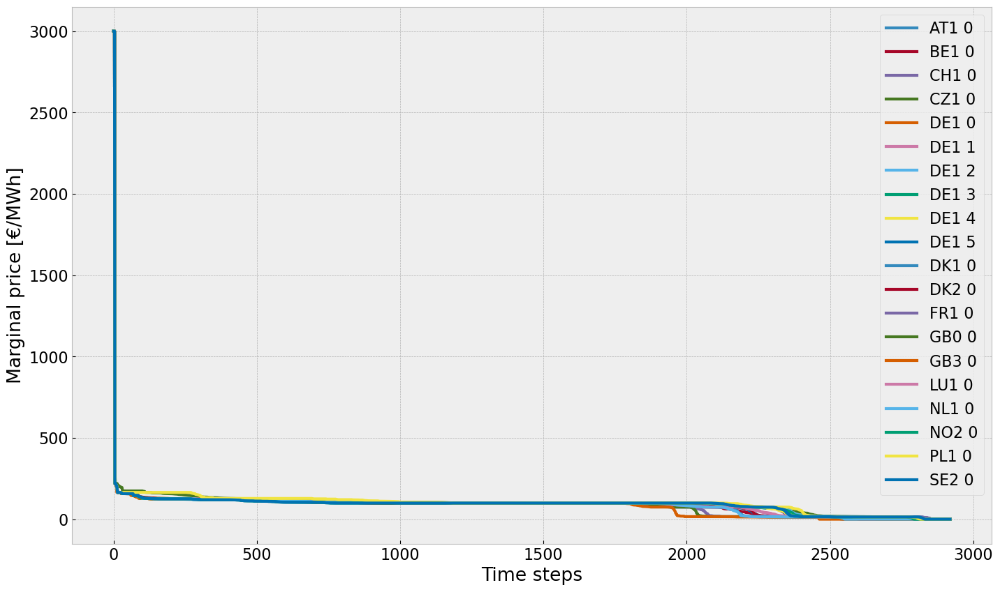

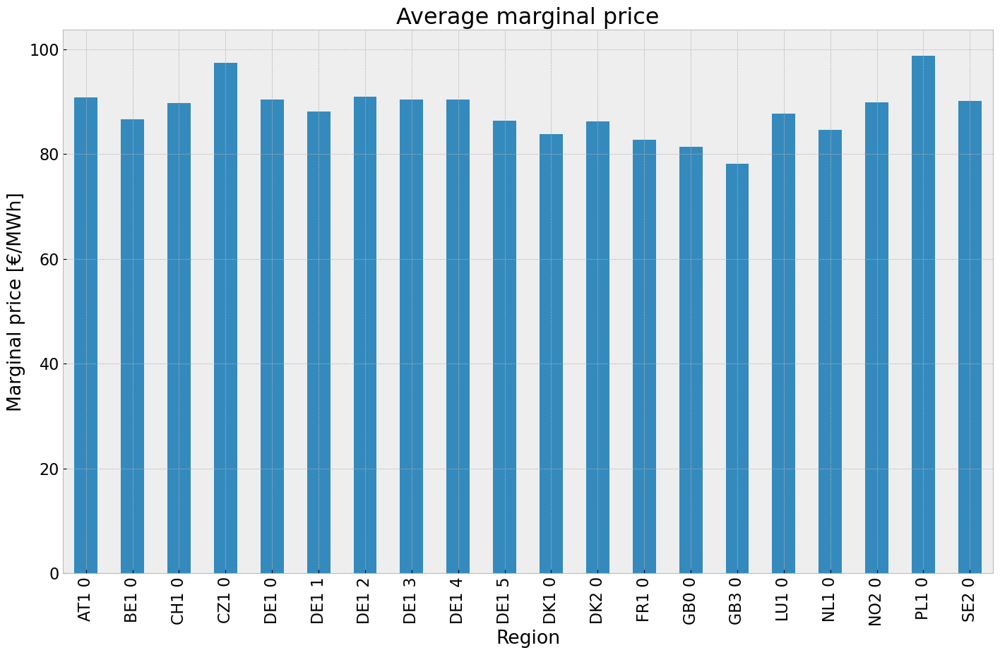

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


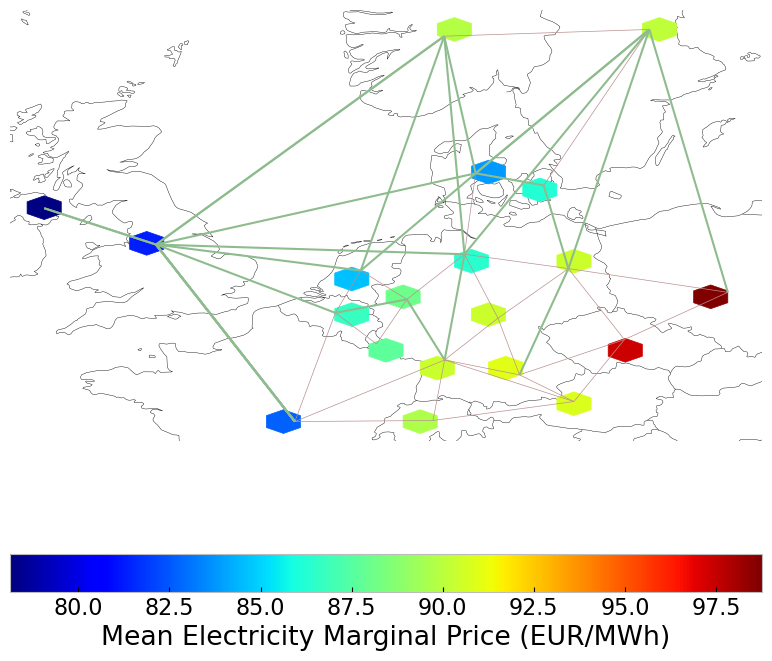

In [198]:
#storage unit & stores
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [199]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.46it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxkgrk4d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxkgrk4d.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc9fd9207


INFO:gurobipy:Model fingerprint: 0xc9fd9207


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24248 rows and 6179 columns


INFO:gurobipy:Presolve removed 24248 rows and 6179 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6354 columns, 13278 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6354 columns, 13278 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22449913e+13 -1.68318489e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22449913e+13 -1.68318489e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04402813e+12 -3.78045218e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04402813e+12 -3.78045218e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46834770e+11 -1.60065174e+12  2.24e+04 2.33e-10  2.30e+08     0s


INFO:gurobipy:   2   1.46834770e+11 -1.60065174e+12  2.24e+04 2.33e-10  2.30e+08     0s


   3   3.04787446e+10 -3.30662789e+11  6.40e+02 8.00e-11  3.02e+07     0s


INFO:gurobipy:   3   3.04787446e+10 -3.30662789e+11  6.40e+02 8.00e-11  3.02e+07     0s


   4   1.34949511e+10 -6.67085870e+10  3.24e+01 3.49e-10  6.32e+06     0s


INFO:gurobipy:   4   1.34949511e+10 -6.67085870e+10  3.24e+01 3.49e-10  6.32e+06     0s


   5   9.39588262e+09 -2.51695748e+10  1.31e+01 1.46e-10  2.72e+06     0s


INFO:gurobipy:   5   9.39588262e+09 -2.51695748e+10  1.31e+01 1.46e-10  2.72e+06     0s


   6   4.14436382e+09 -1.00071977e+10  5.63e+00 8.73e-11  1.11e+06     0s


INFO:gurobipy:   6   4.14436382e+09 -1.00071977e+10  5.63e+00 8.73e-11  1.11e+06     0s


   7   1.98335547e+09 -1.81497825e+09  2.50e+00 3.57e-11  2.98e+05     0s


INFO:gurobipy:   7   1.98335547e+09 -1.81497825e+09  2.50e+00 3.57e-11  2.98e+05     0s


   8   5.20893596e+08 -7.25777266e+08  5.56e-01 2.91e-11  9.76e+04     0s


INFO:gurobipy:   8   5.20893596e+08 -7.25777266e+08  5.56e-01 2.91e-11  9.76e+04     0s


   9   3.51914886e+08 -2.30264551e+08  3.33e-01 2.93e-11  4.56e+04     0s


INFO:gurobipy:   9   3.51914886e+08 -2.30264551e+08  3.33e-01 2.93e-11  4.56e+04     0s


  10   2.79344625e+08 -8.09714904e+07  2.43e-01 3.19e-11  2.82e+04     0s


INFO:gurobipy:  10   2.79344625e+08 -8.09714904e+07  2.43e-01 3.19e-11  2.82e+04     0s


  11   2.21337645e+08 -6.86013115e+07  1.71e-01 3.46e-11  2.27e+04     0s


INFO:gurobipy:  11   2.21337645e+08 -6.86013115e+07  1.71e-01 3.46e-11  2.27e+04     0s


  12   1.54746696e+08  3.21211639e+07  8.99e-02 3.43e-11  9.60e+03     0s


INFO:gurobipy:  12   1.54746696e+08  3.21211639e+07  8.99e-02 3.43e-11  9.60e+03     0s


  13   1.27754661e+08  5.64000653e+07  5.44e-02 2.39e-11  5.58e+03     0s


INFO:gurobipy:  13   1.27754661e+08  5.64000653e+07  5.44e-02 2.39e-11  5.58e+03     0s


  14   1.02534779e+08  6.84820446e+07  2.33e-02 2.33e-11  2.66e+03     0s


INFO:gurobipy:  14   1.02534779e+08  6.84820446e+07  2.33e-02 2.33e-11  2.66e+03     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.15 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.15 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3400    8.2913491e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3400    8.2913491e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3400 iterations and 0.17 seconds (0.11 work units)


INFO:gurobipy:Solved in 3400 iterations and 0.17 seconds (0.11 work units)


Optimal objective  8.291349054e+07


INFO:gurobipy:Optimal objective  8.291349054e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.29e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 119.99it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-shsp82ab.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-shsp82ab.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4b2e4029


INFO:gurobipy:Model fingerprint: 0x4b2e4029


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24259 rows and 6346 columns


INFO:gurobipy:Presolve removed 24259 rows and 6346 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2630 rows, 6187 columns, 13214 nonzeros


INFO:gurobipy:Presolved: 2630 rows, 6187 columns, 13214 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.985e+04


INFO:gurobipy: AA' NZ     : 3.985e+04


 Factor NZ  : 1.574e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.574e+05 (roughly 5 MB of memory)


 Factor Ops : 1.592e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.592e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22430819e+13 -1.68061871e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22430819e+13 -1.68061871e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   5.97990188e+12 -3.74959914e+12  2.40e+06 1.82e+02  1.10e+10     0s


INFO:gurobipy:   1   5.97990188e+12 -3.74959914e+12  2.40e+06 1.82e+02  1.10e+10     0s


   2   1.47903304e+11 -1.57304612e+12  2.28e+04 2.76e-10  2.33e+08     0s


INFO:gurobipy:   2   1.47903304e+11 -1.57304612e+12  2.28e+04 2.76e-10  2.33e+08     0s


   3   3.29896338e+10 -3.21253278e+11  6.55e+02 1.96e-10  3.04e+07     0s


INFO:gurobipy:   3   3.29896338e+10 -3.21253278e+11  6.55e+02 1.96e-10  3.04e+07     0s


   4   1.31186827e+10 -7.35619086e+10  3.48e+01 2.62e-10  7.00e+06     0s


INFO:gurobipy:   4   1.31186827e+10 -7.35619086e+10  3.48e+01 2.62e-10  7.00e+06     0s


   5   9.61097830e+09 -2.60911854e+10  1.43e+01 9.46e-11  2.87e+06     0s


INFO:gurobipy:   5   9.61097830e+09 -2.60911854e+10  1.43e+01 9.46e-11  2.87e+06     0s


   6   4.58165796e+09 -1.45760926e+10  6.35e+00 5.82e-11  1.54e+06     0s


INFO:gurobipy:   6   4.58165796e+09 -1.45760926e+10  6.35e+00 5.82e-11  1.54e+06     0s


   7   2.29290612e+09 -1.96896538e+09  2.54e+00 8.73e-11  3.42e+05     0s


INFO:gurobipy:   7   2.29290612e+09 -1.96896538e+09  2.54e+00 8.73e-11  3.42e+05     0s


   8   8.64388441e+08 -4.03199854e+08  5.18e-01 5.82e-11  1.02e+05     0s


INFO:gurobipy:   8   8.64388441e+08 -4.03199854e+08  5.18e-01 5.82e-11  1.02e+05     0s


   9   6.35324799e+08 -1.30872917e+08  2.45e-01 5.82e-11  6.15e+04     0s


INFO:gurobipy:   9   6.35324799e+08 -1.30872917e+08  2.45e-01 5.82e-11  6.15e+04     0s


  10   5.71449824e+08  1.55132612e+08  1.75e-01 4.37e-11  3.34e+04     0s


INFO:gurobipy:  10   5.71449824e+08  1.55132612e+08  1.75e-01 4.37e-11  3.34e+04     0s


  11   4.63022641e+08  2.94725809e+08  6.08e-02 3.64e-11  1.35e+04     0s


INFO:gurobipy:  11   4.63022641e+08  2.94725809e+08  6.08e-02 3.64e-11  1.35e+04     0s


  12   4.38742119e+08  3.61985945e+08  3.69e-02 2.63e-11  6.16e+03     0s


INFO:gurobipy:  12   4.38742119e+08  3.61985945e+08  3.69e-02 2.63e-11  6.16e+03     0s


  13   4.12428139e+08  3.83178719e+08  1.24e-02 3.10e-11  2.35e+03     0s


INFO:gurobipy:  13   4.12428139e+08  3.83178719e+08  1.24e-02 3.10e-11  2.35e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3417    3.9802084e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3417    3.9802084e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3417 iterations and 0.16 seconds (0.11 work units)


INFO:gurobipy:Solved in 3417 iterations and 0.16 seconds (0.11 work units)


Optimal objective  3.980208350e+08


INFO:gurobipy:Optimal objective  3.980208350e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.98e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hwj1ni04.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hwj1ni04.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x17052042


INFO:gurobipy:Model fingerprint: 0x17052042


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6674 columns


INFO:gurobipy:Presolve removed 24272 rows and 6674 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5859 columns, 13013 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5859 columns, 13013 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22499559e+13 -1.65860971e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22499559e+13 -1.65860971e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.88370926e+12 -3.69306716e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88370926e+12 -3.69306716e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.61298235e+11 -1.53257723e+12  2.31e+04 3.49e-10  2.50e+08     0s


INFO:gurobipy:   2   1.61298235e+11 -1.53257723e+12  2.31e+04 3.49e-10  2.50e+08     0s


   3   3.81608903e+10 -3.37831477e+11  9.31e+02 1.20e-10  3.48e+07     0s


INFO:gurobipy:   3   3.81608903e+10 -3.37831477e+11  9.31e+02 1.20e-10  3.48e+07     0s


   4   2.01024480e+10 -8.12076379e+10  4.41e+01 1.60e-10  8.64e+06     0s


INFO:gurobipy:   4   2.01024480e+10 -8.12076379e+10  4.41e+01 1.60e-10  8.64e+06     0s


   5   1.22938670e+10 -2.67253745e+10  1.25e+01 2.18e-10  3.31e+06     0s


INFO:gurobipy:   5   1.22938670e+10 -2.67253745e+10  1.25e+01 2.18e-10  3.31e+06     0s


   6   5.69810838e+09 -1.21236023e+10  4.75e+00 7.28e-11  1.51e+06     0s


INFO:gurobipy:   6   5.69810838e+09 -1.21236023e+10  4.75e+00 7.28e-11  1.51e+06     0s


   7   3.89254086e+09 -6.07053579e+09  2.36e+00 4.37e-11  8.43e+05     0s


INFO:gurobipy:   7   3.89254086e+09 -6.07053579e+09  2.36e+00 4.37e-11  8.43e+05     0s


   8   2.66686510e+09 -3.16489709e+09  9.03e-01 2.91e-11  4.93e+05     0s


INFO:gurobipy:   8   2.66686510e+09 -3.16489709e+09  9.03e-01 2.91e-11  4.93e+05     0s


   9   2.10460505e+09 -1.26374476e+09  4.09e-01 2.91e-11  2.85e+05     0s


INFO:gurobipy:   9   2.10460505e+09 -1.26374476e+09  4.09e-01 2.91e-11  2.85e+05     0s


  10   1.81944964e+09  5.98275662e+08  1.88e-01 2.91e-11  1.03e+05     0s


INFO:gurobipy:  10   1.81944964e+09  5.98275662e+08  1.88e-01 2.91e-11  1.03e+05     0s


  11   1.69892124e+09  1.06186128e+09  1.05e-01 2.08e-11  5.38e+04     0s


INFO:gurobipy:  11   1.69892124e+09  1.06186128e+09  1.05e-01 2.08e-11  5.38e+04     0s


  12   1.59924560e+09  1.31655405e+09  4.12e-02 2.69e-11  2.39e+04     0s


INFO:gurobipy:  12   1.59924560e+09  1.31655405e+09  4.12e-02 2.69e-11  2.39e+04     0s


  13   1.55408528e+09  1.43169133e+09  1.42e-02 1.85e-11  1.03e+04     0s


INFO:gurobipy:  13   1.55408528e+09  1.43169133e+09  1.42e-02 1.85e-11  1.03e+04     0s


  14   1.53681437e+09  1.50356278e+09  4.62e-03 2.81e-11  2.81e+03     0s


INFO:gurobipy:  14   1.53681437e+09  1.50356278e+09  4.62e-03 2.81e-11  2.81e+03     0s


  15   1.52879542e+09  1.52196916e+09  8.03e-04 2.91e-11  5.77e+02     0s


INFO:gurobipy:  15   1.52879542e+09  1.52196916e+09  8.03e-04 2.91e-11  5.77e+02     0s


  16   1.52747745e+09  1.52517316e+09  2.72e-04 2.26e-11  1.95e+02     0s


INFO:gurobipy:  16   1.52747745e+09  1.52517316e+09  2.72e-04 2.26e-11  1.95e+02     0s


  17   1.52703649e+09  1.52625924e+09  9.88e-05 1.95e-11  6.57e+01     0s


INFO:gurobipy:  17   1.52703649e+09  1.52625924e+09  9.88e-05 1.95e-11  6.57e+01     0s


  18   1.52679060e+09  1.52661260e+09  2.18e-05 2.05e-11  1.50e+01     0s


INFO:gurobipy:  18   1.52679060e+09  1.52661260e+09  2.18e-05 2.05e-11  1.50e+01     0s


  19   1.52673423e+09  1.52671656e+09  1.29e-06 2.91e-11  1.49e+00     0s


INFO:gurobipy:  19   1.52673423e+09  1.52671656e+09  1.29e-06 2.91e-11  1.49e+00     0s


INFO:gurobipy:


Barrier performed 19 iterations in 0.19 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 19 iterations in 0.19 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3921    1.5267297e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3921    1.5267297e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3921 iterations and 0.21 seconds (0.17 work units)


INFO:gurobipy:Solved in 3921 iterations and 0.21 seconds (0.17 work units)


Optimal objective  1.526729747e+09


INFO:gurobipy:Optimal objective  1.526729747e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.53e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.43it/s]
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qjwgrjng.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qjwgrjng.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x866bd4dc


INFO:gurobipy:Model fingerprint: 0x866bd4dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24274 rows and 6656 columns


INFO:gurobipy:Presolve removed 24274 rows and 6656 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2615 rows, 5877 columns, 13059 nonzeros


INFO:gurobipy:Presolved: 2615 rows, 5877 columns, 13059 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.994e+04


INFO:gurobipy: AA' NZ     : 3.994e+04


 Factor NZ  : 1.930e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.930e+05 (roughly 5 MB of memory)


 Factor Ops : 2.948e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.948e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22475408e+13 -1.65848443e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22475408e+13 -1.65848443e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87407965e+12 -3.69060109e+12  2.45e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87407965e+12 -3.69060109e+12  2.45e+06 1.82e+02  1.07e+10     0s


   2   1.57055525e+11 -1.52982625e+12  2.63e+04 2.91e-10  2.45e+08     0s


INFO:gurobipy:   2   1.57055525e+11 -1.52982625e+12  2.63e+04 2.91e-10  2.45e+08     0s


   3   3.72723047e+10 -3.33766345e+11  1.06e+03 1.78e-10  3.42e+07     0s


INFO:gurobipy:   3   3.72723047e+10 -3.33766345e+11  1.06e+03 1.78e-10  3.42e+07     0s


   4   1.86786821e+10 -9.23242183e+10  4.00e+01 1.75e-10  9.41e+06     0s


INFO:gurobipy:   4   1.86786821e+10 -9.23242183e+10  4.00e+01 1.75e-10  9.41e+06     0s


   5   1.18056519e+10 -2.96460064e+10  1.22e+01 4.66e-10  3.50e+06     0s


INFO:gurobipy:   5   1.18056519e+10 -2.96460064e+10  1.22e+01 4.66e-10  3.50e+06     0s


   6   4.75804286e+09 -1.28275399e+10  3.40e+00 1.46e-10  1.48e+06     0s


INFO:gurobipy:   6   4.75804286e+09 -1.28275399e+10  3.40e+00 1.46e-10  1.48e+06     0s


   7   2.71273356e+09 -5.69431804e+09  1.22e+00 5.82e-11  7.08e+05     0s


INFO:gurobipy:   7   2.71273356e+09 -5.69431804e+09  1.22e+00 5.82e-11  7.08e+05     0s


   8   1.95159245e+09 -1.38151748e+09  5.15e-01 5.82e-11  2.81e+05     0s


INFO:gurobipy:   8   1.95159245e+09 -1.38151748e+09  5.15e-01 5.82e-11  2.81e+05     0s


   9   1.68887503e+09 -5.91540425e+07  2.80e-01 5.82e-11  1.47e+05     0s


INFO:gurobipy:   9   1.68887503e+09 -5.91540425e+07  2.80e-01 5.82e-11  1.47e+05     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.18 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.18 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3332    1.2867732e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3332    1.2867732e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3332 iterations and 0.21 seconds (0.11 work units)


INFO:gurobipy:Solved in 3332 iterations and 0.21 seconds (0.11 work units)


Optimal objective  1.286773226e+09


INFO:gurobipy:Optimal objective  1.286773226e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.29e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ss4bnx7b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ss4bnx7b.lp


Reading time = 0.17 seconds


INFO:gurobipy:Reading time = 0.17 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3b196aa6


INFO:gurobipy:Model fingerprint: 0x3b196aa6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6647 columns


INFO:gurobipy:Presolve removed 24272 rows and 6647 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5886 columns, 13044 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5886 columns, 13044 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22478997e+13 -1.65808499e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22478997e+13 -1.65808499e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87943148e+12 -3.68863941e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87943148e+12 -3.68863941e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.57869734e+11 -1.52863418e+12  2.18e+04 4.95e-10  2.43e+08     0s


INFO:gurobipy:   2   1.57869734e+11 -1.52863418e+12  2.18e+04 4.95e-10  2.43e+08     0s


   3   3.93536611e+10 -3.29440650e+11  9.13e+02 1.20e-10  3.40e+07     0s


INFO:gurobipy:   3   3.93536611e+10 -3.29440650e+11  9.13e+02 1.20e-10  3.40e+07     0s


   4   2.09443038e+10 -8.44801142e+10  4.45e+01 4.37e-10  8.95e+06     0s


INFO:gurobipy:   4   2.09443038e+10 -8.44801142e+10  4.45e+01 4.37e-10  8.95e+06     0s


   5   1.31554912e+10 -2.61023567e+10  1.03e+01 1.60e-10  3.31e+06     0s


INFO:gurobipy:   5   1.31554912e+10 -2.61023567e+10  1.03e+01 1.60e-10  3.31e+06     0s


   6   6.89937624e+09 -7.31086965e+09  4.21e+00 1.16e-10  1.20e+06     0s


INFO:gurobipy:   6   6.89937624e+09 -7.31086965e+09  4.21e+00 1.16e-10  1.20e+06     0s


   7   4.22841372e+09 -1.04646275e+09  1.42e+00 5.82e-11  4.44e+05     0s


INFO:gurobipy:   7   4.22841372e+09 -1.04646275e+09  1.42e+00 5.82e-11  4.44e+05     0s


   8   3.42672221e+09  6.72368429e+08  6.76e-01 2.91e-11  2.32e+05     0s


INFO:gurobipy:   8   3.42672221e+09  6.72368429e+08  6.76e-01 2.91e-11  2.32e+05     0s


   9   3.02839991e+09  1.57191796e+09  3.10e-01 2.18e-11  1.23e+05     0s


INFO:gurobipy:   9   3.02839991e+09  1.57191796e+09  3.10e-01 2.18e-11  1.23e+05     0s


  10   2.89827418e+09  2.02744758e+09  1.96e-01 1.56e-11  7.33e+04     0s


INFO:gurobipy:  10   2.89827418e+09  2.02744758e+09  1.96e-01 1.56e-11  7.33e+04     0s


  11   2.80322273e+09  2.25817103e+09  1.19e-01 2.02e-11  4.59e+04     0s


INFO:gurobipy:  11   2.80322273e+09  2.25817103e+09  1.19e-01 2.02e-11  4.59e+04     0s


  12   2.75720051e+09  2.39465938e+09  8.18e-02 2.53e-11  3.05e+04     0s


INFO:gurobipy:  12   2.75720051e+09  2.39465938e+09  8.18e-02 2.53e-11  3.05e+04     0s


  13   2.72588500e+09  2.45342065e+09  5.58e-02 2.91e-11  2.29e+04     0s


INFO:gurobipy:  13   2.72588500e+09  2.45342065e+09  5.58e-02 2.91e-11  2.29e+04     0s


  14   2.68540012e+09  2.56388129e+09  2.31e-02 3.30e-11  1.02e+04     0s


INFO:gurobipy:  14   2.68540012e+09  2.56388129e+09  2.31e-02 3.30e-11  1.02e+04     0s


  15   2.65760412e+09  2.61854027e+09  2.44e-03 2.91e-11  3.29e+03     0s


INFO:gurobipy:  15   2.65760412e+09  2.61854027e+09  2.44e-03 2.91e-11  3.29e+03     0s


  16   2.65506423e+09  2.64207225e+09  1.06e-03 2.91e-11  1.09e+03     0s


INFO:gurobipy:  16   2.65506423e+09  2.64207225e+09  1.06e-03 2.91e-11  1.09e+03     0s


  17   2.65365333e+09  2.64943306e+09  3.09e-04 2.30e-11  3.55e+02     0s


INFO:gurobipy:  17   2.65365333e+09  2.64943306e+09  3.09e-04 2.30e-11  3.55e+02     0s


INFO:gurobipy:


Barrier performed 17 iterations in 0.25 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 17 iterations in 0.25 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3302    2.6530204e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3302    2.6530204e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3302 iterations and 0.27 seconds (0.15 work units)


INFO:gurobipy:Solved in 3302 iterations and 0.27 seconds (0.15 work units)


Optimal objective  2.653020378e+09


INFO:gurobipy:Optimal objective  2.653020378e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.65e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uz662w40.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uz662w40.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x28737c40


INFO:gurobipy:Model fingerprint: 0x28737c40


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24273 rows and 6641 columns


INFO:gurobipy:Presolve removed 24273 rows and 6641 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2616 rows, 5892 columns, 13055 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5892 columns, 13055 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.464e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.464e+05 (roughly 5 MB of memory)


 Factor Ops : 1.272e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.272e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22511535e+13 -1.65903886e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22511535e+13 -1.65903886e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88534228e+12 -3.69259527e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88534228e+12 -3.69259527e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.58323628e+11 -1.53096002e+12  2.38e+04 4.07e-10  2.41e+08     0s


INFO:gurobipy:   2   1.58323628e+11 -1.53096002e+12  2.38e+04 4.07e-10  2.41e+08     0s


   3   4.17522938e+10 -3.13634273e+11  9.75e+02 1.67e-10  3.27e+07     0s


INFO:gurobipy:   3   4.17522938e+10 -3.13634273e+11  9.75e+02 1.67e-10  3.27e+07     0s


   4   2.32035378e+10 -7.79669417e+10  5.20e+01 6.26e-10  8.58e+06     0s


INFO:gurobipy:   4   2.32035378e+10 -7.79669417e+10  5.20e+01 6.26e-10  8.58e+06     0s


   5   1.52581770e+10 -2.02359179e+10  1.16e+01 2.33e-10  2.99e+06     0s


INFO:gurobipy:   5   1.52581770e+10 -2.02359179e+10  1.16e+01 2.33e-10  2.99e+06     0s


   6   9.88745243e+09 -7.16943372e+09  4.48e+00 1.02e-10  1.44e+06     0s


INFO:gurobipy:   6   9.88745243e+09 -7.16943372e+09  4.48e+00 1.02e-10  1.44e+06     0s


   7   8.34604722e+09  2.37173231e+09  2.18e+00 5.82e-11  5.03e+05     0s


INFO:gurobipy:   7   8.34604722e+09  2.37173231e+09  2.18e+00 5.82e-11  5.03e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3231    6.5831841e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3231    6.5831841e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3231 iterations and 0.16 seconds (0.11 work units)


INFO:gurobipy:Solved in 3231 iterations and 0.16 seconds (0.11 work units)


Optimal objective  6.583184064e+09


INFO:gurobipy:Optimal objective  6.583184064e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.58e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hqzwouou.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hqzwouou.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb1827492


INFO:gurobipy:Model fingerprint: 0xb1827492


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6645 columns


INFO:gurobipy:Presolve removed 24272 rows and 6645 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5888 columns, 13046 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5888 columns, 13046 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22461861e+13 -1.65978203e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22461861e+13 -1.65978203e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87514364e+12 -3.70684370e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87514364e+12 -3.70684370e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.62078186e+11 -1.54545340e+12  2.41e+04 2.04e-10  2.56e+08     0s


INFO:gurobipy:   2   1.62078186e+11 -1.54545340e+12  2.41e+04 2.04e-10  2.56e+08     0s


   3   3.64509309e+10 -3.43781385e+11  9.34e+02 2.36e-10  3.51e+07     0s


INFO:gurobipy:   3   3.64509309e+10 -3.43781385e+11  9.34e+02 2.36e-10  3.51e+07     0s


   4   1.50005871e+10 -7.18221841e+10  4.53e+01 1.75e-10  7.37e+06     0s


INFO:gurobipy:   4   1.50005871e+10 -7.18221841e+10  4.53e+01 1.75e-10  7.37e+06     0s


   5   1.03341634e+10 -2.62760971e+10  1.75e+01 8.00e-11  3.09e+06     0s


INFO:gurobipy:   5   1.03341634e+10 -2.62760971e+10  1.75e+01 8.00e-11  3.09e+06     0s


   6   5.12708988e+09 -1.26852086e+10  7.25e+00 3.64e-11  1.50e+06     0s


INFO:gurobipy:   6   5.12708988e+09 -1.26852086e+10  7.25e+00 3.64e-11  1.50e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.29 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.29 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3535    1.0697717e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3535    1.0697717e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3535 iterations and 0.32 seconds (0.12 work units)


INFO:gurobipy:Solved in 3535 iterations and 0.32 seconds (0.12 work units)


Optimal objective  1.069771731e+09


INFO:gurobipy:Optimal objective  1.069771731e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.07e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.67s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o_b0jjdy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o_b0jjdy.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe09d502b


INFO:gurobipy:Model fingerprint: 0xe09d502b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6674 columns


INFO:gurobipy:Presolve removed 24272 rows and 6674 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5859 columns, 13019 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5859 columns, 13019 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22535208e+13 -1.65886667e+13  7.57e+06 7.09e+04  2.41e+10     0s


INFO:gurobipy:   0   1.22535208e+13 -1.65886667e+13  7.57e+06 7.09e+04  2.41e+10     0s


   1   5.88892701e+12 -3.69237828e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88892701e+12 -3.69237828e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.59193895e+11 -1.53067857e+12  2.12e+04 1.75e-10  2.41e+08     0s


INFO:gurobipy:   2   1.59193895e+11 -1.53067857e+12  2.12e+04 1.75e-10  2.41e+08     0s


   3   4.29268734e+10 -3.21278361e+11  9.32e+02 8.73e-11  3.38e+07     0s


INFO:gurobipy:   3   4.29268734e+10 -3.21278361e+11  9.32e+02 8.73e-11  3.38e+07     0s


   4   2.46247318e+10 -8.29332019e+10  4.28e+01 2.47e-10  9.17e+06     0s


INFO:gurobipy:   4   2.46247318e+10 -8.29332019e+10  4.28e+01 2.47e-10  9.17e+06     0s


   5   1.70936443e+10 -2.23430549e+10  1.30e+01 3.20e-10  3.35e+06     0s


INFO:gurobipy:   5   1.70936443e+10 -2.23430549e+10  1.30e+01 3.20e-10  3.35e+06     0s


   6   1.20539963e+10 -6.62186668e+09  6.32e+00 1.16e-10  1.58e+06     0s


INFO:gurobipy:   6   1.20539963e+10 -6.62186668e+09  6.32e+00 1.16e-10  1.58e+06     0s


   7   1.05357971e+10 -1.99318867e+09  4.23e+00 8.73e-11  1.06e+06     0s


INFO:gurobipy:   7   1.05357971e+10 -1.99318867e+09  4.23e+00 8.73e-11  1.06e+06     0s


   8   9.16049784e+09  2.74660306e+09  2.22e+00 5.82e-11  5.44e+05     0s


INFO:gurobipy:   8   9.16049784e+09  2.74660306e+09  2.22e+00 5.82e-11  5.44e+05     0s


   9   8.39015488e+09  4.28173245e+09  1.11e+00 8.73e-11  3.48e+05     0s


INFO:gurobipy:   9   8.39015488e+09  4.28173245e+09  1.11e+00 8.73e-11  3.48e+05     0s


  10   8.19364425e+09  5.06625512e+09  7.97e-01 5.82e-11  2.65e+05     0s


INFO:gurobipy:  10   8.19364425e+09  5.06625512e+09  7.97e-01 5.82e-11  2.65e+05     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.14 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.14 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3199    7.6097172e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3199    7.6097172e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3199 iterations and 0.16 seconds (0.10 work units)


INFO:gurobipy:Solved in 3199 iterations and 0.16 seconds (0.10 work units)


Optimal objective  7.609717185e+09


INFO:gurobipy:Optimal objective  7.609717185e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.61e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.63s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ke4wn_k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ke4wn_k.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc1c52a1f


INFO:gurobipy:Model fingerprint: 0xc1c52a1f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6634 columns


INFO:gurobipy:Presolve removed 24272 rows and 6634 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5899 columns, 13051 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5899 columns, 13051 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22435525e+13 -1.65999179e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22435525e+13 -1.65999179e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87520257e+12 -3.70716622e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87520257e+12 -3.70716622e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.56433566e+11 -1.54647737e+12  2.26e+04 1.51e-10  2.48e+08     0s


INFO:gurobipy:   2   1.56433566e+11 -1.54647737e+12  2.26e+04 1.51e-10  2.48e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3012    1.1731660e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3012    1.1731660e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3012 iterations and 0.13 seconds (0.08 work units)


INFO:gurobipy:Solved in 3012 iterations and 0.13 seconds (0.08 work units)


Optimal objective  1.173165963e+09


INFO:gurobipy:Optimal objective  1.173165963e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.17e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.43it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7jvp9ylp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7jvp9ylp.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3022b389


INFO:gurobipy:Model fingerprint: 0x3022b389


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6597 columns


INFO:gurobipy:Presolve removed 24272 rows and 6597 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5936 columns, 13098 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5936 columns, 13098 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22442710e+13 -1.66282657e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22442710e+13 -1.66282657e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87851422e+12 -3.73219960e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87851422e+12 -3.73219960e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.60571636e+11 -1.56904805e+12  2.42e+04 1.16e-10  2.57e+08     0s


INFO:gurobipy:   2   1.60571636e+11 -1.56904805e+12  2.42e+04 1.16e-10  2.57e+08     0s


   3   3.29262270e+10 -3.51862278e+11  9.49e+02 8.55e-11  3.52e+07     0s


INFO:gurobipy:   3   3.29262270e+10 -3.51862278e+11  9.49e+02 8.55e-11  3.52e+07     0s


   4   1.41139100e+10 -7.16116858e+10  4.39e+01 4.37e-10  7.22e+06     0s


INFO:gurobipy:   4   1.41139100e+10 -7.16116858e+10  4.39e+01 4.37e-10  7.22e+06     0s


   5   9.87960625e+09 -2.78320796e+10  1.71e+01 2.18e-10  3.16e+06     0s


INFO:gurobipy:   5   9.87960625e+09 -2.78320796e+10  1.71e+01 2.18e-10  3.16e+06     0s


   6   4.19439244e+09 -7.96642343e+09  6.48e+00 5.82e-11  1.02e+06     0s


INFO:gurobipy:   6   4.19439244e+09 -7.96642343e+09  6.48e+00 5.82e-11  1.02e+06     0s


   7   1.94921056e+09 -1.65363656e+09  2.39e+00 5.82e-11  3.01e+05     0s


INFO:gurobipy:   7   1.94921056e+09 -1.65363656e+09  2.39e+00 5.82e-11  3.01e+05     0s


   8   8.04733815e+08 -4.42739896e+07  4.90e-01 2.82e-11  7.08e+04     0s


INFO:gurobipy:   8   8.04733815e+08 -4.42739896e+07  4.90e-01 2.82e-11  7.08e+04     0s


   9   6.33058820e+08  1.66697601e+08  2.79e-01 3.80e-11  3.89e+04     0s


INFO:gurobipy:   9   6.33058820e+08  1.66697601e+08  2.79e-01 3.80e-11  3.89e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.15 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.15 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3340    3.8897046e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3340    3.8897046e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3340 iterations and 0.17 seconds (0.11 work units)


INFO:gurobipy:Solved in 3340 iterations and 0.17 seconds (0.11 work units)


Optimal objective  3.889704585e+08


INFO:gurobipy:Optimal objective  3.889704585e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.89e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 90.90it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yl3oimiv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yl3oimiv.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xd8840889


INFO:gurobipy:Model fingerprint: 0xd8840889


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 24272 rows and 6587 columns


INFO:gurobipy:Presolve removed 24272 rows and 6587 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5946 columns, 13110 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5946 columns, 13110 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22413977e+13 -1.66050513e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22413977e+13 -1.66050513e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87240734e+12 -3.71224707e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87240734e+12 -3.71224707e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.55418495e+11 -1.55167885e+12  2.24e+04 3.35e-10  2.47e+08     0s


INFO:gurobipy:   2   1.55418495e+11 -1.55167885e+12  2.24e+04 3.35e-10  2.47e+08     0s


   3   3.31702154e+10 -3.48732339e+11  9.41e+02 3.17e-10  3.49e+07     0s


INFO:gurobipy:   3   3.31702154e+10 -3.48732339e+11  9.41e+02 3.17e-10  3.49e+07     0s


   4   1.43784729e+10 -7.27742736e+10  3.83e+01 4.66e-10  7.32e+06     0s


INFO:gurobipy:   4   1.43784729e+10 -7.27742736e+10  3.83e+01 4.66e-10  7.32e+06     0s


   5   1.00336084e+10 -2.79327755e+10  1.51e+01 1.60e-10  3.17e+06     0s


INFO:gurobipy:   5   1.00336084e+10 -2.79327755e+10  1.51e+01 1.60e-10  3.17e+06     0s


   6   4.31375327e+09 -1.35456942e+10  5.51e+00 7.28e-11  1.49e+06     0s


INFO:gurobipy:   6   4.31375327e+09 -1.35456942e+10  5.51e+00 7.28e-11  1.49e+06     0s


   7   2.07515814e+09 -3.36523768e+09  1.74e+00 3.87e-11  4.53e+05     0s


INFO:gurobipy:   7   2.07515814e+09 -3.36523768e+09  1.74e+00 3.87e-11  4.53e+05     0s


   8   1.12094679e+09 -2.18460289e+08  4.16e-01 4.37e-11  1.12e+05     0s


INFO:gurobipy:   8   1.12094679e+09 -2.18460289e+08  4.16e-01 4.37e-11  1.12e+05     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3022    6.4994593e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3022    6.4994593e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3022 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3022 iterations and 0.15 seconds (0.09 work units)


Optimal objective  6.499459274e+08


INFO:gurobipy:Optimal objective  6.499459274e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e1xa1s1s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e1xa1s1s.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x16e317b8


INFO:gurobipy:Model fingerprint: 0x16e317b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24272 rows and 6578 columns


INFO:gurobipy:Presolve removed 24272 rows and 6578 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5955 columns, 13119 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5955 columns, 13119 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22396610e+13 -1.66156576e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22396610e+13 -1.66156576e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87284762e+12 -3.72155652e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87284762e+12 -3.72155652e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.55659890e+11 -1.56048157e+12  2.30e+04 1.55e-10  2.50e+08     0s


INFO:gurobipy:   2   1.55659890e+11 -1.56048157e+12  2.30e+04 1.55e-10  2.50e+08     0s


   3   3.18424711e+10 -3.54948560e+11  9.16e+02 1.67e-10  3.52e+07     0s


INFO:gurobipy:   3   3.18424711e+10 -3.54948560e+11  9.16e+02 1.67e-10  3.52e+07     0s


   4   1.35320822e+10 -7.68799087e+10  4.25e+01 1.89e-10  7.58e+06     0s


INFO:gurobipy:   4   1.35320822e+10 -7.68799087e+10  4.25e+01 1.89e-10  7.58e+06     0s


   5   9.88367360e+09 -2.90575107e+10  1.70e+01 5.82e-11  3.25e+06     0s


INFO:gurobipy:   5   9.88367360e+09 -2.90575107e+10  1.70e+01 5.82e-11  3.25e+06     0s


   6   4.23623130e+09 -6.91372949e+09  6.34e+00 5.82e-11  9.30e+05     0s


INFO:gurobipy:   6   4.23623130e+09 -6.91372949e+09  6.34e+00 5.82e-11  9.30e+05     0s


   7   1.92458437e+09 -1.20821685e+09  2.14e+00 8.73e-11  2.61e+05     0s


INFO:gurobipy:   7   1.92458437e+09 -1.20821685e+09  2.14e+00 8.73e-11  2.61e+05     0s


   8   9.61974037e+08  1.25412078e+08  5.73e-01 3.02e-11  6.96e+04     0s


INFO:gurobipy:   8   9.61974037e+08  1.25412078e+08  5.73e-01 3.02e-11  6.96e+04     0s


   9   6.92579365e+08  3.68353161e+08  1.97e-01 2.55e-11  2.70e+04     0s


INFO:gurobipy:   9   6.92579365e+08  3.68353161e+08  1.97e-01 2.55e-11  2.70e+04     0s


  10   6.20213585e+08  4.63017466e+08  1.06e-01 3.09e-11  1.31e+04     0s


INFO:gurobipy:  10   6.20213585e+08  4.63017466e+08  1.06e-01 3.09e-11  1.31e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.17 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.17 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3348    5.3326047e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3348    5.3326047e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3348 iterations and 0.20 seconds (0.12 work units)


INFO:gurobipy:Solved in 3348 iterations and 0.20 seconds (0.12 work units)


Optimal objective  5.332604724e+08


INFO:gurobipy:Optimal objective  5.332604724e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 121.61it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6c9gffl5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6c9gffl5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3e62824c


INFO:gurobipy:Model fingerprint: 0x3e62824c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6573 columns


INFO:gurobipy:Presolve removed 24272 rows and 6573 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5960 columns, 13124 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5960 columns, 13124 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22447516e+13 -1.65966431e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22447516e+13 -1.65966431e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88601068e+12 -3.69818361e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88601068e+12 -3.69818361e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.54452592e+11 -1.53797778e+12  2.07e+04 4.66e-10  2.37e+08     0s


INFO:gurobipy:   2   1.54452592e+11 -1.53797778e+12  2.07e+04 4.66e-10  2.37e+08     0s


   3   3.83202328e+10 -3.13622579e+11  8.49e+02 8.37e-11  3.20e+07     0s


INFO:gurobipy:   3   3.83202328e+10 -3.13622579e+11  8.49e+02 8.37e-11  3.20e+07     0s


   4   1.87321583e+10 -8.75804840e+10  3.16e+01 3.49e-10  8.89e+06     0s


INFO:gurobipy:   4   1.87321583e+10 -8.75804840e+10  3.16e+01 3.49e-10  8.89e+06     0s


   5   1.21096365e+10 -2.66225854e+10  1.01e+01 2.47e-10  3.23e+06     0s


INFO:gurobipy:   5   1.21096365e+10 -2.66225854e+10  1.01e+01 2.47e-10  3.23e+06     0s


   6   6.04682185e+09 -1.32797847e+10  4.37e+00 1.31e-10  1.61e+06     0s


INFO:gurobipy:   6   6.04682185e+09 -1.32797847e+10  4.37e+00 1.31e-10  1.61e+06     0s


   7   3.59297196e+09 -5.67731865e+09  1.76e+00 7.28e-11  7.71e+05     0s


INFO:gurobipy:   7   3.59297196e+09 -5.67731865e+09  1.76e+00 7.28e-11  7.71e+05     0s


   8   2.63496961e+09 -3.38607304e+09  9.00e-01 5.82e-11  5.00e+05     0s


INFO:gurobipy:   8   2.63496961e+09 -3.38607304e+09  9.00e-01 5.82e-11  5.00e+05     0s


   9   2.04622884e+09 -5.90691261e+08  3.74e-01 5.82e-11  2.19e+05     0s


INFO:gurobipy:   9   2.04622884e+09 -5.90691261e+08  3.74e-01 5.82e-11  2.19e+05     0s


  10   1.88820959e+09  7.42399168e+08  2.35e-01 2.91e-11  9.52e+04     0s


INFO:gurobipy:  10   1.88820959e+09  7.42399168e+08  2.35e-01 2.91e-11  9.52e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.15 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.15 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3338    1.5613572e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3338    1.5613572e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3338 iterations and 0.17 seconds (0.13 work units)


INFO:gurobipy:Solved in 3338 iterations and 0.17 seconds (0.13 work units)


Optimal objective  1.561357175e+09


INFO:gurobipy:Optimal objective  1.561357175e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.56e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.63s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rumicz34.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rumicz34.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xee30d72b


INFO:gurobipy:Model fingerprint: 0xee30d72b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6626 columns


INFO:gurobipy:Presolve removed 24272 rows and 6626 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5907 columns, 13059 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5907 columns, 13059 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22419253e+13 -1.65795851e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22419253e+13 -1.65795851e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.87293410e+12 -3.69124779e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87293410e+12 -3.69124779e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.56387434e+11 -1.53261663e+12  2.25e+04 2.04e-10  2.46e+08     0s


INFO:gurobipy:   2   1.56387434e+11 -1.53261663e+12  2.25e+04 2.04e-10  2.46e+08     0s


   3   3.58627662e+10 -3.39551185e+11  9.15e+02 2.33e-10  3.45e+07     0s


INFO:gurobipy:   3   3.58627662e+10 -3.39551185e+11  9.15e+02 2.33e-10  3.45e+07     0s


   4   1.71899497e+10 -8.29831039e+10  4.01e+01 6.84e-10  8.46e+06     0s


INFO:gurobipy:   4   1.71899497e+10 -8.29831039e+10  4.01e+01 6.84e-10  8.46e+06     0s


   5   1.12267982e+10 -2.77601849e+10  1.35e+01 2.47e-10  3.28e+06     0s


INFO:gurobipy:   5   1.12267982e+10 -2.77601849e+10  1.35e+01 2.47e-10  3.28e+06     0s


   6   5.61940008e+09 -1.26197857e+10  5.83e+00 1.16e-10  1.53e+06     0s


INFO:gurobipy:   6   5.61940008e+09 -1.26197857e+10  5.83e+00 1.16e-10  1.53e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3154    1.3407630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3154    1.3407630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3154 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3154 iterations and 0.15 seconds (0.09 work units)


Optimal objective  1.340762968e+09


INFO:gurobipy:Optimal objective  1.340762968e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.34e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.71s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9b6_x81k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9b6_x81k.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x07fe8693


INFO:gurobipy:Model fingerprint: 0x07fe8693


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6620 columns


INFO:gurobipy:Presolve removed 24272 rows and 6620 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5913 columns, 13065 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5913 columns, 13065 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22499495e+13 -1.65931831e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22499495e+13 -1.65931831e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.88476000e+12 -3.69940186e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88476000e+12 -3.69940186e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.61401777e+11 -1.53793565e+12  2.26e+04 1.16e-10  2.47e+08     0s


INFO:gurobipy:   2   1.61401777e+11 -1.53793565e+12  2.26e+04 1.16e-10  2.47e+08     0s


   3   3.97062098e+10 -3.36567586e+11  9.53e+02 1.35e-10  3.47e+07     0s


INFO:gurobipy:   3   3.97062098e+10 -3.36567586e+11  9.53e+02 1.35e-10  3.47e+07     0s


   4   2.05877902e+10 -8.76458973e+10  4.88e+01 4.95e-10  9.15e+06     0s


INFO:gurobipy:   4   2.05877902e+10 -8.76458973e+10  4.88e+01 4.95e-10  9.15e+06     0s


   5   1.24496499e+10 -2.51777738e+10  1.09e+01 2.18e-10  3.16e+06     0s


INFO:gurobipy:   5   1.24496499e+10 -2.51777738e+10  1.09e+01 2.18e-10  3.16e+06     0s


   6   7.53196416e+09 -1.32609972e+10  5.26e+00 1.16e-10  1.75e+06     0s


INFO:gurobipy:   6   7.53196416e+09 -1.32609972e+10  5.26e+00 1.16e-10  1.75e+06     0s


   7   5.06913397e+09 -5.74398951e+09  2.25e+00 5.82e-11  9.07e+05     0s


INFO:gurobipy:   7   5.06913397e+09 -5.74398951e+09  2.25e+00 5.82e-11  9.07e+05     0s


   8   3.86027250e+09 -3.41619001e+08  9.17e-01 8.73e-11  3.52e+05     0s


INFO:gurobipy:   8   3.86027250e+09 -3.41619001e+08  9.17e-01 8.73e-11  3.52e+05     0s


   9   3.42380220e+09  1.16913639e+09  4.96e-01 2.91e-11  1.89e+05     0s


INFO:gurobipy:   9   3.42380220e+09  1.16913639e+09  4.96e-01 2.91e-11  1.89e+05     0s


  10   3.13534168e+09  2.08285221e+09  2.58e-01 2.91e-11  8.82e+04     0s


INFO:gurobipy:  10   3.13534168e+09  2.08285221e+09  2.58e-01 2.91e-11  8.82e+04     0s


  11   2.98151807e+09  2.34633162e+09  1.28e-01 2.91e-11  5.32e+04     0s


INFO:gurobipy:  11   2.98151807e+09  2.34633162e+09  1.28e-01 2.91e-11  5.32e+04     0s


  12   2.88124029e+09  2.60754807e+09  4.90e-02 2.91e-11  2.29e+04     0s


INFO:gurobipy:  12   2.88124029e+09  2.60754807e+09  4.90e-02 2.91e-11  2.29e+04     0s


  13   2.83699388e+09  2.71864615e+09  1.90e-02 2.41e-11  9.91e+03     0s


INFO:gurobipy:  13   2.83699388e+09  2.71864615e+09  1.90e-02 2.41e-11  9.91e+03     0s


  14   2.81685577e+09  2.79053341e+09  6.06e-03 2.18e-11  2.21e+03     0s


INFO:gurobipy:  14   2.81685577e+09  2.79053341e+09  6.06e-03 2.18e-11  2.21e+03     0s


  15   2.80858879e+09  2.80036995e+09  1.31e-03 2.76e-11  6.88e+02     0s


INFO:gurobipy:  15   2.80858879e+09  2.80036995e+09  1.31e-03 2.76e-11  6.88e+02     0s


  16   2.80653621e+09  2.80506125e+09  2.55e-04 2.76e-11  1.24e+02     0s


INFO:gurobipy:  16   2.80653621e+09  2.80506125e+09  2.55e-04 2.76e-11  1.24e+02     0s


  17   2.80608918e+09  2.80571580e+09  4.99e-05 2.34e-11  3.13e+01     0s


INFO:gurobipy:  17   2.80608918e+09  2.80571580e+09  4.99e-05 2.34e-11  3.13e+01     0s


  18   2.80602975e+09  2.80589493e+09  2.44e-05 1.85e-11  1.13e+01     0s


INFO:gurobipy:  18   2.80602975e+09  2.80589493e+09  2.44e-05 1.85e-11  1.13e+01     0s


  19   2.80597686e+09  2.80595302e+09  3.54e-06 1.83e-11  2.00e+00     0s


INFO:gurobipy:  19   2.80597686e+09  2.80595302e+09  3.54e-06 1.83e-11  2.00e+00     0s


INFO:gurobipy:


Barrier performed 19 iterations in 0.26 seconds (0.08 work units)


INFO:gurobipy:Barrier performed 19 iterations in 0.26 seconds (0.08 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3556    2.8059662e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3556    2.8059662e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3556 iterations and 0.29 seconds (0.19 work units)


INFO:gurobipy:Solved in 3556 iterations and 0.29 seconds (0.19 work units)


Optimal objective  2.805966163e+09


INFO:gurobipy:Optimal objective  2.805966163e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.81e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_gpoxxyo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_gpoxxyo.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6fe5566d


INFO:gurobipy:Model fingerprint: 0x6fe5566d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6664 columns


INFO:gurobipy:Presolve removed 24272 rows and 6664 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5869 columns, 13023 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5869 columns, 13023 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.10s


INFO:gurobipy:Ordering time: 0.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22431428e+13 -1.65710753e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22431428e+13 -1.65710753e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87184428e+12 -3.68103493e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87184428e+12 -3.68103493e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.56399493e+11 -1.52258202e+12  2.25e+04 1.95e-10  2.46e+08     0s


INFO:gurobipy:   2   1.56399493e+11 -1.52258202e+12  2.25e+04 1.95e-10  2.46e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3127    1.6227458e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3127    1.6227458e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3127 iterations and 0.21 seconds (0.11 work units)


INFO:gurobipy:Solved in 3127 iterations and 0.21 seconds (0.11 work units)


Optimal objective  1.622745821e+09


INFO:gurobipy:Optimal objective  1.622745821e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.62e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 84.90it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-away3dyq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-away3dyq.lp


Reading time = 0.15 seconds


INFO:gurobipy:Reading time = 0.15 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xac922be9


INFO:gurobipy:Model fingerprint: 0xac922be9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24273 rows and 6615 columns


INFO:gurobipy:Presolve removed 24273 rows and 6615 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2616 rows, 5918 columns, 13097 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5918 columns, 13097 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


 Factor Ops : 1.260e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.260e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22470777e+13 -1.65940345e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22470777e+13 -1.65940345e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88108417e+12 -3.69703696e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88108417e+12 -3.69703696e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.56464702e+11 -1.53603226e+12  2.41e+04 1.56e-10  2.42e+08     0s


INFO:gurobipy:   2   1.56464702e+11 -1.53603226e+12  2.41e+04 1.56e-10  2.42e+08     0s


   3   3.80528275e+10 -3.29674941e+11  1.04e+03 1.64e-10  3.38e+07     0s


INFO:gurobipy:   3   3.80528275e+10 -3.29674941e+11  1.04e+03 1.64e-10  3.38e+07     0s


   4   1.87809552e+10 -8.91707083e+10  4.55e+01 1.60e-10  9.10e+06     0s


INFO:gurobipy:   4   1.87809552e+10 -8.91707083e+10  4.55e+01 1.60e-10  9.10e+06     0s


   5   1.14740553e+10 -2.88201244e+10  1.42e+01 1.75e-10  3.38e+06     0s


INFO:gurobipy:   5   1.14740553e+10 -2.88201244e+10  1.42e+01 1.75e-10  3.38e+06     0s


   6   5.89399298e+09 -1.34433468e+10  6.16e+00 8.73e-11  1.62e+06     0s


INFO:gurobipy:   6   5.89399298e+09 -1.34433468e+10  6.16e+00 8.73e-11  1.62e+06     0s


   7   3.48827903e+09 -6.11152251e+09  2.62e+00 8.73e-11  8.04e+05     0s


INFO:gurobipy:   7   3.48827903e+09 -6.11152251e+09  2.62e+00 8.73e-11  8.04e+05     0s


   8   2.39249039e+09 -2.51111711e+09  1.12e+00 5.82e-11  4.10e+05     0s


INFO:gurobipy:   8   2.39249039e+09 -2.51111711e+09  1.12e+00 5.82e-11  4.10e+05     0s


   9   1.84441663e+09  4.64437217e+08  3.87e-01 5.82e-11  1.15e+05     0s


INFO:gurobipy:   9   1.84441663e+09  4.64437217e+08  3.87e-01 5.82e-11  1.15e+05     0s


  10   1.66675440e+09  9.68581626e+08  1.85e-01 2.91e-11  5.84e+04     0s


INFO:gurobipy:  10   1.66675440e+09  9.68581626e+08  1.85e-01 2.91e-11  5.84e+04     0s


  11   1.56899085e+09  1.26127512e+09  8.85e-02 2.91e-11  2.57e+04     0s


INFO:gurobipy:  11   1.56899085e+09  1.26127512e+09  8.85e-02 2.91e-11  2.57e+04     0s


  12   1.48582801e+09  1.39085768e+09  1.75e-02 2.91e-11  7.94e+03     0s


INFO:gurobipy:  12   1.48582801e+09  1.39085768e+09  1.75e-02 2.91e-11  7.94e+03     0s


  13   1.47441273e+09  1.42293542e+09  9.41e-03 2.52e-11  4.30e+03     0s


INFO:gurobipy:  13   1.47441273e+09  1.42293542e+09  9.41e-03 2.52e-11  4.30e+03     0s


  14   1.46292227e+09  1.44549711e+09  1.69e-03 2.65e-11  1.46e+03     0s


INFO:gurobipy:  14   1.46292227e+09  1.44549711e+09  1.69e-03 2.65e-11  1.46e+03     0s


  15   1.46039498e+09  1.45736526e+09  2.11e-04 3.39e-11  2.53e+02     0s


INFO:gurobipy:  15   1.46039498e+09  1.45736526e+09  2.11e-04 3.39e-11  2.53e+02     0s


  16   1.45996150e+09  1.45870775e+09  4.29e-05 2.48e-11  1.05e+02     0s


INFO:gurobipy:  16   1.45996150e+09  1.45870775e+09  4.29e-05 2.48e-11  1.05e+02     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.20 seconds (0.07 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.20 seconds (0.07 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3532    1.4597986e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3532    1.4597986e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3532 iterations and 0.22 seconds (0.14 work units)


INFO:gurobipy:Solved in 3532 iterations and 0.22 seconds (0.14 work units)


Optimal objective  1.459798633e+09


INFO:gurobipy:Optimal objective  1.459798633e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.46e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.52s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ec5y4xij.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ec5y4xij.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2cf85456


INFO:gurobipy:Model fingerprint: 0x2cf85456


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


Presolve removed 24272 rows and 6564 columns


INFO:gurobipy:Presolve removed 24272 rows and 6564 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5969 columns, 13127 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5969 columns, 13127 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22442000e+13 -1.65898038e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22442000e+13 -1.65898038e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87986389e+12 -3.69680933e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87986389e+12 -3.69680933e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.57670239e+11 -1.53681363e+12  2.18e+04 1.46e-10  2.42e+08     0s


INFO:gurobipy:   2   1.57670239e+11 -1.53681363e+12  2.18e+04 1.46e-10  2.42e+08     0s


   3   3.76528549e+10 -3.35208781e+11  9.00e+02 1.93e-10  3.39e+07     0s


INFO:gurobipy:   3   3.76528549e+10 -3.35208781e+11  9.00e+02 1.93e-10  3.39e+07     0s


   4   1.80259788e+10 -7.28515190e+10  3.31e+01 7.57e-10  7.59e+06     0s


INFO:gurobipy:   4   1.80259788e+10 -7.28515190e+10  3.31e+01 7.57e-10  7.59e+06     0s


   5   1.14717745e+10 -2.62812123e+10  1.20e+01 2.62e-10  3.14e+06     0s


INFO:gurobipy:   5   1.14717745e+10 -2.62812123e+10  1.20e+01 2.62e-10  3.14e+06     0s


   6   5.29473181e+09 -1.30364366e+10  4.47e+00 1.16e-10  1.52e+06     0s


INFO:gurobipy:   6   5.29473181e+09 -1.30364366e+10  4.47e+00 1.16e-10  1.52e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.23 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.23 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3384    1.5255413e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3384    1.5255413e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3384 iterations and 0.26 seconds (0.12 work units)


INFO:gurobipy:Solved in 3384 iterations and 0.26 seconds (0.12 work units)


Optimal objective  1.525541306e+09


INFO:gurobipy:Optimal objective  1.525541306e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.53e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 54.21it/s]
INFO:linopy.io: Writing time: 0.59s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2zcvn3fy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2zcvn3fy.lp


Reading time = 0.16 seconds


INFO:gurobipy:Reading time = 0.16 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x537bf99a


INFO:gurobipy:Model fingerprint: 0x537bf99a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6586 columns


INFO:gurobipy:Presolve removed 24272 rows and 6586 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5947 columns, 13113 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5947 columns, 13113 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22430151e+13 -1.65876172e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22430151e+13 -1.65876172e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87911336e+12 -3.69362799e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87911336e+12 -3.69362799e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.53857449e+11 -1.53402796e+12  2.09e+04 2.33e-10  2.38e+08     0s


INFO:gurobipy:   2   1.53857449e+11 -1.53402796e+12  2.09e+04 2.33e-10  2.38e+08     0s


   3   3.78159253e+10 -3.18527218e+11  9.18e+02 2.76e-10  3.27e+07     0s


INFO:gurobipy:   3   3.78159253e+10 -3.18527218e+11  9.18e+02 2.76e-10  3.27e+07     0s


   4   1.83730389e+10 -8.69608781e+10  4.21e+01 1.60e-10  8.85e+06     0s


INFO:gurobipy:   4   1.83730389e+10 -8.69608781e+10  4.21e+01 1.60e-10  8.85e+06     0s


   5   1.20343842e+10 -2.80174776e+10  1.40e+01 1.16e-10  3.35e+06     0s


INFO:gurobipy:   5   1.20343842e+10 -2.80174776e+10  1.40e+01 1.16e-10  3.35e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3176    1.3433043e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3176    1.3433043e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3176 iterations and 0.18 seconds (0.10 work units)


INFO:gurobipy:Solved in 3176 iterations and 0.18 seconds (0.10 work units)


Optimal objective  1.343304309e+09


INFO:gurobipy:Optimal objective  1.343304309e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.34e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0cv0lk53.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0cv0lk53.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x9ba69d84


INFO:gurobipy:Model fingerprint: 0x9ba69d84


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6610 columns


INFO:gurobipy:Presolve removed 24272 rows and 6610 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5923 columns, 13073 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5923 columns, 13073 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22488672e+13 -1.65862124e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22488672e+13 -1.65862124e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.88847226e+12 -3.69299129e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88847226e+12 -3.69299129e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.60833964e+11 -1.53258085e+12  2.25e+04 1.44e-10  2.46e+08     0s


INFO:gurobipy:   2   1.60833964e+11 -1.53258085e+12  2.25e+04 1.44e-10  2.46e+08     0s


   3   3.93786462e+10 -3.25236221e+11  9.55e+02 6.91e-11  3.36e+07     0s


INFO:gurobipy:   3   3.93786462e+10 -3.25236221e+11  9.55e+02 6.91e-11  3.36e+07     0s


   4   2.04301281e+10 -8.48344920e+10  4.74e+01 4.37e-10  8.89e+06     0s


INFO:gurobipy:   4   2.04301281e+10 -8.48344920e+10  4.74e+01 4.37e-10  8.89e+06     0s


   5   1.28953512e+10 -2.75028680e+10  1.36e+01 2.04e-10  3.39e+06     0s


INFO:gurobipy:   5   1.28953512e+10 -2.75028680e+10  1.36e+01 2.04e-10  3.39e+06     0s


   6   6.43458431e+09 -8.09720931e+09  5.75e+00 1.16e-10  1.22e+06     0s


INFO:gurobipy:   6   6.43458431e+09 -8.09720931e+09  5.75e+00 1.16e-10  1.22e+06     0s


   7   4.29358411e+09 -4.87031409e+09  3.04e+00 7.28e-11  7.68e+05     0s


INFO:gurobipy:   7   4.29358411e+09 -4.87031409e+09  3.04e+00 7.28e-11  7.68e+05     0s


   8   3.11740546e+09 -2.54737481e+09  1.66e+00 4.37e-11  4.74e+05     0s


INFO:gurobipy:   8   3.11740546e+09 -2.54737481e+09  1.66e+00 4.37e-11  4.74e+05     0s


   9   2.51386657e+09 -1.24219255e+09  9.77e-01 2.91e-11  3.14e+05     0s


INFO:gurobipy:   9   2.51386657e+09 -1.24219255e+09  9.77e-01 2.91e-11  3.14e+05     0s


  10   2.14155927e+09 -5.12505995e+08  5.74e-01 5.82e-11  2.22e+05     0s


INFO:gurobipy:  10   2.14155927e+09 -5.12505995e+08  5.74e-01 5.82e-11  2.22e+05     0s


  11   2.05249127e+09  3.15294497e+08  4.83e-01 2.91e-11  1.45e+05     0s


INFO:gurobipy:  11   2.05249127e+09  3.15294497e+08  4.83e-01 2.91e-11  1.45e+05     0s


  12   1.83287493e+09  7.53956498e+08  2.70e-01 2.91e-11  9.02e+04     0s


INFO:gurobipy:  12   1.83287493e+09  7.53956498e+08  2.70e-01 2.91e-11  9.02e+04     0s


  13   1.69480613e+09  9.90231698e+08  1.33e-01 2.91e-11  5.89e+04     0s


INFO:gurobipy:  13   1.69480613e+09  9.90231698e+08  1.33e-01 2.91e-11  5.89e+04     0s


  14   1.58677281e+09  1.13201493e+09  3.14e-02 2.91e-11  3.80e+04     0s


INFO:gurobipy:  14   1.58677281e+09  1.13201493e+09  3.14e-02 2.91e-11  3.80e+04     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.17 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.17 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3233    1.5421052e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3233    1.5421052e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3233 iterations and 0.19 seconds (0.11 work units)


INFO:gurobipy:Solved in 3233 iterations and 0.19 seconds (0.11 work units)


Optimal objective  1.542105198e+09


INFO:gurobipy:Optimal objective  1.542105198e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.54e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 118.42it/s]
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-idjj2icm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-idjj2icm.lp


Reading time = 0.22 seconds


INFO:gurobipy:Reading time = 0.22 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3e8afbf0


INFO:gurobipy:Model fingerprint: 0x3e8afbf0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24273 rows and 6607 columns


INFO:gurobipy:Presolve removed 24273 rows and 6607 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 2616 rows, 5926 columns, 13097 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5926 columns, 13097 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


 Factor Ops : 1.192e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.192e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22397281e+13 -1.65771731e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22397281e+13 -1.65771731e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.86768697e+12 -3.68996229e+12  2.17e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86768697e+12 -3.68996229e+12  2.17e+06 1.82e+02  1.07e+10     0s


   2   1.53926238e+11 -1.53149268e+12  2.34e+04 1.27e-10  2.44e+08     0s


INFO:gurobipy:   2   1.53926238e+11 -1.53149268e+12  2.34e+04 1.27e-10  2.44e+08     0s


   3   3.39256528e+10 -3.38491760e+11  9.56e+02 1.96e-10  3.41e+07     0s


INFO:gurobipy:   3   3.39256528e+10 -3.38491760e+11  9.56e+02 1.96e-10  3.41e+07     0s


   4   1.53765678e+10 -8.47217120e+10  3.09e+01 1.46e-10  8.41e+06     0s


INFO:gurobipy:   4   1.53765678e+10 -8.47217120e+10  3.09e+01 1.46e-10  8.41e+06     0s


   5   1.03666668e+10 -2.98615056e+10  1.08e+01 2.04e-10  3.37e+06     0s


INFO:gurobipy:   5   1.03666668e+10 -2.98615056e+10  1.08e+01 2.04e-10  3.37e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.26 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.26 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3361    9.0661060e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3361    9.0661060e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3361 iterations and 0.29 seconds (0.12 work units)


INFO:gurobipy:Solved in 3361 iterations and 0.29 seconds (0.12 work units)


Optimal objective  9.066105956e+08


INFO:gurobipy:Optimal objective  9.066105956e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6tcbmaok.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6tcbmaok.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xbf0c5573


INFO:gurobipy:Model fingerprint: 0xbf0c5573


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6593 columns


INFO:gurobipy:Presolve removed 24272 rows and 6593 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 2617 rows, 5940 columns, 13102 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5940 columns, 13102 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22443842e+13 -1.65989605e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22443842e+13 -1.65989605e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88078545e+12 -3.70278461e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88078545e+12 -3.70278461e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.67064555e+11 -1.54196120e+12  2.59e+04 2.40e-10  2.63e+08     0s


INFO:gurobipy:   2   1.67064555e+11 -1.54196120e+12  2.59e+04 2.40e-10  2.63e+08     0s


   3   3.55598351e+10 -3.58473706e+11  1.01e+03 1.42e-10  3.62e+07     0s


INFO:gurobipy:   3   3.55598351e+10 -3.58473706e+11  1.01e+03 1.42e-10  3.62e+07     0s


   4   1.50836678e+10 -7.88609529e+10  4.42e+01 1.02e-10  7.90e+06     0s


INFO:gurobipy:   4   1.50836678e+10 -7.88609529e+10  4.42e+01 1.02e-10  7.90e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.26 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.26 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3213    1.0582556e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3213    1.0582556e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3213 iterations and 0.28 seconds (0.10 work units)


INFO:gurobipy:Solved in 3213 iterations and 0.28 seconds (0.10 work units)


Optimal objective  1.058255616e+09


INFO:gurobipy:Optimal objective  1.058255616e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.06e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 78.94it/s]
INFO:linopy.io: Writing time: 0.62s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nc4njjur.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nc4njjur.lp


Reading time = 0.22 seconds


INFO:gurobipy:Reading time = 0.22 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x444e7afe


INFO:gurobipy:Model fingerprint: 0x444e7afe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 2617 rows, 5959 columns, 13131 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13131 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.11s


INFO:gurobipy:Ordering time: 0.11s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22373775e+13 -1.65995598e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22373775e+13 -1.65995598e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86391361e+12 -3.71151465e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86391361e+12 -3.71151465e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.59721897e+11 -1.55153924e+12  2.49e+04 2.04e-10  2.58e+08     0s


INFO:gurobipy:   2   1.59721897e+11 -1.55153924e+12  2.49e+04 2.04e-10  2.58e+08     0s


   3   3.11775576e+10 -3.54497183e+11  9.48e+02 2.00e-10  3.52e+07     0s


INFO:gurobipy:   3   3.11775576e+10 -3.54497183e+11  9.48e+02 2.00e-10  3.52e+07     0s


   4   1.35188654e+10 -6.91427534e+10  4.21e+01 8.73e-11  6.93e+06     0s


INFO:gurobipy:   4   1.35188654e+10 -6.91427534e+10  4.21e+01 8.73e-11  6.93e+06     0s


   5   9.81638244e+09 -2.70442573e+10  1.68e+01 7.28e-11  3.08e+06     0s


INFO:gurobipy:   5   9.81638244e+09 -2.70442573e+10  1.68e+01 7.28e-11  3.08e+06     0s


   6   4.46335230e+09 -9.14348028e+09  6.60e+00 5.82e-11  1.13e+06     0s


INFO:gurobipy:   6   4.46335230e+09 -9.14348028e+09  6.60e+00 5.82e-11  1.13e+06     0s


   7   2.24537821e+09 -1.12145686e+09  2.53e+00 5.82e-11  2.80e+05     0s


INFO:gurobipy:   7   2.24537821e+09 -1.12145686e+09  2.53e+00 5.82e-11  2.80e+05     0s


   8   1.09631498e+09  1.97751751e+08  6.46e-01 3.22e-11  7.47e+04     0s


INFO:gurobipy:   8   1.09631498e+09  1.97751751e+08  6.46e-01 3.22e-11  7.47e+04     0s


   9   8.66770474e+08  4.41734398e+08  3.08e-01 3.02e-11  3.53e+04     0s


INFO:gurobipy:   9   8.66770474e+08  4.41734398e+08  3.08e-01 3.02e-11  3.53e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.39 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.39 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3036    6.3587297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3036    6.3587297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3036 iterations and 0.41 seconds (0.09 work units)


INFO:gurobipy:Solved in 3036 iterations and 0.41 seconds (0.09 work units)


Optimal objective  6.358729693e+08


INFO:gurobipy:Optimal objective  6.358729693e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-diz7xqkm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-diz7xqkm.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x71a31129


INFO:gurobipy:Model fingerprint: 0x71a31129


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6580 columns


INFO:gurobipy:Presolve removed 24272 rows and 6580 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5953 columns, 13123 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5953 columns, 13123 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22466752e+13 -1.65973846e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22466752e+13 -1.65973846e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88268072e+12 -3.70098127e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88268072e+12 -3.70098127e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.61458472e+11 -1.53977605e+12  2.30e+04 1.75e-10  2.49e+08     0s


INFO:gurobipy:   2   1.61458472e+11 -1.53977605e+12  2.30e+04 1.75e-10  2.49e+08     0s


   3   3.81743277e+10 -3.33377421e+11  9.40e+02 1.93e-10  3.40e+07     0s


INFO:gurobipy:   3   3.81743277e+10 -3.33377421e+11  9.40e+02 1.93e-10  3.40e+07     0s


   4   1.89522534e+10 -9.16458347e+10  4.47e+01 1.46e-10  9.28e+06     0s


INFO:gurobipy:   4   1.89522534e+10 -9.16458347e+10  4.47e+01 1.46e-10  9.28e+06     0s


   5   1.22954719e+10 -3.27126422e+10  1.38e+01 1.31e-10  3.76e+06     0s


INFO:gurobipy:   5   1.22954719e+10 -3.27126422e+10  1.38e+01 1.31e-10  3.76e+06     0s


   6   6.91698885e+09 -1.20969559e+10  5.37e+00 4.37e-11  1.58e+06     0s


INFO:gurobipy:   6   6.91698885e+09 -1.20969559e+10  5.37e+00 4.37e-11  1.58e+06     0s


   7   3.98875070e+09 -7.63858549e+09  2.04e+00 5.82e-11  9.68e+05     0s


INFO:gurobipy:   7   3.98875070e+09 -7.63858549e+09  2.04e+00 5.82e-11  9.68e+05     0s


   8   2.74255997e+09 -2.42042858e+09  7.38e-01 5.82e-11  4.30e+05     0s


INFO:gurobipy:   8   2.74255997e+09 -2.42042858e+09  7.38e-01 5.82e-11  4.30e+05     0s


   9   2.25519640e+09 -6.12908390e+08  3.76e-01 5.82e-11  2.39e+05     0s


INFO:gurobipy:   9   2.25519640e+09 -6.12908390e+08  3.76e-01 5.82e-11  2.39e+05     0s


  10   1.93766775e+09  1.65504994e+08  1.65e-01 5.82e-11  1.47e+05     0s


INFO:gurobipy:  10   1.93766775e+09  1.65504994e+08  1.65e-01 5.82e-11  1.47e+05     0s


  11   1.79040427e+09  1.03875249e+09  7.22e-02 2.91e-11  6.25e+04     0s


INFO:gurobipy:  11   1.79040427e+09  1.03875249e+09  7.22e-02 2.91e-11  6.25e+04     0s


  12   1.71652163e+09  1.30677886e+09  2.71e-02 2.21e-11  3.41e+04     0s


INFO:gurobipy:  12   1.71652163e+09  1.30677886e+09  2.71e-02 2.21e-11  3.41e+04     0s


  13   1.70051804e+09  1.44939603e+09  1.93e-02 3.03e-11  2.09e+04     0s


INFO:gurobipy:  13   1.70051804e+09  1.44939603e+09  1.93e-02 3.03e-11  2.09e+04     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.18 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.18 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3201    1.6512064e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3201    1.6512064e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3201 iterations and 0.20 seconds (0.12 work units)


INFO:gurobipy:Solved in 3201 iterations and 0.20 seconds (0.12 work units)


Optimal objective  1.651206381e+09


INFO:gurobipy:Optimal objective  1.651206381e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.65e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 91.83it/s]
INFO:linopy.io: Writing time: 0.69s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v4_5z1dy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v4_5z1dy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x65de22ee


INFO:gurobipy:Model fingerprint: 0x65de22ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24273 rows and 6587 columns


INFO:gurobipy:Presolve removed 24273 rows and 6587 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2616 rows, 5946 columns, 13121 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5946 columns, 13121 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.981e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.981e+05 (roughly 5 MB of memory)


 Factor Ops : 2.911e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.911e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22419891e+13 -1.65951355e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22419891e+13 -1.65951355e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87532806e+12 -3.69941865e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87532806e+12 -3.69941865e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.57852045e+11 -1.53918074e+12  2.57e+04 3.13e-10  2.48e+08     0s


INFO:gurobipy:   2   1.57852045e+11 -1.53918074e+12  2.57e+04 3.13e-10  2.48e+08     0s


   3   3.59419024e+10 -3.44953308e+11  1.04e+03 1.09e-10  3.48e+07     0s


INFO:gurobipy:   3   3.59419024e+10 -3.44953308e+11  1.04e+03 1.09e-10  3.48e+07     0s


   4   1.72991001e+10 -8.72031678e+10  4.82e+01 2.62e-10  8.78e+06     0s


INFO:gurobipy:   4   1.72991001e+10 -8.72031678e+10  4.82e+01 2.62e-10  8.78e+06     0s


   5   1.14373775e+10 -3.01542041e+10  1.61e+01 8.73e-11  3.48e+06     0s


INFO:gurobipy:   5   1.14373775e+10 -3.01542041e+10  1.61e+01 8.73e-11  3.48e+06     0s


   6   5.31929687e+09 -1.65895281e+10  4.95e+00 5.82e-11  1.83e+06     0s


INFO:gurobipy:   6   5.31929687e+09 -1.65895281e+10  4.95e+00 5.82e-11  1.83e+06     0s


   7   3.05467836e+09 -5.51033707e+09  1.64e+00 8.73e-11  7.14e+05     0s


INFO:gurobipy:   7   3.05467836e+09 -5.51033707e+09  1.64e+00 8.73e-11  7.14e+05     0s


   8   2.33797507e+09 -2.99043974e+09  8.28e-01 5.82e-11  4.44e+05     0s


INFO:gurobipy:   8   2.33797507e+09 -2.99043974e+09  8.28e-01 5.82e-11  4.44e+05     0s


   9   1.93318385e+09 -1.62721158e+09  3.85e-01 5.82e-11  2.96e+05     0s


INFO:gurobipy:   9   1.93318385e+09 -1.62721158e+09  3.85e-01 5.82e-11  2.96e+05     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3070    1.4313845e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3070    1.4313845e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3070 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3070 iterations and 0.15 seconds (0.09 work units)


Optimal objective  1.431384538e+09


INFO:gurobipy:Optimal objective  1.431384538e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.43e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-izyk9nop.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-izyk9nop.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x218b4036


INFO:gurobipy:Model fingerprint: 0x218b4036


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24272 rows and 6562 columns


INFO:gurobipy:Presolve removed 24272 rows and 6562 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5971 columns, 13147 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5971 columns, 13147 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22393249e+13 -1.66010918e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22393249e+13 -1.66010918e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87354530e+12 -3.70753938e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87354530e+12 -3.70753938e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.60463463e+11 -1.54735008e+12  2.43e+04 3.20e-10  2.55e+08     0s


INFO:gurobipy:   2   1.60463463e+11 -1.54735008e+12  2.43e+04 3.20e-10  2.55e+08     0s


   3   3.38421136e+10 -3.47263531e+11  9.27e+02 2.36e-10  3.47e+07     0s


INFO:gurobipy:   3   3.38421136e+10 -3.47263531e+11  9.27e+02 2.36e-10  3.47e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3025    8.8169337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3025    8.8169337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3025 iterations and 0.14 seconds (0.08 work units)


INFO:gurobipy:Solved in 3025 iterations and 0.14 seconds (0.08 work units)


Optimal objective  8.816933664e+08


INFO:gurobipy:Optimal objective  8.816933664e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ht6p8w2z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ht6p8w2z.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0283facc


INFO:gurobipy:Model fingerprint: 0x0283facc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24273 rows and 6573 columns


INFO:gurobipy:Presolve removed 24273 rows and 6573 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 2616 rows, 5960 columns, 13147 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5960 columns, 13147 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.464e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.464e+05 (roughly 5 MB of memory)


 Factor Ops : 1.272e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.272e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22426783e+13 -1.66026368e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22426783e+13 -1.66026368e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.34 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.34 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3182    1.2530349e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3182    1.2530349e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3182 iterations and 0.36 seconds (0.10 work units)


INFO:gurobipy:Solved in 3182 iterations and 0.36 seconds (0.10 work units)


Optimal objective  1.253034888e+09


INFO:gurobipy:Optimal objective  1.253034888e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.25e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dnxze1mz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dnxze1mz.lp


Reading time = 0.21 seconds


INFO:gurobipy:Reading time = 0.21 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x9ef60c93


INFO:gurobipy:Model fingerprint: 0x9ef60c93


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+01, 5e+08]


INFO:gurobipy:  Bounds range     [1e+01, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6566 columns


INFO:gurobipy:Presolve removed 24272 rows and 6566 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2617 rows, 5967 columns, 13143 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5967 columns, 13143 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22356142e+13 -1.66032849e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22356142e+13 -1.66032849e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86869982e+12 -3.71095439e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86869982e+12 -3.71095439e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.49781382e+11 -1.55172963e+12  2.15e+04 3.49e-10  2.41e+08     0s


INFO:gurobipy:   2   1.49781382e+11 -1.55172963e+12  2.15e+04 3.49e-10  2.41e+08     0s


   3   3.11958982e+10 -3.34682048e+11  8.69e+02 9.82e-11  3.32e+07     0s


INFO:gurobipy:   3   3.11958982e+10 -3.34682048e+11  8.69e+02 9.82e-11  3.32e+07     0s


   4   1.32869242e+10 -7.70107791e+10  3.84e+01 1.60e-10  7.55e+06     0s


INFO:gurobipy:   4   1.32869242e+10 -7.70107791e+10  3.84e+01 1.60e-10  7.55e+06     0s


   5   9.86863201e+09 -2.80454461e+10  1.56e+01 8.73e-11  3.16e+06     0s


INFO:gurobipy:   5   9.86863201e+09 -2.80454461e+10  1.56e+01 8.73e-11  3.16e+06     0s


   6   4.50154335e+09 -1.17532797e+10  6.24e+00 5.82e-11  1.35e+06     0s


INFO:gurobipy:   6   4.50154335e+09 -1.17532797e+10  6.24e+00 5.82e-11  1.35e+06     0s


   7   2.08528727e+09 -8.54276857e+08  1.87e+00 5.82e-11  2.44e+05     0s


INFO:gurobipy:   7   2.08528727e+09 -8.54276857e+08  1.87e+00 5.82e-11  2.44e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3409    7.3383771e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3409    7.3383771e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3409 iterations and 0.22 seconds (0.11 work units)


INFO:gurobipy:Solved in 3409 iterations and 0.22 seconds (0.11 work units)


Optimal objective  7.338377072e+08


INFO:gurobipy:Optimal objective  7.338377072e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wuywd_y5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wuywd_y5.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8fbd2c1d


INFO:gurobipy:Model fingerprint: 0x8fbd2c1d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6578 columns


INFO:gurobipy:Presolve removed 24272 rows and 6578 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5955 columns, 13131 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5955 columns, 13131 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22435593e+13 -1.65960510e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22435593e+13 -1.65960510e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.88276233e+12 -3.69830292e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.88276233e+12 -3.69830292e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.56596327e+11 -1.53832973e+12  2.19e+04 2.91e-10  2.43e+08     0s


INFO:gurobipy:   2   1.56596327e+11 -1.53832973e+12  2.19e+04 2.91e-10  2.43e+08     0s


   3   3.62143227e+10 -3.37798127e+11  9.04e+02 1.67e-10  3.41e+07     0s


INFO:gurobipy:   3   3.62143227e+10 -3.37798127e+11  9.04e+02 1.67e-10  3.41e+07     0s


   4   1.69276335e+10 -9.28828492e+10  4.32e+01 2.04e-10  9.21e+06     0s


INFO:gurobipy:   4   1.69276335e+10 -9.28828492e+10  4.32e+01 2.04e-10  9.21e+06     0s


   5   1.10114764e+10 -2.98854077e+10  1.46e+01 8.73e-11  3.41e+06     0s


INFO:gurobipy:   5   1.10114764e+10 -2.98854077e+10  1.46e+01 8.73e-11  3.41e+06     0s


   6   4.73540844e+09 -1.17364248e+10  4.88e+00 5.82e-11  1.37e+06     0s


INFO:gurobipy:   6   4.73540844e+09 -1.17364248e+10  4.88e+00 5.82e-11  1.37e+06     0s


   7   2.66192608e+09 -5.45346487e+09  1.65e+00 4.37e-11  6.75e+05     0s


INFO:gurobipy:   7   2.66192608e+09 -5.45346487e+09  1.65e+00 4.37e-11  6.75e+05     0s


   8   1.82785256e+09 -8.42580886e+08  4.20e-01 1.16e-10  2.22e+05     0s


INFO:gurobipy:   8   1.82785256e+09 -8.42580886e+08  4.20e-01 1.16e-10  2.22e+05     0s


   9   1.47757432e+09  8.31373270e+08  5.33e-02 3.64e-11  5.37e+04     0s


INFO:gurobipy:   9   1.47757432e+09  8.31373270e+08  5.33e-02 3.64e-11  5.37e+04     0s


  10   1.39326286e+09  1.16445074e+09  1.71e-02 3.32e-11  1.90e+04     0s


INFO:gurobipy:  10   1.39326286e+09  1.16445074e+09  1.71e-02 3.32e-11  1.90e+04     0s


  11   1.36751931e+09  1.26290697e+09  8.32e-03 2.07e-11  8.70e+03     0s


INFO:gurobipy:  11   1.36751931e+09  1.26290697e+09  8.32e-03 2.07e-11  8.70e+03     0s


  12   1.34823122e+09  1.30121143e+09  2.38e-03 2.07e-11  3.91e+03     0s


INFO:gurobipy:  12   1.34823122e+09  1.30121143e+09  2.38e-03 2.07e-11  3.91e+03     0s


  13   1.34357387e+09  1.32623492e+09  1.10e-03 2.51e-11  1.44e+03     0s


INFO:gurobipy:  13   1.34357387e+09  1.32623492e+09  1.10e-03 2.51e-11  1.44e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3237    1.3388757e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3237    1.3388757e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3237 iterations and 0.18 seconds (0.12 work units)


INFO:gurobipy:Solved in 3237 iterations and 0.18 seconds (0.12 work units)


Optimal objective  1.338875659e+09


INFO:gurobipy:Optimal objective  1.338875659e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.34e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 80.35it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g6enz919.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g6enz919.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf1fdf142


INFO:gurobipy:Model fingerprint: 0xf1fdf142


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6588 columns


INFO:gurobipy:Presolve removed 24272 rows and 6588 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5945 columns, 13121 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5945 columns, 13121 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22380867e+13 -1.65713674e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22380867e+13 -1.65713674e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86735369e+12 -3.68214904e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86735369e+12 -3.68214904e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.54268140e+11 -1.52449378e+12  2.22e+04 1.15e-10  2.43e+08     0s


INFO:gurobipy:   2   1.54268140e+11 -1.52449378e+12  2.22e+04 1.15e-10  2.43e+08     0s


   3   3.33327514e+10 -3.37071266e+11  8.95e+02 1.09e-10  3.38e+07     0s


INFO:gurobipy:   3   3.33327514e+10 -3.37071266e+11  8.95e+02 1.09e-10  3.38e+07     0s


   4   1.46898963e+10 -8.48771749e+10  3.69e+01 1.75e-10  8.35e+06     0s


INFO:gurobipy:   4   1.46898963e+10 -8.48771749e+10  3.69e+01 1.75e-10  8.35e+06     0s


   5   1.02385043e+10 -2.91969201e+10  1.31e+01 7.28e-11  3.30e+06     0s


INFO:gurobipy:   5   1.02385043e+10 -2.91969201e+10  1.31e+01 7.28e-11  3.30e+06     0s


   6   4.42437720e+09 -1.29250674e+10  4.50e+00 5.82e-11  1.45e+06     0s


INFO:gurobipy:   6   4.42437720e+09 -1.29250674e+10  4.50e+00 5.82e-11  1.45e+06     0s


   7   2.51569303e+09 -7.37796332e+09  1.57e+00 8.73e-11  8.24e+05     0s


INFO:gurobipy:   7   2.51569303e+09 -7.37796332e+09  1.57e+00 8.73e-11  8.24e+05     0s


   8   1.61297358e+09 -6.84620935e+08  2.96e-01 5.82e-11  1.91e+05     0s


INFO:gurobipy:   8   1.61297358e+09 -6.84620935e+08  2.96e-01 5.82e-11  1.91e+05     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.16 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.16 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3134    1.1551833e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3134    1.1551833e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3134 iterations and 0.18 seconds (0.11 work units)


INFO:gurobipy:Solved in 3134 iterations and 0.18 seconds (0.11 work units)


Optimal objective  1.155183300e+09


INFO:gurobipy:Optimal objective  1.155183300e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.16e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.59s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rh62lgds.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rh62lgds.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x764482ca


INFO:gurobipy:Model fingerprint: 0x764482ca


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6566 columns


INFO:gurobipy:Presolve removed 24272 rows and 6566 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5967 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5967 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22394169e+13 -1.65873954e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22394169e+13 -1.65873954e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87204419e+12 -3.69495455e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87204419e+12 -3.69495455e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.53727990e+11 -1.53619549e+12  2.17e+04 3.49e-10  2.41e+08     0s


INFO:gurobipy:   2   1.53727990e+11 -1.53619549e+12  2.17e+04 3.49e-10  2.41e+08     0s


   3   3.35675706e+10 -3.37480046e+11  9.01e+02 1.46e-10  3.38e+07     0s


INFO:gurobipy:   3   3.35675706e+10 -3.37480046e+11  9.01e+02 1.46e-10  3.38e+07     0s


   4   1.42362144e+10 -5.75554228e+10  4.20e+01 3.49e-10  6.02e+06     0s


INFO:gurobipy:   4   1.42362144e+10 -5.75554228e+10  4.20e+01 3.49e-10  6.02e+06     0s


   5   9.65651658e+09 -2.10115615e+10  1.81e+01 1.09e-10  2.56e+06     0s


INFO:gurobipy:   5   9.65651658e+09 -2.10115615e+10  1.81e+01 1.09e-10  2.56e+06     0s


   6   4.37664569e+09 -1.04602615e+10  6.75e+00 5.82e-11  1.23e+06     0s


INFO:gurobipy:   6   4.37664569e+09 -1.04602615e+10  6.75e+00 5.82e-11  1.23e+06     0s


   7   2.33529307e+09 -3.08085514e+09  2.27e+00 2.91e-11  4.50e+05     0s


INFO:gurobipy:   7   2.33529307e+09 -3.08085514e+09  2.27e+00 2.91e-11  4.50e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.18 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.18 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3271    1.0044894e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3271    1.0044894e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3271 iterations and 0.20 seconds (0.11 work units)


INFO:gurobipy:Solved in 3271 iterations and 0.20 seconds (0.11 work units)


Optimal objective  1.004489359e+09


INFO:gurobipy:Optimal objective  1.004489359e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.00e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 84.10it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nfq_b2o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2nfq_b2o.lp


Reading time = 0.30 seconds


INFO:gurobipy:Reading time = 0.30 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6d98c521


INFO:gurobipy:Model fingerprint: 0x6d98c521


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6572 columns


INFO:gurobipy:Presolve removed 24272 rows and 6572 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5961 columns, 13125 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5961 columns, 13125 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22422188e+13 -1.65845371e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22422188e+13 -1.65845371e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87519994e+12 -3.69248564e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87519994e+12 -3.69248564e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.55565031e+11 -1.53316416e+12  2.17e+04 1.46e-10  2.41e+08     0s


INFO:gurobipy:   2   1.55565031e+11 -1.53316416e+12  2.17e+04 1.46e-10  2.41e+08     0s


   3   3.55163680e+10 -3.33210119e+11  9.07e+02 1.67e-10  3.36e+07     0s


INFO:gurobipy:   3   3.55163680e+10 -3.33210119e+11  9.07e+02 1.67e-10  3.36e+07     0s


   4   1.56748786e+10 -7.38387589e+10  3.34e+01 3.64e-10  7.49e+06     0s


INFO:gurobipy:   4   1.56748786e+10 -7.38387589e+10  3.34e+01 3.64e-10  7.49e+06     0s


   5   1.04280059e+10 -2.67634337e+10  1.25e+01 1.09e-10  3.10e+06     0s


INFO:gurobipy:   5   1.04280059e+10 -2.67634337e+10  1.25e+01 1.09e-10  3.10e+06     0s


   6   5.50351858e+09 -1.20752897e+10  5.68e+00 5.82e-11  1.46e+06     0s


INFO:gurobipy:   6   5.50351858e+09 -1.20752897e+10  5.68e+00 5.82e-11  1.46e+06     0s


   7   2.58746385e+09 -6.02906253e+09  1.45e+00 4.37e-11  7.16e+05     0s


INFO:gurobipy:   7   2.58746385e+09 -6.02906253e+09  1.45e+00 4.37e-11  7.16e+05     0s


   8   1.75941410e+09  3.12720827e+08  3.91e-01 5.82e-11  1.20e+05     0s


INFO:gurobipy:   8   1.75941410e+09  3.12720827e+08  3.91e-01 5.82e-11  1.20e+05     0s


   9   1.42503958e+09  8.79133707e+08  1.08e-01 2.91e-11  4.53e+04     0s


INFO:gurobipy:   9   1.42503958e+09  8.79133707e+08  1.08e-01 2.91e-11  4.53e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.18 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.18 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3417    1.2439424e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3417    1.2439424e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3417 iterations and 0.20 seconds (0.12 work units)


INFO:gurobipy:Solved in 3417 iterations and 0.20 seconds (0.12 work units)


Optimal objective  1.243942417e+09


INFO:gurobipy:Optimal objective  1.243942417e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.24e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wfjgukk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wfjgukk.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6cd33fbf


INFO:gurobipy:Model fingerprint: 0x6cd33fbf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24273 rows and 6578 columns


INFO:gurobipy:Presolve removed 24273 rows and 6578 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2616 rows, 5955 columns, 13138 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5955 columns, 13138 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.22s


INFO:gurobipy:Ordering time: 0.22s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


 Factor Ops : 1.192e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.192e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.37 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.37 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3049    1.0665364e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3049    1.0665364e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3049 iterations and 0.40 seconds (0.09 work units)


INFO:gurobipy:Solved in 3049 iterations and 0.40 seconds (0.09 work units)


Optimal objective  1.066536446e+09


INFO:gurobipy:Optimal objective  1.066536446e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.07e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zgf71pq2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zgf71pq2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x20c33fa7


INFO:gurobipy:Model fingerprint: 0x20c33fa7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [9e+00, 5e+08]


INFO:gurobipy:  Bounds range     [9e+00, 5e+08]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


Presolve removed 24272 rows and 6552 columns


INFO:gurobipy:Presolve removed 24272 rows and 6552 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5981 columns, 13155 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5981 columns, 13155 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22376143e+13 -1.65871541e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22376143e+13 -1.65871541e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87364931e+12 -3.69404702e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87364931e+12 -3.69404702e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.54886284e+11 -1.53564817e+12  2.22e+04 8.15e-10  2.43e+08     0s


INFO:gurobipy:   2   1.54886284e+11 -1.53564817e+12  2.22e+04 8.15e-10  2.43e+08     0s


   3   3.44169798e+10 -3.38070782e+11  9.00e+02 2.87e-10  3.38e+07     0s


INFO:gurobipy:   3   3.44169798e+10 -3.38070782e+11  9.00e+02 2.87e-10  3.38e+07     0s


   4   1.46164334e+10 -7.22548360e+10  2.99e+01 2.47e-10  7.24e+06     0s


INFO:gurobipy:   4   1.46164334e+10 -7.22548360e+10  2.99e+01 2.47e-10  7.24e+06     0s


   5   1.00365306e+10 -2.71285091e+10  1.16e+01 8.73e-11  3.09e+06     0s


INFO:gurobipy:   5   1.00365306e+10 -2.71285091e+10  1.16e+01 8.73e-11  3.09e+06     0s


   6   4.59618610e+09 -1.13185163e+10  4.32e+00 5.82e-11  1.32e+06     0s


INFO:gurobipy:   6   4.59618610e+09 -1.13185163e+10  4.32e+00 5.82e-11  1.32e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2999    1.1155799e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2999    1.1155799e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2999 iterations and 0.15 seconds (0.10 work units)


INFO:gurobipy:Solved in 2999 iterations and 0.15 seconds (0.10 work units)


Optimal objective  1.115579945e+09


INFO:gurobipy:Optimal objective  1.115579945e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.12e+09
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.67s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e84mofqx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e84mofqx.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x77ecc7cb


INFO:gurobipy:Model fingerprint: 0x77ecc7cb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5959 columns, 13131 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13131 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22307514e+13 -1.65895676e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22307514e+13 -1.65895676e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85538963e+12 -3.70319339e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85538963e+12 -3.70319339e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.49353243e+11 -1.54569099e+12  2.25e+04 2.40e-10  2.46e+08     0s


INFO:gurobipy:   2   1.49353243e+11 -1.54569099e+12  2.25e+04 2.40e-10  2.46e+08     0s


   3   2.81612598e+10 -3.40297456e+11  9.48e+02 1.82e-10  3.38e+07     0s


INFO:gurobipy:   3   2.81612598e+10 -3.40297456e+11  9.48e+02 1.82e-10  3.38e+07     0s


   4   1.28597506e+10 -7.00158906e+10  6.30e+01 1.31e-10  6.98e+06     0s


INFO:gurobipy:   4   1.28597506e+10 -7.00158906e+10  6.30e+01 1.31e-10  6.98e+06     0s


   5   8.41960028e+09 -2.73671826e+10  2.32e+01 8.00e-11  2.99e+06     0s


INFO:gurobipy:   5   8.41960028e+09 -2.73671826e+10  2.32e+01 8.00e-11  2.99e+06     0s


   6   3.94272644e+09 -8.03956339e+09  9.96e+00 4.37e-11  1.00e+06     0s


INFO:gurobipy:   6   3.94272644e+09 -8.03956339e+09  9.96e+00 4.37e-11  1.00e+06     0s


   7   1.98246695e+09 -1.16729028e+09  4.19e+00 2.91e-11  2.62e+05     0s


INFO:gurobipy:   7   1.98246695e+09 -1.16729028e+09  4.19e+00 2.91e-11  2.62e+05     0s


   8   8.06872511e+08 -6.40047522e+07  1.02e+00 3.82e-11  7.24e+04     0s


INFO:gurobipy:   8   8.06872511e+08 -6.40047522e+07  1.02e+00 3.82e-11  7.24e+04     0s


   9   5.33552180e+08  1.43524631e+08  3.85e-01 3.92e-11  3.24e+04     0s


INFO:gurobipy:   9   5.33552180e+08  1.43524631e+08  3.85e-01 3.92e-11  3.24e+04     0s


  10   4.75645396e+08  2.48048102e+08  2.57e-01 3.41e-11  1.89e+04     0s


INFO:gurobipy:  10   4.75645396e+08  2.48048102e+08  2.57e-01 3.41e-11  1.89e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.17 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.17 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3111    3.5566212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3111    3.5566212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3111 iterations and 0.20 seconds (0.09 work units)


INFO:gurobipy:Solved in 3111 iterations and 0.20 seconds (0.09 work units)


Optimal objective  3.556621196e+08


INFO:gurobipy:Optimal objective  3.556621196e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 140.61it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8esywves.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8esywves.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x19093f2c


INFO:gurobipy:Model fingerprint: 0x19093f2c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6576 columns


INFO:gurobipy:Presolve removed 24272 rows and 6576 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 2617 rows, 5957 columns, 13139 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5957 columns, 13139 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22300150e+13 -1.65999649e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22300150e+13 -1.65999649e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85795506e+12 -3.71214870e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85795506e+12 -3.71214870e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.48628723e+11 -1.55444358e+12  2.25e+04 1.89e-10  2.46e+08     0s


INFO:gurobipy:   2   1.48628723e+11 -1.55444358e+12  2.25e+04 1.89e-10  2.46e+08     0s


   3   2.82903196e+10 -3.41905975e+11  8.82e+02 7.28e-11  3.37e+07     0s


INFO:gurobipy:   3   2.82903196e+10 -3.41905975e+11  8.82e+02 7.28e-11  3.37e+07     0s


   4   1.24239914e+10 -6.08484768e+10  5.33e+01 4.07e-10  6.17e+06     0s


INFO:gurobipy:   4   1.24239914e+10 -6.08484768e+10  5.33e+01 4.07e-10  6.17e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.24 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.24 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3295    1.7530070e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3295    1.7530070e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3295 iterations and 0.26 seconds (0.10 work units)


INFO:gurobipy:Solved in 3295 iterations and 0.26 seconds (0.10 work units)


Optimal objective  1.753006967e+08


INFO:gurobipy:Optimal objective  1.753006967e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.69s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c6d181ci.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c6d181ci.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0bdc5edf


INFO:gurobipy:Model fingerprint: 0x0bdc5edf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [8e+00, 5e+08]


INFO:gurobipy:  Bounds range     [8e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22311796e+13 -1.65815106e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22311796e+13 -1.65815106e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85619997e+12 -3.69560435e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85619997e+12 -3.69560435e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.49986769e+11 -1.53879486e+12  2.25e+04 3.20e-10  2.45e+08     0s


INFO:gurobipy:   2   1.49986769e+11 -1.53879486e+12  2.25e+04 3.20e-10  2.45e+08     0s


   3   2.85479405e+10 -3.46294336e+11  9.22e+02 8.37e-11  3.42e+07     0s


INFO:gurobipy:   3   2.85479405e+10 -3.46294336e+11  9.22e+02 8.37e-11  3.42e+07     0s


   4   1.29041038e+10 -6.81893603e+10  6.06e+01 2.62e-10  6.83e+06     0s


INFO:gurobipy:   4   1.29041038e+10 -6.81893603e+10  6.06e+01 2.62e-10  6.83e+06     0s


   5   7.42160136e+09 -2.68746377e+10  1.75e+01 1.31e-10  2.86e+06     0s


INFO:gurobipy:   5   7.42160136e+09 -2.68746377e+10  1.75e+01 1.31e-10  2.86e+06     0s


   6   3.89888086e+09 -1.08307100e+10  8.64e+00 5.09e-11  1.23e+06     0s


INFO:gurobipy:   6   3.89888086e+09 -1.08307100e+10  8.64e+00 5.09e-11  1.23e+06     0s


   7   2.00117827e+09 -2.05515442e+09  3.89e+00 5.82e-11  3.38e+05     0s


INFO:gurobipy:   7   2.00117827e+09 -2.05515442e+09  3.89e+00 5.82e-11  3.38e+05     0s


   8   8.15245181e+08 -6.18720324e+08  1.30e+00 3.31e-11  1.19e+05     0s


INFO:gurobipy:   8   8.15245181e+08 -6.18720324e+08  1.30e+00 3.31e-11  1.19e+05     0s


   9   4.41580256e+08 -9.36041473e+07  5.03e-01 2.91e-11  4.45e+04     0s


INFO:gurobipy:   9   4.41580256e+08 -9.36041473e+07  5.03e-01 2.91e-11  4.45e+04     0s


  10   2.80026565e+08  7.50747570e+07  1.68e-01 2.91e-11  1.70e+04     0s


INFO:gurobipy:  10   2.80026565e+08  7.50747570e+07  1.68e-01 2.91e-11  1.70e+04     0s


  11   2.27831777e+08  1.26396727e+08  6.33e-02 2.62e-11  8.43e+03     0s


INFO:gurobipy:  11   2.27831777e+08  1.26396727e+08  6.33e-02 2.62e-11  8.43e+03     0s


  12   2.13544102e+08  1.50778210e+08  3.77e-02 3.11e-11  5.21e+03     0s


INFO:gurobipy:  12   2.13544102e+08  1.50778210e+08  3.77e-02 3.11e-11  5.21e+03     0s


  13   2.07612995e+08  1.74367987e+08  2.72e-02 2.48e-11  2.76e+03     0s


INFO:gurobipy:  13   2.07612995e+08  1.74367987e+08  2.72e-02 2.48e-11  2.76e+03     0s


  14   1.97139361e+08  1.82180639e+08  9.00e-03 3.11e-11  1.24e+03     0s


INFO:gurobipy:  14   1.97139361e+08  1.82180639e+08  9.00e-03 3.11e-11  1.24e+03     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.21 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.21 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3578    1.9150584e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3578    1.9150584e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3578 iterations and 0.23 seconds (0.14 work units)


INFO:gurobipy:Solved in 3578 iterations and 0.23 seconds (0.14 work units)


Optimal objective  1.915058403e+08


INFO:gurobipy:Optimal objective  1.915058403e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.92e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 71.99it/s]
INFO:linopy.io: Writing time: 0.51s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zh7h00jo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zh7h00jo.lp


Reading time = 0.15 seconds


INFO:gurobipy:Reading time = 0.15 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6bd8deba


INFO:gurobipy:Model fingerprint: 0x6bd8deba


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6595 columns


INFO:gurobipy:Presolve removed 24272 rows and 6595 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5938 columns, 13110 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5938 columns, 13110 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22331771e+13 -1.65910276e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22331771e+13 -1.65910276e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85952220e+12 -3.70465365e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85952220e+12 -3.70465365e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.53568086e+11 -1.54687158e+12  2.36e+04 3.49e-10  2.52e+08     0s


INFO:gurobipy:   2   1.53568086e+11 -1.54687158e+12  2.36e+04 3.49e-10  2.52e+08     0s


   3   2.94375792e+10 -3.54763634e+11  9.30e+02 9.82e-11  3.51e+07     0s


INFO:gurobipy:   3   2.94375792e+10 -3.54763634e+11  9.30e+02 9.82e-11  3.51e+07     0s


   4   1.24302029e+10 -6.38751945e+10  5.66e+01 2.47e-10  6.45e+06     0s


INFO:gurobipy:   4   1.24302029e+10 -6.38751945e+10  5.66e+01 2.47e-10  6.45e+06     0s


   5   6.44863238e+09 -2.43237232e+10  1.36e+01 8.00e-11  2.58e+06     0s


INFO:gurobipy:   5   6.44863238e+09 -2.43237232e+10  1.36e+01 8.00e-11  2.58e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3028    2.2635102e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3028    2.2635102e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3028 iterations and 0.17 seconds (0.09 work units)


INFO:gurobipy:Solved in 3028 iterations and 0.17 seconds (0.09 work units)


Optimal objective  2.263510163e+08


INFO:gurobipy:Optimal objective  2.263510163e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-20vl_qai.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-20vl_qai.lp


Reading time = 0.14 seconds


INFO:gurobipy:Reading time = 0.14 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x236e78e3


INFO:gurobipy:Model fingerprint: 0x236e78e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24273 rows and 6580 columns


INFO:gurobipy:Presolve removed 24273 rows and 6580 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 2616 rows, 5953 columns, 13146 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5953 columns, 13146 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.428e+05 (roughly 5 MB of memory)


 Factor Ops : 1.192e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.192e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22335714e+13 -1.65737701e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22335714e+13 -1.65737701e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85574546e+12 -3.68759648e+12  2.17e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85574546e+12 -3.68759648e+12  2.17e+06 1.82e+02  1.07e+10     0s


   2   1.50981000e+11 -1.53070128e+12  2.34e+04 3.20e-10  2.43e+08     0s


INFO:gurobipy:   2   1.50981000e+11 -1.53070128e+12  2.34e+04 3.20e-10  2.43e+08     0s


   3   3.05759489e+10 -3.31728072e+11  9.38e+02 1.07e-10  3.31e+07     0s


INFO:gurobipy:   3   3.05759489e+10 -3.31728072e+11  9.38e+02 1.07e-10  3.31e+07     0s


   4   1.28719886e+10 -7.30947238e+10  3.62e+01 2.62e-10  7.20e+06     0s


INFO:gurobipy:   4   1.28719886e+10 -7.30947238e+10  3.62e+01 2.62e-10  7.20e+06     0s


   5   8.39195809e+09 -2.72041617e+10  1.25e+01 1.16e-10  2.97e+06     0s


INFO:gurobipy:   5   8.39195809e+09 -2.72041617e+10  1.25e+01 1.16e-10  2.97e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.27 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.27 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2931    5.6467706e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2931    5.6467706e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2931 iterations and 0.29 seconds (0.10 work units)


INFO:gurobipy:Solved in 2931 iterations and 0.29 seconds (0.10 work units)


Optimal objective  5.646770580e+08


INFO:gurobipy:Optimal objective  5.646770580e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 115.38it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qv406z4z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qv406z4z.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6384f8a2


INFO:gurobipy:Model fingerprint: 0x6384f8a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6571 columns


INFO:gurobipy:Presolve removed 24272 rows and 6571 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 2617 rows, 5962 columns, 13148 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5962 columns, 13148 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.12s


INFO:gurobipy:Ordering time: 0.12s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22310620e+13 -1.65854984e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22310620e+13 -1.65854984e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.85817776e+12 -3.69999258e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85817776e+12 -3.69999258e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.48910824e+11 -1.54318408e+12  2.22e+04 3.35e-10  2.44e+08     0s


INFO:gurobipy:   2   1.48910824e+11 -1.54318408e+12  2.22e+04 3.35e-10  2.44e+08     0s


   3   2.93031809e+10 -3.35852578e+11  9.35e+02 9.55e-11  3.34e+07     0s


INFO:gurobipy:   3   2.93031809e+10 -3.35852578e+11  9.35e+02 9.55e-11  3.34e+07     0s


   4   1.18934702e+10 -6.22843809e+10  3.89e+01 2.62e-10  6.22e+06     0s


INFO:gurobipy:   4   1.18934702e+10 -6.22843809e+10  3.89e+01 2.62e-10  6.22e+06     0s


   5   6.04719327e+09 -2.46510652e+10  8.23e+00 1.16e-10  2.56e+06     0s


INFO:gurobipy:   5   6.04719327e+09 -2.46510652e+10  8.23e+00 1.16e-10  2.56e+06     0s


   6   3.17805796e+09 -8.29634829e+09  4.01e+00 5.82e-11  9.54e+05     0s


INFO:gurobipy:   6   3.17805796e+09 -8.29634829e+09  4.01e+00 5.82e-11  9.54e+05     0s


   7   1.25638714e+09 -1.57213129e+09  1.15e+00 5.82e-11  2.35e+05     0s


INFO:gurobipy:   7   1.25638714e+09 -1.57213129e+09  1.15e+00 5.82e-11  2.35e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.38 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.38 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3128    2.5762054e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3128    2.5762054e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3128 iterations and 0.40 seconds (0.11 work units)


INFO:gurobipy:Solved in 3128 iterations and 0.40 seconds (0.11 work units)


Optimal objective  2.576205430e+08


INFO:gurobipy:Optimal objective  2.576205430e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.58e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.69s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7f6puzn7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7f6puzn7.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xd3ea877c


INFO:gurobipy:Model fingerprint: 0xd3ea877c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6568 columns


INFO:gurobipy:Presolve removed 24272 rows and 6568 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5965 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5965 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22314148e+13 -1.65784098e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22314148e+13 -1.65784098e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85951114e+12 -3.69127701e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85951114e+12 -3.69127701e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.48056805e+11 -1.53531747e+12  2.15e+04 3.78e-10  2.40e+08     0s


INFO:gurobipy:   2   1.48056805e+11 -1.53531747e+12  2.15e+04 3.78e-10  2.40e+08     0s


   3   2.98824488e+10 -3.28306020e+11  8.86e+02 1.06e-10  3.26e+07     0s


INFO:gurobipy:   3   2.98824488e+10 -3.28306020e+11  8.86e+02 1.06e-10  3.26e+07     0s


   4   1.25447191e+10 -6.37143518e+10  3.44e+01 4.80e-10  6.38e+06     0s


INFO:gurobipy:   4   1.25447191e+10 -6.37143518e+10  3.44e+01 4.80e-10  6.38e+06     0s


   5   6.30589899e+09 -2.37720670e+10  6.72e+00 2.04e-10  2.50e+06     0s


INFO:gurobipy:   5   6.30589899e+09 -2.37720670e+10  6.72e+00 2.04e-10  2.50e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.19 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.19 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3187    4.3368593e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3187    4.3368593e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3187 iterations and 0.22 seconds (0.12 work units)


INFO:gurobipy:Solved in 3187 iterations and 0.22 seconds (0.12 work units)


Optimal objective  4.336859330e+08


INFO:gurobipy:Optimal objective  4.336859330e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.43it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rb4mhu2o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rb4mhu2o.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xaed5015e


INFO:gurobipy:Model fingerprint: 0xaed5015e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6578 columns


INFO:gurobipy:Presolve removed 24272 rows and 6578 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5955 columns, 13133 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5955 columns, 13133 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.16s


INFO:gurobipy:Ordering time: 0.16s


INFO:gurobipy:


Barrier performed 0 iterations in 0.26 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.26 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3119    1.9757219e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3119    1.9757219e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3119 iterations and 0.29 seconds (0.10 work units)


INFO:gurobipy:Solved in 3119 iterations and 0.29 seconds (0.10 work units)


Optimal objective  1.975721947e+08


INFO:gurobipy:Optimal objective  1.975721947e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.98e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 81.07it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kn0v_d2u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kn0v_d2u.lp


Reading time = 0.13 seconds


INFO:gurobipy:Reading time = 0.13 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x6fa12d2f


INFO:gurobipy:Model fingerprint: 0x6fa12d2f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6570 columns


INFO:gurobipy:Presolve removed 24272 rows and 6570 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5963 columns, 13149 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5963 columns, 13149 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.10s


INFO:gurobipy:Ordering time: 0.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22295911e+13 -1.65792396e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22295911e+13 -1.65792396e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.85831593e+12 -3.69505669e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85831593e+12 -3.69505669e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.44281375e+11 -1.53973810e+12  2.07e+04 2.33e-10  2.36e+08     0s


INFO:gurobipy:   2   1.44281375e+11 -1.53973810e+12  2.07e+04 2.33e-10  2.36e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.20 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3032    1.7318502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3032    1.7318502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3032 iterations and 0.22 seconds (0.10 work units)


INFO:gurobipy:Solved in 3032 iterations and 0.22 seconds (0.10 work units)


Optimal objective  1.731850187e+08


INFO:gurobipy:Optimal objective  1.731850187e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.73e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.31it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g91oiqu0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-g91oiqu0.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8bfa8b50


INFO:gurobipy:Model fingerprint: 0x8bfa8b50


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6535 columns


INFO:gurobipy:Presolve removed 24272 rows and 6535 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5998 columns, 13186 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5998 columns, 13186 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.12s


INFO:gurobipy:Ordering time: 0.12s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22266200e+13 -1.65927649e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22266200e+13 -1.65927649e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85514454e+12 -3.70476224e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85514454e+12 -3.70476224e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.34 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.34 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3464    3.2267089e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3464    3.2267089e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3464 iterations and 0.36 seconds (0.13 work units)


INFO:gurobipy:Solved in 3464 iterations and 0.36 seconds (0.13 work units)


Optimal objective  3.226708923e+07


INFO:gurobipy:Optimal objective  3.226708923e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.23e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mncnra47.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mncnra47.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf1131db4


INFO:gurobipy:Model fingerprint: 0xf1131db4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6524 columns


INFO:gurobipy:Presolve removed 24272 rows and 6524 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6009 columns, 13197 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6009 columns, 13197 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22277768e+13 -1.65968704e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22277768e+13 -1.65968704e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85811472e+12 -3.70856728e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85811472e+12 -3.70856728e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.43693760e+11 -1.55231058e+12  2.05e+04 3.78e-10  2.35e+08     0s


INFO:gurobipy:   2   1.43693760e+11 -1.55231058e+12  2.05e+04 3.78e-10  2.35e+08     0s


   3   2.81742593e+10 -3.26945216e+11  8.49e+02 2.15e-10  3.20e+07     0s


INFO:gurobipy:   3   2.81742593e+10 -3.26945216e+11  8.49e+02 2.15e-10  3.20e+07     0s


   4   1.22988875e+10 -5.47275417e+10  5.78e+01 3.78e-10  5.61e+06     0s


INFO:gurobipy:   4   1.22988875e+10 -5.47275417e+10  5.78e+01 3.78e-10  5.61e+06     0s


   5   6.04631202e+09 -2.07698634e+10  1.78e+01 1.38e-10  2.22e+06     0s


INFO:gurobipy:   5   6.04631202e+09 -2.07698634e+10  1.78e+01 1.38e-10  2.22e+06     0s


   6   3.30954119e+09 -8.13081912e+09  9.88e+00 5.09e-11  9.47e+05     0s


INFO:gurobipy:   6   3.30954119e+09 -8.13081912e+09  9.88e+00 5.09e-11  9.47e+05     0s


   7   1.22966323e+09 -1.62595959e+09  3.40e+00 3.95e-11  2.36e+05     0s


INFO:gurobipy:   7   1.22966323e+09 -1.62595959e+09  3.40e+00 3.95e-11  2.36e+05     0s


   8   5.19165079e+08 -5.98651510e+08  1.16e+00 2.91e-11  9.22e+04     0s


INFO:gurobipy:   8   5.19165079e+08 -5.98651510e+08  1.16e+00 2.91e-11  9.22e+04     0s


   9   2.89080915e+08 -1.91028419e+08  5.30e-01 4.37e-11  3.96e+04     0s


INFO:gurobipy:   9   2.89080915e+08 -1.91028419e+08  5.30e-01 4.37e-11  3.96e+04     0s


  10   1.90911592e+08 -5.84903810e+07  2.76e-01 2.91e-11  2.06e+04     0s


INFO:gurobipy:  10   1.90911592e+08 -5.84903810e+07  2.76e-01 2.91e-11  2.06e+04     0s


  11   1.40141317e+08  4.98554700e+06  1.47e-01 2.44e-11  1.11e+04     0s


INFO:gurobipy:  11   1.40141317e+08  4.98554700e+06  1.47e-01 2.44e-11  1.11e+04     0s


  12   1.12626969e+08  5.00663821e+07  7.69e-02 2.83e-11  5.16e+03     0s


INFO:gurobipy:  12   1.12626969e+08  5.00663821e+07  7.69e-02 2.83e-11  5.16e+03     0s


  13   9.15854015e+07  6.07812899e+07  2.77e-02 2.40e-11  2.54e+03     0s


INFO:gurobipy:  13   9.15854015e+07  6.07812899e+07  2.77e-02 2.40e-11  2.54e+03     0s


  14   8.48585245e+07  7.24208870e+07  1.18e-02 3.34e-11  1.02e+03     0s


INFO:gurobipy:  14   8.48585245e+07  7.24208870e+07  1.18e-02 3.34e-11  1.02e+03     0s


INFO:gurobipy:


Barrier performed 14 iterations in 0.16 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 14 iterations in 0.16 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3322    7.9004560e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3322    7.9004560e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3322 iterations and 0.18 seconds (0.12 work units)


INFO:gurobipy:Solved in 3322 iterations and 0.18 seconds (0.12 work units)


Optimal objective  7.900456026e+07


INFO:gurobipy:Optimal objective  7.900456026e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.90e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-invjpgnn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-invjpgnn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x409d962e


INFO:gurobipy:Model fingerprint: 0x409d962e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6550 columns


INFO:gurobipy:Presolve removed 24272 rows and 6550 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5983 columns, 13169 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5983 columns, 13169 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22294919e+13 -1.65877126e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22294919e+13 -1.65877126e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86157133e+12 -3.69835085e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86157133e+12 -3.69835085e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.48993918e+11 -1.54239898e+12  2.22e+04 3.49e-10  2.43e+08     0s


INFO:gurobipy:   2   1.48993918e+11 -1.54239898e+12  2.22e+04 3.49e-10  2.43e+08     0s


   3   2.82397032e+10 -3.46209055e+11  8.67e+02 1.96e-10  3.38e+07     0s


INFO:gurobipy:   3   2.82397032e+10 -3.46209055e+11  8.67e+02 1.96e-10  3.38e+07     0s


   4   1.23805436e+10 -5.84142571e+10  4.78e+01 2.33e-10  5.93e+06     0s


INFO:gurobipy:   4   1.23805436e+10 -5.84142571e+10  4.78e+01 2.33e-10  5.93e+06     0s


   5   5.99715639e+09 -2.04672292e+10  1.21e+01 2.18e-10  2.20e+06     0s


INFO:gurobipy:   5   5.99715639e+09 -2.04672292e+10  1.21e+01 2.18e-10  2.20e+06     0s


   6   3.36615203e+09 -7.43599098e+09  6.75e+00 6.55e-11  8.97e+05     0s


INFO:gurobipy:   6   3.36615203e+09 -7.43599098e+09  6.75e+00 6.55e-11  8.97e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3017    1.9458695e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3017    1.9458695e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3017 iterations and 0.15 seconds (0.08 work units)


INFO:gurobipy:Solved in 3017 iterations and 0.15 seconds (0.08 work units)


Optimal objective  1.945869457e+08


INFO:gurobipy:Optimal objective  1.945869457e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.95e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.51s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-502yyur1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-502yyur1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0e74c370


INFO:gurobipy:Model fingerprint: 0x0e74c370


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24272 rows and 6540 columns


INFO:gurobipy:Presolve removed 24272 rows and 6540 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5993 columns, 13151 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5993 columns, 13151 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22312394e+13 -1.65815392e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22312394e+13 -1.65815392e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85676465e+12 -3.69711449e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85676465e+12 -3.69711449e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.50555684e+11 -1.54057974e+12  2.25e+04 2.11e-10  2.44e+08     0s


INFO:gurobipy:   2   1.50555684e+11 -1.54057974e+12  2.25e+04 2.11e-10  2.44e+08     0s


   3   2.74042388e+10 -3.39125626e+11  8.86e+02 2.26e-10  3.32e+07     0s


INFO:gurobipy:   3   2.74042388e+10 -3.39125626e+11  8.86e+02 2.26e-10  3.32e+07     0s


   4   1.23555586e+10 -5.33656975e+10  5.15e+01 1.02e-10  5.50e+06     0s


INFO:gurobipy:   4   1.23555586e+10 -5.33656975e+10  5.15e+01 1.02e-10  5.50e+06     0s


   5   5.21574969e+09 -2.20470671e+10  1.44e+01 8.73e-11  2.27e+06     0s


INFO:gurobipy:   5   5.21574969e+09 -2.20470671e+10  1.44e+01 8.73e-11  2.27e+06     0s


   6   2.47903092e+09 -9.09826672e+09  6.34e+00 4.37e-11  9.60e+05     0s


INFO:gurobipy:   6   2.47903092e+09 -9.09826672e+09  6.34e+00 4.37e-11  9.60e+05     0s


   7   1.06472527e+09 -1.89929027e+09  1.89e+00 5.82e-11  2.45e+05     0s


INFO:gurobipy:   7   1.06472527e+09 -1.89929027e+09  1.89e+00 5.82e-11  2.45e+05     0s


   8   4.57898443e+08 -3.48574703e+08  4.52e-01 3.64e-11  6.67e+04     0s


INFO:gurobipy:   8   4.57898443e+08 -3.48574703e+08  4.52e-01 3.64e-11  6.67e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.15 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.15 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3228    1.9087464e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3228    1.9087464e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3228 iterations and 0.16 seconds (0.10 work units)


INFO:gurobipy:Solved in 3228 iterations and 0.16 seconds (0.10 work units)


Optimal objective  1.908746437e+08


INFO:gurobipy:Optimal objective  1.908746437e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1gzc2z0t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1gzc2z0t.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x86067e6e


INFO:gurobipy:Model fingerprint: 0x86067e6e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6551 columns


INFO:gurobipy:Presolve removed 24272 rows and 6551 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 2617 rows, 5982 columns, 13162 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5982 columns, 13162 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.20s


INFO:gurobipy:Ordering time: 0.20s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.43 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.43 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3060    1.5873887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3060    1.5873887e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3060 iterations and 0.46 seconds (0.08 work units)


INFO:gurobipy:Solved in 3060 iterations and 0.46 seconds (0.08 work units)


Optimal objective  1.587388739e+08


INFO:gurobipy:Optimal objective  1.587388739e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.59e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yskcb59g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yskcb59g.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xfce20e01


INFO:gurobipy:Model fingerprint: 0xfce20e01


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6542 columns


INFO:gurobipy:Presolve removed 24272 rows and 6542 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5991 columns, 13173 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5991 columns, 13173 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22274185e+13 -1.65929590e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22274185e+13 -1.65929590e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85589956e+12 -3.70523537e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85589956e+12 -3.70523537e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2931    9.8409652e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2931    9.8409652e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2931 iterations and 0.14 seconds (0.07 work units)


INFO:gurobipy:Solved in 2931 iterations and 0.14 seconds (0.07 work units)


Optimal objective  9.840965174e+07


INFO:gurobipy:Optimal objective  9.840965174e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.84e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqs7_gzc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mqs7_gzc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x4a0624ac


INFO:gurobipy:Model fingerprint: 0x4a0624ac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6556 columns


INFO:gurobipy:Presolve removed 24272 rows and 6556 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 2617 rows, 5977 columns, 13165 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5977 columns, 13165 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.10s


INFO:gurobipy:Ordering time: 0.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2970    2.1134944e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2970    2.1134944e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2970 iterations and 0.33 seconds (0.08 work units)


INFO:gurobipy:Solved in 2970 iterations and 0.33 seconds (0.08 work units)


Optimal objective  2.113494353e+08


INFO:gurobipy:Optimal objective  2.113494353e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m2jgjhlx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m2jgjhlx.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xee450d0f


INFO:gurobipy:Model fingerprint: 0xee450d0f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6511 columns


INFO:gurobipy:Presolve removed 24272 rows and 6511 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6022 columns, 13212 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6022 columns, 13212 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.26s


INFO:gurobipy:Ordering time: 0.26s


INFO:gurobipy:


Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2878    6.9447662e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2878    6.9447662e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2878 iterations and 0.33 seconds (0.08 work units)


INFO:gurobipy:Solved in 2878 iterations and 0.33 seconds (0.08 work units)


Optimal objective  6.944766222e+07


INFO:gurobipy:Optimal objective  6.944766222e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.94e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 76.27it/s]
INFO:linopy.io: Writing time: 0.51s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7l95du_q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7l95du_q.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xee7dc82d


INFO:gurobipy:Model fingerprint: 0xee7dc82d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6517 columns


INFO:gurobipy:Presolve removed 24272 rows and 6517 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2617 rows, 6016 columns, 13182 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6016 columns, 13182 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.16s


INFO:gurobipy:Ordering time: 0.16s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22285945e+13 -1.65985118e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22285945e+13 -1.65985118e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86280975e+12 -3.70971514e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86280975e+12 -3.70971514e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.35 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.35 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3043    1.9096384e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3043    1.9096384e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3043 iterations and 0.37 seconds (0.09 work units)


INFO:gurobipy:Solved in 3043 iterations and 0.37 seconds (0.09 work units)


Optimal objective  1.909638382e+08


INFO:gurobipy:Optimal objective  1.909638382e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 80.35it/s]
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1soz5oi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c1soz5oi.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x15dcecaf


INFO:gurobipy:Model fingerprint: 0x15dcecaf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24272 rows and 6569 columns


INFO:gurobipy:Presolve removed 24272 rows and 6569 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5964 columns, 13122 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5964 columns, 13122 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22304555e+13 -1.65951003e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22304555e+13 -1.65951003e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86389246e+12 -3.70782507e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86389246e+12 -3.70782507e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2783    1.7688337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2783    1.7688337e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2783 iterations and 0.14 seconds (0.07 work units)


INFO:gurobipy:Solved in 2783 iterations and 0.14 seconds (0.07 work units)


Optimal objective  1.768833682e+08


INFO:gurobipy:Optimal objective  1.768833682e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.77e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3yfz798j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3yfz798j.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x51b5a9a4


INFO:gurobipy:Model fingerprint: 0x51b5a9a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24273 rows and 6559 columns


INFO:gurobipy:Presolve removed 24273 rows and 6559 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2616 rows, 5974 columns, 13169 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5974 columns, 13169 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.484e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.484e+05 (roughly 5 MB of memory)


 Factor Ops : 1.307e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.307e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22285119e+13 -1.65833487e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22285119e+13 -1.65833487e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2756    2.4590497e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2756    2.4590497e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2756 iterations and 0.13 seconds (0.07 work units)


INFO:gurobipy:Solved in 2756 iterations and 0.13 seconds (0.07 work units)


Optimal objective  2.459049697e+08


INFO:gurobipy:Optimal objective  2.459049697e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-agzg2frh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-agzg2frh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xdb027850


INFO:gurobipy:Model fingerprint: 0xdb027850


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6547 columns


INFO:gurobipy:Presolve removed 24272 rows and 6547 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 2617 rows, 5986 columns, 13176 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5986 columns, 13176 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.19s


INFO:gurobipy:Ordering time: 0.19s


INFO:gurobipy:


Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.30 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2831    4.5434932e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2831    4.5434932e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2831 iterations and 0.33 seconds (0.07 work units)


INFO:gurobipy:Solved in 2831 iterations and 0.33 seconds (0.07 work units)


Optimal objective  4.543493150e+07


INFO:gurobipy:Optimal objective  4.543493150e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.54e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wulm1ucq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wulm1ucq.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc730e62b


INFO:gurobipy:Model fingerprint: 0xc730e62b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6527 columns


INFO:gurobipy:Presolve removed 24272 rows and 6527 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 6006 columns, 13174 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6006 columns, 13174 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22259923e+13 -1.66003379e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22259923e+13 -1.66003379e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2685    9.6066496e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2685    9.6066496e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2685 iterations and 0.14 seconds (0.07 work units)


INFO:gurobipy:Solved in 2685 iterations and 0.14 seconds (0.07 work units)


Optimal objective  9.606649575e+07


INFO:gurobipy:Optimal objective  9.606649575e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.61e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 108.42it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0xlavi6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0xlavi6.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xce222da7


INFO:gurobipy:Model fingerprint: 0xce222da7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6540 columns


INFO:gurobipy:Presolve removed 24272 rows and 6540 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 2617 rows, 5993 columns, 13171 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5993 columns, 13171 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22321422e+13 -1.65952870e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22321422e+13 -1.65952870e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87008757e+12 -3.70130473e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87008757e+12 -3.70130473e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.44654432e+11 -1.54474181e+12  2.00e+04 3.49e-10  2.33e+08     0s


INFO:gurobipy:   2   1.44654432e+11 -1.54474181e+12  2.00e+04 3.49e-10  2.33e+08     0s


   3   2.91542202e+10 -3.18434555e+11  8.46e+02 1.02e-10  3.15e+07     0s


INFO:gurobipy:   3   2.91542202e+10 -3.18434555e+11  8.46e+02 1.02e-10  3.15e+07     0s


   4   1.27001952e+10 -5.52823892e+10  5.43e+01 2.18e-10  5.70e+06     0s


INFO:gurobipy:   4   1.27001952e+10 -5.52823892e+10  5.43e+01 2.18e-10  5.70e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3105    2.7833153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3105    2.7833153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3105 iterations and 0.19 seconds (0.09 work units)


INFO:gurobipy:Solved in 3105 iterations and 0.19 seconds (0.09 work units)


Optimal objective  2.783315314e+08


INFO:gurobipy:Optimal objective  2.783315314e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rlqfij7j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rlqfij7j.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0e5339f7


INFO:gurobipy:Model fingerprint: 0x0e5339f7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6497 columns


INFO:gurobipy:Presolve removed 24272 rows and 6497 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6036 columns, 13226 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6036 columns, 13226 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2711    5.0729852e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2711    5.0729852e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2711 iterations and 0.12 seconds (0.06 work units)


INFO:gurobipy:Solved in 2711 iterations and 0.12 seconds (0.06 work units)


Optimal objective  5.072985200e+07


INFO:gurobipy:Optimal objective  5.072985200e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.07e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-73772gcg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-73772gcg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xadaeef55


INFO:gurobipy:Model fingerprint: 0xadaeef55


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6500 columns


INFO:gurobipy:Presolve removed 24272 rows and 6500 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6033 columns, 13223 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6033 columns, 13223 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22291277e+13 -1.65939710e+13  7.56e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22291277e+13 -1.65939710e+13  7.56e+06 7.09e+04  2.40e+10     0s


   1   5.85943249e+12 -3.70613962e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85943249e+12 -3.70613962e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.47136842e+11 -1.54948773e+12  2.13e+04 4.37e-10  2.38e+08     0s


INFO:gurobipy:   2   1.47136842e+11 -1.54948773e+12  2.13e+04 4.37e-10  2.38e+08     0s


   3   2.76690303e+10 -3.33177055e+11  8.53e+02 2.07e-10  3.24e+07     0s


INFO:gurobipy:   3   2.76690303e+10 -3.33177055e+11  8.53e+02 2.07e-10  3.24e+07     0s


   4   1.16393863e+10 -5.28727067e+10  4.42e+01 8.59e-10  5.36e+06     0s


INFO:gurobipy:   4   1.16393863e+10 -5.28727067e+10  4.42e+01 8.59e-10  5.36e+06     0s


   5   4.58558502e+09 -2.16620885e+10  1.20e+01 3.13e-10  2.17e+06     0s


INFO:gurobipy:   5   4.58558502e+09 -2.16620885e+10  1.20e+01 3.13e-10  2.17e+06     0s


   6   2.37031548e+09 -8.48856024e+09  4.80e+00 1.24e-10  8.94e+05     0s


INFO:gurobipy:   6   2.37031548e+09 -8.48856024e+09  4.80e+00 1.24e-10  8.94e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3064    1.5356441e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3064    1.5356441e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3064 iterations and 0.18 seconds (0.09 work units)


INFO:gurobipy:Solved in 3064 iterations and 0.18 seconds (0.09 work units)


Optimal objective  1.535644054e+08


INFO:gurobipy:Optimal objective  1.535644054e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.54e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xz_znwk0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xz_znwk0.lp


Reading time = 0.20 seconds


INFO:gurobipy:Reading time = 0.20 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x718fd490


INFO:gurobipy:Model fingerprint: 0x718fd490


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6528 columns


INFO:gurobipy:Presolve removed 24272 rows and 6528 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 6005 columns, 13197 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6005 columns, 13197 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.08s


INFO:gurobipy:Ordering time: 0.08s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22267442e+13 -1.65902399e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22267442e+13 -1.65902399e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85729433e+12 -3.70214965e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85729433e+12 -3.70214965e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.47900768e+11 -1.54635212e+12  2.23e+04 1.89e-10  2.44e+08     0s


INFO:gurobipy:   2   1.47900768e+11 -1.54635212e+12  2.23e+04 1.89e-10  2.44e+08     0s


   3   2.65184053e+10 -3.41177782e+11  8.69e+02 1.93e-10  3.32e+07     0s


INFO:gurobipy:   3   2.65184053e+10 -3.41177782e+11  8.69e+02 1.93e-10  3.32e+07     0s


   4   1.21180087e+10 -5.26444238e+10  5.87e+01 4.95e-10  5.42e+06     0s


INFO:gurobipy:   4   1.21180087e+10 -5.26444238e+10  5.87e+01 4.95e-10  5.42e+06     0s


   5   4.78691425e+09 -2.22686763e+10  1.61e+01 2.04e-10  2.25e+06     0s


INFO:gurobipy:   5   4.78691425e+09 -2.22686763e+10  1.61e+01 2.04e-10  2.25e+06     0s


   6   2.30919912e+09 -7.87818363e+09  7.13e+00 6.18e-11  8.43e+05     0s


INFO:gurobipy:   6   2.30919912e+09 -7.87818363e+09  7.13e+00 6.18e-11  8.43e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3199    9.9343506e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3199    9.9343506e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3199 iterations and 0.22 seconds (0.10 work units)


INFO:gurobipy:Solved in 3199 iterations and 0.22 seconds (0.10 work units)


Optimal objective  9.934350575e+07


INFO:gurobipy:Optimal objective  9.934350575e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.68s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7vv_m33.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w7vv_m33.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x65280ab1


INFO:gurobipy:Model fingerprint: 0x65280ab1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


Presolve removed 24272 rows and 6545 columns


INFO:gurobipy:Presolve removed 24272 rows and 6545 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5988 columns, 13184 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5988 columns, 13184 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22261588e+13 -1.65854809e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22261588e+13 -1.65854809e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.85644909e+12 -3.69933142e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85644909e+12 -3.69933142e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.47195215e+11 -1.54432865e+12  2.24e+04 2.04e-10  2.44e+08     0s


INFO:gurobipy:   2   1.47195215e+11 -1.54432865e+12  2.24e+04 2.04e-10  2.44e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2850    8.4477826e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2850    8.4477826e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2850 iterations and 0.14 seconds (0.08 work units)


INFO:gurobipy:Solved in 2850 iterations and 0.14 seconds (0.08 work units)


Optimal objective  8.447782592e+07


INFO:gurobipy:Optimal objective  8.447782592e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.45e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 59.99it/s]
INFO:linopy.io: Writing time: 0.7s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vm8rgmw7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vm8rgmw7.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xabc5e69b


INFO:gurobipy:Model fingerprint: 0xabc5e69b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6528 columns


INFO:gurobipy:Presolve removed 24272 rows and 6528 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6005 columns, 13195 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6005 columns, 13195 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22297253e+13 -1.65882802e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22297253e+13 -1.65882802e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86230058e+12 -3.69788246e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86230058e+12 -3.69788246e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.44908772e+11 -1.54175018e+12  2.05e+04 2.91e-10  2.35e+08     0s


INFO:gurobipy:   2   1.44908772e+11 -1.54175018e+12  2.05e+04 2.91e-10  2.35e+08     0s


   3   2.82433364e+10 -3.21397722e+11  8.60e+02 1.89e-10  3.16e+07     0s


INFO:gurobipy:   3   2.82433364e+10 -3.21397722e+11  8.60e+02 1.89e-10  3.16e+07     0s


   4   1.17129952e+10 -5.35416912e+10  4.32e+01 5.82e-10  5.44e+06     0s


INFO:gurobipy:   4   1.17129952e+10 -5.35416912e+10  4.32e+01 5.82e-10  5.44e+06     0s


   5   4.78716139e+09 -2.07956889e+10  1.09e+01 2.33e-10  2.12e+06     0s


INFO:gurobipy:   5   4.78716139e+09 -2.07956889e+10  1.09e+01 2.33e-10  2.12e+06     0s


   6   2.36724760e+09 -7.23355025e+09  4.76e+00 7.28e-11  7.94e+05     0s


INFO:gurobipy:   6   2.36724760e+09 -7.23355025e+09  4.76e+00 7.28e-11  7.94e+05     0s


   7   1.14658170e+09 -1.05126360e+09  1.83e+00 4.37e-11  1.82e+05     0s


INFO:gurobipy:   7   1.14658170e+09 -1.05126360e+09  1.83e+00 4.37e-11  1.82e+05     0s


   8   5.55965524e+08 -2.23142936e+08  5.77e-01 2.91e-11  6.43e+04     0s


INFO:gurobipy:   8   5.55965524e+08 -2.23142936e+08  5.77e-01 2.91e-11  6.43e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2973    2.1963872e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2973    2.1963872e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2973 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 2973 iterations and 0.15 seconds (0.09 work units)


Optimal objective  2.196387177e+08


INFO:gurobipy:Optimal objective  2.196387177e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 132.34it/s]
INFO:linopy.io: Writing time: 0.67s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ppeqw8wx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ppeqw8wx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb9c13ca6


INFO:gurobipy:Model fingerprint: 0xb9c13ca6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


Presolve removed 24272 rows and 6515 columns


INFO:gurobipy:Presolve removed 24272 rows and 6515 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6018 columns, 13178 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6018 columns, 13178 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22254993e+13 -1.65826214e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22254993e+13 -1.65826214e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86003500e+12 -3.69492468e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86003500e+12 -3.69492468e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.41958001e+11 -1.54027518e+12  2.03e+04 3.20e-10  2.33e+08     0s


INFO:gurobipy:   2   1.41958001e+11 -1.54027518e+12  2.03e+04 3.20e-10  2.33e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.16 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.16 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3000    1.1996373e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3000    1.1996373e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3000 iterations and 0.19 seconds (0.09 work units)


INFO:gurobipy:Solved in 3000 iterations and 0.19 seconds (0.09 work units)


Optimal objective  1.199637310e+08


INFO:gurobipy:Optimal objective  1.199637310e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7vkzu38o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7vkzu38o.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1cfe0ec9


INFO:gurobipy:Model fingerprint: 0x1cfe0ec9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6518 columns


INFO:gurobipy:Presolve removed 24272 rows and 6518 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 6015 columns, 13171 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 6015 columns, 13171 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.10s


INFO:gurobipy:Ordering time: 0.10s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.27 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.27 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2992    2.4667800e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2992    2.4667800e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2992 iterations and 0.33 seconds (0.08 work units)


INFO:gurobipy:Solved in 2992 iterations and 0.33 seconds (0.08 work units)


Optimal objective  2.466780019e+08


INFO:gurobipy:Optimal objective  2.466780019e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.52s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sahw6o6u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sahw6o6u.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x380a754e


INFO:gurobipy:Model fingerprint: 0x380a754e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6536 columns


INFO:gurobipy:Presolve removed 24272 rows and 6536 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5997 columns, 13171 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5997 columns, 13171 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3010    1.5810670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3010    1.5810670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3010 iterations and 0.21 seconds (0.08 work units)


INFO:gurobipy:Solved in 3010 iterations and 0.21 seconds (0.08 work units)


Optimal objective  1.581067030e+08


INFO:gurobipy:Optimal objective  1.581067030e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.58e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlr5_aaz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlr5_aaz.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1082ee5f


INFO:gurobipy:Model fingerprint: 0x1082ee5f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6561 columns


INFO:gurobipy:Presolve removed 24272 rows and 6561 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5972 columns, 13152 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5972 columns, 13152 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22318128e+13 -1.65860219e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22318128e+13 -1.65860219e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86092419e+12 -3.69876388e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86092419e+12 -3.69876388e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.51331899e+11 -1.54200593e+12  2.28e+04 4.07e-10  2.47e+08     0s


INFO:gurobipy:   2   1.51331899e+11 -1.54200593e+12  2.28e+04 4.07e-10  2.47e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2977    2.4245138e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2977    2.4245138e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2977 iterations and 0.20 seconds (0.08 work units)


INFO:gurobipy:Solved in 2977 iterations and 0.20 seconds (0.08 work units)


Optimal objective  2.424513826e+08


INFO:gurobipy:Optimal objective  2.424513826e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.42e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1z3g7sq0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1z3g7sq0.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2e50de84


INFO:gurobipy:Model fingerprint: 0x2e50de84


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24272 rows and 6539 columns


INFO:gurobipy:Presolve removed 24272 rows and 6539 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5994 columns, 13162 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5994 columns, 13162 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22289987e+13 -1.65831181e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22289987e+13 -1.65831181e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.86245973e+12 -3.69764084e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86245973e+12 -3.69764084e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.50005507e+11 -1.54216013e+12  2.28e+04 1.16e-10  2.46e+08     0s


INFO:gurobipy:   2   1.50005507e+11 -1.54216013e+12  2.28e+04 1.16e-10  2.46e+08     0s


   3   2.67867990e+10 -3.48745397e+11  9.07e+02 2.07e-10  3.40e+07     0s


INFO:gurobipy:   3   2.67867990e+10 -3.48745397e+11  9.07e+02 2.07e-10  3.40e+07     0s


   4   1.22223667e+10 -5.45590172e+10  6.17e+01 7.28e-11  5.61e+06     0s


INFO:gurobipy:   4   1.22223667e+10 -5.45590172e+10  6.17e+01 7.28e-11  5.61e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3044    1.8534484e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3044    1.8534484e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3044 iterations and 0.20 seconds (0.09 work units)


INFO:gurobipy:Solved in 3044 iterations and 0.20 seconds (0.09 work units)


Optimal objective  1.853448419e+08


INFO:gurobipy:Optimal objective  1.853448419e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.56s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k84_shld.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k84_shld.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa86b68f9


INFO:gurobipy:Model fingerprint: 0xa86b68f9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [2e+00, 1e+09]


INFO:gurobipy:  RHS range        [2e+00, 1e+09]


Presolve removed 24272 rows and 6620 columns


INFO:gurobipy:Presolve removed 24272 rows and 6620 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5913 columns, 13091 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5913 columns, 13091 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22335489e+13 -1.65741439e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22335489e+13 -1.65741439e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2914    2.7470547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2914    2.7470547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2914 iterations and 0.14 seconds (0.07 work units)


INFO:gurobipy:Solved in 2914 iterations and 0.14 seconds (0.07 work units)


Optimal objective  2.747054695e+08


INFO:gurobipy:Optimal objective  2.747054695e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qbvmpx4e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qbvmpx4e.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xd106f891


INFO:gurobipy:Model fingerprint: 0xd106f891


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24275 rows and 6660 columns


INFO:gurobipy:Presolve removed 24275 rows and 6660 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2614 rows, 5873 columns, 13048 nonzeros


INFO:gurobipy:Presolved: 2614 rows, 5873 columns, 13048 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.995e+04


INFO:gurobipy: AA' NZ     : 3.995e+04


 Factor NZ  : 1.490e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.490e+05 (roughly 5 MB of memory)


 Factor Ops : 1.317e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.317e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22378964e+13 -1.65716428e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22378964e+13 -1.65716428e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85351184e+12 -3.68463081e+12  2.59e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85351184e+12 -3.68463081e+12  2.59e+06 1.82e+02  1.07e+10     0s


   2   1.51242848e+11 -1.52651754e+12  2.85e+04 1.06e-10  2.47e+08     0s


INFO:gurobipy:   2   1.51242848e+11 -1.52651754e+12  2.85e+04 1.06e-10  2.47e+08     0s


   3   2.98924163e+10 -3.30170990e+11  1.19e+03 2.33e-10  3.35e+07     0s


INFO:gurobipy:   3   2.98924163e+10 -3.30170990e+11  1.19e+03 2.33e-10  3.35e+07     0s


   4   1.26606284e+10 -3.92635874e+10  4.71e+01 2.18e-10  4.43e+06     0s


INFO:gurobipy:   4   1.26606284e+10 -3.92635874e+10  4.71e+01 2.18e-10  4.43e+06     0s


   5   4.80415382e+09 -1.75624486e+10  1.78e+01 1.02e-10  1.90e+06     0s


INFO:gurobipy:   5   4.80415382e+09 -1.75624486e+10  1.78e+01 1.02e-10  1.90e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3199    5.0061502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3199    5.0061502e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3199 iterations and 0.18 seconds (0.09 work units)


INFO:gurobipy:Solved in 3199 iterations and 0.18 seconds (0.09 work units)


Optimal objective  5.006150156e+08


INFO:gurobipy:Optimal objective  5.006150156e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 123.28it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ktb4645s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ktb4645s.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc6d14112


INFO:gurobipy:Model fingerprint: 0xc6d14112


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6569 columns


INFO:gurobipy:Presolve removed 24272 rows and 6569 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5964 columns, 13132 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5964 columns, 13132 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.15s


INFO:gurobipy:Ordering time: 0.15s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22284659e+13 -1.65764068e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22284659e+13 -1.65764068e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.32 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.32 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2992    1.9596235e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2992    1.9596235e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2992 iterations and 0.35 seconds (0.09 work units)


INFO:gurobipy:Solved in 2992 iterations and 0.35 seconds (0.09 work units)


Optimal objective  1.959623453e+08


INFO:gurobipy:Optimal objective  1.959623453e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.59s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fzehsxw5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fzehsxw5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf2b327ad


INFO:gurobipy:Model fingerprint: 0xf2b327ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6549 columns


INFO:gurobipy:Presolve removed 24272 rows and 6549 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5984 columns, 13166 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5984 columns, 13166 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.08s


INFO:gurobipy:Ordering time: 0.08s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22299559e+13 -1.65870114e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22299559e+13 -1.65870114e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86063811e+12 -3.69834005e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86063811e+12 -3.69834005e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.43341373e+11 -1.54214829e+12  2.02e+04 2.62e-10  2.34e+08     0s


INFO:gurobipy:   2   1.43341373e+11 -1.54214829e+12  2.02e+04 2.62e-10  2.34e+08     0s


   3   2.74925567e+10 -3.19651901e+11  8.83e+02 1.75e-10  3.16e+07     0s


INFO:gurobipy:   3   2.74925567e+10 -3.19651901e+11  8.83e+02 1.75e-10  3.16e+07     0s


   4   1.22633996e+10 -5.69586815e+10  5.95e+01 2.33e-10  5.82e+06     0s


INFO:gurobipy:   4   1.22633996e+10 -5.69586815e+10  5.95e+01 2.33e-10  5.82e+06     0s


   5   6.05076679e+09 -2.06773082e+10  1.78e+01 9.46e-11  2.23e+06     0s


INFO:gurobipy:   5   6.05076679e+09 -2.06773082e+10  1.78e+01 9.46e-11  2.23e+06     0s


   6   3.45479808e+09 -8.27754515e+09  1.00e+01 5.82e-11  9.76e+05     0s


INFO:gurobipy:   6   3.45479808e+09 -8.27754515e+09  1.00e+01 5.82e-11  9.76e+05     0s


   7   1.79792313e+09 -2.04445665e+09  4.46e+00 5.82e-11  3.19e+05     0s


INFO:gurobipy:   7   1.79792313e+09 -2.04445665e+09  4.46e+00 5.82e-11  3.19e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.20 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3187    1.3280456e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3187    1.3280456e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3187 iterations and 0.23 seconds (0.09 work units)


INFO:gurobipy:Solved in 3187 iterations and 0.23 seconds (0.09 work units)


Optimal objective  1.328045584e+08


INFO:gurobipy:Optimal objective  1.328045584e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hrity75q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hrity75q.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x20a02c48


INFO:gurobipy:Model fingerprint: 0x20a02c48


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6594 columns


INFO:gurobipy:Presolve removed 24272 rows and 6594 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5939 columns, 13121 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5939 columns, 13121 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22281477e+13 -1.65837351e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22281477e+13 -1.65837351e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.85663141e+12 -3.69813423e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85663141e+12 -3.69813423e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.46497216e+11 -1.54270142e+12  2.24e+04 1.75e-10  2.45e+08     0s


INFO:gurobipy:   2   1.46497216e+11 -1.54270142e+12  2.24e+04 1.75e-10  2.45e+08     0s


   3   2.51136477e+10 -3.36729209e+11  9.14e+02 8.19e-11  3.32e+07     0s


INFO:gurobipy:   3   2.51136477e+10 -3.36729209e+11  9.14e+02 8.19e-11  3.32e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3048    6.7836014e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3048    6.7836014e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3048 iterations and 0.18 seconds (0.08 work units)


INFO:gurobipy:Solved in 3048 iterations and 0.18 seconds (0.08 work units)


Optimal objective  6.783601350e+07


INFO:gurobipy:Optimal objective  6.783601350e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.78e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 118.41it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_3rsoxvm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_3rsoxvm.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x57c253f2


INFO:gurobipy:Model fingerprint: 0x57c253f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6598 columns


INFO:gurobipy:Presolve removed 24272 rows and 6598 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5935 columns, 13103 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5935 columns, 13103 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22324549e+13 -1.65789675e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22324549e+13 -1.65789675e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.86568474e+12 -3.69234411e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86568474e+12 -3.69234411e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3024    2.8152406e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3024    2.8152406e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3024 iterations and 0.24 seconds (0.08 work units)


INFO:gurobipy:Solved in 3024 iterations and 0.24 seconds (0.08 work units)


Optimal objective  2.815240561e+08


INFO:gurobipy:Optimal objective  2.815240561e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.76it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2qecmm01.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2qecmm01.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb959eb78


INFO:gurobipy:Model fingerprint: 0xb959eb78


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6583 columns


INFO:gurobipy:Presolve removed 24272 rows and 6583 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5950 columns, 13134 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5950 columns, 13134 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22295879e+13 -1.65784500e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22295879e+13 -1.65784500e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86109015e+12 -3.68833269e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86109015e+12 -3.68833269e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.43411025e+11 -1.53280936e+12  2.05e+04 4.07e-10  2.35e+08     0s


INFO:gurobipy:   2   1.43411025e+11 -1.53280936e+12  2.05e+04 4.07e-10  2.35e+08     0s


   3   2.74390389e+10 -3.16471904e+11  8.45e+02 1.46e-10  3.14e+07     0s


INFO:gurobipy:   3   2.74390389e+10 -3.16471904e+11  8.45e+02 1.46e-10  3.14e+07     0s


   4   1.25290244e+10 -5.76400338e+10  5.74e+01 4.95e-10  5.93e+06     0s


INFO:gurobipy:   4   1.25290244e+10 -5.76400338e+10  5.74e+01 4.95e-10  5.93e+06     0s


   5   6.49385877e+09 -1.95762147e+10  1.74e+01 1.82e-10  2.18e+06     0s


INFO:gurobipy:   5   6.49385877e+09 -1.95762147e+10  1.74e+01 1.82e-10  2.18e+06     0s


   6   3.76443057e+09 -9.26854878e+09  9.94e+00 8.73e-11  1.09e+06     0s


INFO:gurobipy:   6   3.76443057e+09 -9.26854878e+09  9.94e+00 8.73e-11  1.09e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3146    2.4090800e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3146    2.4090800e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3146 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3146 iterations and 0.15 seconds (0.09 work units)


Optimal objective  2.409080034e+08


INFO:gurobipy:Optimal objective  2.409080034e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6346zvd5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6346zvd5.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x72ab9a46


INFO:gurobipy:Model fingerprint: 0x72ab9a46


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6569 columns


INFO:gurobipy:Presolve removed 24272 rows and 6569 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 2617 rows, 5964 columns, 13146 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5964 columns, 13146 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.18s


INFO:gurobipy:Ordering time: 0.18s


INFO:gurobipy:


Barrier performed 0 iterations in 0.34 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.34 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3207    8.2310899e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3207    8.2310899e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3207 iterations and 0.36 seconds (0.10 work units)


INFO:gurobipy:Solved in 3207 iterations and 0.36 seconds (0.10 work units)


Optimal objective  8.231089870e+07


INFO:gurobipy:Optimal objective  8.231089870e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.23e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.65s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iki8x84q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iki8x84q.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1596f4a7


INFO:gurobipy:Model fingerprint: 0x1596f4a7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24274 rows and 6620 columns


INFO:gurobipy:Presolve removed 24274 rows and 6620 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2615 rows, 5913 columns, 13121 nonzeros


INFO:gurobipy:Presolved: 2615 rows, 5913 columns, 13121 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.994e+04


INFO:gurobipy: AA' NZ     : 3.994e+04


 Factor NZ  : 1.445e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.445e+05 (roughly 5 MB of memory)


 Factor Ops : 1.225e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.225e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22339027e+13 -1.65812347e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22339027e+13 -1.65812347e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.84804818e+12 -3.69594119e+12  2.59e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.84804818e+12 -3.69594119e+12  2.59e+06 1.82e+02  1.07e+10     0s


   2   1.50462143e+11 -1.53797619e+12  2.89e+04 2.04e-10  2.48e+08     0s


INFO:gurobipy:   2   1.50462143e+11 -1.53797619e+12  2.89e+04 2.04e-10  2.48e+08     0s


   3   2.71135329e+10 -3.38442687e+11  1.14e+03 8.73e-11  3.36e+07     0s


INFO:gurobipy:   3   2.71135329e+10 -3.38442687e+11  1.14e+03 8.73e-11  3.36e+07     0s


   4   1.23015970e+10 -5.55741120e+10  7.80e+01 1.30e-09  5.77e+06     0s


INFO:gurobipy:   4   1.23015970e+10 -5.55741120e+10  7.80e+01 1.30e-09  5.77e+06     0s


   5   6.01475116e+09 -2.07500930e+10  2.32e+01 4.66e-10  2.26e+06     0s


INFO:gurobipy:   5   6.01475116e+09 -2.07500930e+10  2.32e+01 4.66e-10  2.26e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.12 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.12 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2922    1.5058080e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2922    1.5058080e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2922 iterations and 0.14 seconds (0.08 work units)


INFO:gurobipy:Solved in 2922 iterations and 0.14 seconds (0.08 work units)


Optimal objective  1.505808014e+08


INFO:gurobipy:Optimal objective  1.505808014e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.51e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 113.91it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9efdlhk5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9efdlhk5.lp


Reading time = 0.25 seconds


INFO:gurobipy:Reading time = 0.25 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc1662774


INFO:gurobipy:Model fingerprint: 0xc1662774


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6577 columns


INFO:gurobipy:Presolve removed 24272 rows and 6577 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5956 columns, 13134 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5956 columns, 13134 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.07s


INFO:gurobipy:Ordering time: 0.07s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22270509e+13 -1.65810481e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22270509e+13 -1.65810481e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85485148e+12 -3.69326520e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85485148e+12 -3.69326520e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.51694672e+11 -1.53764895e+12  2.42e+04 1.46e-10  2.53e+08     0s


INFO:gurobipy:   2   1.51694672e+11 -1.53764895e+12  2.42e+04 1.46e-10  2.53e+08     0s


   3   2.54262200e+10 -3.53510939e+11  9.23e+02 2.29e-10  3.46e+07     0s


INFO:gurobipy:   3   2.54262200e+10 -3.53510939e+11  9.23e+02 2.29e-10  3.46e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2980    1.4544119e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2980    1.4544119e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2980 iterations and 0.23 seconds (0.08 work units)


INFO:gurobipy:Solved in 2980 iterations and 0.23 seconds (0.08 work units)


Optimal objective  1.454411915e+08


INFO:gurobipy:Optimal objective  1.454411915e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 64.28it/s]
INFO:linopy.io: Writing time: 0.73s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jb7pwlk1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jb7pwlk1.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x2aff2100


INFO:gurobipy:Model fingerprint: 0x2aff2100


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24274 rows and 6626 columns


INFO:gurobipy:Presolve removed 24274 rows and 6626 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2615 rows, 5907 columns, 13091 nonzeros


INFO:gurobipy:Presolved: 2615 rows, 5907 columns, 13091 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.994e+04


INFO:gurobipy: AA' NZ     : 3.994e+04


 Factor NZ  : 1.980e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.980e+05 (roughly 5 MB of memory)


 Factor Ops : 2.899e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.899e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22332117e+13 -1.65709903e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22332117e+13 -1.65709903e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85467790e+12 -3.68347616e+12  2.59e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85467790e+12 -3.68347616e+12  2.59e+06 1.82e+02  1.07e+10     0s


   2   1.42570853e+11 -1.52691191e+12  2.51e+04 1.16e-10  2.32e+08     0s


INFO:gurobipy:   2   1.42570853e+11 -1.52691191e+12  2.51e+04 1.16e-10  2.32e+08     0s


   3   2.98049429e+10 -3.08890065e+11  1.14e+03 1.38e-10  3.13e+07     0s


INFO:gurobipy:   3   2.98049429e+10 -3.08890065e+11  1.14e+03 1.38e-10  3.13e+07     0s


   4   1.24816659e+10 -5.28117813e+10  5.17e+01 4.51e-10  5.53e+06     0s


INFO:gurobipy:   4   1.24816659e+10 -5.28117813e+10  5.17e+01 4.51e-10  5.53e+06     0s


   5   6.12430697e+09 -2.03560819e+10  1.84e+01 1.60e-10  2.23e+06     0s


INFO:gurobipy:   5   6.12430697e+09 -2.03560819e+10  1.84e+01 1.60e-10  2.23e+06     0s


   6   2.47568941e+09 -6.98120168e+09  6.37e+00 5.82e-11  7.95e+05     0s


INFO:gurobipy:   6   2.47568941e+09 -6.98120168e+09  6.37e+00 5.82e-11  7.95e+05     0s


   7   1.37950166e+09 -5.80173194e+08  2.32e+00 5.09e-11  1.65e+05     0s


INFO:gurobipy:   7   1.37950166e+09 -5.80173194e+08  2.32e+00 5.09e-11  1.65e+05     0s


   8   7.46475014e+08  4.70187690e+07  6.33e-01 4.37e-11  5.86e+04     0s


INFO:gurobipy:   8   7.46475014e+08  4.70187690e+07  6.33e-01 4.37e-11  5.86e+04     0s


   9   5.61831374e+08  2.66234613e+08  2.34e-01 2.51e-11  2.48e+04     0s


INFO:gurobipy:   9   5.61831374e+08  2.66234613e+08  2.34e-01 2.51e-11  2.48e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3177    4.4252856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3177    4.4252856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3177 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3177 iterations and 0.15 seconds (0.09 work units)


Optimal objective  4.425285613e+08


INFO:gurobipy:Optimal objective  4.425285613e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.43e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 121.61it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hthf6ba3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hthf6ba3.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x426f4dd9


INFO:gurobipy:Model fingerprint: 0x426f4dd9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.22s


INFO:gurobipy:Ordering time: 0.22s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.35 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.35 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3109    1.6863191e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3109    1.6863191e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3109 iterations and 0.38 seconds (0.09 work units)


INFO:gurobipy:Solved in 3109 iterations and 0.38 seconds (0.09 work units)


Optimal objective  1.686319076e+08


INFO:gurobipy:Optimal objective  1.686319076e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 65.69it/s]
INFO:linopy.io: Writing time: 0.69s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pwc98q95.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pwc98q95.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xaafabd09


INFO:gurobipy:Model fingerprint: 0xaafabd09


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6599 columns


INFO:gurobipy:Presolve removed 24272 rows and 6599 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5934 columns, 13084 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5934 columns, 13084 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22335140e+13 -1.65682568e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22335140e+13 -1.65682568e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.86336734e+12 -3.68380665e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86336734e+12 -3.68380665e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.52408319e+11 -1.52821711e+12  2.28e+04 4.95e-10  2.46e+08     0s


INFO:gurobipy:   2   1.52408319e+11 -1.52821711e+12  2.28e+04 4.95e-10  2.46e+08     0s


   3   3.00934862e+10 -3.39997359e+11  9.14e+02 8.00e-11  3.39e+07     0s


INFO:gurobipy:   3   3.00934862e+10 -3.39997359e+11  9.14e+02 8.00e-11  3.39e+07     0s


   4   1.28754643e+10 -6.21436512e+10  3.72e+01 1.16e-10  6.32e+06     0s


INFO:gurobipy:   4   1.28754643e+10 -6.21436512e+10  3.72e+01 1.16e-10  6.32e+06     0s


   5   6.82946160e+09 -2.09271759e+10  1.38e+01 7.28e-11  2.33e+06     0s


INFO:gurobipy:   5   6.82946160e+09 -2.09271759e+10  1.38e+01 7.28e-11  2.33e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3122    4.8345816e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3122    4.8345816e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3122 iterations and 0.16 seconds (0.09 work units)


INFO:gurobipy:Solved in 3122 iterations and 0.16 seconds (0.09 work units)


Optimal objective  4.834581589e+08


INFO:gurobipy:Optimal objective  4.834581589e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.83e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.73s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wmf2m2cx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wmf2m2cx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x7c004e54


INFO:gurobipy:Model fingerprint: 0x7c004e54


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24274 rows and 6631 columns


INFO:gurobipy:Presolve removed 24274 rows and 6631 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2615 rows, 5902 columns, 13104 nonzeros


INFO:gurobipy:Presolved: 2615 rows, 5902 columns, 13104 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.994e+04


INFO:gurobipy: AA' NZ     : 3.994e+04


 Factor NZ  : 1.985e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.985e+05 (roughly 5 MB of memory)


 Factor Ops : 2.919e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.919e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22328671e+13 -1.65808130e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22328671e+13 -1.65808130e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85330118e+12 -3.69132524e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85330118e+12 -3.69132524e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.46607608e+11 -1.53408044e+12  2.44e+04 4.07e-10  2.42e+08     0s


INFO:gurobipy:   2   1.46607608e+11 -1.53408044e+12  2.44e+04 4.07e-10  2.42e+08     0s


   3   2.77550600e+10 -3.28156532e+11  9.72e+02 9.46e-11  3.27e+07     0s


INFO:gurobipy:   3   2.77550600e+10 -3.28156532e+11  9.72e+02 9.46e-11  3.27e+07     0s


   4   1.27745162e+10 -6.10733475e+10  7.13e+01 1.02e-10  6.29e+06     0s


INFO:gurobipy:   4   1.27745162e+10 -6.10733475e+10  7.13e+01 1.02e-10  6.29e+06     0s


   5   7.56175700e+09 -2.07605737e+10  2.50e+01 5.82e-11  2.40e+06     0s


INFO:gurobipy:   5   7.56175700e+09 -2.07605737e+10  2.50e+01 5.82e-11  2.40e+06     0s


   6   2.26120335e+09 -7.59339523e+09  6.23e+00 4.37e-11  8.29e+05     0s


INFO:gurobipy:   6   2.26120335e+09 -7.59339523e+09  6.23e+00 4.37e-11  8.29e+05     0s


   7   9.52579984e+08 -8.44330097e+08  1.38e+00 5.82e-11  1.51e+05     0s


INFO:gurobipy:   7   9.52579984e+08 -8.44330097e+08  1.38e+00 5.82e-11  1.51e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3201    2.1817683e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3201    2.1817683e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3201 iterations and 0.19 seconds (0.09 work units)


INFO:gurobipy:Solved in 3201 iterations and 0.19 seconds (0.09 work units)


Optimal objective  2.181768323e+08


INFO:gurobipy:Optimal objective  2.181768323e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.63s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5gxtir09.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5gxtir09.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xe7f71052


INFO:gurobipy:Model fingerprint: 0xe7f71052


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2893    9.1001934e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2893    9.1001934e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2893 iterations and 0.15 seconds (0.07 work units)


INFO:gurobipy:Solved in 2893 iterations and 0.15 seconds (0.07 work units)


Optimal objective  9.100193424e+07


INFO:gurobipy:Optimal objective  9.100193424e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 9.10e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 81.81it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y67ync1v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y67ync1v.lp


Reading time = 0.18 seconds


INFO:gurobipy:Reading time = 0.18 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x84a4c9fd


INFO:gurobipy:Model fingerprint: 0x84a4c9fd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6612 columns


INFO:gurobipy:Presolve removed 24272 rows and 6612 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5921 columns, 13087 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5921 columns, 13087 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22352804e+13 -1.65771140e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22352804e+13 -1.65771140e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.19 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.19 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3261    3.6120539e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3261    3.6120539e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3261 iterations and 0.22 seconds (0.09 work units)


INFO:gurobipy:Solved in 3261 iterations and 0.22 seconds (0.09 work units)


Optimal objective  3.612053914e+08


INFO:gurobipy:Optimal objective  3.612053914e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 61.22it/s]
INFO:linopy.io: Writing time: 0.54s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-930gwyv9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-930gwyv9.lp


Reading time = 0.23 seconds


INFO:gurobipy:Reading time = 0.23 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x9ff77b01


INFO:gurobipy:Model fingerprint: 0x9ff77b01


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24273 rows and 6590 columns


INFO:gurobipy:Presolve removed 24273 rows and 6590 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 2616 rows, 5943 columns, 13128 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5943 columns, 13128 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


 Factor Ops : 1.260e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.260e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22289232e+13 -1.65711928e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22289232e+13 -1.65711928e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85428696e+12 -3.68342429e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85428696e+12 -3.68342429e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.45558032e+11 -1.52806045e+12  2.41e+04 3.20e-10  2.39e+08     0s


INFO:gurobipy:   2   1.45558032e+11 -1.52806045e+12  2.41e+04 3.20e-10  2.39e+08     0s


   3   2.74677934e+10 -3.23276194e+11  9.53e+02 9.46e-11  3.20e+07     0s


INFO:gurobipy:   3   2.74677934e+10 -3.23276194e+11  9.53e+02 9.46e-11  3.20e+07     0s


   4   1.26429839e+10 -5.65083794e+10  6.82e+01 3.35e-10  5.85e+06     0s


INFO:gurobipy:   4   1.26429839e+10 -5.65083794e+10  6.82e+01 3.35e-10  5.85e+06     0s


   5   5.23620828e+09 -1.98183622e+10  2.24e+01 1.24e-10  2.11e+06     0s


INFO:gurobipy:   5   5.23620828e+09 -1.98183622e+10  2.24e+01 1.24e-10  2.11e+06     0s


   6   2.59562395e+09 -8.20419766e+09  1.00e+01 4.73e-11  9.05e+05     0s


INFO:gurobipy:   6   2.59562395e+09 -8.20419766e+09  1.00e+01 4.73e-11  9.05e+05     0s


   7   9.97927364e+08 -1.63326794e+09  2.42e+00 5.82e-11  2.20e+05     0s


INFO:gurobipy:   7   9.97927364e+08 -1.63326794e+09  2.42e+00 5.82e-11  2.20e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3160    2.5905231e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3160    2.5905231e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3160 iterations and 0.19 seconds (0.09 work units)


INFO:gurobipy:Solved in 3160 iterations and 0.19 seconds (0.09 work units)


Optimal objective  2.590523106e+08


INFO:gurobipy:Optimal objective  2.590523106e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.59e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.62s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3qudkqcg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3qudkqcg.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1a20a870


INFO:gurobipy:Model fingerprint: 0x1a20a870


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6579 columns


INFO:gurobipy:Presolve removed 24272 rows and 6579 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5954 columns, 13110 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5954 columns, 13110 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22338192e+13 -1.65745566e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22338192e+13 -1.65745566e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86201757e+12 -3.68691357e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86201757e+12 -3.68691357e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.52544422e+11 -1.53033120e+12  2.26e+04 2.26e-10  2.45e+08     0s


INFO:gurobipy:   2   1.52544422e+11 -1.53033120e+12  2.26e+04 2.26e-10  2.45e+08     0s


   3   3.36132100e+10 -3.40671482e+11  8.17e+02 1.09e-10  3.38e+07     0s


INFO:gurobipy:   3   3.36132100e+10 -3.40671482e+11  8.17e+02 1.09e-10  3.38e+07     0s


   4   1.38685506e+10 -6.79814946e+10  3.32e+01 1.89e-10  6.86e+06     0s


INFO:gurobipy:   4   1.38685506e+10 -6.79814946e+10  3.32e+01 1.89e-10  6.86e+06     0s


   5   9.49026421e+09 -2.51458682e+10  1.32e+01 8.00e-11  2.89e+06     0s


INFO:gurobipy:   5   9.49026421e+09 -2.51458682e+10  1.32e+01 8.00e-11  2.89e+06     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.12 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.12 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3259    4.9050335e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3259    4.9050335e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3259 iterations and 0.14 seconds (0.09 work units)


INFO:gurobipy:Solved in 3259 iterations and 0.14 seconds (0.09 work units)


Optimal objective  4.905033543e+08


INFO:gurobipy:Optimal objective  4.905033543e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 121.62it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnidueru.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vnidueru.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x10d13c07


INFO:gurobipy:Model fingerprint: 0x10d13c07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24272 rows and 6587 columns


INFO:gurobipy:Presolve removed 24272 rows and 6587 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 2617 rows, 5946 columns, 13106 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5946 columns, 13106 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.19s


INFO:gurobipy:Ordering time: 0.19s


INFO:gurobipy:


Barrier performed 0 iterations in 0.33 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.33 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3114    2.5530977e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3114    2.5530977e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3114 iterations and 0.37 seconds (0.08 work units)


INFO:gurobipy:Solved in 3114 iterations and 0.37 seconds (0.08 work units)


Optimal objective  2.553097679e+08


INFO:gurobipy:Optimal objective  2.553097679e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 94.73it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2o6vn3jo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2o6vn3jo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb2b0dd9c


INFO:gurobipy:Model fingerprint: 0xb2b0dd9c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 24272 rows and 6562 columns


INFO:gurobipy:Presolve removed 24272 rows and 6562 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5971 columns, 13137 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5971 columns, 13137 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22348899e+13 -1.65996842e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22348899e+13 -1.65996842e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86609125e+12 -3.70801244e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86609125e+12 -3.70801244e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.52211570e+11 -1.54931626e+12  2.26e+04 4.66e-10  2.46e+08     0s


INFO:gurobipy:   2   1.52211570e+11 -1.54931626e+12  2.26e+04 4.66e-10  2.46e+08     0s


   3   2.92906944e+10 -3.46453405e+11  9.46e+02 9.09e-11  3.43e+07     0s


INFO:gurobipy:   3   2.92906944e+10 -3.46453405e+11  9.46e+02 9.09e-11  3.43e+07     0s


   4   1.25377557e+10 -5.85837017e+10  4.70e+01 4.51e-10  5.97e+06     0s


INFO:gurobipy:   4   1.25377557e+10 -5.85837017e+10  4.70e+01 4.51e-10  5.97e+06     0s


   5   7.36135429e+09 -1.86125776e+10  1.85e+01 1.53e-10  2.17e+06     0s


INFO:gurobipy:   5   7.36135429e+09 -1.86125776e+10  1.85e+01 1.53e-10  2.17e+06     0s


   6   3.58792051e+09 -9.22300278e+09  9.17e+00 5.82e-11  1.07e+06     0s


INFO:gurobipy:   6   3.58792051e+09 -9.22300278e+09  9.17e+00 5.82e-11  1.07e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3099    2.2913926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3099    2.2913926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3099 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3099 iterations and 0.15 seconds (0.09 work units)


Optimal objective  2.291392626e+08


INFO:gurobipy:Optimal objective  2.291392626e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.29e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.72s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j7zjzvuk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j7zjzvuk.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf1602d49


INFO:gurobipy:Model fingerprint: 0xf1602d49


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6599 columns


INFO:gurobipy:Presolve removed 24272 rows and 6599 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5934 columns, 13098 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5934 columns, 13098 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22364476e+13 -1.65841303e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22364476e+13 -1.65841303e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86402269e+12 -3.69544381e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86402269e+12 -3.69544381e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.50869204e+11 -1.53781869e+12  2.20e+04 4.95e-10  2.43e+08     0s


INFO:gurobipy:   2   1.50869204e+11 -1.53781869e+12  2.20e+04 4.95e-10  2.43e+08     0s


   3   2.96279362e+10 -3.31479961e+11  9.29e+02 1.27e-10  3.32e+07     0s


INFO:gurobipy:   3   2.96279362e+10 -3.31479961e+11  9.29e+02 1.27e-10  3.32e+07     0s


   4   1.24996239e+10 -5.48335419e+10  3.95e+01 6.55e-10  5.68e+06     0s


INFO:gurobipy:   4   1.24996239e+10 -5.48335419e+10  3.95e+01 6.55e-10  5.68e+06     0s


   5   6.61726844e+09 -1.98073007e+10  1.48e+01 2.47e-10  2.22e+06     0s


INFO:gurobipy:   5   6.61726844e+09 -1.98073007e+10  1.48e+01 2.47e-10  2.22e+06     0s


   6   3.86757094e+09 -8.60341982e+09  8.13e+00 7.28e-11  1.05e+06     0s


INFO:gurobipy:   6   3.86757094e+09 -8.60341982e+09  8.13e+00 7.28e-11  1.05e+06     0s


   7   1.81824255e+09 -1.97555461e+09  3.08e+00 3.64e-11  3.17e+05     0s


INFO:gurobipy:   7   1.81824255e+09 -1.97555461e+09  3.08e+00 3.64e-11  3.17e+05     0s


   8   7.24498984e+08 -2.21039411e+08  6.89e-01 5.82e-11  7.90e+04     0s


INFO:gurobipy:   8   7.24498984e+08 -2.21039411e+08  6.89e-01 5.82e-11  7.90e+04     0s


   9   4.85240563e+08  1.70897211e+08  2.67e-01 5.82e-11  2.62e+04     0s


INFO:gurobipy:   9   4.85240563e+08  1.70897211e+08  2.67e-01 5.82e-11  2.62e+04     0s


  10   3.88178394e+08  2.36162740e+08  1.23e-01 4.37e-11  1.27e+04     0s


INFO:gurobipy:  10   3.88178394e+08  2.36162740e+08  1.23e-01 4.37e-11  1.27e+04     0s


  11   3.47920856e+08  2.64898060e+08  6.57e-02 2.27e-11  6.93e+03     0s


INFO:gurobipy:  11   3.47920856e+08  2.64898060e+08  6.57e-02 2.27e-11  6.93e+03     0s


  12   3.24598679e+08  2.84383576e+08  3.26e-02 2.44e-11  3.36e+03     0s


INFO:gurobipy:  12   3.24598679e+08  2.84383576e+08  3.26e-02 2.44e-11  3.36e+03     0s


  13   3.11990811e+08  2.92589011e+08  1.53e-02 2.62e-11  1.62e+03     0s


INFO:gurobipy:  13   3.11990811e+08  2.92589011e+08  1.53e-02 2.62e-11  1.62e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.16 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.16 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3384    3.0037449e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3384    3.0037449e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3384 iterations and 0.18 seconds (0.11 work units)


INFO:gurobipy:Solved in 3384 iterations and 0.18 seconds (0.11 work units)


Optimal objective  3.003744896e+08


INFO:gurobipy:Optimal objective  3.003744896e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 68.70it/s]
INFO:linopy.io: Writing time: 0.66s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dqkvgnvy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dqkvgnvy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x13217839


INFO:gurobipy:Model fingerprint: 0x13217839


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24274 rows and 6632 columns


INFO:gurobipy:Presolve removed 24274 rows and 6632 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2615 rows, 5901 columns, 13097 nonzeros


INFO:gurobipy:Presolved: 2615 rows, 5901 columns, 13097 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.994e+04


INFO:gurobipy: AA' NZ     : 3.994e+04


 Factor NZ  : 1.580e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.580e+05 (roughly 5 MB of memory)


 Factor Ops : 1.616e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.616e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22364462e+13 -1.65856994e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22364462e+13 -1.65856994e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85833684e+12 -3.69698080e+12  2.31e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85833684e+12 -3.69698080e+12  2.31e+06 1.82e+02  1.07e+10     0s


   2   1.49588680e+11 -1.53873832e+12  2.50e+04 1.27e-10  2.45e+08     0s


INFO:gurobipy:   2   1.49588680e+11 -1.53873832e+12  2.50e+04 1.27e-10  2.45e+08     0s


   3   2.85986610e+10 -3.33732829e+11  9.93e+02 9.82e-11  3.33e+07     0s


INFO:gurobipy:   3   2.85986610e+10 -3.33732829e+11  9.93e+02 9.82e-11  3.33e+07     0s


   4   1.21905646e+10 -5.44825370e+10  5.11e+01 2.18e-10  5.66e+06     0s


INFO:gurobipy:   4   1.21905646e+10 -5.44825370e+10  5.11e+01 2.18e-10  5.66e+06     0s


   5   4.68766428e+09 -2.04366704e+10  1.82e+01 7.28e-11  2.12e+06     0s


INFO:gurobipy:   5   4.68766428e+09 -2.04366704e+10  1.82e+01 7.28e-11  2.12e+06     0s


   6   2.53816086e+09 -7.08338223e+09  8.37e+00 4.37e-11  8.11e+05     0s


INFO:gurobipy:   6   2.53816086e+09 -7.08338223e+09  8.37e+00 4.37e-11  8.11e+05     0s


   7   1.20486937e+09 -1.94996066e+09  2.91e+00 5.82e-11  2.65e+05     0s


INFO:gurobipy:   7   1.20486937e+09 -1.94996066e+09  2.91e+00 5.82e-11  2.65e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2849    2.8862801e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2849    2.8862801e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2849 iterations and 0.13 seconds (0.07 work units)


INFO:gurobipy:Solved in 2849 iterations and 0.13 seconds (0.07 work units)


Optimal objective  2.886280077e+08


INFO:gurobipy:Optimal objective  2.886280077e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.89e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.71s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4r68ynyo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4r68ynyo.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x46a33799


INFO:gurobipy:Model fingerprint: 0x46a33799


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6593 columns


INFO:gurobipy:Presolve removed 24272 rows and 6593 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5940 columns, 13106 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5940 columns, 13106 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22381572e+13 -1.65816440e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22381572e+13 -1.65816440e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87384581e+12 -3.68871000e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87384581e+12 -3.68871000e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.53262681e+11 -1.53115505e+12  2.21e+04 1.46e-10  2.43e+08     0s


INFO:gurobipy:   2   1.53262681e+11 -1.53115505e+12  2.21e+04 1.46e-10  2.43e+08     0s


   3   3.44310041e+10 -3.35623144e+11  7.72e+02 1.89e-10  3.34e+07     0s


INFO:gurobipy:   3   3.44310041e+10 -3.35623144e+11  7.72e+02 1.89e-10  3.34e+07     0s


   4   1.45605980e+10 -8.40028873e+10  3.71e+01 3.35e-10  8.28e+06     0s


INFO:gurobipy:   4   1.45605980e+10 -8.40028873e+10  3.71e+01 3.35e-10  8.28e+06     0s


   5   1.00188926e+10 -2.94392482e+10  1.34e+01 1.16e-10  3.30e+06     0s


INFO:gurobipy:   5   1.00188926e+10 -2.94392482e+10  1.34e+01 1.16e-10  3.30e+06     0s


   6   4.13308118e+09 -1.39409693e+10  4.96e+00 5.82e-11  1.51e+06     0s


INFO:gurobipy:   6   4.13308118e+09 -1.39409693e+10  4.96e+00 5.82e-11  1.51e+06     0s


   7   2.42577090e+09 -2.06471034e+09  2.38e+00 5.82e-11  3.75e+05     0s


INFO:gurobipy:   7   2.42577090e+09 -2.06471034e+09  2.38e+00 5.82e-11  3.75e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3447    6.3355629e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3447    6.3355629e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3447 iterations and 0.16 seconds (0.10 work units)


INFO:gurobipy:Solved in 3447 iterations and 0.16 seconds (0.10 work units)


Optimal objective  6.335562898e+08


INFO:gurobipy:Optimal objective  6.335562898e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 6.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cvuwjzp_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cvuwjzp_.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x593b6ced


INFO:gurobipy:Model fingerprint: 0x593b6ced


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6584 columns


INFO:gurobipy:Presolve removed 24272 rows and 6584 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5949 columns, 13121 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5949 columns, 13121 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.12s


INFO:gurobipy:Ordering time: 0.12s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22312091e+13 -1.65791268e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22312091e+13 -1.65791268e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.86024786e+12 -3.69302908e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86024786e+12 -3.69302908e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.43497182e+11 -1.53729984e+12  2.03e+04 1.75e-10  2.34e+08     0s


INFO:gurobipy:   2   1.43497182e+11 -1.53729984e+12  2.03e+04 1.75e-10  2.34e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.39 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.39 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3619    1.0425461e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3619    1.0425461e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3619 iterations and 0.42 seconds (0.13 work units)


INFO:gurobipy:Solved in 3619 iterations and 0.42 seconds (0.13 work units)


Optimal objective  1.042546138e+08


INFO:gurobipy:Optimal objective  1.042546138e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.36it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g_dk1sa.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g_dk1sa.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3ff1e2cf


INFO:gurobipy:Model fingerprint: 0x3ff1e2cf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6576 columns


INFO:gurobipy:Presolve removed 24272 rows and 6576 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5957 columns, 13129 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5957 columns, 13129 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22375931e+13 -1.66087664e+13  7.57e+06 7.08e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22375931e+13 -1.66087664e+13  7.57e+06 7.08e+04  2.40e+10     0s


   1   5.87645990e+12 -3.71366162e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87645990e+12 -3.71366162e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.54431641e+11 -1.55449742e+12  2.32e+04 4.29e-10  2.50e+08     0s


INFO:gurobipy:   2   1.54431641e+11 -1.55449742e+12  2.32e+04 4.29e-10  2.50e+08     0s


   3   2.90621743e+10 -3.55072984e+11  9.30e+02 1.86e-10  3.50e+07     0s


INFO:gurobipy:   3   2.90621743e+10 -3.55072984e+11  9.30e+02 1.86e-10  3.50e+07     0s


   4   1.20464324e+10 -5.93229689e+10  3.83e+01 8.73e-11  5.99e+06     0s


INFO:gurobipy:   4   1.20464324e+10 -5.93229689e+10  3.83e+01 8.73e-11  5.99e+06     0s


   5   7.38519788e+09 -1.80556046e+10  1.51e+01 7.28e-11  2.13e+06     0s


INFO:gurobipy:   5   7.38519788e+09 -1.80556046e+10  1.51e+01 7.28e-11  2.13e+06     0s


   6   3.32866439e+09 -6.26093593e+09  6.77e+00 5.82e-11  8.00e+05     0s


INFO:gurobipy:   6   3.32866439e+09 -6.26093593e+09  6.77e+00 5.82e-11  8.00e+05     0s


   7   1.18034373e+09 -2.10210468e+09  2.05e+00 4.37e-11  2.73e+05     0s


INFO:gurobipy:   7   1.18034373e+09 -2.10210468e+09  2.05e+00 4.37e-11  2.73e+05     0s


   8   4.95334456e+08 -4.13462442e+08  6.10e-01 3.64e-11  7.56e+04     0s


INFO:gurobipy:   8   4.95334456e+08 -4.13462442e+08  6.10e-01 3.64e-11  7.56e+04     0s


   9   2.00388027e+08 -1.06849506e+08  1.19e-01 3.74e-11  2.55e+04     0s


INFO:gurobipy:   9   2.00388027e+08 -1.06849506e+08  1.19e-01 3.74e-11  2.55e+04     0s


  10   1.58964053e+08 -7.61332580e+06  6.25e-02 3.18e-11  1.38e+04     0s


INFO:gurobipy:  10   1.58964053e+08 -7.61332580e+06  6.25e-02 3.18e-11  1.38e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.16 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.16 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3491    1.0644238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3491    1.0644238e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3491 iterations and 0.18 seconds (0.10 work units)


INFO:gurobipy:Solved in 3491 iterations and 0.18 seconds (0.10 work units)


Optimal objective  1.064423758e+08


INFO:gurobipy:Optimal objective  1.064423758e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 123.28it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ugnxo0l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ugnxo0l.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0a366445


INFO:gurobipy:Model fingerprint: 0x0a366445


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6587 columns


INFO:gurobipy:Presolve removed 24272 rows and 6587 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5946 columns, 13120 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5946 columns, 13120 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22308400e+13 -1.65834148e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22308400e+13 -1.65834148e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86445304e+12 -3.69247987e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86445304e+12 -3.69247987e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.49256451e+11 -1.53628987e+12  2.25e+04 2.91e-10  2.45e+08     0s


INFO:gurobipy:   2   1.49256451e+11 -1.53628987e+12  2.25e+04 2.91e-10  2.45e+08     0s


   3   2.78479466e+10 -3.43214324e+11  8.82e+02 3.20e-10  3.38e+07     0s


INFO:gurobipy:   3   2.78479466e+10 -3.43214324e+11  8.82e+02 3.20e-10  3.38e+07     0s


   4   1.18927822e+10 -5.67539834e+10  4.29e+01 2.04e-10  5.78e+06     0s


INFO:gurobipy:   4   1.18927822e+10 -5.67539834e+10  4.29e+01 2.04e-10  5.78e+06     0s


   5   4.51701974e+09 -1.90873989e+10  1.24e+01 5.82e-11  1.98e+06     0s


INFO:gurobipy:   5   4.51701974e+09 -1.90873989e+10  1.24e+01 5.82e-11  1.98e+06     0s


   6   2.42151706e+09 -7.61027873e+09  5.89e+00 5.82e-11  8.39e+05     0s


INFO:gurobipy:   6   2.42151706e+09 -7.61027873e+09  5.89e+00 5.82e-11  8.39e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3251    2.1619387e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3251    2.1619387e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3251 iterations and 0.17 seconds (0.10 work units)


INFO:gurobipy:Solved in 3251 iterations and 0.17 seconds (0.10 work units)


Optimal objective  2.161938727e+08


INFO:gurobipy:Optimal objective  2.161938727e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 112.49it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hmgj7lc9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hmgj7lc9.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x569ff09d


INFO:gurobipy:Model fingerprint: 0x569ff09d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24273 rows and 6623 columns


INFO:gurobipy:Presolve removed 24273 rows and 6623 columns


Presolve time: 0.07s


INFO:gurobipy:Presolve time: 0.07s


Presolved: 2616 rows, 5910 columns, 13097 nonzeros


INFO:gurobipy:Presolved: 2616 rows, 5910 columns, 13097 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.09s


INFO:gurobipy:Ordering time: 0.09s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.992e+04


INFO:gurobipy: AA' NZ     : 3.992e+04


 Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.463e+05 (roughly 5 MB of memory)


 Factor Ops : 1.260e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.260e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22398442e+13 -1.65962424e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22398442e+13 -1.65962424e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.31 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.31 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3095    4.1938634e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3095    4.1938634e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3095 iterations and 0.33 seconds (0.08 work units)


INFO:gurobipy:Solved in 3095 iterations and 0.33 seconds (0.08 work units)


Optimal objective  4.193863393e+08


INFO:gurobipy:Optimal objective  4.193863393e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.19e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 138.45it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yfpygetr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yfpygetr.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x581a9db8


INFO:gurobipy:Model fingerprint: 0x581a9db8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6603 columns


INFO:gurobipy:Presolve removed 24272 rows and 6603 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5930 columns, 13102 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5930 columns, 13102 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22389448e+13 -1.65965516e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22389448e+13 -1.65965516e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86832060e+12 -3.70564446e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86832060e+12 -3.70564446e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.56749284e+11 -1.54636561e+12  2.37e+04 1.75e-10  2.53e+08     0s


INFO:gurobipy:   2   1.56749284e+11 -1.54636561e+12  2.37e+04 1.75e-10  2.53e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.18 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3136    3.2156587e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3136    3.2156587e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3136 iterations and 0.20 seconds (0.08 work units)


INFO:gurobipy:Solved in 3136 iterations and 0.20 seconds (0.08 work units)


Optimal objective  3.215658721e+08


INFO:gurobipy:Optimal objective  3.215658721e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.42it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tkiqcsss.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tkiqcsss.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x30d3e153


INFO:gurobipy:Model fingerprint: 0x30d3e153


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6563 columns


INFO:gurobipy:Presolve removed 24272 rows and 6563 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5970 columns, 13140 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5970 columns, 13140 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22349541e+13 -1.65894719e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22349541e+13 -1.65894719e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87013165e+12 -3.69560105e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87013165e+12 -3.69560105e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3058    4.0259064e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3058    4.0259064e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3058 iterations and 0.15 seconds (0.07 work units)


INFO:gurobipy:Solved in 3058 iterations and 0.15 seconds (0.07 work units)


Optimal objective  4.025906419e+08


INFO:gurobipy:Optimal objective  4.025906419e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 123.28it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r0raer1l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r0raer1l.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x083be4a3


INFO:gurobipy:Model fingerprint: 0x083be4a3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24272 rows and 6594 columns


INFO:gurobipy:Presolve removed 24272 rows and 6594 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5939 columns, 13099 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5939 columns, 13099 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.31s


INFO:gurobipy:Ordering time: 0.31s


INFO:gurobipy:


Barrier performed 0 iterations in 0.37 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.37 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3131    4.0980041e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3131    4.0980041e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3131 iterations and 0.41 seconds (0.08 work units)


INFO:gurobipy:Solved in 3131 iterations and 0.41 seconds (0.08 work units)


Optimal objective  4.098004076e+08


INFO:gurobipy:Optimal objective  4.098004076e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 123.28it/s]
INFO:linopy.io: Writing time: 0.64s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zby6a8c7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zby6a8c7.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf2447d7f


INFO:gurobipy:Model fingerprint: 0xf2447d7f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6574 columns


INFO:gurobipy:Presolve removed 24272 rows and 6574 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5959 columns, 13129 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5959 columns, 13129 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22322049e+13 -1.65890352e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22322049e+13 -1.65890352e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.86197070e+12 -3.69990186e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.86197070e+12 -3.69990186e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.49896631e+11 -1.54291764e+12  2.23e+04 1.46e-10  2.44e+08     0s


INFO:gurobipy:   2   1.49896631e+11 -1.54291764e+12  2.23e+04 1.46e-10  2.44e+08     0s


   3   2.86297930e+10 -3.37740650e+11  9.06e+02 1.09e-10  3.34e+07     0s


INFO:gurobipy:   3   2.86297930e+10 -3.37740650e+11  9.06e+02 1.09e-10  3.34e+07     0s


   4   1.26702434e+10 -5.13057007e+10  6.11e+01 1.60e-10  5.40e+06     0s


INFO:gurobipy:   4   1.26702434e+10 -5.13057007e+10  6.11e+01 1.60e-10  5.40e+06     0s


   5   6.33826153e+09 -2.22441871e+10  2.43e+01 7.28e-11  2.40e+06     0s


INFO:gurobipy:   5   6.33826153e+09 -2.22441871e+10  2.43e+01 7.28e-11  2.40e+06     0s


   6   3.87733222e+09 -7.82678802e+09  1.29e+01 5.82e-11  9.79e+05     0s


INFO:gurobipy:   6   3.87733222e+09 -7.82678802e+09  1.29e+01 5.82e-11  9.79e+05     0s


   7   1.58170448e+09 -2.90715778e+09  4.34e+00 5.82e-11  3.74e+05     0s


INFO:gurobipy:   7   1.58170448e+09 -2.90715778e+09  4.34e+00 5.82e-11  3.74e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.15 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.15 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3224    8.5077554e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3224    8.5077554e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3224 iterations and 0.17 seconds (0.10 work units)


INFO:gurobipy:Solved in 3224 iterations and 0.17 seconds (0.10 work units)


Optimal objective  8.507755401e+07


INFO:gurobipy:Optimal objective  8.507755401e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 8.51e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 64.28it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2l1t_fp5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2l1t_fp5.lp


Reading time = 0.19 seconds


INFO:gurobipy:Reading time = 0.19 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x97a7d424


INFO:gurobipy:Model fingerprint: 0x97a7d424


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [1e+00, 5e+08]


INFO:gurobipy:  Bounds range     [1e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6583 columns


INFO:gurobipy:Presolve removed 24272 rows and 6583 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2617 rows, 5950 columns, 13118 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5950 columns, 13118 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22379268e+13 -1.66139238e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22379268e+13 -1.66139238e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87396351e+12 -3.71903466e+12  2.07e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87396351e+12 -3.71903466e+12  2.07e+06 1.82e+02  1.07e+10     0s


   2   1.59271544e+11 -1.55896167e+12  2.49e+04 4.29e-10  2.59e+08     0s


INFO:gurobipy:   2   1.59271544e+11 -1.55896167e+12  2.49e+04 4.29e-10  2.59e+08     0s


   3   2.97716857e+10 -3.57149521e+11  9.52e+02 9.46e-11  3.54e+07     0s


INFO:gurobipy:   3   2.97716857e+10 -3.57149521e+11  9.52e+02 9.46e-11  3.54e+07     0s


   4   1.23129366e+10 -4.99240762e+10  4.49e+01 5.38e-10  5.24e+06     0s


INFO:gurobipy:   4   1.23129366e+10 -4.99240762e+10  4.49e+01 5.38e-10  5.24e+06     0s


   5   5.61817372e+09 -1.86719921e+10  1.71e+01 1.89e-10  2.04e+06     0s


INFO:gurobipy:   5   5.61817372e+09 -1.86719921e+10  1.71e+01 1.89e-10  2.04e+06     0s


   6   2.42584059e+09 -7.07335111e+09  7.08e+00 6.91e-11  7.94e+05     0s


INFO:gurobipy:   6   2.42584059e+09 -7.07335111e+09  7.08e+00 6.91e-11  7.94e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3083    1.5373889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3083    1.5373889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3083 iterations and 0.16 seconds (0.08 work units)


INFO:gurobipy:Solved in 3083 iterations and 0.16 seconds (0.08 work units)


Optimal objective  1.537388868e+08


INFO:gurobipy:Optimal objective  1.537388868e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.54e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 123.28it/s]
INFO:linopy.io: Writing time: 0.64s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hh_a28_y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hh_a28_y.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1eb3fafd


INFO:gurobipy:Model fingerprint: 0x1eb3fafd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24272 rows and 6579 columns


INFO:gurobipy:Presolve removed 24272 rows and 6579 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5954 columns, 13120 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5954 columns, 13120 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22320744e+13 -1.66088539e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22320744e+13 -1.66088539e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.85874040e+12 -3.72104002e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.85874040e+12 -3.72104002e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.53725451e+11 -1.56205833e+12  2.44e+04 1.75e-10  2.56e+08     0s


INFO:gurobipy:   2   1.53725451e+11 -1.56205833e+12  2.44e+04 1.75e-10  2.56e+08     0s


   3   2.61322564e+10 -3.57347047e+11  9.45e+02 1.24e-10  3.50e+07     0s


INFO:gurobipy:   3   2.61322564e+10 -3.57347047e+11  9.45e+02 1.24e-10  3.50e+07     0s


   4   1.20398553e+10 -5.23472237e+10  5.73e+01 1.02e-10  5.44e+06     0s


INFO:gurobipy:   4   1.20398553e+10 -5.23472237e+10  5.73e+01 1.02e-10  5.44e+06     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.11 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.11 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3053    4.1125301e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3053    4.1125301e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3053 iterations and 0.13 seconds (0.08 work units)


INFO:gurobipy:Solved in 3053 iterations and 0.13 seconds (0.08 work units)


Optimal objective  4.112530066e+07


INFO:gurobipy:Optimal objective  4.112530066e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.11e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.36it/s]
INFO:linopy.io: Writing time: 0.72s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5n9ob9qs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5n9ob9qs.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x83dd6266


INFO:gurobipy:Model fingerprint: 0x83dd6266


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24272 rows and 6588 columns


INFO:gurobipy:Presolve removed 24272 rows and 6588 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2617 rows, 5945 columns, 13113 nonzeros


INFO:gurobipy:Presolved: 2617 rows, 5945 columns, 13113 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.990e+04


INFO:gurobipy: AA' NZ     : 3.990e+04


 Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.449e+05 (roughly 5 MB of memory)


 Factor Ops : 1.233e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.233e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22399844e+13 -1.66230577e+13  7.57e+06 7.09e+04  2.40e+10     0s


INFO:gurobipy:   0   1.22399844e+13 -1.66230577e+13  7.57e+06 7.09e+04  2.40e+10     0s


   1   5.87284352e+12 -3.72843982e+12  2.06e+06 1.82e+02  1.07e+10     0s


INFO:gurobipy:   1   5.87284352e+12 -3.72843982e+12  2.06e+06 1.82e+02  1.07e+10     0s


   2   1.61163948e+11 -1.56706095e+12  2.55e+04 2.33e-10  2.62e+08     0s


INFO:gurobipy:   2   1.61163948e+11 -1.56706095e+12  2.55e+04 2.33e-10  2.62e+08     0s


   3   2.92392391e+10 -3.65539208e+11  9.72e+02 1.42e-10  3.61e+07     0s


INFO:gurobipy:   3   2.92392391e+10 -3.65539208e+11  9.72e+02 1.42e-10  3.61e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.12 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.12 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3177    7.4316580e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3177    7.4316580e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3177 iterations and 0.14 seconds (0.08 work units)


INFO:gurobipy:Solved in 3177 iterations and 0.14 seconds (0.08 work units)


Optimal objective  7.431657975e+07


INFO:gurobipy:Optimal objective  7.431657975e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.43e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 116.87it/s]
INFO:linopy.io: Writing time: 0.7s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-isxi8kvx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-isxi8kvx.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x97c522df


INFO:gurobipy:Model fingerprint: 0x97c522df


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [2e+00, 5e+08]


INFO:gurobipy:  Bounds range     [2e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24258 rows and 6295 columns


INFO:gurobipy:Presolve removed 24258 rows and 6295 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2631 rows, 6238 columns, 13272 nonzeros


INFO:gurobipy:Presolved: 2631 rows, 6238 columns, 13272 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.08s


INFO:gurobipy:Ordering time: 0.08s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.984e+04


INFO:gurobipy: AA' NZ     : 3.984e+04


 Factor NZ  : 1.437e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.437e+05 (roughly 5 MB of memory)


 Factor Ops : 1.210e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.210e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22388470e+13 -1.68113723e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22388470e+13 -1.68113723e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   5.98404033e+12 -3.76057632e+12  2.40e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   5.98404033e+12 -3.76057632e+12  2.40e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:


Barrier performed 1 iterations in 0.26 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 1 iterations in 0.26 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3275    7.4703703e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3275    7.4703703e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3275 iterations and 0.30 seconds (0.09 work units)


INFO:gurobipy:Solved in 3275 iterations and 0.30 seconds (0.09 work units)


Optimal objective  7.470370305e+07


INFO:gurobipy:Optimal objective  7.470370305e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 74.99it/s]
INFO:linopy.io: Writing time: 0.58s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k8fgjhto.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k8fgjhto.lp


Reading time = 0.13 seconds


INFO:gurobipy:Reading time = 0.13 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xa8326f10


INFO:gurobipy:Model fingerprint: 0xa8326f10


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [3e+00, 5e+08]


INFO:gurobipy:  Bounds range     [3e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6133 columns


INFO:gurobipy:Presolve removed 24248 rows and 6133 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6400 columns, 13334 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6400 columns, 13334 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22428357e+13 -1.68354407e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22428357e+13 -1.68354407e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04296219e+12 -3.78434769e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04296219e+12 -3.78434769e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46404646e+11 -1.60492183e+12  2.24e+04 2.47e-10  2.30e+08     0s


INFO:gurobipy:   2   1.46404646e+11 -1.60492183e+12  2.24e+04 2.47e-10  2.30e+08     0s


   3   2.99964821e+10 -3.28287378e+11  6.34e+02 1.60e-10  2.97e+07     0s


INFO:gurobipy:   3   2.99964821e+10 -3.28287378e+11  6.34e+02 1.60e-10  2.97e+07     0s


   4   1.24740156e+10 -5.98698437e+10  3.82e+01 4.22e-10  5.67e+06     0s


INFO:gurobipy:   4   1.24740156e+10 -5.98698437e+10  3.82e+01 4.22e-10  5.67e+06     0s


   5   7.63028368e+09 -2.00011263e+10  1.67e+01 1.24e-10  2.16e+06     0s


INFO:gurobipy:   5   7.63028368e+09 -2.00011263e+10  1.67e+01 1.24e-10  2.16e+06     0s


   6   3.84403224e+09 -7.72115926e+09  8.86e+00 5.46e-11  9.03e+05     0s


INFO:gurobipy:   6   3.84403224e+09 -7.72115926e+09  8.86e+00 5.46e-11  9.03e+05     0s


   7   1.68767966e+09 -2.33056440e+09  3.71e+00 5.82e-11  3.13e+05     0s


INFO:gurobipy:   7   1.68767966e+09 -2.33056440e+09  3.71e+00 5.82e-11  3.13e+05     0s


   8   4.88211277e+08 -6.84125035e+08  8.03e-01 5.82e-11  9.12e+04     0s


INFO:gurobipy:   8   4.88211277e+08 -6.84125035e+08  8.03e-01 5.82e-11  9.12e+04     0s


   9   2.88249521e+08 -2.95907831e+08  4.01e-01 5.82e-11  4.54e+04     0s


INFO:gurobipy:   9   2.88249521e+08 -2.95907831e+08  4.01e-01 5.82e-11  4.54e+04     0s


  10   1.99445790e+08 -9.51600894e+07  2.27e-01 3.22e-11  2.29e+04     0s


INFO:gurobipy:  10   1.99445790e+08 -9.51600894e+07  2.27e-01 3.22e-11  2.29e+04     0s


  11   1.32305363e+08  6.25161603e+06  9.81e-02 2.91e-11  9.80e+03     0s


INFO:gurobipy:  11   1.32305363e+08  6.25161603e+06  9.81e-02 2.91e-11  9.80e+03     0s


  12   1.09867370e+08  4.88776343e+07  5.77e-02 2.95e-11  4.74e+03     0s


INFO:gurobipy:  12   1.09867370e+08  4.88776343e+07  5.77e-02 2.95e-11  4.74e+03     0s


  13   9.07277023e+07  6.29680496e+07  2.54e-02 2.88e-11  2.16e+03     0s


INFO:gurobipy:  13   9.07277023e+07  6.29680496e+07  2.54e-02 2.88e-11  2.16e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.15 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3249    7.4412714e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3249    7.4412714e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3249 iterations and 0.18 seconds (0.10 work units)


INFO:gurobipy:Solved in 3249 iterations and 0.18 seconds (0.10 work units)


Optimal objective  7.441271448e+07


INFO:gurobipy:Optimal objective  7.441271448e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.44e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 84.50it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oe_axi5p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oe_axi5p.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb665e2fa


INFO:gurobipy:Model fingerprint: 0xb665e2fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6148 columns


INFO:gurobipy:Presolve removed 24248 rows and 6148 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6385 columns, 13317 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6385 columns, 13317 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22485229e+13 -1.68315242e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22485229e+13 -1.68315242e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05179858e+12 -3.77651185e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05179858e+12 -3.77651185e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46273030e+11 -1.59642239e+12  2.09e+04 5.82e-10  2.23e+08     0s


INFO:gurobipy:   2   1.46273030e+11 -1.59642239e+12  2.09e+04 5.82e-10  2.23e+08     0s


   3   3.17803200e+10 -3.05780333e+11  9.46e+02 2.66e-10  2.91e+07     0s


INFO:gurobipy:   3   3.17803200e+10 -3.05780333e+11  9.46e+02 2.66e-10  2.91e+07     0s


   4   1.28377245e+10 -6.82927750e+10  3.15e+01 3.35e-10  6.37e+06     0s


INFO:gurobipy:   4   1.28377245e+10 -6.82927750e+10  3.15e+01 3.35e-10  6.37e+06     0s


   5   9.26006443e+09 -2.45438409e+10  1.38e+01 1.31e-10  2.65e+06     0s


INFO:gurobipy:   5   9.26006443e+09 -2.45438409e+10  1.38e+01 1.31e-10  2.65e+06     0s


   6   5.06311961e+09 -1.03193433e+10  7.34e+00 8.73e-11  1.20e+06     0s


INFO:gurobipy:   6   5.06311961e+09 -1.03193433e+10  7.34e+00 8.73e-11  1.20e+06     0s


   7   2.20444870e+09 -3.29947148e+09  2.53e+00 4.37e-11  4.29e+05     0s


INFO:gurobipy:   7   2.20444870e+09 -3.29947148e+09  2.53e+00 4.37e-11  4.29e+05     0s


   8   7.97534716e+08 -6.77819478e+08  5.62e-01 3.84e-11  1.15e+05     0s


INFO:gurobipy:   8   7.97534716e+08 -6.77819478e+08  5.62e-01 3.84e-11  1.15e+05     0s


   9   5.87292599e+08 -9.98144663e+07  3.33e-01 2.91e-11  5.35e+04     0s


INFO:gurobipy:   9   5.87292599e+08 -9.98144663e+07  3.33e-01 2.91e-11  5.35e+04     0s


  10   3.94835026e+08  1.07421243e+08  1.34e-01 2.51e-11  2.24e+04     0s


INFO:gurobipy:  10   3.94835026e+08  1.07421243e+08  1.34e-01 2.51e-11  2.24e+04     0s


  11   3.40215246e+08  1.75736816e+08  7.85e-02 2.76e-11  1.28e+04     0s


INFO:gurobipy:  11   3.40215246e+08  1.75736816e+08  7.85e-02 2.76e-11  1.28e+04     0s


  12   2.87215592e+08  2.27140491e+08  2.62e-02 3.19e-11  4.68e+03     0s


INFO:gurobipy:  12   2.87215592e+08  2.27140491e+08  2.62e-02 3.19e-11  4.68e+03     0s


  13   2.72323319e+08  2.44092463e+08  1.29e-02 3.01e-11  2.20e+03     0s


INFO:gurobipy:  13   2.72323319e+08  2.44092463e+08  1.29e-02 3.01e-11  2.20e+03     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.14 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.14 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3149    2.5691022e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3149    2.5691022e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3149 iterations and 0.16 seconds (0.10 work units)


INFO:gurobipy:Solved in 3149 iterations and 0.16 seconds (0.10 work units)


Optimal objective  2.569102236e+08


INFO:gurobipy:Optimal objective  2.569102236e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.57e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xfnc09wn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xfnc09wn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xc0d9e0a6


INFO:gurobipy:Model fingerprint: 0xc0d9e0a6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24248 rows and 6150 columns


INFO:gurobipy:Presolve removed 24248 rows and 6150 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6383 columns, 13313 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6383 columns, 13313 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22400057e+13 -1.68070358e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22400057e+13 -1.68070358e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03597833e+12 -3.76684992e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03597833e+12 -3.76684992e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.44883717e+11 -1.59028538e+12  2.21e+04 1.46e-10  2.27e+08     0s


INFO:gurobipy:   2   1.44883717e+11 -1.59028538e+12  2.21e+04 1.46e-10  2.27e+08     0s


   3   3.05021846e+10 -3.24942069e+11  6.32e+02 1.24e-10  2.96e+07     0s


INFO:gurobipy:   3   3.05021846e+10 -3.24942069e+11  6.32e+02 1.24e-10  2.96e+07     0s


   4   1.25949084e+10 -5.69210674e+10  3.47e+01 2.04e-10  5.46e+06     0s


INFO:gurobipy:   4   1.25949084e+10 -5.69210674e+10  3.47e+01 2.04e-10  5.46e+06     0s


   5   7.40307484e+09 -2.20398052e+10  1.47e+01 9.46e-11  2.31e+06     0s


INFO:gurobipy:   5   7.40307484e+09 -2.20398052e+10  1.47e+01 9.46e-11  2.31e+06     0s


   6   3.82944789e+09 -9.97895853e+09  8.01e+00 5.82e-11  1.08e+06     0s


INFO:gurobipy:   6   3.82944789e+09 -9.97895853e+09  8.01e+00 5.82e-11  1.08e+06     0s


   7   2.01398377e+09 -3.18977502e+09  4.16e+00 2.91e-11  4.06e+05     0s


INFO:gurobipy:   7   2.01398377e+09 -3.18977502e+09  4.16e+00 2.91e-11  4.06e+05     0s


   8   8.20304085e+08 -8.74443109e+08  1.44e+00 3.45e-11  1.32e+05     0s


INFO:gurobipy:   8   8.20304085e+08 -8.74443109e+08  1.44e+00 3.45e-11  1.32e+05     0s


   9   3.83103778e+08 -3.59125286e+08  5.08e-01 4.37e-11  5.78e+04     0s


INFO:gurobipy:   9   3.83103778e+08 -3.59125286e+08  5.08e-01 4.37e-11  5.78e+04     0s


  10   2.78885175e+08 -9.80649003e+07  2.98e-01 3.00e-11  2.94e+04     0s


INFO:gurobipy:  10   2.78885175e+08 -9.80649003e+07  2.98e-01 3.00e-11  2.94e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.15 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.15 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3231    1.1478681e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3231    1.1478681e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3231 iterations and 0.18 seconds (0.10 work units)


INFO:gurobipy:Solved in 3231 iterations and 0.18 seconds (0.10 work units)


Optimal objective  1.147868103e+08


INFO:gurobipy:Optimal objective  1.147868103e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.49s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qx6l0s03.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qx6l0s03.lp


Reading time = 0.17 seconds


INFO:gurobipy:Reading time = 0.17 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x12f209e1


INFO:gurobipy:Model fingerprint: 0x12f209e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6188 columns


INFO:gurobipy:Presolve removed 24248 rows and 6188 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 2641 rows, 6345 columns, 13271 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6345 columns, 13271 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22513460e+13 -1.68337193e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22513460e+13 -1.68337193e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.14 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.14 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3061    3.5542736e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3061    3.5542736e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3061 iterations and 0.16 seconds (0.07 work units)


INFO:gurobipy:Solved in 3061 iterations and 0.16 seconds (0.07 work units)


Optimal objective  3.554273566e+08


INFO:gurobipy:Optimal objective  3.554273566e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.43it/s]
INFO:linopy.io: Writing time: 0.58s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-npc6vibk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-npc6vibk.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x13018a54


INFO:gurobipy:Model fingerprint: 0x13018a54


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24251 rows and 6208 columns


INFO:gurobipy:Presolve removed 24251 rows and 6208 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2638 rows, 6325 columns, 13278 nonzeros


INFO:gurobipy:Presolved: 2638 rows, 6325 columns, 13278 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.983e+04


INFO:gurobipy: AA' NZ     : 3.983e+04


 Factor NZ  : 1.953e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.953e+05 (roughly 5 MB of memory)


 Factor Ops : 3.073e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.073e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22462686e+13 -1.68017400e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22462686e+13 -1.68017400e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.03347214e+12 -3.75604439e+12  2.67e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.03347214e+12 -3.75604439e+12  2.67e+06 1.82e+02  1.11e+10     0s


   2   1.47258149e+11 -1.57957343e+12  2.44e+04 3.57e-10  2.27e+08     0s


INFO:gurobipy:   2   1.47258149e+11 -1.57957343e+12  2.44e+04 3.57e-10  2.27e+08     0s


   3   3.31694542e+10 -3.13379445e+11  7.51e+02 1.49e-10  2.93e+07     0s


INFO:gurobipy:   3   3.31694542e+10 -3.13379445e+11  7.51e+02 1.49e-10  2.93e+07     0s


   4   1.32888594e+10 -6.87336852e+10  3.22e+01 2.18e-10  6.49e+06     0s


INFO:gurobipy:   4   1.32888594e+10 -6.87336852e+10  3.22e+01 2.18e-10  6.49e+06     0s


   5   8.82548937e+09 -2.42991728e+10  1.35e+01 8.37e-11  2.61e+06     0s


INFO:gurobipy:   5   8.82548937e+09 -2.42991728e+10  1.35e+01 8.37e-11  2.61e+06     0s


   6   3.64099595e+09 -6.67154944e+09  5.11e+00 5.82e-11  8.12e+05     0s


INFO:gurobipy:   6   3.64099595e+09 -6.67154944e+09  5.11e+00 5.82e-11  8.12e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3066    5.2516766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3066    5.2516766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3066 iterations and 0.13 seconds (0.07 work units)


INFO:gurobipy:Solved in 3066 iterations and 0.13 seconds (0.07 work units)


Optimal objective  5.251676613e+08


INFO:gurobipy:Optimal objective  5.251676613e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 124.99it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i39c6_gv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i39c6_gv.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x30d095de


INFO:gurobipy:Model fingerprint: 0x30d095de


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6199 columns


INFO:gurobipy:Presolve removed 24248 rows and 6199 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6334 columns, 13264 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6334 columns, 13264 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22539232e+13 -1.68234540e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22539232e+13 -1.68234540e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05508503e+12 -3.76834625e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05508503e+12 -3.76834625e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.46338427e+11 -1.58746250e+12  1.98e+04 2.33e-10  2.19e+08     0s


INFO:gurobipy:   2   1.46338427e+11 -1.58746250e+12  1.98e+04 2.33e-10  2.19e+08     0s


   3   3.51573714e+10 -3.03757436e+11  9.52e+02 9.09e-11  2.94e+07     0s


INFO:gurobipy:   3   3.51573714e+10 -3.03757436e+11  9.52e+02 9.09e-11  2.94e+07     0s


   4   1.46184751e+10 -6.94254880e+10  3.29e+01 4.51e-10  6.65e+06     0s


INFO:gurobipy:   4   1.46184751e+10 -6.94254880e+10  3.29e+01 4.51e-10  6.65e+06     0s


   5   9.82731611e+09 -2.48479077e+10  1.32e+01 1.67e-10  2.73e+06     0s


INFO:gurobipy:   5   9.82731611e+09 -2.48479077e+10  1.32e+01 1.67e-10  2.73e+06     0s


   6   4.63431874e+09 -1.25413141e+10  5.68e+00 8.73e-11  1.35e+06     0s


INFO:gurobipy:   6   4.63431874e+09 -1.25413141e+10  5.68e+00 8.73e-11  1.35e+06     0s


   7   2.51957810e+09 -7.06904032e+09  2.52e+00 8.73e-11  7.54e+05     0s


INFO:gurobipy:   7   2.51957810e+09 -7.06904032e+09  2.52e+00 8.73e-11  7.54e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.14 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3190    7.1867447e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3190    7.1867447e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3190 iterations and 0.17 seconds (0.08 work units)


INFO:gurobipy:Solved in 3190 iterations and 0.17 seconds (0.08 work units)


Optimal objective  7.186744701e+08


INFO:gurobipy:Optimal objective  7.186744701e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.19e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-71qsm01e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-71qsm01e.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x47d6dc4b


INFO:gurobipy:Model fingerprint: 0x47d6dc4b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [4e+00, 5e+08]


INFO:gurobipy:  Bounds range     [4e+00, 5e+08]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 24248 rows and 6168 columns


INFO:gurobipy:Presolve removed 24248 rows and 6168 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6365 columns, 13289 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6365 columns, 13289 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22509815e+13 -1.68143367e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22509815e+13 -1.68143367e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05276246e+12 -3.76178751e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05276246e+12 -3.76178751e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48291687e+11 -1.58196859e+12  2.07e+04 1.82e-10  2.22e+08     0s


INFO:gurobipy:   2   1.48291687e+11 -1.58196859e+12  2.07e+04 1.82e-10  2.22e+08     0s


   3   3.55840362e+10 -2.96934366e+11  9.62e+02 2.91e-10  2.88e+07     0s


INFO:gurobipy:   3   3.55840362e+10 -2.96934366e+11  9.62e+02 2.91e-10  2.88e+07     0s


   4   1.50610971e+10 -7.22123660e+10  3.13e+01 4.66e-10  6.87e+06     0s


INFO:gurobipy:   4   1.50610971e+10 -7.22123660e+10  3.13e+01 4.66e-10  6.87e+06     0s


   5   9.32466425e+09 -2.55609645e+10  1.19e+01 1.60e-10  2.74e+06     0s


INFO:gurobipy:   5   9.32466425e+09 -2.55609645e+10  1.19e+01 1.60e-10  2.74e+06     0s


   6   5.84248508e+09 -1.24566984e+10  6.98e+00 7.28e-11  1.43e+06     0s


INFO:gurobipy:   6   5.84248508e+09 -1.24566984e+10  6.98e+00 7.28e-11  1.43e+06     0s


   7   2.59813826e+09 -6.59582145e+09  2.12e+00 5.82e-11  7.19e+05     0s


INFO:gurobipy:   7   2.59813826e+09 -6.59582145e+09  2.12e+00 5.82e-11  7.19e+05     0s


   8   1.37661864e+09 -5.71051022e+08  4.70e-01 1.75e-10  1.52e+05     0s


INFO:gurobipy:   8   1.37661864e+09 -5.71051022e+08  4.70e-01 1.75e-10  1.52e+05     0s


   9   1.04584588e+09  4.06593880e+08  1.89e-01 2.91e-11  4.99e+04     0s


INFO:gurobipy:   9   1.04584588e+09  4.06593880e+08  1.89e-01 2.91e-11  4.99e+04     0s


  10   9.22818841e+08  6.26715713e+08  9.83e-02 5.82e-11  2.31e+04     0s


INFO:gurobipy:  10   9.22818841e+08  6.26715713e+08  9.83e-02 5.82e-11  2.31e+04     0s


  11   8.43255651e+08  7.03911553e+08  4.25e-02 2.25e-11  1.09e+04     0s


INFO:gurobipy:  11   8.43255651e+08  7.03911553e+08  4.25e-02 2.25e-11  1.09e+04     0s


  12   7.99125414e+08  7.42645931e+08  1.33e-02 2.13e-11  4.41e+03     0s


INFO:gurobipy:  12   7.99125414e+08  7.42645931e+08  1.33e-02 2.13e-11  4.41e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.17 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.17 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3570    7.7629914e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3570    7.7629914e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3570 iterations and 0.20 seconds (0.12 work units)


INFO:gurobipy:Solved in 3570 iterations and 0.20 seconds (0.12 work units)


Optimal objective  7.762991414e+08


INFO:gurobipy:Optimal objective  7.762991414e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sk0gdrbc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sk0gdrbc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcb2e0185


INFO:gurobipy:Model fingerprint: 0xcb2e0185


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 24248 rows and 6180 columns


INFO:gurobipy:Presolve removed 24248 rows and 6180 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6353 columns, 13259 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6353 columns, 13259 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22501547e+13 -1.68160201e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22501547e+13 -1.68160201e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05224382e+12 -3.76441274e+12  2.43e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05224382e+12 -3.76441274e+12  2.43e+06 1.82e+02  1.12e+10     0s


   2   1.49861496e+11 -1.58492936e+12  2.18e+04 1.31e-10  2.27e+08     0s


INFO:gurobipy:   2   1.49861496e+11 -1.58492936e+12  2.18e+04 1.31e-10  2.27e+08     0s


   3   3.62304969e+10 -3.21811399e+11  7.37e+02 1.24e-10  3.02e+07     0s


INFO:gurobipy:   3   3.62304969e+10 -3.21811399e+11  7.37e+02 1.24e-10  3.02e+07     0s


   4   1.49368983e+10 -8.46114882e+10  3.31e+01 2.33e-10  7.85e+06     0s


INFO:gurobipy:   4   1.49368983e+10 -8.46114882e+10  3.31e+01 2.33e-10  7.85e+06     0s


   5   1.01982747e+10 -2.88000139e+10  1.25e+01 8.73e-11  3.06e+06     0s


INFO:gurobipy:   5   1.01982747e+10 -2.88000139e+10  1.25e+01 8.73e-11  3.06e+06     0s


   6   4.70732677e+09 -1.71899820e+10  5.16e+00 8.73e-11  1.72e+06     0s


INFO:gurobipy:   6   4.70732677e+09 -1.71899820e+10  5.16e+00 8.73e-11  1.72e+06     0s


   7   2.41950255e+09 -9.04329297e+09  2.10e+00 8.73e-11  8.98e+05     0s


INFO:gurobipy:   7   2.41950255e+09 -9.04329297e+09  2.10e+00 8.73e-11  8.98e+05     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2992    5.9504075e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2992    5.9504075e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2992 iterations and 0.13 seconds (0.07 work units)


INFO:gurobipy:Solved in 2992 iterations and 0.13 seconds (0.07 work units)


Optimal objective  5.950407498e+08


INFO:gurobipy:Optimal objective  5.950407498e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.95e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 81.07it/s]
INFO:linopy.io: Writing time: 0.67s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qkaj7lc_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qkaj7lc_.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x10098d9c


INFO:gurobipy:Model fingerprint: 0x10098d9c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6212 columns


INFO:gurobipy:Presolve removed 24248 rows and 6212 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6321 columns, 13243 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6321 columns, 13243 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22546374e+13 -1.68354720e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22546374e+13 -1.68354720e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05444295e+12 -3.78105488e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05444295e+12 -3.78105488e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.51774149e+11 -1.59901257e+12  2.23e+04 1.16e-10  2.30e+08     0s


INFO:gurobipy:   2   1.51774149e+11 -1.59901257e+12  2.23e+04 1.16e-10  2.30e+08     0s


   3   3.71610438e+10 -3.24362309e+11  8.41e+02 7.28e-11  3.09e+07     0s


INFO:gurobipy:   3   3.71610438e+10 -3.24362309e+11  8.41e+02 7.28e-11  3.09e+07     0s


   4   1.63236877e+10 -7.96685237e+10  4.09e+01 4.95e-10  7.62e+06     0s


INFO:gurobipy:   4   1.63236877e+10 -7.96685237e+10  4.09e+01 4.95e-10  7.62e+06     0s


   5   1.06133558e+10 -2.82841679e+10  1.53e+01 2.04e-10  3.07e+06     0s


INFO:gurobipy:   5   1.06133558e+10 -2.82841679e+10  1.53e+01 2.04e-10  3.07e+06     0s


   6   4.63283807e+09 -1.34070244e+10  6.25e+00 9.09e-11  1.42e+06     0s


INFO:gurobipy:   6   4.63283807e+09 -1.34070244e+10  6.25e+00 9.09e-11  1.42e+06     0s


   7   2.41253885e+09 -7.23144666e+09  2.75e+00 5.82e-11  7.60e+05     0s


INFO:gurobipy:   7   2.41253885e+09 -7.23144666e+09  2.75e+00 5.82e-11  7.60e+05     0s


   8   1.14975184e+09 -1.49963865e+09  5.79e-01 1.16e-10  2.09e+05     0s


INFO:gurobipy:   8   1.14975184e+09 -1.49963865e+09  5.79e-01 1.16e-10  2.09e+05     0s


   9   8.54151968e+08  2.64141527e+07  2.22e-01 2.91e-11  6.51e+04     0s


INFO:gurobipy:   9   8.54151968e+08  2.64141527e+07  2.22e-01 2.91e-11  6.51e+04     0s


  10   7.17683322e+08  3.38893564e+08  1.11e-01 3.17e-11  2.98e+04     0s


INFO:gurobipy:  10   7.17683322e+08  3.38893564e+08  1.11e-01 3.17e-11  2.98e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3143    5.6769661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3143    5.6769661e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3143 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3143 iterations and 0.15 seconds (0.09 work units)


Optimal objective  5.676966138e+08


INFO:gurobipy:Optimal objective  5.676966138e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.68e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.36it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tf2qh6wh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tf2qh6wh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x090bc0cf


INFO:gurobipy:Model fingerprint: 0x090bc0cf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 24250 rows and 6182 columns


INFO:gurobipy:Presolve removed 24250 rows and 6182 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2639 rows, 6351 columns, 13291 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6351 columns, 13291 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.04s


INFO:gurobipy:Ordering time: 0.04s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.475e+05 (roughly 5 MB of memory)


 Factor Ops : 1.282e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.282e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22465431e+13 -1.68145537e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22465431e+13 -1.68145537e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.03800487e+12 -3.76188688e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.03800487e+12 -3.76188688e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49124137e+11 -1.58427635e+12  2.22e+04 2.91e-10  2.28e+08     0s


INFO:gurobipy:   2   1.49124137e+11 -1.58427635e+12  2.22e+04 2.91e-10  2.28e+08     0s


INFO:gurobipy:


Barrier performed 2 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 2 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3156    4.7159226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3156    4.7159226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3156 iterations and 0.15 seconds (0.07 work units)


INFO:gurobipy:Solved in 3156 iterations and 0.15 seconds (0.07 work units)


Optimal objective  4.715922558e+08


INFO:gurobipy:Optimal objective  4.715922558e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.72e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 134.32it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdc7dij5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdc7dij5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1d36dda7


INFO:gurobipy:Model fingerprint: 0x1d36dda7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24249 rows and 6214 columns


INFO:gurobipy:Presolve removed 24249 rows and 6214 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6319 columns, 13258 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6319 columns, 13258 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.982e+04


INFO:gurobipy: AA' NZ     : 3.982e+04


 Factor NZ  : 1.907e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.907e+05 (roughly 5 MB of memory)


 Factor Ops : 2.851e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.851e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22550516e+13 -1.68400788e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22550516e+13 -1.68400788e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05123906e+12 -3.78506511e+12  2.68e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05123906e+12 -3.78506511e+12  2.68e+06 1.82e+02  1.12e+10     0s


   2   1.57499159e+11 -1.60201874e+12  2.74e+04 5.53e-10  2.42e+08     0s


INFO:gurobipy:   2   1.57499159e+11 -1.60201874e+12  2.74e+04 5.53e-10  2.42e+08     0s


   3   3.60081355e+10 -3.36861559e+11  8.35e+02 7.28e-11  3.16e+07     0s


INFO:gurobipy:   3   3.60081355e+10 -3.36861559e+11  8.35e+02 7.28e-11  3.16e+07     0s


   4   1.42323273e+10 -5.60460987e+10  4.46e+01 4.80e-10  5.59e+06     0s


INFO:gurobipy:   4   1.42323273e+10 -5.60460987e+10  4.46e+01 4.80e-10  5.59e+06     0s


   5   8.86597238e+09 -2.05806593e+10  1.91e+01 1.89e-10  2.33e+06     0s


INFO:gurobipy:   5   8.86597238e+09 -2.05806593e+10  1.91e+01 1.89e-10  2.33e+06     0s


   6   5.01451688e+09 -8.58607218e+09  1.07e+01 8.00e-11  1.07e+06     0s


INFO:gurobipy:   6   5.01451688e+09 -8.58607218e+09  1.07e+01 8.00e-11  1.07e+06     0s


   7   2.45156160e+09 -3.11339893e+09  4.84e+00 5.82e-11  4.39e+05     0s


INFO:gurobipy:   7   2.45156160e+09 -3.11339893e+09  4.84e+00 5.82e-11  4.39e+05     0s


   8   1.20479035e+09 -7.07486490e+08  1.70e+00 5.82e-11  1.51e+05     0s


INFO:gurobipy:   8   1.20479035e+09 -7.07486490e+08  1.70e+00 5.82e-11  1.51e+05     0s


   9   9.28230332e+08 -1.66903827e+08  1.07e+00 2.91e-11  8.63e+04     0s


INFO:gurobipy:   9   9.28230332e+08 -1.66903827e+08  1.07e+00 2.91e-11  8.63e+04     0s


  10   7.83753655e+08  8.08723648e+07  7.33e-01 3.43e-11  5.53e+04     0s


INFO:gurobipy:  10   7.83753655e+08  8.08723648e+07  7.33e-01 3.43e-11  5.53e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3251    4.4311784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3251    4.4311784e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3251 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3251 iterations and 0.15 seconds (0.09 work units)


Optimal objective  4.431178393e+08


INFO:gurobipy:Optimal objective  4.431178393e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.43e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 116.87it/s]
INFO:linopy.io: Writing time: 0.67s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zp5wcjv6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zp5wcjv6.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x3720067d


INFO:gurobipy:Model fingerprint: 0x3720067d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24248 rows and 6177 columns


INFO:gurobipy:Presolve removed 24248 rows and 6177 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6356 columns, 13280 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6356 columns, 13280 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22475693e+13 -1.68361072e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22475693e+13 -1.68361072e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04640396e+12 -3.78513195e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04640396e+12 -3.78513195e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48666109e+11 -1.60445591e+12  2.25e+04 2.62e-10  2.31e+08     0s


INFO:gurobipy:   2   1.48666109e+11 -1.60445591e+12  2.25e+04 2.62e-10  2.31e+08     0s


   3   3.30887944e+10 -3.31310445e+11  7.40e+02 1.78e-10  3.07e+07     0s


INFO:gurobipy:   3   3.30887944e+10 -3.31310445e+11  7.40e+02 1.78e-10  3.07e+07     0s


   4   1.31254217e+10 -6.88011911e+10  4.98e+01 1.20e-10  6.48e+06     0s


INFO:gurobipy:   4   1.31254217e+10 -6.88011911e+10  4.98e+01 1.20e-10  6.48e+06     0s


   5   9.41641162e+09 -2.57279445e+10  2.07e+01 5.09e-11  2.77e+06     0s


INFO:gurobipy:   5   9.41641162e+09 -2.57279445e+10  2.07e+01 5.09e-11  2.77e+06     0s


   6   4.06978864e+09 -1.06636680e+10  8.74e+00 5.82e-11  1.16e+06     0s


INFO:gurobipy:   6   4.06978864e+09 -1.06636680e+10  8.74e+00 5.82e-11  1.16e+06     0s


   7   1.93047107e+09 -2.22453334e+09  3.80e+00 5.82e-11  3.26e+05     0s


INFO:gurobipy:   7   1.93047107e+09 -2.22453334e+09  3.80e+00 5.82e-11  3.26e+05     0s


   8   7.04850547e+08 -1.12053655e+09  1.11e+00 5.82e-11  1.43e+05     0s


INFO:gurobipy:   8   7.04850547e+08 -1.12053655e+09  1.11e+00 5.82e-11  1.43e+05     0s


   9   4.51112753e+08 -3.90747100e+08  5.14e-01 2.91e-11  6.59e+04     0s


INFO:gurobipy:   9   4.51112753e+08 -3.90747100e+08  5.14e-01 2.91e-11  6.59e+04     0s


  10   3.67903302e+08 -1.58905052e+08  3.59e-01 2.56e-11  4.12e+04     0s


INFO:gurobipy:  10   3.67903302e+08 -1.58905052e+08  3.59e-01 2.56e-11  4.12e+04     0s


  11   2.91467531e+08  1.39902332e+07  2.19e-01 2.57e-11  2.17e+04     0s


INFO:gurobipy:  11   2.91467531e+08  1.39902332e+07  2.19e-01 2.57e-11  2.17e+04     0s


  12   1.94138553e+08  9.03735951e+07  5.26e-02 2.58e-11  8.12e+03     0s


INFO:gurobipy:  12   1.94138553e+08  9.03735951e+07  5.26e-02 2.58e-11  8.12e+03     0s


  13   1.79905384e+08  1.20472665e+08  3.24e-02 2.52e-11  4.65e+03     0s


INFO:gurobipy:  13   1.79905384e+08  1.20472665e+08  3.24e-02 2.52e-11  4.65e+03     0s


  14   1.67614360e+08  1.41713628e+08  1.57e-02 2.91e-11  2.03e+03     0s


INFO:gurobipy:  14   1.67614360e+08  1.41713628e+08  1.57e-02 2.91e-11  2.03e+03     0s


  15   1.59851636e+08  1.51425947e+08  5.60e-03 3.01e-11  6.59e+02     0s


INFO:gurobipy:  15   1.59851636e+08  1.51425947e+08  5.60e-03 3.01e-11  6.59e+02     0s


INFO:gurobipy:


Barrier performed 15 iterations in 0.15 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 15 iterations in 0.15 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3393    1.5505689e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3393    1.5505689e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3393 iterations and 0.17 seconds (0.11 work units)


INFO:gurobipy:Solved in 3393 iterations and 0.17 seconds (0.11 work units)


Optimal objective  1.550568884e+08


INFO:gurobipy:Optimal objective  1.550568884e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.36it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4exlagqd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4exlagqd.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x1f1e0a0a


INFO:gurobipy:Model fingerprint: 0x1f1e0a0a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24249 rows and 6239 columns


INFO:gurobipy:Presolve removed 24249 rows and 6239 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6294 columns, 13229 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6294 columns, 13229 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.545e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.545e+05 (roughly 5 MB of memory)


 Factor Ops : 1.542e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.542e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22561952e+13 -1.68266168e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22561952e+13 -1.68266168e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05136066e+12 -3.77151412e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05136066e+12 -3.77151412e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.49752217e+11 -1.59057025e+12  2.10e+04 3.49e-10  2.25e+08     0s


INFO:gurobipy:   2   1.49752217e+11 -1.59057025e+12  2.10e+04 3.49e-10  2.25e+08     0s


   3   3.59573750e+10 -3.01331404e+11  9.62e+02 7.64e-11  2.95e+07     0s


INFO:gurobipy:   3   3.59573750e+10 -3.01331404e+11  9.62e+02 7.64e-11  2.95e+07     0s


   4   1.51835707e+10 -7.22544542e+10  5.84e+01 3.06e-10  7.00e+06     0s


INFO:gurobipy:   4   1.51835707e+10 -7.22544542e+10  5.84e+01 3.06e-10  7.00e+06     0s


   5   1.03717780e+10 -2.52365479e+10  2.32e+01 1.38e-10  2.83e+06     0s


INFO:gurobipy:   5   1.03717780e+10 -2.52365479e+10  2.32e+01 1.38e-10  2.83e+06     0s


   6   6.39994457e+09 -1.34032607e+10  1.29e+01 7.28e-11  1.57e+06     0s


INFO:gurobipy:   6   6.39994457e+09 -1.34032607e+10  1.29e+01 7.28e-11  1.57e+06     0s


   7   4.14079854e+09 -9.40470283e+09  7.36e+00 5.82e-11  1.07e+06     0s


INFO:gurobipy:   7   4.14079854e+09 -9.40470283e+09  7.36e+00 5.82e-11  1.07e+06     0s


   8   1.86035267e+09 -1.80816640e+09  2.39e+00 5.82e-11  2.90e+05     0s


INFO:gurobipy:   8   1.86035267e+09 -1.80816640e+09  2.39e+00 5.82e-11  2.90e+05     0s


   9   1.29022077e+09 -7.15180142e+08  1.19e+00 5.82e-11  1.59e+05     0s


INFO:gurobipy:   9   1.29022077e+09 -7.15180142e+08  1.19e+00 5.82e-11  1.59e+05     0s


  10   1.06879074e+09 -1.83657648e+07  7.04e-01 2.91e-11  8.59e+04     0s


INFO:gurobipy:  10   1.06879074e+09 -1.83657648e+07  7.04e-01 2.91e-11  8.59e+04     0s


  11   9.68075519e+08  4.01550601e+08  4.80e-01 2.91e-11  4.48e+04     0s


INFO:gurobipy:  11   9.68075519e+08  4.01550601e+08  4.80e-01 2.91e-11  4.48e+04     0s


  12   8.68301923e+08  5.80437709e+08  2.56e-01 2.91e-11  2.27e+04     0s


INFO:gurobipy:  12   8.68301923e+08  5.80437709e+08  2.56e-01 2.91e-11  2.27e+04     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.17 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.17 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3480    7.3147314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3480    7.3147314e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3480 iterations and 0.21 seconds (0.12 work units)


INFO:gurobipy:Solved in 3480 iterations and 0.21 seconds (0.12 work units)


Optimal objective  7.314731428e+08


INFO:gurobipy:Optimal objective  7.314731428e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 7.31e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 136.35it/s]
INFO:linopy.io: Writing time: 0.69s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4fe0m91y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4fe0m91y.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xf5b7aa61


INFO:gurobipy:Model fingerprint: 0xf5b7aa61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 24248 rows and 6210 columns


INFO:gurobipy:Presolve removed 24248 rows and 6210 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6323 columns, 13247 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6323 columns, 13247 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22532757e+13 -1.68306963e+13  7.57e+06 7.18e+04  2.43e+10     0s


INFO:gurobipy:   0   1.22532757e+13 -1.68306963e+13  7.57e+06 7.18e+04  2.43e+10     0s


   1   6.05321015e+12 -3.77639645e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05321015e+12 -3.77639645e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50877249e+11 -1.59493320e+12  2.21e+04 1.75e-10  2.29e+08     0s


INFO:gurobipy:   2   1.50877249e+11 -1.59493320e+12  2.21e+04 1.75e-10  2.29e+08     0s


   3   3.41003678e+10 -3.10942708e+11  9.81e+02 1.02e-10  3.01e+07     0s


INFO:gurobipy:   3   3.41003678e+10 -3.10942708e+11  9.81e+02 1.02e-10  3.01e+07     0s


   4   1.41721526e+10 -6.93532592e+10  5.10e+01 3.20e-10  6.65e+06     0s


INFO:gurobipy:   4   1.41721526e+10 -6.93532592e+10  5.10e+01 3.20e-10  6.65e+06     0s


   5   9.94919532e+09 -2.54930818e+10  2.09e+01 1.60e-10  2.81e+06     0s


INFO:gurobipy:   5   9.94919532e+09 -2.54930818e+10  2.09e+01 1.60e-10  2.81e+06     0s


   6   5.04303056e+09 -1.16967776e+10  1.02e+01 6.55e-11  1.32e+06     0s


INFO:gurobipy:   6   5.04303056e+09 -1.16967776e+10  1.02e+01 6.55e-11  1.32e+06     0s


   7   2.22343656e+09 -2.73703305e+09  3.45e+00 5.82e-11  3.91e+05     0s


INFO:gurobipy:   7   2.22343656e+09 -2.73703305e+09  3.45e+00 5.82e-11  3.91e+05     0s


   8   1.02400748e+09 -3.42745250e+08  7.00e-01 3.64e-11  1.08e+05     0s


INFO:gurobipy:   8   1.02400748e+09 -3.42745250e+08  7.00e-01 3.64e-11  1.08e+05     0s


   9   7.38334703e+08  1.84186364e+08  2.12e-01 3.43e-11  4.36e+04     0s


INFO:gurobipy:   9   7.38334703e+08  1.84186364e+08  2.12e-01 3.43e-11  4.36e+04     0s


  10   6.48190931e+08  4.05775117e+08  1.00e-01 3.09e-11  1.91e+04     0s


INFO:gurobipy:  10   6.48190931e+08  4.05775117e+08  1.00e-01 3.09e-11  1.91e+04     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3220    5.5374416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3220    5.5374416e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3220 iterations and 0.15 seconds (0.08 work units)


INFO:gurobipy:Solved in 3220 iterations and 0.15 seconds (0.08 work units)


Optimal objective  5.537441615e+08


INFO:gurobipy:Optimal objective  5.537441615e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 5.54e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 126.75it/s]
INFO:linopy.io: Writing time: 0.52s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-md9j45cq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-md9j45cq.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x0b1fe837


INFO:gurobipy:Model fingerprint: 0x0b1fe837


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 24249 rows and 6177 columns


INFO:gurobipy:Presolve removed 24249 rows and 6177 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6356 columns, 13293 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6356 columns, 13293 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.05s


INFO:gurobipy:Ordering time: 0.05s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.437e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.437e+05 (roughly 5 MB of memory)


 Factor Ops : 1.208e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.208e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22472990e+13 -1.68385462e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22472990e+13 -1.68385462e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.04211182e+12 -3.78563105e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.04211182e+12 -3.78563105e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.48513199e+11 -1.60542130e+12  2.24e+04 1.35e-10  2.31e+08     0s


INFO:gurobipy:   2   1.48513199e+11 -1.60542130e+12  2.24e+04 1.35e-10  2.31e+08     0s


   3   3.23059708e+10 -3.23572264e+11  6.49e+02 1.96e-10  2.98e+07     0s


INFO:gurobipy:   3   3.23059708e+10 -3.23572264e+11  6.49e+02 1.96e-10  2.98e+07     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.13 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.13 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3236    1.6922113e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3236    1.6922113e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3236 iterations and 0.15 seconds (0.09 work units)


INFO:gurobipy:Solved in 3236 iterations and 0.15 seconds (0.09 work units)


Optimal objective  1.692211262e+08


INFO:gurobipy:Optimal objective  1.692211262e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 1.69e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 130.43it/s]
INFO:linopy.io: Writing time: 0.52s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8q7lkczt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8q7lkczt.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xcbd65987


INFO:gurobipy:Model fingerprint: 0xcbd65987


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 24248 rows and 6176 columns


INFO:gurobipy:Presolve removed 24248 rows and 6176 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6357 columns, 13281 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6357 columns, 13281 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22510453e+13 -1.68444988e+13  7.57e+06 7.18e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22510453e+13 -1.68444988e+13  7.57e+06 7.18e+04  2.42e+10     0s


   1   6.05267445e+12 -3.78917462e+12  2.42e+06 1.82e+02  1.12e+10     0s


INFO:gurobipy:   1   6.05267445e+12 -3.78917462e+12  2.42e+06 1.82e+02  1.12e+10     0s


   2   1.50347726e+11 -1.60716214e+12  2.24e+04 2.04e-10  2.31e+08     0s


INFO:gurobipy:   2   1.50347726e+11 -1.60716214e+12  2.24e+04 2.04e-10  2.31e+08     0s


   3   3.35104918e+10 -3.24641595e+11  6.42e+02 1.82e-10  2.99e+07     0s


INFO:gurobipy:   3   3.35104918e+10 -3.24641595e+11  6.42e+02 1.82e-10  2.99e+07     0s


   4   1.48666518e+10 -7.56202204e+10  3.86e+01 1.31e-10  7.14e+06     0s


INFO:gurobipy:   4   1.48666518e+10 -7.56202204e+10  3.86e+01 1.31e-10  7.14e+06     0s


   5   9.95930837e+09 -2.77821094e+10  1.48e+01 8.73e-11  2.96e+06     0s


INFO:gurobipy:   5   9.95930837e+09 -2.77821094e+10  1.48e+01 8.73e-11  2.96e+06     0s


   6   4.22246439e+09 -1.21506446e+10  6.12e+00 4.37e-11  1.28e+06     0s


INFO:gurobipy:   6   4.22246439e+09 -1.21506446e+10  6.12e+00 4.37e-11  1.28e+06     0s


   7   1.90511281e+09 -1.76217656e+09  2.38e+00 5.82e-11  2.87e+05     0s


INFO:gurobipy:   7   1.90511281e+09 -1.76217656e+09  2.38e+00 5.82e-11  2.87e+05     0s


   8   9.27614945e+08 -6.14967127e+08  9.69e-01 5.82e-11  1.21e+05     0s


INFO:gurobipy:   8   9.27614945e+08 -6.14967127e+08  9.69e-01 5.82e-11  1.21e+05     0s


   9   5.00560153e+08 -2.10952283e+08  3.22e-01 5.82e-11  5.57e+04     0s


INFO:gurobipy:   9   5.00560153e+08 -2.10952283e+08  3.22e-01 5.82e-11  5.57e+04     0s


  10   3.89713927e+08  1.03372930e+07  1.70e-01 2.91e-11  2.97e+04     0s


INFO:gurobipy:  10   3.89713927e+08  1.03372930e+07  1.70e-01 2.91e-11  2.97e+04     0s


  11   3.18718187e+08  1.32557881e+08  8.37e-02 3.51e-11  1.46e+04     0s


INFO:gurobipy:  11   3.18718187e+08  1.32557881e+08  8.37e-02 3.51e-11  1.46e+04     0s


  12   2.67670101e+08  1.89475449e+08  2.48e-02 2.94e-11  6.12e+03     0s


INFO:gurobipy:  12   2.67670101e+08  1.89475449e+08  2.48e-02 2.94e-11  6.12e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.14 seconds (0.05 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.14 seconds (0.05 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3430    2.4246206e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3430    2.4246206e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3430 iterations and 0.16 seconds (0.09 work units)


INFO:gurobipy:Solved in 3430 iterations and 0.16 seconds (0.09 work units)


Optimal objective  2.424620552e+08


INFO:gurobipy:Optimal objective  2.424620552e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.42e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 128.56it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6jgjzyn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6jgjzyn.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x8edf45dd


INFO:gurobipy:Model fingerprint: 0x8edf45dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [5e+00, 5e+08]


INFO:gurobipy:  Bounds range     [5e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24248 rows and 6166 columns


INFO:gurobipy:Presolve removed 24248 rows and 6166 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2641 rows, 6367 columns, 13293 nonzeros


INFO:gurobipy:Presolved: 2641 rows, 6367 columns, 13293 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.980e+04


INFO:gurobipy: AA' NZ     : 3.980e+04


 Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.558e+05 (roughly 5 MB of memory)


 Factor Ops : 1.599e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.599e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


Barrier performed 0 iterations in 0.20 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.20 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3205    2.1703223e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3205    2.1703223e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3205 iterations and 0.23 seconds (0.10 work units)


INFO:gurobipy:Solved in 3205 iterations and 0.23 seconds (0.10 work units)


Optimal objective  2.170322332e+07


INFO:gurobipy:Optimal objective  2.170322332e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 2.17e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 96.77it/s]
INFO:linopy.io: Writing time: 0.58s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mrd3t30l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mrd3t30l.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0x73a15d50


INFO:gurobipy:Model fingerprint: 0x73a15d50


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 24250 rows and 6183 columns


INFO:gurobipy:Presolve removed 24250 rows and 6183 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2639 rows, 6350 columns, 13294 nonzeros


INFO:gurobipy:Presolved: 2639 rows, 6350 columns, 13294 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.985e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.985e+05 (roughly 5 MB of memory)


 Factor Ops : 2.895e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.895e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22374318e+13 -1.68129101e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22374318e+13 -1.68129101e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02343594e+12 -3.77020237e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02343594e+12 -3.77020237e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.42993766e+11 -1.59480155e+12  2.25e+04 2.62e-10  2.30e+08     0s


INFO:gurobipy:   2   1.42993766e+11 -1.59480155e+12  2.25e+04 2.62e-10  2.30e+08     0s


   3   2.77455480e+10 -3.25931317e+11  6.34e+02 2.00e-10  2.96e+07     0s


INFO:gurobipy:   3   2.77455480e+10 -3.25931317e+11  6.34e+02 2.00e-10  2.96e+07     0s


   4   1.17374262e+10 -5.46699693e+10  4.10e+01 2.91e-10  5.25e+06     0s


INFO:gurobipy:   4   1.17374262e+10 -5.46699693e+10  4.10e+01 2.91e-10  5.25e+06     0s


   5   5.46516008e+09 -2.37973496e+10  1.16e+01 1.02e-10  2.30e+06     0s


INFO:gurobipy:   5   5.46516008e+09 -2.37973496e+10  1.16e+01 1.02e-10  2.30e+06     0s


   6   2.08112826e+09 -8.42598232e+09  3.69e+00 5.82e-11  8.24e+05     0s


INFO:gurobipy:   6   2.08112826e+09 -8.42598232e+09  3.69e+00 5.82e-11  8.24e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2990    4.9519869e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2990    4.9519869e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2990 iterations and 0.13 seconds (0.08 work units)


INFO:gurobipy:Solved in 2990 iterations and 0.13 seconds (0.08 work units)


Optimal objective  4.951986905e+07


INFO:gurobipy:Optimal objective  4.951986905e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 4.95e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 9/9 [00:00<00:00, 74.37it/s]
INFO:linopy.io: Writing time: 0.68s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cqbiobcb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cqbiobcb.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26889 rows, 12533 columns, 45396 nonzeros


INFO:gurobipy:obj: 26889 rows, 12533 columns, 45396 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


INFO:gurobipy:Optimize a model with 26889 rows, 12533 columns and 45396 nonzeros


Model fingerprint: 0xb7e85a6b


INFO:gurobipy:Model fingerprint: 0xb7e85a6b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [6e+00, 5e+08]


INFO:gurobipy:  Bounds range     [6e+00, 5e+08]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 24249 rows and 6170 columns


INFO:gurobipy:Presolve removed 24249 rows and 6170 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 2640 rows, 6363 columns, 13300 nonzeros


INFO:gurobipy:Presolved: 2640 rows, 6363 columns, 13300 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.981e+04


INFO:gurobipy: AA' NZ     : 3.981e+04


 Factor NZ  : 1.545e+05 (roughly 5 MB of memory)


INFO:gurobipy: Factor NZ  : 1.545e+05 (roughly 5 MB of memory)


 Factor Ops : 1.547e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.547e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.22387293e+13 -1.68199078e+13  7.57e+06 7.17e+04  2.42e+10     0s


INFO:gurobipy:   0   1.22387293e+13 -1.68199078e+13  7.57e+06 7.17e+04  2.42e+10     0s


   1   6.02969657e+12 -3.77833915e+12  2.42e+06 1.82e+02  1.11e+10     0s


INFO:gurobipy:   1   6.02969657e+12 -3.77833915e+12  2.42e+06 1.82e+02  1.11e+10     0s


   2   1.43976741e+11 -1.60142471e+12  2.26e+04 1.75e-10  2.31e+08     0s


INFO:gurobipy:   2   1.43976741e+11 -1.60142471e+12  2.26e+04 1.75e-10  2.31e+08     0s


   3   2.82330725e+10 -3.28594029e+11  6.41e+02 1.38e-10  2.98e+07     0s


INFO:gurobipy:   3   2.82330725e+10 -3.28594029e+11  6.41e+02 1.38e-10  2.98e+07     0s


   4   1.25164962e+10 -5.21073478e+10  3.58e+01 2.91e-10  5.10e+06     0s


INFO:gurobipy:   4   1.25164962e+10 -5.21073478e+10  3.58e+01 2.91e-10  5.10e+06     0s


   5   5.46727819e+09 -2.19805000e+10  1.10e+01 1.24e-10  2.15e+06     0s


INFO:gurobipy:   5   5.46727819e+09 -2.19805000e+10  1.10e+01 1.24e-10  2.15e+06     0s


   6   2.26160102e+09 -8.26675207e+09  4.43e+00 4.37e-11  8.24e+05     0s


INFO:gurobipy:   6   2.26160102e+09 -8.26675207e+09  4.43e+00 4.37e-11  8.24e+05     0s


   7   1.00320128e+09 -2.05923293e+09  1.64e+00 4.37e-11  2.39e+05     0s


INFO:gurobipy:   7   1.00320128e+09 -2.05923293e+09  1.64e+00 4.37e-11  2.39e+05     0s


   8   4.17358015e+08 -8.81745498e+08  6.39e-01 5.82e-11  1.02e+05     0s


INFO:gurobipy:   8   4.17358015e+08 -8.81745498e+08  6.39e-01 5.82e-11  1.02e+05     0s


   9   2.03724850e+08 -4.15849717e+08  2.81e-01 2.91e-11  4.84e+04     0s


INFO:gurobipy:   9   2.03724850e+08 -4.15849717e+08  2.81e-01 2.91e-11  4.84e+04     0s


  10   1.70701632e+08 -1.60305977e+08  2.24e-01 2.31e-11  2.59e+04     0s


INFO:gurobipy:  10   1.70701632e+08 -1.60305977e+08  2.24e-01 2.31e-11  2.59e+04     0s


  11   8.96677729e+07 -3.85861286e+07  8.06e-02 2.49e-11  1.00e+04     0s


INFO:gurobipy:  11   8.96677729e+07 -3.85861286e+07  8.06e-02 2.49e-11  1.00e+04     0s


  12   5.70135915e+07  5.08489105e+06  3.16e-02 3.10e-11  4.06e+03     0s


INFO:gurobipy:  12   5.70135915e+07  5.08489105e+06  3.16e-02 3.10e-11  4.06e+03     0s


  13   4.44690265e+07  2.12369930e+07  1.46e-02 2.50e-11  1.82e+03     0s


INFO:gurobipy:  13   4.44690265e+07  2.12369930e+07  1.46e-02 2.50e-11  1.82e+03     0s


  14   3.59309776e+07  2.66131064e+07  3.47e-03 2.82e-11  7.28e+02     0s


INFO:gurobipy:  14   3.59309776e+07  2.66131064e+07  3.47e-03 2.82e-11  7.28e+02     0s


  15   3.43198726e+07  3.12845413e+07  1.50e-03 2.58e-11  2.37e+02     0s


INFO:gurobipy:  15   3.43198726e+07  3.12845413e+07  1.50e-03 2.58e-11  2.37e+02     0s


  16   3.37841886e+07  3.21437236e+07  9.29e-04 2.66e-11  1.28e+02     0s


INFO:gurobipy:  16   3.37841886e+07  3.21437236e+07  9.29e-04 2.66e-11  1.28e+02     0s


INFO:gurobipy:


Barrier performed 16 iterations in 0.16 seconds (0.06 work units)


INFO:gurobipy:Barrier performed 16 iterations in 0.16 seconds (0.06 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    3460    3.2927884e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    3460    3.2927884e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 3460 iterations and 0.18 seconds (0.12 work units)


INFO:gurobipy:Solved in 3460 iterations and 0.18 seconds (0.12 work units)


Optimal objective  3.292788377e+07


INFO:gurobipy:Optimal objective  3.292788377e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12533 primals, 26889 duals
Objective: 3.29e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, L

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqs2vmvl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bqs2vmvl.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 17945 rows, 8365 columns, 30292 nonzeros


INFO:gurobipy:obj: 17945 rows, 8365 columns, 30292 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 17945 rows, 8365 columns and 30292 nonzeros


INFO:gurobipy:Optimize a model with 17945 rows, 8365 columns and 30292 nonzeros


Model fingerprint: 0xf6a228d1


INFO:gurobipy:Model fingerprint: 0xf6a228d1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 1e+03]


INFO:gurobipy:  Matrix range     [1e+00, 1e+03]


  Objective range  [3e-02, 1e+05]


INFO:gurobipy:  Objective range  [3e-02, 1e+05]


  Bounds range     [7e+00, 5e+08]


INFO:gurobipy:  Bounds range     [7e+00, 5e+08]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 16184 rows and 4118 columns


INFO:gurobipy:Presolve removed 16184 rows and 4118 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1761 rows, 4247 columns, 8867 nonzeros


INFO:gurobipy:Presolved: 1761 rows, 4247 columns, 8867 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.930e+04


INFO:gurobipy: AA' NZ     : 1.930e+04


 Factor NZ  : 9.736e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 9.736e+04 (roughly 3 MB of memory)


 Factor Ops : 1.006e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.006e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.17747548e+12 -1.12999991e+13  7.54e+06 7.17e+04  2.41e+10     0s


INFO:gurobipy:   0   8.17747548e+12 -1.12999991e+13  7.54e+06 7.17e+04  2.41e+10     0s


   1   2.76867474e+12 -1.97523517e+12  1.60e+06 7.28e-11  7.54e+09     0s


INFO:gurobipy:   1   2.76867474e+12 -1.97523517e+12  1.60e+06 7.28e-11  7.54e+09     0s


   2   9.50633445e+10 -9.71051133e+11  2.07e+04 6.40e-10  2.12e+08     0s


INFO:gurobipy:   2   9.50633445e+10 -9.71051133e+11  2.07e+04 6.40e-10  2.12e+08     0s


   3   2.17413755e+10 -2.30107284e+11  1.01e+03 4.21e-09  3.25e+07     0s


INFO:gurobipy:   3   2.17413755e+10 -2.30107284e+11  1.01e+03 4.21e-09  3.25e+07     0s


   4   1.21509020e+10 -1.34929119e+11  8.12e+01 2.50e-09  1.74e+07     0s


INFO:gurobipy:   4   1.21509020e+10 -1.34929119e+11  8.12e+01 2.50e-09  1.74e+07     0s


   5   9.88982075e+09 -3.97280072e+10  1.85e+01 7.53e-10  5.84e+06     0s


INFO:gurobipy:   5   9.88982075e+09 -3.97280072e+10  1.85e+01 7.53e-10  5.84e+06     0s


   6   4.26961163e+09 -1.77591891e+10  6.90e+00 3.12e-10  2.59e+06     0s


INFO:gurobipy:   6   4.26961163e+09 -1.77591891e+10  6.90e+00 3.12e-10  2.59e+06     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    2170    2.5582659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    2170    2.5582659e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 2170 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 2170 iterations and 0.10 seconds (0.05 work units)


Optimal objective  2.558265864e+07


INFO:gurobipy:Optimal objective  2.558265864e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 8365 primals, 17945 duals
Objective: 2.56e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Li

PyPSA Network
Components:
 - Bus: 20
 - Carrier: 21
 - Generator: 261
 - GlobalConstraint: 1
 - Line: 27
 - Link: 28
 - Load: 20
 - StorageUnit: 65
 - SubNetwork: 2
Snapshots: 2920

In [200]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

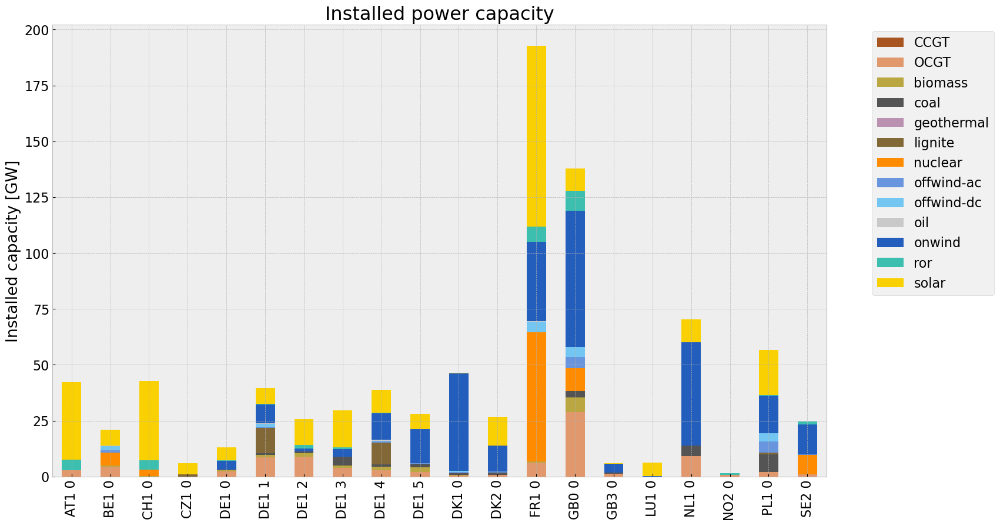

<Figure size 640x480 with 0 Axes>

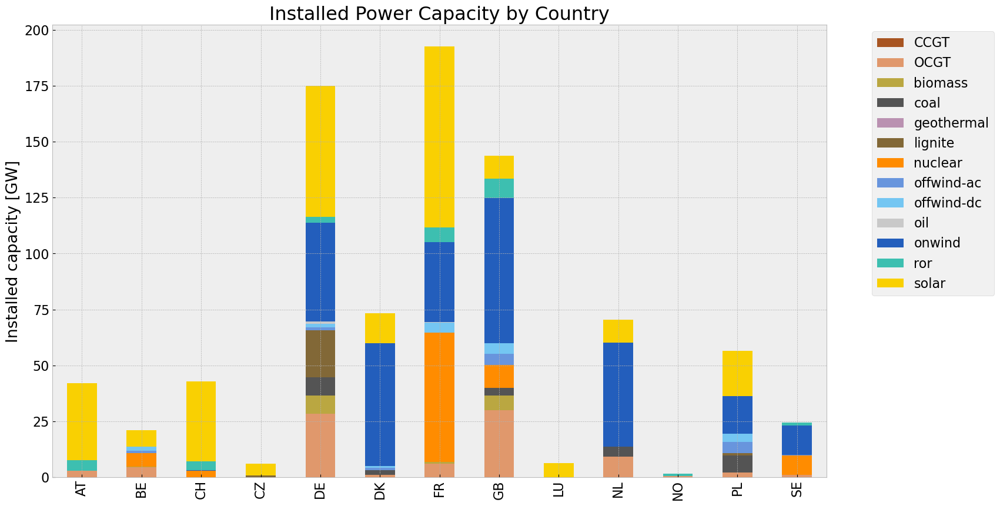

<Figure size 640x480 with 0 Axes>

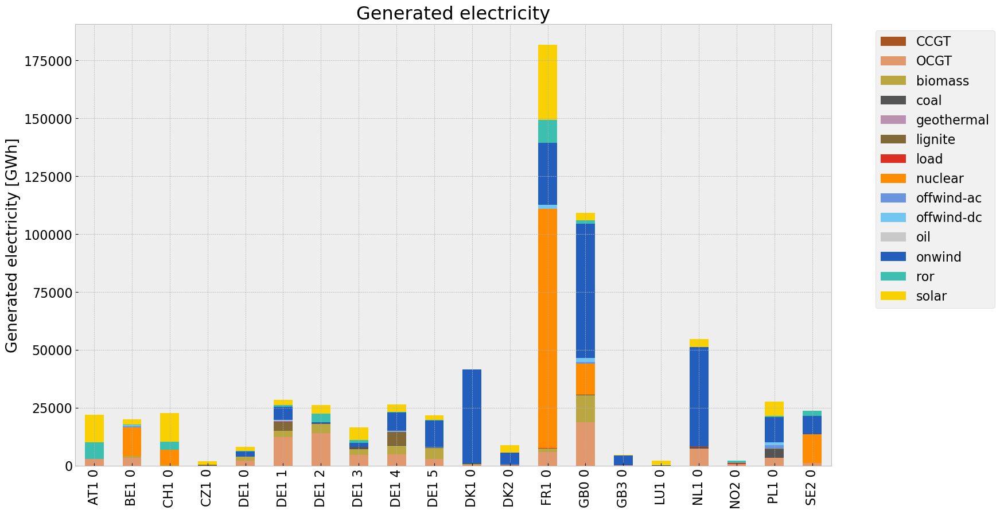

<Figure size 640x480 with 0 Axes>

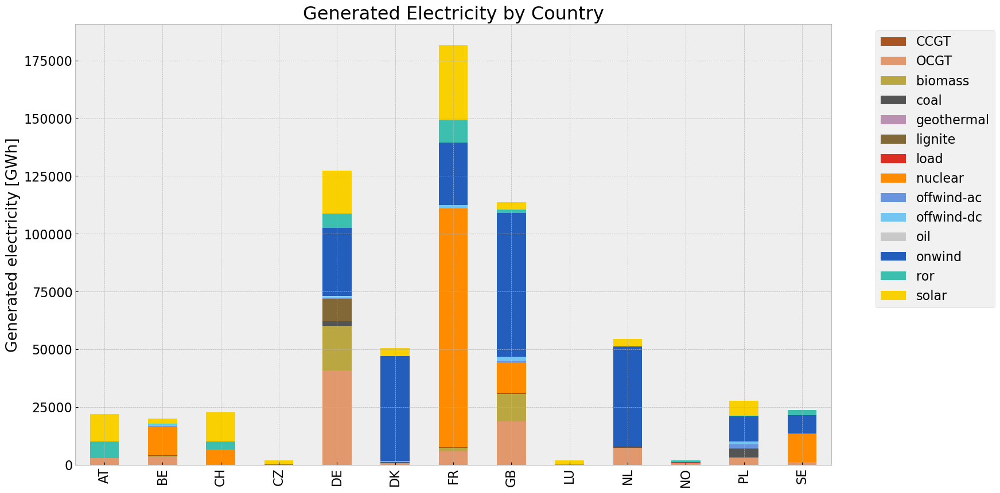

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3517265764.py:35: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3517265764.py:36: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).su

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,8.523079e+07,0.451621,0.1980,3.736696e+07
biomass,3.368043e+07,0.468000,0.0000,0.000000e+00
coal,7.566981e+06,0.329908,0.3361,7.709003e+06
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.006572e+07,0.337285,0.4069,1.214328e+07
load,1.025856e+06,1.000000,0.0000,0.000000e+00
nuclear,1.481607e+08,0.326600,0.0000,0.000000e+00
offwind-ac,3.493477e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


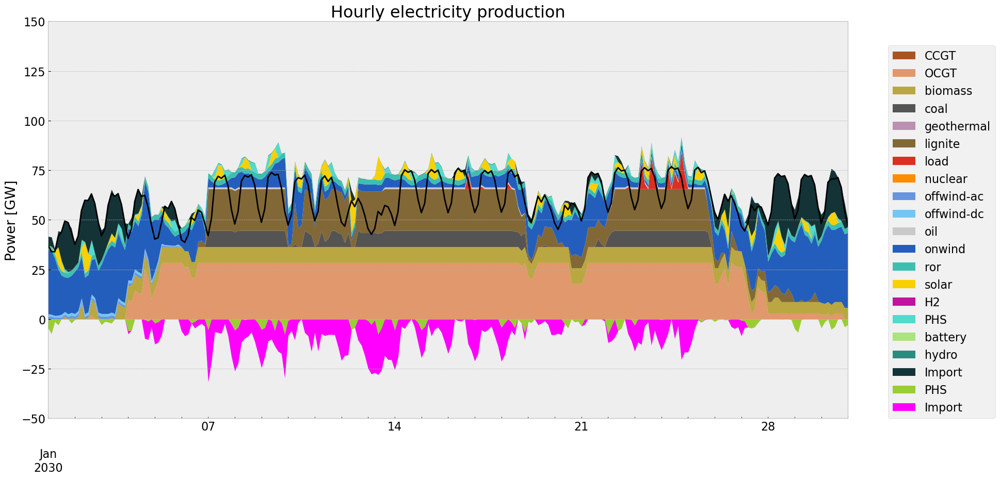

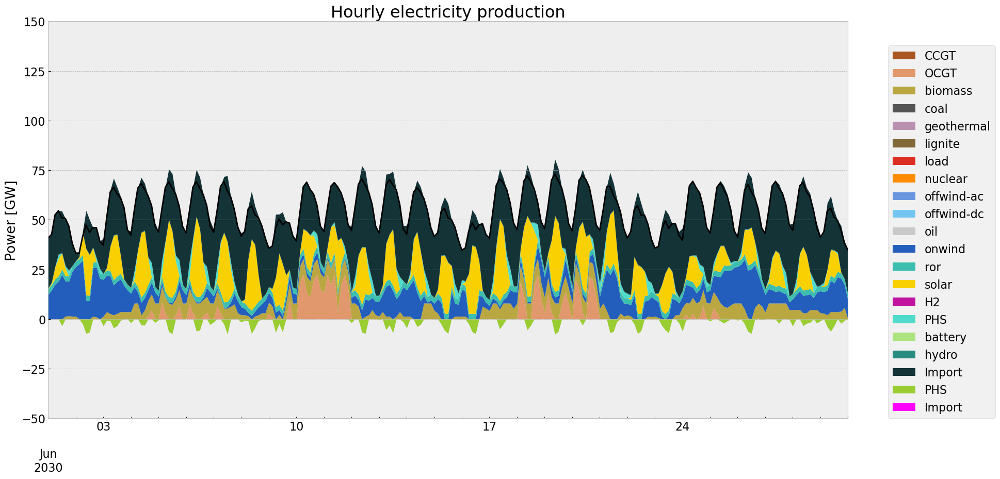

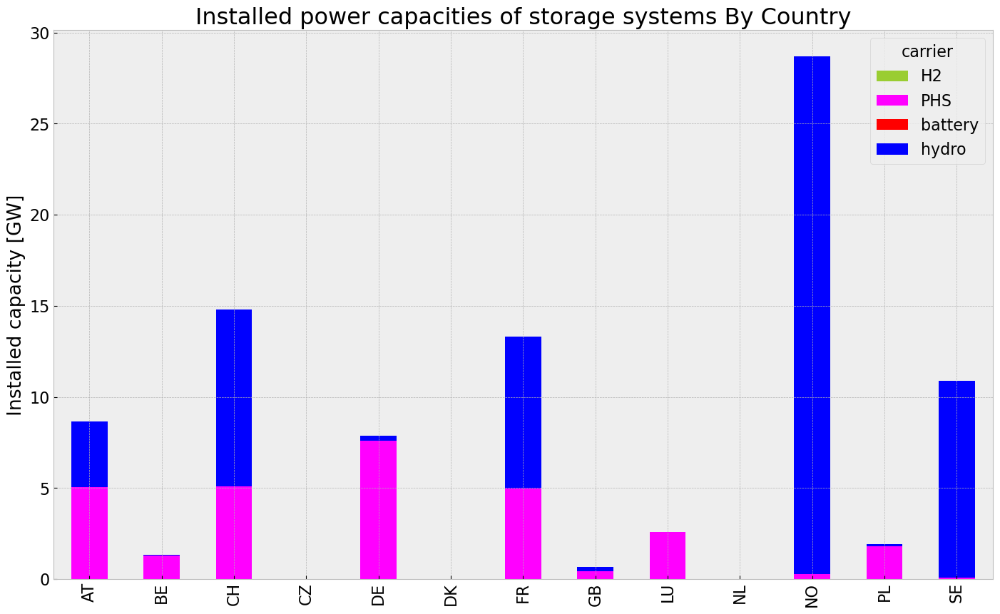

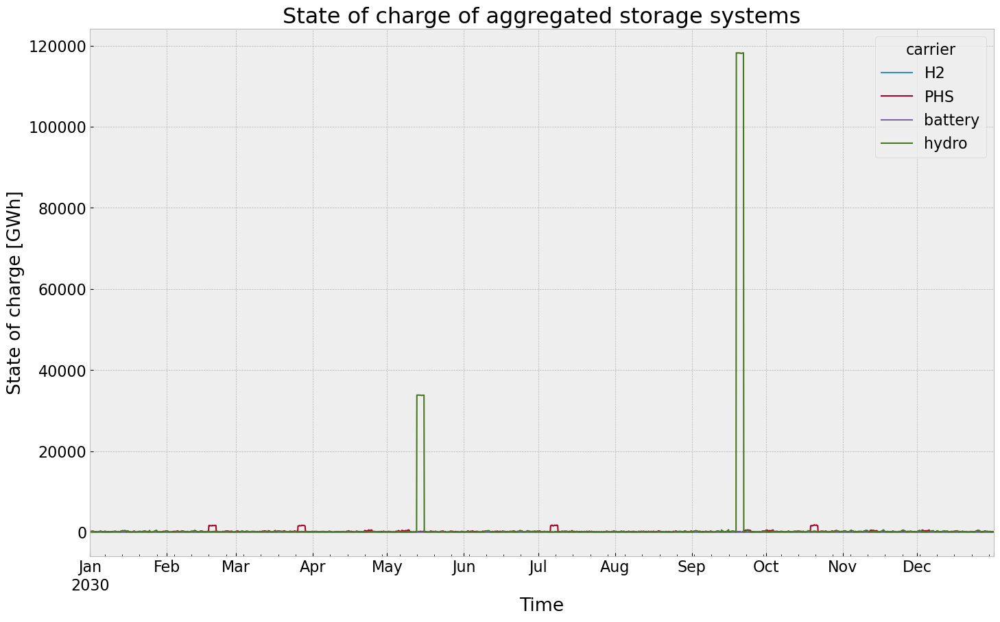

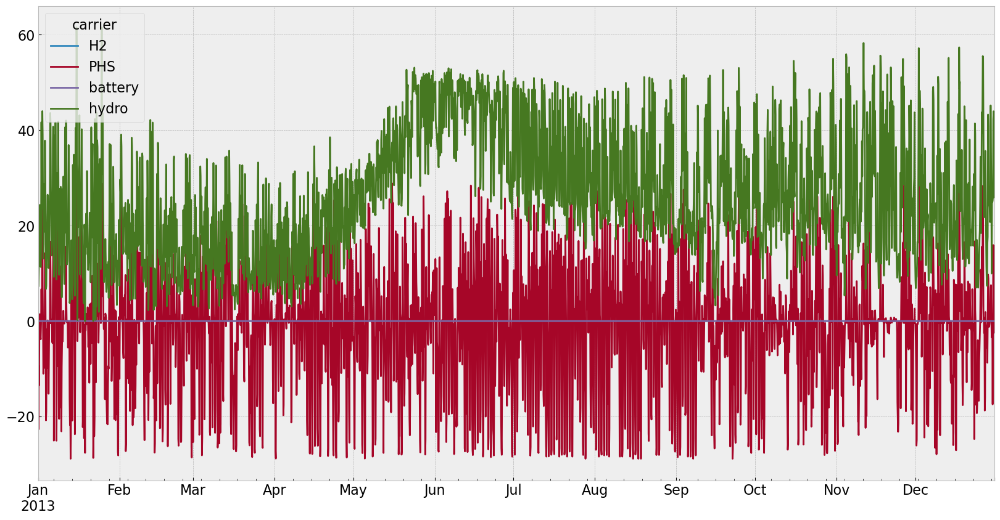

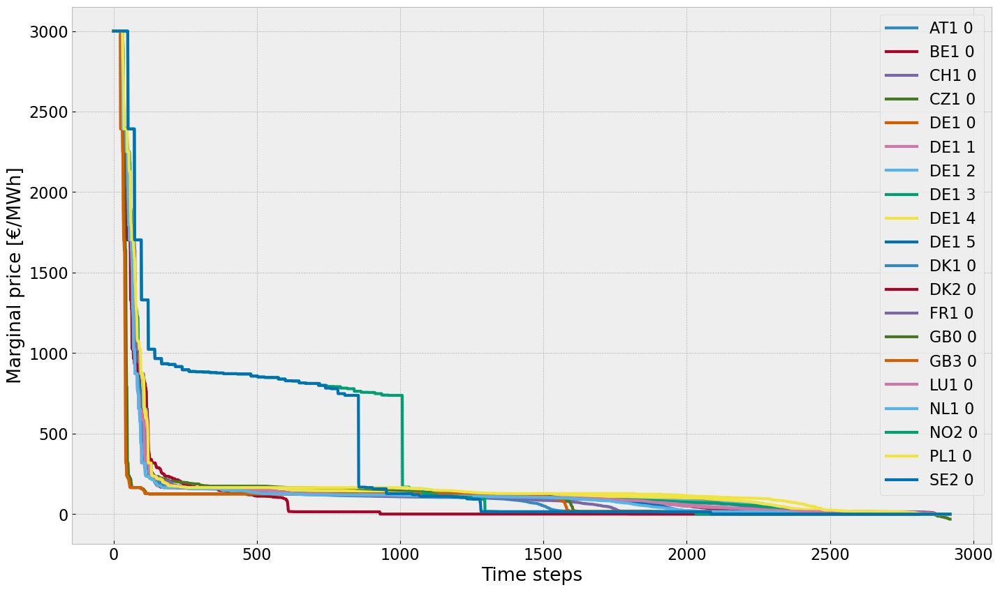

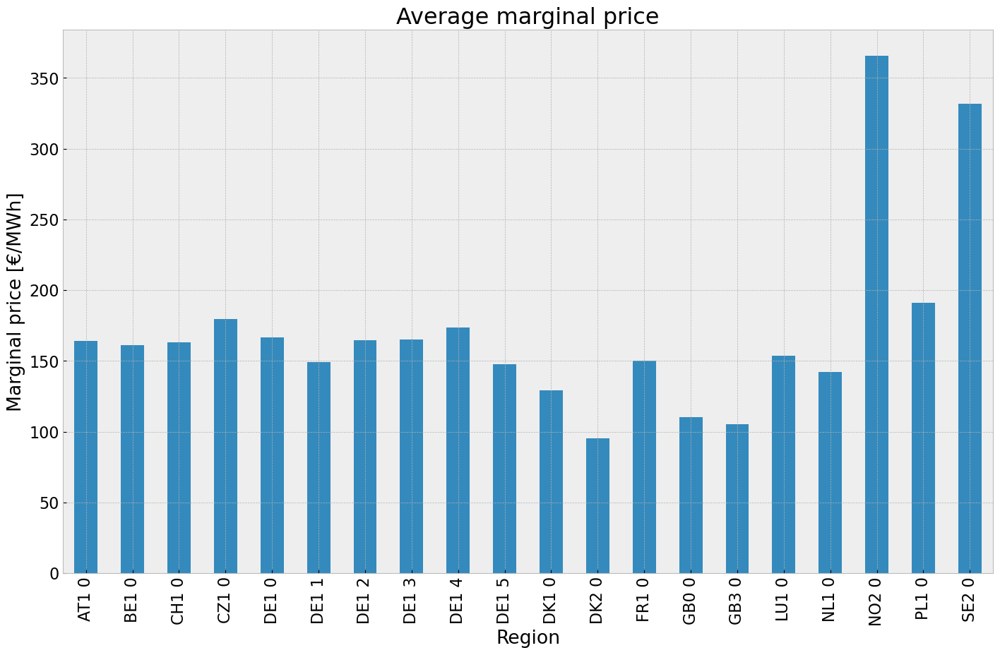

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


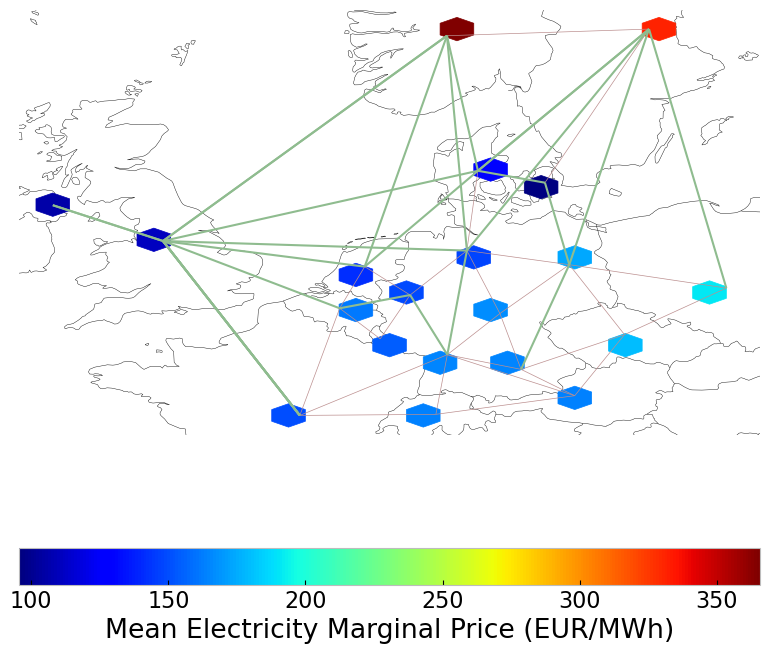

In [201]:
# Plotting
#installed cap
#capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv_roll.fillna(0, inplace=True)
#gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)
cap_noinv_roll_country = inst_cap_table_country(n3, color_cap)

#Generation table
# consolidated generation table
#carrier = n3.generators.carrier.unique()
#df_tot_generation = n3.generators_t.p.sum()

#generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
       # key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')
#generations.fillna(0, inplace=True)

#gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)
gen_noinv_roll_country = gen_power_table_country(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-01-01', '2030-01-31', colors_gen,'DE')
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen,'DE')

#installed storage unit & stores
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

In [202]:
e_balance = n3.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :]
#e_balance.head()
e_balance.to_csv('energy_balance_DE_offwind.csv', sep=',', index=True, header=True, encoding='utf-8')

# Scenario Analysis

## Installed Capacity

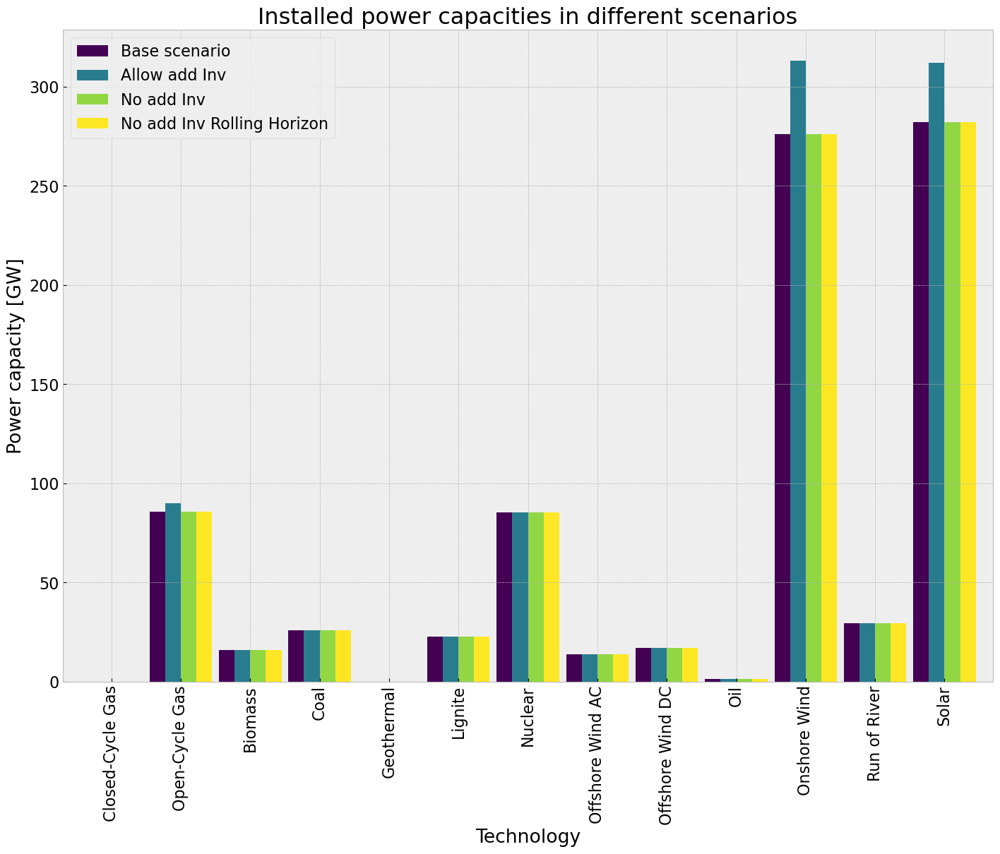

In [203]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [204]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,85.854585,90.117048,85.854585,85.854585
Biomass,15.977059,15.977059,15.977059,15.977059
Coal,25.968677,25.968677,25.968677,25.968677
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,22.848983,22.848983,22.848983,22.848983
Nuclear,85.354000,85.354000,85.354000,85.354000
Offshore Wind AC,13.835970,13.835970,13.835970,13.835970
Offshore Wind DC,16.947674,16.947674,16.947674,16.947674


## Power Generation

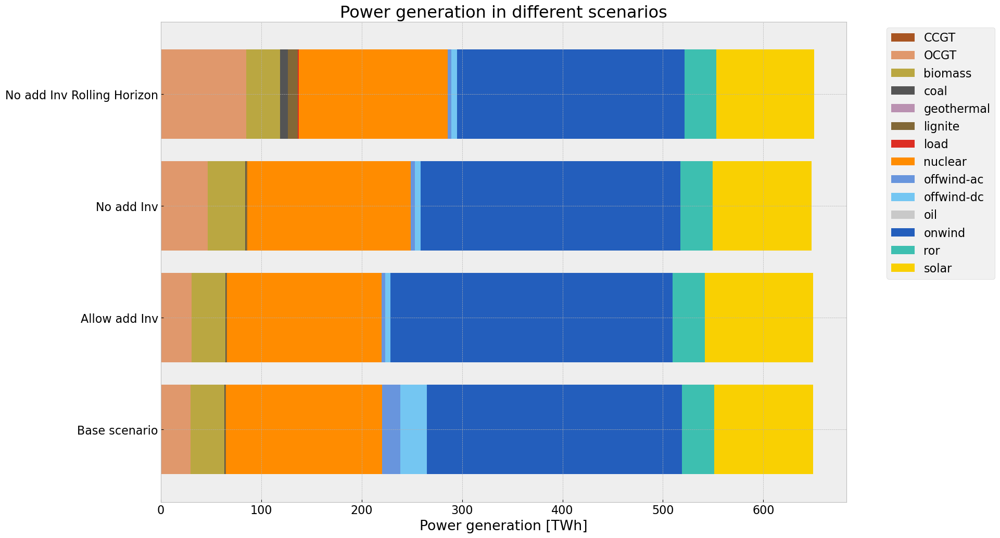

In [205]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [206]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

In [207]:
n.statistics()

Optimal Capacity  Installed Capacity  \
Generator   Combined-Cycle Gas        0.000000e+00        0.000000e+00   
            Load shedding             2.000000e+10        2.000000e+10   
            Offshore Wind (AC)        1.383597e+04        7.851725e+03   
            Offshore Wind (DC)        1.694767e+04        5.278275e+03   
            Onshore Wind              2.761090e+05        8.945518e+04   
            Open-Cycle Gas            8.585458e+04        8.030306e+04   
            Run of River              2.954988e+04        2.954988e+04   
            Solar                     2.820340e+05        6.752371e+04   
            biomass                   1.597706e+04        1.597706e+04   
            coal                      2.596868e+04        2.596868e+04   
            geothermal                0.000000e+00        0.000000e+00   
            lignite                   2.284898e+04        2.284898e+04   
            nuclear                   8.535400e+04        8.535400e+04   
            oil                       1.319848e+03        1.319848e+03   
Line        AC                        3.031259e+05        2.607928e+05   
Link        DC                        6.051387e+04        1.054100e+04   
Load        -                         0.000000e+00        0.000000e+00   
StorageUnit Battery Storage           0.000000e+00        0.000000e+00   
            Hydrogen Storage          0.000000e+00        0.000000e+00   
            Pumped Hydro Storage      2.922767e+04        2.922767e+04   
            Reservoir & Dam           6.152567e+04        6.152567e+04   

                                  Capacity Factor      Dispatch  Transmission  \
Generator   Combined-Cycle Gas                NaN  0.000000e+00  0.000000e+00   
            Load shedding            6.464639e-11  1.132605e+04  0.000000e+00   
            Offshore Wind (AC)       4.441556e-01  5.383304e+07  0.000000e+00   
            Offshore Wind (DC)       5.416446e-01  8.041344e+07  0.000000e+00   
            Onshore Wind             3.148312e-01  7.614869e+08  0.000000e+00   
            Open-Cycle Gas           1.176768e-01  8.850310e+07  0.000000e+00   
            Run of River             3.743046e-01  9.689134e+07  0.000000e+00   
            Solar                    1.194250e-01  2.950536e+08  0.000000e+00   
            biomass                  7.239577e-01  1.013244e+08  0.000000e+00   
            coal                     9.386069e-03  2.135196e+06  0.000000e+00   
            geothermal                        NaN  0.000000e+00  0.000000e+00   
            lignite                  1.380672e-02  2.763512e+06  0.000000e+00   
            nuclear                  6.235705e-01  4.662443e+08  0.000000e+00   
            oil                      6.849315e-04  7.919091e+03  0.000000e+00   
Line        AC                       3.406107e-01  0.000000e+00 -2.565674e+08   
Link        DC                       7.970930e-01  0.000000e+00 -2.891402e+07   
Load        -                                 NaN -2.169043e+09  0.000000e+00   
StorageUnit Battery Storage                   NaN  0.000000e+00  0.000000e+00   
            Hydrogen Storage                  NaN  0.000000e+00  0.000000e+00   
            Pumped Hydro Storage     4.446849e-01 -1.626495e+07  0.000000e+00   
            Reservoir & Dam          4.390644e-01  2.366403e+08  0.000000e+00   

                                    Withdrawal        Supply   Curtailment  \
Generator   Combined-Cycle Gas    0.000000e+00  0.000000e+00  0.000000e+00   
            Load shedding         0.000000e+00  1.132605e+04  0.000000e+00   
            Offshore Wind (AC)    0.000000e+00  5.383304e+07  6.396052e+06   
            Offshore Wind (DC)    0.000000e+00  8.041344e+07  1.142096e+06   
            Onshore Wind          0.000000e+00  7.614869e+08  3.265865e+07   
            Open-Cycle Gas        0.000000e+00  8.850310e+07  0.000000e+00   
            Run of River          0.000000e+00  9.689134e+07  3.778370e-05  

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


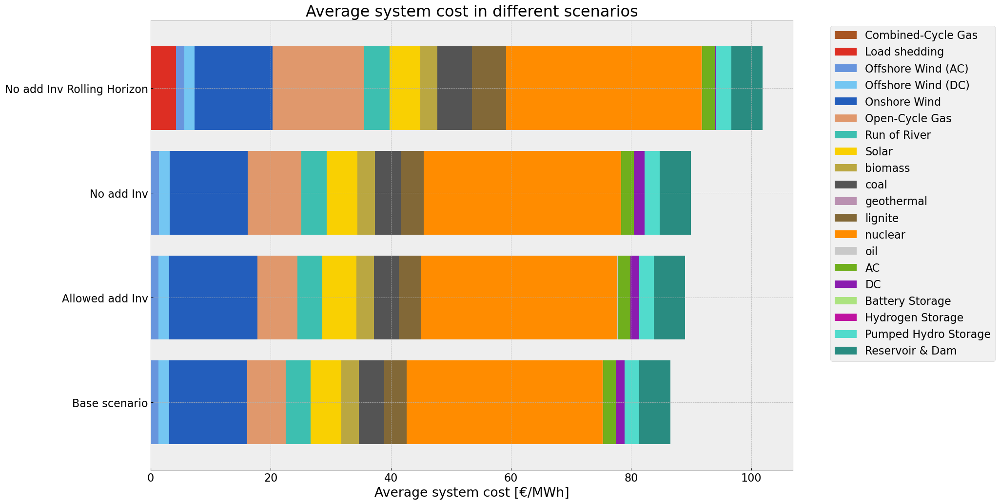

In [208]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [209]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [210]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


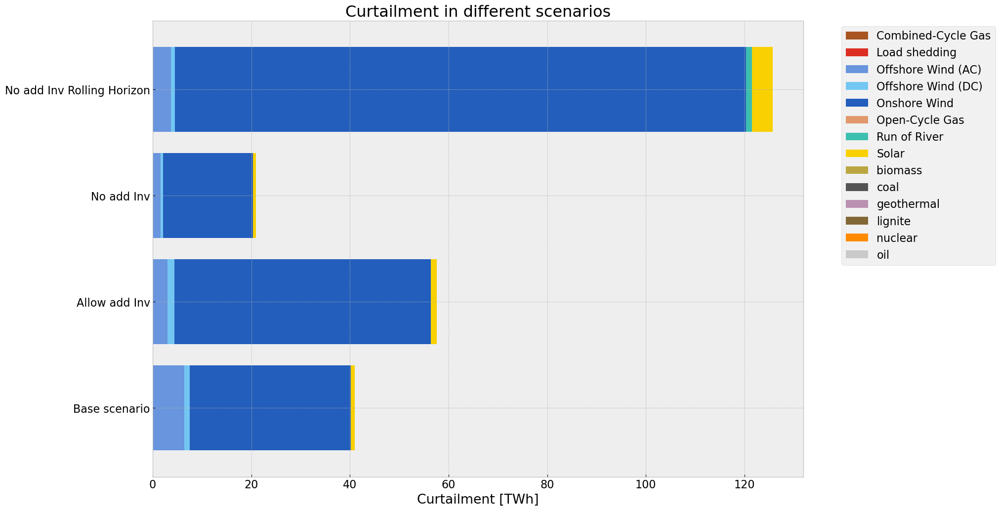

In [211]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_5620\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


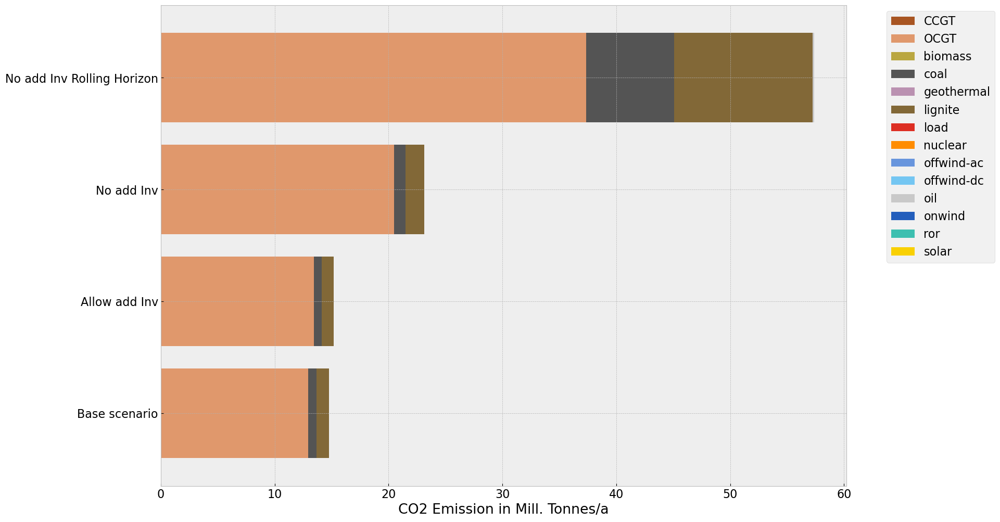

In [212]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()